# Fast Neural Style Transfer Based Parkinson's EMG

1 transformation network trained against 2 losses - one that criticize over style, another one over content

In [1]:
from __future__ import print_function, division

from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Lambda
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers import Input, Dense, Flatten, Activation, Dropout, LSTM, RepeatVector, TimeDistributed, ConvLSTM2D, GRU
from keras.layers import Add, Subtract, Average, Multiply, ReLU, ThresholdedReLU, Concatenate, GlobalAveragePooling1D, GlobalMaxPooling1D, GlobalAvgPool1D
from keras.layers.wrappers import Bidirectional
from keras.layers.convolutional import Conv1D, MaxPooling1D, UpSampling1D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import RMSprop, Adam
from keras.initializers import RandomUniform, RandomNormal, glorot_uniform

import keras.backend as K

import matplotlib.pyplot as plt

import sys
import datetime
import numpy as np
import pandas as pd

import pathlib
timestamp = datetime.datetime.now().strftime("%Y_%m_%d_%H_%M_%S")
count = 41
path = './dcgan_transformer_critic_resnet_1d/model_{0}'.format(count)
#path = './cnn_v9_generator_critic_wavelet_critic_resnet_1d/model_2019_08_21_08_28_10'
pathlib.Path(path).mkdir(parents=True, exist_ok=True) 
print(path)

Using TensorFlow backend.
C:\ProgramData\Anaconda3\envs\keras\lib\site-packages\tensorflow\python\framework\dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\ProgramData\Anaconda3\envs\keras\lib\site-packages\tensorflow\python\framework\dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\ProgramData\Anaconda3\envs\keras\lib\site-packages\tensorflow\python\framework\dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\ProgramData\Anaconda3\envs\keras\lib\site-pa

./dcgan_transformer_critic_resnet_1d/model_41


We define the DCGAN class.

In [2]:
class DCGAN():
    def __init__(self):
        #Define parameters for data loading
        self.data_filter = 1.0 #load only 20% of data        
        self.channels = 1 #Number of channels
        self.content_num_steps = 20000 # Number of time steps for content
        self.style_num_steps = 20000 # Number of time steps for style
        
        # Define parameters for discriminator
        self.activation_function = 'tanh'##''#'tanh'
        self.moving_avg_window = 100 # mvg avg for envelope shape
        self.style_weight = 4.0
        self.content_weight = 1.0
        self.fft_min_freq = 0
        self.fft_max_freq = 400
        
        # Define parameters for wavelet decomposition
        self.wavelet_mother = 'db7' 
        self.wavelet_levels = 2
        self.wavelet_trainable=False
        
        # Define parameters for generator (which generates a new content with the new style)    
        self.seq_shape = (self.content_num_steps, self.channels)
        self.sliding_window = 10
                
        # Define parameters for training
        self.batch_size = 5
        self.dropout_rate = 0.2  # Dropout rate
        self.learning_rate = 0.01  # Learning rate
        self.start_epoch = 0
        self.losses = None

        # Following parameter and optimizer set as recommended in paper
        self.optimizer = Adam(lr=self.learning_rate)
        #RMSprop(lr=self.learning_rate)
        #optimizer = 
        #Adam(lr=self.learning_rate)

        # Build the generator
        self.transformer = self.build_transformer()
        #self.load_generator()
        
        # Build de combined model (transformer => critic1 + critic2)

        # The generator takes content as input and generates a transformed signal
        content = Input(shape=self.seq_shape)
        gen_signal = self.transformer(content)
                
        style_input = Input(shape=(self.style_num_steps,self.channels))
        
        input_tensor = Concatenate(axis=0)([content,style_input,gen_signal])
        
        # Build and compile the critics (style and content)        
        self.content_feature_layers = 'flat_input'
        self.style_feature_layers = ['raw_conv_1','fft_conv_4','fft_env_conv_4','wavelet_conv_4']
        self.style_feature_weights = [1.0,1.0,1.0,1.0]
        self.load_critic(input_tensor)
        
        #self.loss_weights = [self.content_weight, self.style_weight / len(self.style_feature_layers)]
        self.metrics = []
                
        # The combined model outputs the style features from the transformed signal
        self.combined = self.style_critic
        self.combined.compile(loss=self.combined_loss, metrics=[self.content_loss_metric, self.style_loss_metric], optimizer=self.optimizer)

        #self.combined.summary()

Define the loss and metrics function

In [3]:
import tensorflow as tf
from sklearn.mixture import GaussianMixture 
from dtaidistance import dtw
from dtaidistance import dtw_visualisation as dtwvis
from scipy import signal
from scipy.spatial.distance import euclidean
from fastdtw import fastdtw
import numpy as np
import array

class DCGAN(DCGAN):
    
    def content_loss_metric(self,y_true, y_pred):
        return self.metrics[0]
    
    def style_loss_metric(self,y_true, y_pred):
        return self.metrics[1]
    
    def combined_loss(self, y_true, y_pred):
        loss = self.content_loss_value(y_true, y_pred) + self.style_loss_value(y_true, y_pred)
        return loss
    
    def content_loss_value(self, y_true, y_pred):
        #SUM content loss
        layer_features=self.critic_layers[self.content_feature_layers]
        content_features=layer_features[0:self.batch_size,:]
        gen_signal_features=layer_features[2 * self.batch_size:,:]
        #loss = self.content_weight * fft_loss_value(content_features,gen_signal_features)
        #loss= self.content_weight * self.content_loss(content_features,gen_signal_features)
        loss= self.content_weight * self.emg_dynamic_loss(content_features,gen_signal_features)
        
        #Include mean value loss to avoid data shift
        #content_mean = K.mean(content_features)
        #gen_signal_mean = K.mean(gen_signal_features)
        #loss+= content_mean - gen_signal_mean
        
        self.metrics.append(loss)
        print('Adding content loss to self.metrics')
        return loss
    
    def fft_loss_value(self, y_true, y_pred):
        fft_true = K.abs(tf.spectral.rfft(y_true))
        fft_pred = K.abs(tf.spectral.rfft(y_pred))
        loss = K.mean(K.square(fft_true - fft_pred)) #calculate mse from fft
        return loss
    
    def style_loss_value(self, y_true, y_pred):
        #SUM style loss for all features
        loss = K.variable(value=0.0)
        for i in range(len(self.style_feature_layers)):
            layer_name = self.style_feature_layers[i]
            layer_weight = self.style_feature_weights[i]
            layer_features=self.critic_layers[layer_name]
            style_features=layer_features[self.batch_size:2 * self.batch_size,:,:]
            gen_signal_features = layer_features[2 * self.batch_size:,:,:]
            sl=self.style_loss(style_features,gen_signal_features)
            loss+= layer_weight * sl
        loss = (self.style_weight * loss) / len(self.style_feature_layers)
        #######fft loss ########
        #layer_features=self.critic_layers['fft_abs']
        #style_features=layer_features[self.batch_size:2 * self.batch_size,:]
        #gen_signal_features=layer_features[2 * self.batch_size:,:]
        #loss = self.content_weight * self.fft_loss_value(style_features,gen_signal_features)
        #diff = K.square(style_features - gen_signal_features)
        #loss += self.style_weight * K.mean(diff[:,self.fft_min_freq:self.fft_max_freq])
        ######## MSE loss #######
        #layer_features=self.critic_layers[self.content_feature_layers]
        #style_features=layer_features[self.batch_size:2 * self.batch_size,:]
        #gen_signal_features=layer_features[2 * self.batch_size:,:]
        #loss += self.style_weight * self.emg_static_loss(style_features,gen_signal_features)
        ######## DIFF MSE loss #######
        #layer_features=self.critic_layers['flat_input']
        #style_features=layer_features[self.batch_size:2 * self.batch_size,:]
        #gen_signal_features=layer_features[2 * self.batch_size:,:]
        #style_diff = style_features[:,1:]-style_features[:,:-1]
        #combination_diff = gen_signal_features[:,1:]-gen_signal_features[:,:-1]
        #loss += self.style_weight * self.style_loss(style_diff, combination_diff)
        #style_features=layer_features[self.batch_size:2 * self.batch_size,:]
        #gen_signal_features=layer_features[2 * self.batch_size:,:]
        #loss += self.style_weight * self.emg_static_loss(style_features,gen_signal_features)
        self.metrics.append(loss)
        print('Adding style loss to self.metrics')
        return loss
                
    def content_loss(self, content, combination):
        return K.mean(K.square(content-combination))
    
    #Split the signal into "static" part and "dynamic" part
    def emg_sliding_mask(self, tensor):
        sliding_window = tf.contrib.signal.frame(
            input_,
            self.sliding_window,
            1,#steps
            pad_end=True,
            pad_value=0,
            axis=1,
            name='envelope_moving_average'
        )
        print('Sliding Window: ' + str(sliding_window))
        sliding_reshaped = K.reshape(sliding_window,(-1,self.num_steps,self.sliding_window))
    
    def emg_mask(self, tensor, delta, operation):
        
        if operation == 'greater':
            mask = tf.greater(tensor, delta) # boolean tensor, mask[i] = True iff x[i] > 1
        elif operation == 'greater_equal':
            mask = tf.math.greater_equal(tensor, delta)
        elif operation == 'less':
            mask = tf.math.less(tensor, delta)
        elif operation == 'less_equal':
            mask = tf.math.less_equal(tensor, delta)
        elif operation == 'equal':
            mask = tf.math.equal(tensor, delta)
            
        masked_tensor = tf.boolean_mask(tensor, mask)
        return masked_tensor
    
    def feature_wamp(series, window, step, threshold):
        windows_strided, indexes = biolab_utilities.moving_window_stride(series.values, window, step)
        return pd.Series(data=np.sum(np.diff(windows_strided) >= threshold, axis=1), index=series.index[indexes])

    def feature_wl(series, window, step):
        windows_strided, indexes = biolab_utilities.moving_window_stride(series.values, window, step)
        return pd.Series(data=np.sum(np.diff(windows_strided), axis=1), index=series.index[indexes])
            
    def emg_dynamic_loss(self, y_true, y_pred):
        m_factor = tf.constant(20.0)
        delta = tf.constant(0.05)
        abs_tensor = K.abs(y_true)
        diff_abs = K.abs(y_true - y_pred)
        mask = tf.math.greater_equal(abs_tensor, delta) # boolean tensor, mask[i] = True iff x[i] > 1
        bigger = tf.boolean_mask(diff_abs, mask)
        m = tf.multiply(bigger, m_factor)
        loss1 = K.mean(m) # mean amplified loss for "moving" part of signal
        #loss2 = K.mean(K.square(abs_tensor)) #mse loss for "stationary" part of signal
        loss = loss1 #+ loss2 #adds penalty for not seeking higher values
        return loss
    
    def emg_static_loss(self, y_true, y_pred):
        m_factor = tf.constant(20.0)
        delta = tf.constant(0.05)
        abs_tensor = K.abs(y_true)
        diff_abs = K.abs(y_true - y_pred)
        mask = tf.math.less_equal(abs_tensor, delta) # boolean tensor, mask[i] = True iff x[i] > 1
        bigger = tf.boolean_mask(diff_abs, mask)
        m = tf.multiply(bigger, m_factor)
        loss1 = K.mean(m) # mean amplified loss for "moving" part of signal
        #loss2 = K.mean(K.square(abs_tensor)) #mse loss for "stationary" part of signal
        loss = loss1 #+ loss2 #adds penalty for not seeking higher values
        return loss
    
    def wasserstein_loss(self, y_true, y_pred):
        return K.mean(y_true * y_pred)
    
    def style_loss(self, style, combination):
        S=self.gram_matrix(style)
        C=self.gram_matrix(combination)
        st=K.sum(K.square(S - C)) / (4. * (self.channels ** 2) * (self.style_num_steps ** 2))
        #st=K.mean(K.square(C-S))
        return st
    
    def gram_matrix(self,x):
        features=K.batch_flatten(x)
        gram=K.dot(features, K.transpose(features))
        return gram
    
    def mixture_cross_entropy(self,y_true, y_pred):
        mixture_p = tf.contrib.distributions.Normal(self.mu, self.sigma).prob(tf.reshape(self.y_holder,(-1,1)))
        mixture_p = tf.multiply(self.pi, mixture_p)
        output_p = tf.reduce_sum(mixture_p, reduction_indices=1, keep_dims=True)
        log_output_p = tf.log(output_p)
        mean_log_output_p = tf.reduce_mean(log_output_p)
        self.loss = -mean_log_output_p   
        self.train_op = self.optimizer.minimize(self.loss)       
    
    def diff_loss(self, content, combination):
        content_diff = content[:,1:]-content[:,:-1]
        combination_diff = combination[:,1:]-combination[:,:-1]
        dl = K.mean(K.square(content_diff - combination_diff))
        return dl

Define data loading and sampling function

In [4]:
from sklearn.preprocessing import MinMaxScaler

class DCGAN(DCGAN):
    def load_style(self):
        # Load data
        train_file_01 = "./data/pdluis1_emg.csv"
        train_file_02 = "./data/pdmaria2_emg.csv"
        train_file_03 = "./data/pdmaria1_emg.csv"

        #Loading EMG Signals - using only 1 signal for encoder-decoder approach
        x_series = ["FLEXOR_EMG_FILTERED"]

        X_1 = self.load_timeseries(train_file_03, x_series)

        X = pd.concat([X_1], axis=1)

        #Normalize data before hand
        X_values = X.values
        X_normalized, scalers = self.min_max(X_values,-1.0,1.0)
        X_normalized_mean = X_normalized.mean(axis=0, keepdims=True)
        X_normalized = np.subtract(X_normalized,X_normalized_mean)
        #x values based on all variables
        data = X_normalized[0:self.style_num_steps]
        #data_shape = int(math.sqrt(configuration['num_steps']))
        #data = np.reshape(data,(data_shape,data_shape,configuration['channels']))

        print('Loaded data shape: ' + str(data.shape))
        return data

    def load_content(self):
        # Load data
        train_file_01 = "./data/s01_stimulus_1.csv"
        train_file_02 = "./data/s01_stimulus_2.csv"
        train_file_03 = "./data/s01_stimulus_3.csv"

        #Loading EMG Signals - using only 1 signal for encoder-decoder approach
        x_series = ["EMG_03"]

        X_1 = self.load_timeseries(train_file_03, x_series)

        X = pd.concat([X_1], axis=1)

        #Normalize data before hand
        X_values = X.values
        X_normalized, scalers = self.min_max(X_values,-1.0,1.0)        
        X_normalized_mean = X_normalized.mean(axis=0, keepdims=True)
        X_normalized = np.subtract(X_normalized,X_normalized_mean)
        #x values based on all variables
        #data = X_normalized[0:self.content_num_steps]
        data = X_normalized
        #data_shape = int(math.sqrt(configuration['num_steps']))
        #data = np.reshape(data,(data_shape,data_shape,configuration['channels']))

        print('Loaded data shape: ' + str(data.shape))
        return data

    def load_timeseries(self, filename, series):
        #Load time series dataset
        loaded_series = pd.read_csv(filename, sep=',', header=0, index_col=0, squeeze=True)

        #Applying filter on the selected series
        selected_series = loaded_series.filter(items=series)

        return selected_series

    def min_max(self, data, min, max):
        """Normalize data"""
        scaler = MinMaxScaler(feature_range=(min, max),copy=True)
        scaler.fit(data)
        norm_value = scaler.transform(data)
        return [norm_value, scaler]

    def get_windows(self, data, window_size):
        # Split data into windows
        raw = []
        for index in range(len(data) - window_size):
            raw.append(data[index: index + window_size])
        return raw

    def normalize(self, data):
        """Normalize data"""
        scaler = MinMaxScaler(feature_range=(0, 1),copy=True)
        scaler.fit(data)
        norm_value = scaler.transform(data)
        return [norm_value, scaler]

    def moving_average(a, n=3) :
        ret = np.cumsum(a, dtype=float)
        ret[n:] = ret[n:] - ret[:-n]
        return ret[n - 1:] / n

Now we define the generator.
First, the ResNet building blocks:

In [5]:
from keras.layers import Layer, add, Activation, BatchNormalization, LeakyReLU, Conv2DTranspose, Conv1D
from keras.layers import ZeroPadding1D, UpSampling1D, Cropping1D
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import tensorflow as tf

class ReflectionPadding1D(ZeroPadding1D):
    """ Reimplements Keras' zero-padding layer, adding reflection."""

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def call(self, inputs):
        padx = self.padding
        return tf.pad(inputs, ((0, 0), padx[0], (0, 0)), "REFLECT")
    
       
class InputNormalize(Layer):
    def __init__(self, **kwargs):
        super(InputNormalize, self).__init__(**kwargs)

    def build(self, input_shape):
        pass

    def compute_output_shape(self,input_shape):
        return input_shape

    def call(self, x, mask=None):
        return K.l2_normalize(x, axis=1)
    
class EMGNormalize(Layer):
    def __init__(self, **kwargs):
        super(EMGNormalize, self).__init__(**kwargs)

    def build(self, input_shape):
        pass

    def compute_output_shape(self,input_shape):
        return input_shape

    def call(self, x, mask=None):
        min = -1.0
        max = 1.0
        X_std = (x - K.min(x,axis=1)) / (K.max(x,axis=1) - K.min(x,axis=1))
        X_scaled = X_std * (max - min) + min
        X_scaled = X_scaled - K.mean(X_scaled)
        return X_scaled

def conv_bn_relu(nb_filter, nb_steps, stride):   
    def conv_func(x):
        x = Conv1D(nb_filter, (nb_steps), strides=stride, padding='same')(x)
        x = BatchNormalization()(x)
        #x = LeakyReLU(0.2)(x)
        x = Activation("relu")(x)
        return x
    return conv_func

#https://keunwoochoi.wordpress.com/2016/03/09/residual-networks-implementation-on-keras/
def res_conv(nb_filter, nb_steps, stride=(1)):
    def _res_func(x):
        a = Conv1D(nb_filter, (nb_steps), strides=stride, padding='same')(x)
        a = BatchNormalization()(a)
        a = LeakyReLU(0.2)(a)
        #a = Activation("relu")(a)
        a = Conv1D(nb_filter, (nb_steps), strides=stride, padding='same')(a)
        y = BatchNormalization()(a)

        return  add([x, y])

    return _res_func


def dconv_bn_nolinear(nb_filter, nb_steps, stride=(2),activation="relu"):
    def _dconv_bn(x):
        #TODO: Deconvolution2D
        #x = Deconvolution2D(nb_filter,nb_row, nb_col, output_shape=output_shape, subsample=stride, border_mode='same')(x)
        #x = UpSampling2D(size=stride)(x)
        x = UpSampling1D(size=stride)(x)
        #x = ReflectionPadding1D(padding=stride)(x)
        x = Conv1D(nb_filter, nb_steps, padding='same')(x)
        x = BatchNormalization()(x)
        x = Activation(activation)(x)
        return x
    return _dconv_bn

In [6]:
from keras.utils import plot_model
class DCGAN(DCGAN):
    
    def moving_avg(self, args):
        """Reparameterization trick by sampling fr an isotropic unit Gaussian.

        # Arguments
            args (tensor): mean and log of variance of Q(z|X)

        # Returns
            z (tensor): sampled latent vector
        """
        input_ = args
        sliding_window = tf.contrib.signal.frame(
            input_,
            self.sliding_window,
            1,#steps
            pad_end=True,
            pad_value=0,
            axis=1,
            name='envelope_moving_average'
        )
        print('Sliding Window: ' + str(sliding_window))
        sliding_reshaped = K.reshape(sliding_window,(-1,self.content_num_steps,self.sliding_window))
        print('Sliding Reshaped: ' + str(sliding_reshaped))
        mvg_avg = K.mean(sliding_reshaped, axis=2, keepdims=True)
        print('Moving Avg: ' + str(mvg_avg))
        return mvg_avg
    
    def sub_avg(self, args):
        input_ = args
        mean = K.mean(input_, axis=1, keepdims=True)
        return input_ - mean
    
    def diff_op(self, args):
        a = args
        diff_tensor = a[:,1:]-a[:,:-1]
        return diff_tensor
    
    def build_transformer(self):
        x = Input(shape=self.seq_shape)
        
        #ResNet part
        a = conv_bn_relu(32, 4, stride=(1))(x)
        a = conv_bn_relu(64, 4, stride=(2))(a)
        b = conv_bn_relu(128, 4, stride=(2))(a)
        for i in range(5):
            b = res_conv(128,4)(b)
        c = Dense(128,activation="relu")(b)
        b = Add()([b,c])
        b = dconv_bn_nolinear(128,4,stride=(2),activation="relu")(b)
        b = dconv_bn_nolinear(64,4,stride=(2),activation="relu")(b)
        b = dconv_bn_nolinear(32,4,stride=(1),activation="relu")(b)
        y = dconv_bn_nolinear(1,4,stride=(1),activation="tanh")(b)
        y = Lambda(self.sub_avg, output_shape=self.seq_shape, name='sub_avg')(y)
        
        #y = Lambda(self.moving_avg, output_shape=self.seq_shape, name='mvg_avg')(y) #including moving average at the end

        print('Transformer model:')
        model = Model(inputs=x, outputs=y, name='transformer_model')
        
        model.summary()
        model_json = model.to_json()
        with open(path + '/transformer.json', "w") as json_file:
            json_file.write(model_json)
        file_name = path + '/transformer.png'
        plot_model(model, to_file=file_name, show_shapes = True)        
#
        return model
    
    def save_transformer(self, index=-1):
        if index == -1:
            file_path = path + '/transformer.h5'
        else:
            file_path = path + '/transformer_' + str(index) + '.h5'
        self.transformer.save_weights(file_path)
    
    def load_transformer(self, index=-1):
        if index == -1:
            file_path = path + '/transformer.h5'
        else:
            file_path = path + '/transformer_' + str(index) + '.h5'
        self.transformer = self.build_transformer()
        self.transformer.load_weights(file_path)
        
    def save_combined(self, index=-1):
        if index == -1:
            file_path = path + '/combined.h5'
        else:
            file_path = path + '/combined_' + str(index) + '.h5'
        self.combined.save_weights(file_path)
    
    def load_combined(self, index=-1):
        if index == -1:
            file_path = path + '/combined.h5'
        else:
            file_path = path + '/combined_' + str(index) + '.h5'
        self.combined.load_weights(file_path)
        

Now we define the critic

Mini batch discrimination

In [7]:
from keras import backend as K
from keras.engine import InputSpec, Layer
from keras import initializers, regularizers, constraints

# From a PR that is not pulled into Keras
# https://github.com/fchollet/keras/pull/3677
# I updated the code to work on Keras 2.x

class MinibatchDiscrimination(Layer):
    """Concatenates to each sample information about how different the input
    features for that sample are from features of other samples in the same
    minibatch, as described in Salimans et. al. (2016). Useful for preventing
    GANs from collapsing to a single output. When using this layer, generated
    samples and reference samples should be in separate batches.

    # Example

    ```python
        # apply a convolution 1d of length 3 to a sequence with 10 timesteps,
        # with 64 output filters
        model = Sequential()
        model.add(Convolution1D(64, 3, border_mode='same', input_shape=(10, 32)))
        # now model.output_shape == (None, 10, 64)

        # flatten the output so it can be fed into a minibatch discrimination layer
        model.add(Flatten())
        # now model.output_shape == (None, 640)

        # add the minibatch discrimination layer
        model.add(MinibatchDiscrimination(5, 3))
        # now model.output_shape = (None, 645)
    ```

    # Arguments
        nb_kernels: Number of discrimination kernels to use
            (dimensionality concatenated to output).
        kernel_dim: The dimensionality of the space where closeness of samples
            is calculated.
        init: name of initialization function for the weights of the layer
            (see [initializations](../initializations.md)),
            or alternatively, Theano function to use for weights initialization.
            This parameter is only relevant if you don't pass a `weights` argument.
        weights: list of numpy arrays to set as initial weights.
        W_regularizer: instance of [WeightRegularizer](../regularizers.md)
            (eg. L1 or L2 regularization), applied to the main weights matrix.
        activity_regularizer: instance of [ActivityRegularizer](../regularizers.md),
            applied to the network output.
        W_constraint: instance of the [constraints](../constraints.md) module
            (eg. maxnorm, nonneg), applied to the main weights matrix.
        input_dim: Number of channels/dimensions in the input.
            Either this argument or the keyword argument `input_shape`must be
            provided when using this layer as the first layer in a model.

    # Input shape
        2D tensor with shape: `(samples, input_dim)`.

    # Output shape
        2D tensor with shape: `(samples, input_dim + nb_kernels)`.

    # References
        - [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498)
    """

    def __init__(self, nb_kernels, kernel_dim, init='glorot_uniform', weights=None,
                 W_regularizer=None, activity_regularizer=None,
                 W_constraint=None, input_dim=None, **kwargs):
        self.init = initializers.get(init)
        self.nb_kernels = nb_kernels
        self.kernel_dim = kernel_dim
        self.input_dim = input_dim

        self.W_regularizer = regularizers.get(W_regularizer)
        self.activity_regularizer = regularizers.get(activity_regularizer)

        self.W_constraint = constraints.get(W_constraint)

        self.initial_weights = weights
        self.input_spec = [InputSpec(ndim=2)]

        if self.input_dim:
            kwargs['input_shape'] = (self.input_dim,)
        super(MinibatchDiscrimination, self).__init__(**kwargs)

    def build(self, input_shape):
        assert len(input_shape) == 2

        input_dim = input_shape[1]
        self.input_spec = [InputSpec(dtype=K.floatx(),
                                     shape=(None, input_dim))]

        self.W = self.add_weight(shape=(self.nb_kernels, input_dim, self.kernel_dim),
            initializer=self.init,
            name='kernel',
            regularizer=self.W_regularizer,
            trainable=False,
            constraint=self.W_constraint)

        # Set built to true.
        super(MinibatchDiscrimination, self).build(input_shape)

    def call(self, x, mask=None):
        activation = K.reshape(K.dot(x, self.W), (-1, self.nb_kernels, self.kernel_dim))
        diffs = K.expand_dims(activation, 3) - K.expand_dims(K.permute_dimensions(activation, [1, 2, 0]), 0)
        abs_diffs = K.sum(K.abs(diffs), axis=2)
        minibatch_features = K.sum(K.exp(-abs_diffs), axis=2)
        return K.concatenate([x, minibatch_features], 1)

    def compute_output_shape(self, input_shape):
        assert input_shape and len(input_shape) == 2
        return input_shape[0], input_shape[1]+self.nb_kernels

    def get_config(self):
        config = {'nb_kernels': self.nb_kernels,
                  'kernel_dim': self.kernel_dim,
                  'init': self.init.__name__,
                  'W_regularizer': self.W_regularizer.get_config() if self.W_regularizer else None,
                  'activity_regularizer': self.activity_regularizer.get_config() if self.activity_regularizer else None,
                  'W_constraint': self.W_constraint.get_config() if self.W_constraint else None,
                  'input_dim': self.input_dim}
        base_config = super(MinibatchDiscrimination, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

In [8]:
import pywt
from keras.engine.topology import get_source_inputs
from keras.initializers import Constant

#Alternative critic based on wavelet
class DCGAN(DCGAN):
        
    def make_wavelet_expansion(self, input_tensor):
        low_pass, high_pass  = pywt.Wavelet(self.wavelet_mother).filter_bank[:2]
        low_pass_filter = np.array(low_pass)
        high_pass_filter = np.array(high_pass)
        n_levels = self.wavelet_levels
        trainable=self.wavelet_trainable
        
        wv_kwargs = {
            "filters":1,
            "kernel_size":len(low_pass),
            "strides":2,     
            "use_bias":False, 
            "padding":"same", 
            "trainable":trainable,
        }

        approximation_coefficients = []
        detail_coefficients = []

        last_approximant = input_tensor
        for i in range(n_levels):
            lpf = low_pass_filter
            hpf = high_pass_filter
            a_n = Conv1D(
                kernel_initializer=Constant(lpf.reshape((-1, 1))),
                name="low_pass_{}".format(i),
                **wv_kwargs
            )(last_approximant)
            d_n = Conv1D(
                kernel_initializer=Constant(hpf.reshape((-1, 1))),
                name="high_pass_{}".format(i),
                **wv_kwargs,
            )(last_approximant)

            detail_coefficients.append(d_n)
            approximation_coefficients.append(a_n)
            last_approximant = a_n

        return approximation_coefficients, detail_coefficients
    
    def envelopes(self, args):
        """Reparameterization trick by sampling fr an isotropic unit Gaussian.

        # Arguments
            args (tensor): mean and log of variance of Q(z|X)

        # Returns
            z (tensor): sampled latent vector
        """
        input_ = args
        abs_envelope = K.abs(input_)
        envelope = tf.contrib.signal.frame(
            input_,
            self.moving_avg_window,
            1,#steps
            pad_end=True,
            pad_value=0,
            axis=1,
            name='envelope_moving_average'
        )
        envelope_reshaped = K.reshape(envelope,(-1,self.style_num_steps,self.moving_avg_window))
        print('Envelope: ' + str(envelope))
        print('Envelope_reshaped: ' + str(envelope_reshaped))
        envelope_mean = K.mean(envelope_reshaped, axis=2, keepdims=True)
        print('Envelope Mean: ' + str(envelope_mean))
        return envelope_mean
    
    def build_critic(self, input_tensor, load_model=False):
        
        if load_model:
            shape_ = (2000,1)
            input_ = Input(shape=shape_)
        else:
            shape_ = self.seq_shape
            if not K.is_keras_tensor(input_tensor):
                input_ = Input(tensor=input_tensor, shape=shape_)
            else:
                input_ = input_tensor
        
        #CNN on raw signal
        cnn_1 = Conv1D(16, kernel_size=3, strides=2, input_shape=shape_, padding="same", name='raw_conv_1')(input_)
        cnn_1 = LeakyReLU(alpha=0.2)(cnn_1)
        cnn_1 = Dropout(self.dropout_rate)(cnn_1)
        cnn_2 = Conv1D(32, kernel_size=3, strides=2, padding="same", name='raw_conv_2')(cnn_1)
        cnn_2 = BatchNormalization(momentum=0.8)(cnn_2)
        cnn_2 = LeakyReLU(alpha=0.2)(cnn_2)
        cnn_2 = Dropout(self.dropout_rate)(cnn_2)
        cnn_3 = Conv1D(64, kernel_size=3, strides=2, padding="same", name='raw_conv_3')(cnn_2)
        cnn_3 = BatchNormalization(momentum=0.8)(cnn_3)
        cnn_3 = LeakyReLU(alpha=0.2)(cnn_3)
        cnn_3 = Dropout(self.dropout_rate)(cnn_3)
        cnn_4_out = Conv1D(32, kernel_size=3, strides=2, padding="same", name='raw_conv_4')(cnn_3)
        cnn_4 = BatchNormalization(momentum=0.8)(cnn_4_out)
        cnn_4 = LeakyReLU(alpha=0.2)(cnn_4)
        cnn_4 = Dropout(self.dropout_rate)(cnn_4)
        cnn_4 = Flatten()(cnn_4)
        
        #CNN on FFT of raw signal
        flatten = Flatten(name='flat_input')(input_)
        fft = Lambda(tf.spectral.rfft)(flatten)
        fft_abs = Lambda(K.abs)(fft)
        fft_abs = Reshape((-1,1), name='fft_abs')(fft_abs)
        fft_cnn_1 = Conv1D(16, kernel_size=3, strides=2, input_shape=shape_, padding="same", name='fft_conv_1')(fft_abs)
        fft_cnn_1 = LeakyReLU(alpha=0.2)(fft_cnn_1)
        fft_cnn_1 = Dropout(self.dropout_rate)(fft_cnn_1)
        fft_cnn_2 = Conv1D(32, kernel_size=3, strides=2, padding="same", name='fft_conv_2')(fft_cnn_1)
        fft_cnn_2 = BatchNormalization(momentum=0.8)(fft_cnn_2)
        fft_cnn_2 = LeakyReLU(alpha=0.2)(fft_cnn_2)
        fft_cnn_2 = Dropout(self.dropout_rate)(fft_cnn_2)
        fft_cnn_3 = Conv1D(64, kernel_size=3, strides=2, padding="same", name='fft_conv_3')(fft_cnn_2)
        fft_cnn_3 = BatchNormalization(momentum=0.8)(fft_cnn_3)
        fft_cnn_3 = LeakyReLU(alpha=0.2)(fft_cnn_3)
        fft_cnn_3 = Dropout(self.dropout_rate)(fft_cnn_3)
        fft_cnn_4_out = Conv1D(64, kernel_size=3, strides=2, padding="same", name='fft_conv_4')(fft_cnn_3)
        fft_cnn_4 = BatchNormalization(momentum=0.8)(fft_cnn_4_out)
        fft_cnn_4 = LeakyReLU(alpha=0.2)(fft_cnn_4)
        fft_cnn_4 = Dropout(self.dropout_rate)(fft_cnn_4)        
        fft_cnn_4 = Flatten()(fft_cnn_4)
                
        #CNN on FFT of envelope
        envelope_window = Lambda(self.envelopes, output_shape=shape_, name='envelope')(input_)
        envelope_window = Flatten()(envelope_window)
        envelope_fft = Lambda(tf.spectral.rfft)(envelope_window)
        envelope_fft_abs = Lambda(K.abs)(envelope_fft)
        envelope_fft_abs = Reshape((-1,1))(envelope_fft_abs)
        envelope_cnn_1 = Conv1D(16, kernel_size=3, strides=2, input_shape=shape_, padding="same", name='fft_env_conv_1')(envelope_fft_abs)
        envelope_cnn_1 = LeakyReLU(alpha=0.2)(envelope_cnn_1)
        envelope_cnn_1 = Dropout(self.dropout_rate)(envelope_cnn_1)
        envelope_cnn_2 = Conv1D(32, kernel_size=3, strides=2, padding="same", name='fft_env_conv_2')(envelope_cnn_1)
        envelope_cnn_2 = BatchNormalization(momentum=0.8)(envelope_cnn_2)
        envelope_cnn_2 = LeakyReLU(alpha=0.2)(envelope_cnn_2)
        envelope_cnn_2 = Dropout(self.dropout_rate)(envelope_cnn_2)
        envelope_cnn_3 = Conv1D(64, kernel_size=3, strides=2, padding="same", name='fft_env_conv_3')(envelope_cnn_2)
        envelope_cnn_3 = BatchNormalization(momentum=0.8)(envelope_cnn_3)
        envelope_cnn_3 = LeakyReLU(alpha=0.2)(envelope_cnn_3)
        envelope_cnn_3 = Dropout(self.dropout_rate)(envelope_cnn_3)
        envelope_cnn_4_out = Conv1D(64, kernel_size=3, strides=2, padding="same", name='fft_env_conv_4')(envelope_cnn_3)
        envelope_cnn_4 = BatchNormalization(momentum=0.8)(envelope_cnn_4_out)
        envelope_cnn_4 = LeakyReLU(alpha=0.2)(envelope_cnn_4)
        envelope_cnn_4 = Dropout(self.dropout_rate)(envelope_cnn_4)
        envelope_cnn_4 = Flatten()(envelope_cnn_4)
        
        # Wavelet Expansion
        approx_stack, detail_stack = self.make_wavelet_expansion(input_)
        features_list = []
        features_list.extend(detail_stack)
        features_list.append(approx_stack[-1])
        wavelet_concatenate = Concatenate(axis=1)(features_list)
        wavelet_cnn_1 = Conv1D(16, kernel_size=3, strides=2, input_shape=shape_, padding="same", name='wavelet_conv_1')(wavelet_concatenate)
        wavelet_cnn_1 = LeakyReLU(alpha=0.2)(wavelet_cnn_1)
        wavelet_cnn_1 = Dropout(self.dropout_rate)(wavelet_cnn_1)
        wavelet_cnn_2 = Conv1D(32, kernel_size=3, strides=2, padding="same", name='wavelet_conv_2')(wavelet_cnn_1)
        wavelet_cnn_2 = BatchNormalization(momentum=0.8)(wavelet_cnn_2)
        wavelet_cnn_2 = LeakyReLU(alpha=0.2)(wavelet_cnn_2)
        wavelet_cnn_2 = Dropout(self.dropout_rate)(wavelet_cnn_2)
        wavelet_cnn_3 = Conv1D(64, kernel_size=3, strides=2, padding="same", name='wavelet_conv_3')(wavelet_cnn_2)
        wavelet_cnn_3 = BatchNormalization(momentum=0.8)(wavelet_cnn_3)
        wavelet_cnn_3 = LeakyReLU(alpha=0.2)(wavelet_cnn_3)
        wavelet_cnn_3 = Dropout(self.dropout_rate)(wavelet_cnn_3)
        wavelet_cnn_4_out = Conv1D(32, kernel_size=3, strides=2, padding="same", name='wavelet_conv_4')(wavelet_cnn_3)
        wavelet_cnn_4 = BatchNormalization(momentum=0.8)(wavelet_cnn_4_out)
        wavelet_cnn_4 = LeakyReLU(alpha=0.2)(wavelet_cnn_4)
        wavelet_cnn_4 = Dropout(self.dropout_rate)(wavelet_cnn_4)
        wavelet_cnn_4 = Flatten()(wavelet_cnn_4)        
        
       # Mini batch discrimination
        mini_disc = Flatten()(input_)
        mini_disc = MinibatchDiscrimination(10,3)(mini_disc)
        # now model.output_shape = (None, 645)
        
        if load_model:
            inputs = input_
            concatenate = Concatenate()([cnn_4,fft_cnn_4,envelope_cnn_4,wavelet_cnn_4,mini_disc])
            mlp = Dense(1,activation='sigmoid')(concatenate)            
            model = Model(inputs, mlp, name='loaded_emgcritic')
        else:
            inputs = get_source_inputs(input_)
            #mini_disc = Add()([mini_disc, mini_disc])
            concatenate = Concatenate()([cnn_4,fft_cnn_4,envelope_cnn_4,wavelet_cnn_4])      
            model = Model(inputs, concatenate, name='combined_emgcritic')
        
        #model_json = model.to_json()
        #with open(path + '/critic.json', "w") as json_file:
        #    json_file.write(model_json)
        file_name = path + '/critic.png'
        plot_model(model, to_file=file_name, show_shapes = True)
        
        return model
    
    def save_critic(self, index=-1):
        if index == -1:
            file_path = path + '/critic.h5'
        else:
            file_path = path + '/critic_' + str(index) + '.h5'
        self.critic.save_weights(file_path)
    
    def load_critic(self, input_tensor = None, index=-1):
        if index == -1:
            file_path = path + '/critic.h5'
        else:
            file_path = path + '/critic_' + str(index) + '.h5'
        temp_critic = self.build_critic(input_tensor, load_model=True)
        temp_critic.load_weights(file_path)
        
        new_model = self.build_critic(input_tensor, load_model=False)

        for i in range(1, len(temp_critic.layers)-3):
            weight = temp_critic.layers[i].get_weights()
            new_index = 3 + i
            new_model.layers[new_index].set_weights(weight)
            new_model.layers[new_index].trainable = False
        
        self.style_critic = new_model
        print('Critic model:')
        new_model.summary()
        self.set_critic_layers()
        
    def set_critic_layers(self):
        self.critic_layers = dict([(layer.name, layer.output) for layer in self.style_critic.layers[3:-1]])

Metric functions

In [9]:
def loss_fft(y_true, y_pred):        
    fft_true = np.abs(np.fft.rfft(y_true))
    #print('FFT Shape: {}'.format(fft_true.shape))
    fft_pred = np.abs(np.fft.rfft(y_pred))
    #print('FFT Shape: {}'.format(fft_pred.shape))
    loss = np.mean(np.square(np.subtract(fft_true,fft_pred))) #calculate mse from fft
    #print('FFT Shape: {}'.format(loss.shape))
    #fft_all = np.concatenate((fft_true,fft_pred,loss),axis=0)
    return loss, fft_true, fft_pred

def cross_correlation(y_true, y_pred):
    cc = np.correlate(y_true,y_pred)
    return cc

def dtw_distance(y_true, y_pred):        
    #distance = dtw.distance(y_true, y_pred)
    distance, path = fastdtw(y_true, y_pred, dist=euclidean)
    return distance

#def dtw_distance(y_true, y_pred):
#    distance = dtw.distance(y_true, y_true)
#    return distance

def dtw_plot_distance(y_true, y_pred, filename):
    path = dtw.warping_path(y_true, y_pred)
    dtwvis.plot_warping(y_true, y_pred, path, filename=filename)

def dtw_distancef_fast(y_true, y_pred):
    d = dtw.distance_fast(y_true, y_pred)
    return d

Utility functions to sample and display samples

In [10]:
def save_sample(epoch,style,content,gen_signal):
    title = 'Style Signal - Epoch: {}'.format(epoch)
    file = path + '/reference_Style_{}.png'.format(epoch)
    plot_signal(style,title,file)
    title = 'Reference Signal - Epoch: {}'.format(epoch)
    file = path + '/reference_{}.png'.format(epoch)
    plot_signal(content,title,file)
    np.savetxt(path + '/reference_{}.csv'.format(epoch), content, delimiter=",")
    title = 'Generated Signal - Epoch: {}'.format(epoch)
    file = path + '/generated_{}.png'.format(epoch)
    plot_signal(gen_signal,title,file)
    np.savetxt(path + '/genereated_{}.csv'.format(epoch), gen_signal, delimiter=",")
    
def save_metrics(epoch,metrics):
    metrics_np = np.array(metrics)
    metrics_np = np.reshape(metrics_np, (metrics_np.shape[0],metrics_np.shape[1]))
    header = 'total_loss,style_loss,content_loss,content_cross_correlation,content_fft_mse,content_dtw_distance,style_cross_correlation,style_fft_mse,style_dtw_distance'
    np.savetxt(path + '/metrics_{}.csv'.format(epoch), metrics_np, delimiter=",")

def plot_signal(signal, title, file):
    plt.figure()
    x = np.linspace(0, len(signal) / 2000.0, num=len(signal))
    axes = plt.gca()
    axes.set_ylim([-1.0,1.0])
    plt.plot(x, signal, label=title)
    plt.xlabel('Time (s)')
    plt.ylabel('EMG')
    plt.legend()
    plt.savefig(file)
    plt.show()
    plt.close()

def plot_metrics(epoch, metrics, ffts):
    
    metrics_np = np.array(metrics)
    
    plt.figure()
    #axes = plt.gca()
    #axes.set_ylim([0,100])
    plt.plot(metrics_np[:,0], label='Total Loss')
    plt.plot(metrics_np[:,1], label='Style Loss')
    plt.plot(metrics_np[:,2], label='Content Loss')
    plt.title('Style Transfer Loss (content + style)')
    plt.xlabel('Epoch')
    plt.ylabel('Loss/Metric')
    plt.legend()
    plt.savefig(path + '/Losses_{}.png'.format(epoch))
    plt.show()
    plt.close()
    
    plt.figure()
    axes = plt.gca()
    axes.set_ylim([0,200])   
    plt.plot(metrics_np[:,4], label='FFT MSE Generated vs Content')
    plt.plot(metrics_np[:,7], label='FFT MSE Generated vs Style')
    plt.title('FFT MSE')
    plt.xlabel('Epoch')
    plt.ylabel('FFT MSE')
    plt.legend()
    plt.savefig(path + '/FFT_mse_{}.png'.format(epoch))
    plt.show()
    plt.close()    
            
    plt.figure()
    axes = plt.gca()
    axes.set_ylim([0,200])   
    plt.plot(ffts[2], label='FFT Generated')
    plt.plot(ffts[0], label='FFT Content')
    plt.title('FFT of Generated Signal vs FFT of Content Signal')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('FFT')
    plt.legend()
    plt.savefig(path + '/FFT_content_{}.png'.format(epoch))
    plt.show()
    plt.close()
    
    plt.figure()       
    axes = plt.gca()
    axes.set_ylim([0,200])    
    plt.plot(ffts[2], label='FFT Generated')
    plt.plot(ffts[1], label='FFT Style')
    plt.title('FFT of Generated Signal vs FFT of Style Signal')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('FFT')
    plt.legend()
    plt.savefig(path + '/FFT_style_{}.png'.format(epoch))
    plt.show()
    plt.close()
    
    plt.figure()       
    axes = plt.gca()
    #axes.set_ylim([0,100])    
    plt.plot(metrics_np[:,6], label='Cross-correlation Generated vs Style')
    plt.plot(metrics_np[:,3], label='Cross-correlation Generated vs Content')
    plt.title('Cross Correlation')
    plt.xlabel('Epoch')
    plt.ylabel('Correlation')
    plt.legend()
    plt.savefig(path + '/Correlation_{}.png'.format(epoch))
    plt.show()
    plt.close()
    
    plt.figure()       
    axes = plt.gca()
    #axes.set_ylim([0,100])    
    plt.plot(metrics_np[:,8], label='DTW Generated vs Style')
    plt.plot(metrics_np[:,5], label='DTW Generated vs Content')
    plt.title('DTW Distance')
    plt.xlabel('Epoch')
    plt.ylabel('DTW')
    plt.legend()
    plt.savefig(path + '/DTW_{}.png'.format(epoch))
    plt.show()
    plt.close()

Define the training method

In [11]:
metrics = []

In [12]:
from keras.preprocessing.sequence import TimeseriesGenerator
from scipy import signal

def train(self, epochs, sample_interval=50):
    
    #Load the style dataset
    style = self.load_style()
    style = np.tile(style,(self.batch_size,1))
    style = np.reshape(style,(self.batch_size, self.style_num_steps * self.channels, self.channels))
    print('Style shape: {}'.format(str(style.shape)))

    # Load the content dataset
    content = self.load_content()
    #content = np.tile(content,(self.batch_size,1))
    #content = np.reshape(content,(self.batch_size, self.content_num_steps * self.channels, self.channels))
    #targets = np.array([i for i in range(self.batch_size * self.channels)])
    #targets = np.reshape(targets, (self.batch_size,self.channels))
    targets = np.array([i for i in range(len(content))])
    datagen = TimeseriesGenerator(content, targets, self.content_num_steps, shuffle=True, batch_size=self.batch_size)

    for epoch in range(self.start_epoch,self.start_epoch+epochs,1):
        
        # ---------------------
        #  Load content and style
        # ---------------------
        #content_batch = datagen[epoch - self.start_epoch]
        content_batch = datagen[0] #fixed data batch
        x_content, y_content = content_batch
        #x_content = content
        #y_content = targets
                 
        g_loss, c_loss, s_loss = self.combined.train_on_batch([x_content, style], y_content)
        #print('Epoch: {0} \n Content Loss: {1} \n Style Loss: {2} \n Total Loss: {3}'.format(epoch, c_loss, s_loss, g_loss))
        
        # Generate a batch of new signals
        gen_signal = self.transformer.predict(x_content)
        
        style_flat = style[0].flatten()
        content_flat = x_content[0].flatten()
        x = gen_signal[0].flatten()
        
        #Calculate current metrics
        cc_metric = cross_correlation(content_flat, x)
        sc_metric = cross_correlation(style_flat, x)
        content_dtw_distance = dtw_distance(content_flat, x)
        style_dtw_distance = dtw_distance(style_flat, x)
        fft_metric_content, fft_content, fft_generated = loss_fft(content_flat, x)
        fft_metric_style, fft_style, _ = loss_fft(style_flat, x)
        #content_style_convolve = signal.convolve(content_flat, style_flat, mode='full')
        #generated_style_convolve = signal.convolve(x, style_flat, mode='full')
        #generated_content_convolve = signal.convolve(x, content_flat, mode='full')
        ffts = [fft_content, fft_style, fft_generated]
        print('Epoch: {0} \n Content Loss: {1} \n Style Loss: {2} \n Total Loss: {3}'.format(epoch, c_loss, s_loss, g_loss))
        print('Metrics - Content CC:{}, FFT:{}, DTW:{}'.format(cc_metric,fft_metric_content,content_dtw_distance))
        print('Metrics - Style CC:{}, FFT:{}, DTW:{}'.format(sc_metric,fft_metric_style,style_dtw_distance))

        metrics.append([[g_loss], [s_loss], [c_loss],[cc_metric[0]],[fft_metric_content],[content_dtw_distance],[sc_metric[0]],[fft_metric_style],[style_dtw_distance]])

        # If at save interval => save generated image samples
        if epoch % sample_interval == 0:
            save_sample(epoch,style_flat,content_flat,x)
            save_metrics(epoch,metrics)
            plot_metrics(epoch, metrics, ffts)
            self.save_transformer(epoch)
            self.save_combined(epoch)
    self.save_transformer()
    self.save_combined()

Now we put everything together and train the model

In [14]:
dcgan = DCGAN()

Transformer model:
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            (None, 20000, 1)     0                                            
__________________________________________________________________________________________________
conv1d_18 (Conv1D)              (None, 20000, 32)    160         input_5[0][0]                    
__________________________________________________________________________________________________
batch_normalization_30 (BatchNo (None, 20000, 32)    128         conv1d_18[0][0]                  
__________________________________________________________________________________________________
activation_8 (Activation)       (None, 20000, 32)    0           batch_normalization_30[0][0]     
__________________________________________________________________________________________

Envelope: Tensor("envelope_1/envelope_moving_average/Reshape_4:0", shape=(?, 2000, 100, 1), dtype=float32)
Envelope_reshaped: Tensor("envelope_1/Reshape:0", shape=(?, 20000, 100), dtype=float32)
Envelope Mean: Tensor("envelope_1/Mean:0", shape=(?, 20000, 1), dtype=float32)
Envelope: Tensor("envelope_2/envelope_moving_average/Reshape_4:0", shape=(?, 20000, 100, 1), dtype=float32)
Envelope_reshaped: Tensor("envelope_2/Reshape:0", shape=(?, 20000, 100), dtype=float32)
Envelope Mean: Tensor("envelope_2/Mean:0", shape=(?, 20000, 1), dtype=float32)
Critic model:
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            (None, 20000, 1)     0                                            
__________________________________________________________________________________________________
input_7 (InputLayer)            (None, 20

Adding style loss to self.metrics


Loaded data shape: (20000, 1)
Style shape: (5, 20000, 1)
Loaded data shape: (106019, 1)


C:\ProgramData\Anaconda3\envs\keras\lib\site-packages\tensorflow\python\ops\gradients_impl.py:108: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Epoch: 0 
 Content Loss: 12.985355377197266 
 Style Loss: 636.1898193359375 
 Total Loss: 649.1751708984375
Metrics - Content CC:[0.], FFT:99.50693087307282, DTW:570.9816152048826
Metrics - Style CC:[0.], FFT:356.45042163067546, DTW:1386.8284990984334


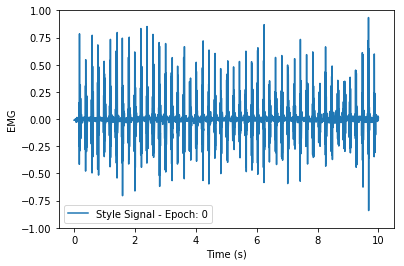

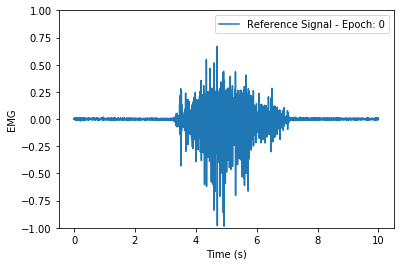

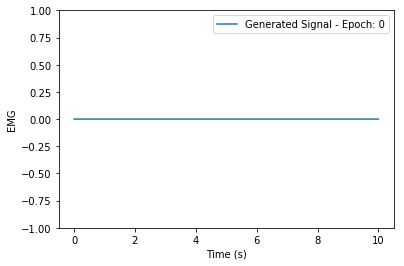

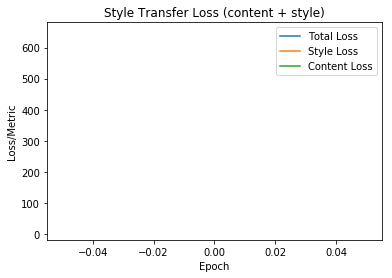

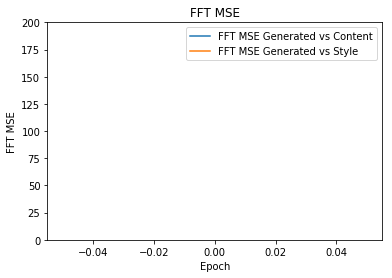

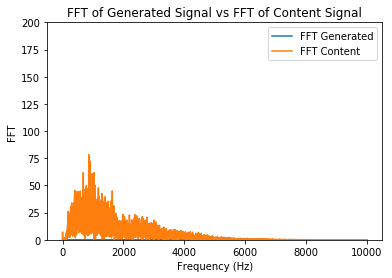

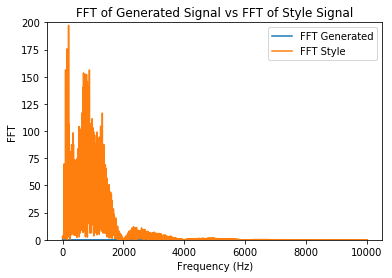

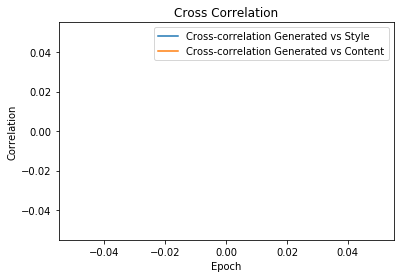

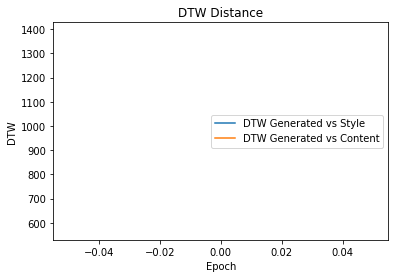

Epoch: 1 
 Content Loss: 12.35908031463623 
 Style Loss: 1379.03515625 
 Total Loss: 1391.394287109375
Metrics - Content CC:[-0.00292295], FFT:69.54570635976262, DTW:577.2898993955578
Metrics - Style CC:[0.00454555], FFT:300.2745721720095, DTW:1393.418220707133
Epoch: 2 
 Content Loss: 11.424193382263184 
 Style Loss: 526.7357177734375 
 Total Loss: 538.159912109375
Metrics - Content CC:[-0.06205046], FFT:54.25952594493154, DTW:520.6300891787516
Metrics - Style CC:[-0.02651414], FFT:332.5129018947157, DTW:1388.8756019567697
Epoch: 3 
 Content Loss: 10.797974586486816 
 Style Loss: 568.96875 
 Total Loss: 579.7667236328125
Metrics - Content CC:[6.73465799], FFT:102.96586502504206, DTW:625.796352725205
Metrics - Style CC:[0.5760854], FFT:306.43714828160336, DTW:1443.346657080513
Epoch: 4 
 Content Loss: 9.604454040527344 
 Style Loss: 245.99395751953125 
 Total Loss: 255.59841918945312
Metrics - Content CC:[10.32534442], FFT:151.89349046440566, DTW:702.8166982397863
Metrics - Style CC:[1

Epoch: 32 
 Content Loss: 5.214133262634277 
 Style Loss: 95.94442749023438 
 Total Loss: 101.15856170654297
Metrics - Content CC:[102.78115374], FFT:2395.285009649836, DTW:5321.812871675108
Metrics - Style CC:[-31.78891272], FFT:2248.6761238459403, DTW:4899.519312003755
Epoch: 33 
 Content Loss: 5.043787479400635 
 Style Loss: 96.59201049804688 
 Total Loss: 101.63579559326172
Metrics - Content CC:[173.69737674], FFT:3404.460858475776, DTW:6699.873980762525
Metrics - Style CC:[5.31822095], FFT:3319.2461369495372, DTW:6540.705583544332
Epoch: 34 
 Content Loss: 5.413186550140381 
 Style Loss: 87.84417724609375 
 Total Loss: 93.25736236572266
Metrics - Content CC:[120.61034278], FFT:2624.3487116239526, DTW:5314.062486265675
Metrics - Style CC:[-24.36105115], FFT:2479.0136558753875, DTW:5178.663662597035
Epoch: 35 
 Content Loss: 5.195774078369141 
 Style Loss: 57.92193603515625 
 Total Loss: 63.117713928222656
Metrics - Content CC:[96.61917771], FFT:2755.259633040949, DTW:5499.366351755

Epoch: 63 
 Content Loss: 5.457216739654541 
 Style Loss: 54.92292785644531 
 Total Loss: 60.38014602661133
Metrics - Content CC:[91.49061717], FFT:1222.738218346828, DTW:2176.058899500164
Metrics - Style CC:[20.08095273], FFT:1095.5562398247564, DTW:2906.964649693014
Epoch: 64 
 Content Loss: 5.553110122680664 
 Style Loss: 57.8944206237793 
 Total Loss: 63.447532653808594
Metrics - Content CC:[116.14377128], FFT:1507.2239562576483, DTW:2806.2807209853268
Metrics - Style CC:[-8.8124252], FFT:1435.494722388111, DTW:3707.7003651145587
Epoch: 65 
 Content Loss: 5.683469295501709 
 Style Loss: 71.35311126708984 
 Total Loss: 77.03658294677734
Metrics - Content CC:[58.3670719], FFT:1013.9104935431609, DTW:2110.243031665008
Metrics - Style CC:[9.65137487], FFT:855.2827197826746, DTW:2812.3930441200305
Epoch: 66 
 Content Loss: 5.321659564971924 
 Style Loss: 108.5895004272461 
 Total Loss: 113.9111557006836
Metrics - Content CC:[124.18942503], FFT:1331.8130374328257, DTW:2878.7665471041855


Epoch: 94 
 Content Loss: 5.326385974884033 
 Style Loss: 81.69345092773438 
 Total Loss: 87.01983642578125
Metrics - Content CC:[44.55840599], FFT:494.475655453392, DTW:1573.5978663059593
Metrics - Style CC:[-1.2275817], FFT:512.0341777884368, DTW:2274.413404352965
Epoch: 95 
 Content Loss: 5.421922206878662 
 Style Loss: 44.128299713134766 
 Total Loss: 49.55022048950195
Metrics - Content CC:[48.74802352], FFT:537.4306549324897, DTW:1616.4957742981485
Metrics - Style CC:[-6.7528964], FFT:520.4489692759349, DTW:2248.474316448647
Epoch: 96 
 Content Loss: 5.282623291015625 
 Style Loss: 54.53113555908203 
 Total Loss: 59.813758850097656
Metrics - Content CC:[75.53485796], FFT:694.8707536007001, DTW:2161.3158285933623
Metrics - Style CC:[-1.12267726], FFT:706.0344779748069, DTW:2751.233205620521
Epoch: 97 
 Content Loss: 5.2199578285217285 
 Style Loss: 61.835628509521484 
 Total Loss: 67.05558776855469
Metrics - Content CC:[65.90022693], FFT:600.6363301597513, DTW:1924.135163337575
Met

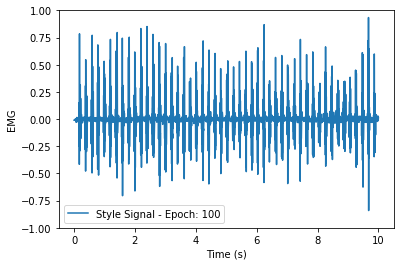

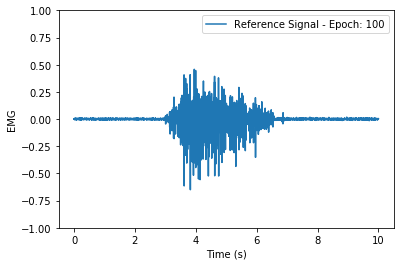

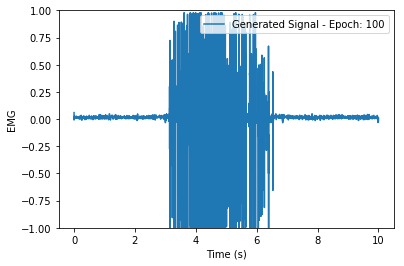

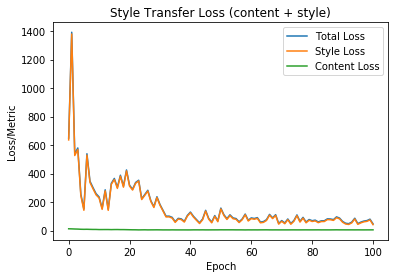

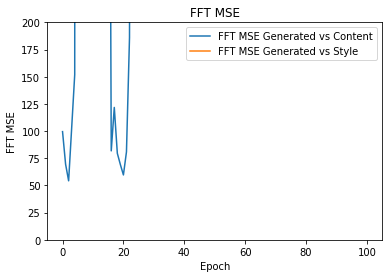

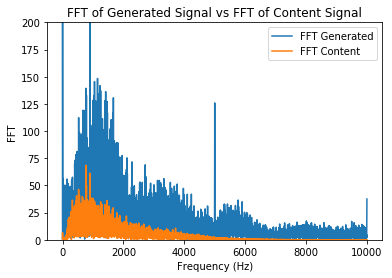

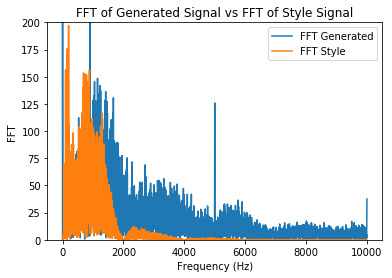

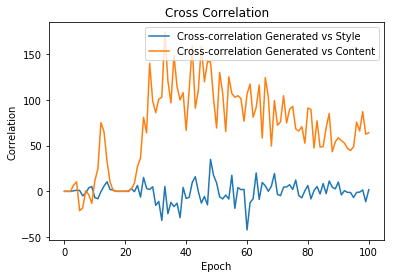

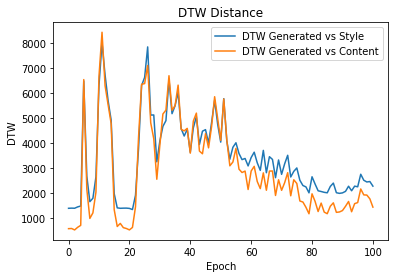

Epoch: 101 
 Content Loss: 5.345329284667969 
 Style Loss: 65.41351318359375 
 Total Loss: 70.75884246826172
Metrics - Content CC:[60.96021818], FFT:472.4427862705538, DTW:1265.1107870525836
Metrics - Style CC:[4.62179812], FFT:468.09398079702476, DTW:2179.2245703871527
Epoch: 102 
 Content Loss: 5.0529704093933105 
 Style Loss: 104.60148620605469 
 Total Loss: 109.65445709228516
Metrics - Content CC:[101.74241919], FFT:761.0051668409732, DTW:2243.5163465796095
Metrics - Style CC:[24.94906892], FFT:775.1086614239491, DTW:2826.6137558692258
Epoch: 103 
 Content Loss: 5.012178897857666 
 Style Loss: 45.108558654785156 
 Total Loss: 50.1207389831543
Metrics - Content CC:[125.3955817], FFT:783.8927708090008, DTW:2186.1375218011462
Metrics - Style CC:[2.9712696], FFT:788.1818227876381, DTW:2782.348677452206
Epoch: 104 
 Content Loss: 5.072162628173828 
 Style Loss: 87.60293579101562 
 Total Loss: 92.67509460449219
Metrics - Content CC:[142.61495606], FFT:912.6004759945354, DTW:2405.20003667

Epoch: 132 
 Content Loss: 4.730085849761963 
 Style Loss: 64.37596130371094 
 Total Loss: 69.10604858398438
Metrics - Content CC:[117.46077683], FFT:751.4571494739403, DTW:1908.2388874532394
Metrics - Style CC:[-4.20418027], FFT:714.5880749719089, DTW:2428.188278513883
Epoch: 133 
 Content Loss: 4.787853717803955 
 Style Loss: 47.078975677490234 
 Total Loss: 51.86682891845703
Metrics - Content CC:[141.01361649], FFT:600.4844533278273, DTW:1780.3036105966892
Metrics - Style CC:[-14.61450565], FFT:646.0909385710526, DTW:2317.2543187783153
Epoch: 134 
 Content Loss: 4.890821933746338 
 Style Loss: 65.52734375 
 Total Loss: 70.41816711425781
Metrics - Content CC:[105.93873249], FFT:524.1740394531557, DTW:1379.4957915135828
Metrics - Style CC:[15.77355841], FFT:514.0772300416303, DTW:2226.191603495135
Epoch: 135 
 Content Loss: 4.753672122955322 
 Style Loss: 55.48307800292969 
 Total Loss: 60.23674774169922
Metrics - Content CC:[112.62606707], FFT:634.5494185930835, DTW:1574.082337674710

Epoch: 163 
 Content Loss: 4.757798671722412 
 Style Loss: 47.1821403503418 
 Total Loss: 51.93993377685547
Metrics - Content CC:[90.74070754], FFT:357.8073099855112, DTW:1250.088894604441
Metrics - Style CC:[-5.8810731], FFT:451.74375606311116, DTW:2120.819553634392
Epoch: 164 
 Content Loss: 4.788021564483643 
 Style Loss: 78.3365478515625 
 Total Loss: 83.12457275390625
Metrics - Content CC:[69.27279002], FFT:337.18630568522974, DTW:1071.3659676030593
Metrics - Style CC:[3.56022093], FFT:413.12047866451746, DTW:1944.7562314458523
Epoch: 165 
 Content Loss: 4.70756721496582 
 Style Loss: 68.25575256347656 
 Total Loss: 72.96331787109375
Metrics - Content CC:[102.51433703], FFT:386.30486269761303, DTW:1431.320757578468
Metrics - Style CC:[-0.97248635], FFT:515.4126057690255, DTW:2134.1743770357402
Epoch: 166 
 Content Loss: 4.6660237312316895 
 Style Loss: 39.25621032714844 
 Total Loss: 43.92223358154297
Metrics - Content CC:[79.70898194], FFT:369.66478585643756, DTW:1108.07547975105

Epoch: 194 
 Content Loss: 4.816725254058838 
 Style Loss: 39.11674499511719 
 Total Loss: 43.9334716796875
Metrics - Content CC:[106.09682263], FFT:363.19587235001785, DTW:1166.1853837965002
Metrics - Style CC:[4.65671112], FFT:446.73641791455793, DTW:2018.95586402701
Epoch: 195 
 Content Loss: 4.7181077003479 
 Style Loss: 35.03999328613281 
 Total Loss: 39.75810241699219
Metrics - Content CC:[156.21532302], FFT:420.71578398704435, DTW:1657.5522811547648
Metrics - Style CC:[0.68596233], FFT:581.210570268556, DTW:2149.0506553930777
Epoch: 196 
 Content Loss: 4.8622589111328125 
 Style Loss: 50.781517028808594 
 Total Loss: 55.643775939941406
Metrics - Content CC:[90.27517709], FFT:391.68577059199623, DTW:1235.620537341986
Metrics - Style CC:[-7.00657161], FFT:447.7266568352134, DTW:1991.914319839956
Epoch: 197 
 Content Loss: 4.820583820343018 
 Style Loss: 59.42057800292969 
 Total Loss: 64.24116516113281
Metrics - Content CC:[82.77016776], FFT:328.8881022838205, DTW:985.879513693715

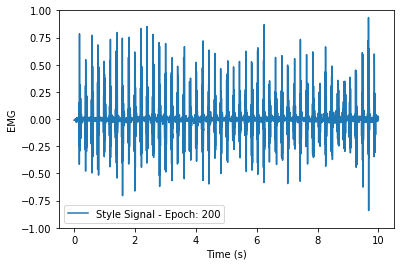

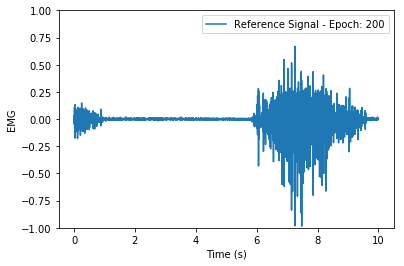

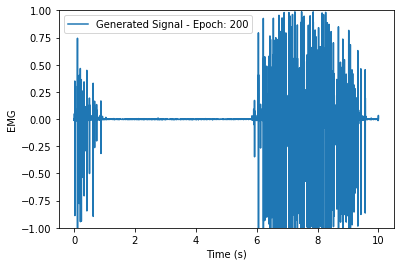

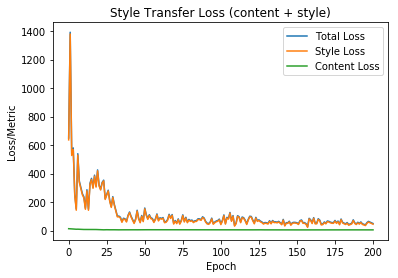

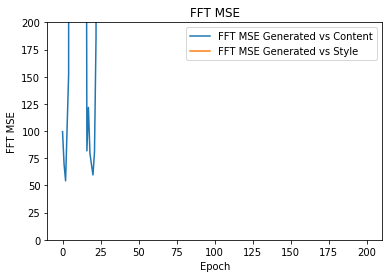

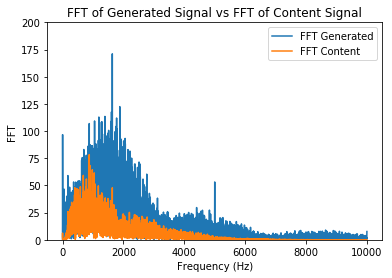

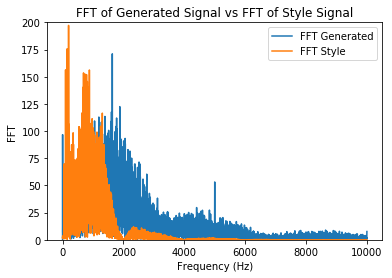

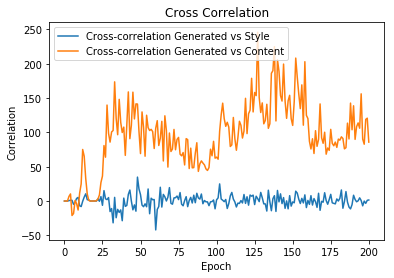

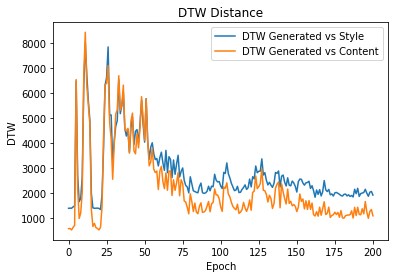

Epoch: 201 
 Content Loss: 4.756338596343994 
 Style Loss: 38.44484329223633 
 Total Loss: 43.2011833190918
Metrics - Content CC:[81.01132516], FFT:216.5084993876726, DTW:1398.235450489844
Metrics - Style CC:[1.4011926], FFT:366.0525705268673, DTW:1857.119986203795
Epoch: 202 
 Content Loss: 4.798067092895508 
 Style Loss: 69.24164581298828 
 Total Loss: 74.03971099853516
Metrics - Content CC:[68.04730077], FFT:249.19661774667898, DTW:941.3720051376794
Metrics - Style CC:[1.32791866], FFT:362.9421257531003, DTW:1833.7839638423502
Epoch: 203 
 Content Loss: 4.961108684539795 
 Style Loss: 44.25542449951172 
 Total Loss: 49.21653366088867
Metrics - Content CC:[72.1770832], FFT:279.08052129227184, DTW:1041.9975458604463
Metrics - Style CC:[0.19661851], FFT:391.33363889051276, DTW:1781.0576098455126
Epoch: 204 
 Content Loss: 4.701556205749512 
 Style Loss: 56.32495880126953 
 Total Loss: 61.026512145996094
Metrics - Content CC:[69.28503849], FFT:232.71552088448223, DTW:899.1728866846457
M

Epoch: 232 
 Content Loss: 4.737912654876709 
 Style Loss: 35.562889099121094 
 Total Loss: 40.30080032348633
Metrics - Content CC:[95.04409412], FFT:361.00962038775816, DTW:1310.980991401758
Metrics - Style CC:[1.89489617], FFT:416.7774614058363, DTW:2031.3762959716921
Epoch: 233 
 Content Loss: 4.639269828796387 
 Style Loss: 50.074302673339844 
 Total Loss: 54.71357345581055
Metrics - Content CC:[119.68797016], FFT:367.04788066893883, DTW:1430.1663102516868
Metrics - Style CC:[-1.98667103], FFT:448.115350421269, DTW:1984.7444068925943
Epoch: 234 
 Content Loss: 4.599509239196777 
 Style Loss: 47.06371307373047 
 Total Loss: 51.6632194519043
Metrics - Content CC:[84.59202694], FFT:268.0801236516507, DTW:1206.0169363768805
Metrics - Style CC:[-2.44930714], FFT:351.493571937906, DTW:1878.7325851265691
Epoch: 235 
 Content Loss: 4.541095733642578 
 Style Loss: 47.41166305541992 
 Total Loss: 51.9527587890625
Metrics - Content CC:[145.16729443], FFT:354.1429866801915, DTW:1544.2194429286

Epoch: 263 
 Content Loss: 4.370894432067871 
 Style Loss: 32.46111297607422 
 Total Loss: 36.832008361816406
Metrics - Content CC:[87.92983177], FFT:253.29139222969704, DTW:1094.2093230711673
Metrics - Style CC:[-4.58202793], FFT:313.7650748147066, DTW:1906.224616575708
Epoch: 264 
 Content Loss: 4.2223734855651855 
 Style Loss: 71.16587829589844 
 Total Loss: 75.38825225830078
Metrics - Content CC:[90.89488973], FFT:243.92424826127728, DTW:1105.629235558895
Metrics - Style CC:[-12.45101727], FFT:318.61781770537766, DTW:1792.8854563996051
Epoch: 265 
 Content Loss: 4.272955894470215 
 Style Loss: 51.90497589111328 
 Total Loss: 56.17792892456055
Metrics - Content CC:[94.69340011], FFT:261.30098489515046, DTW:1255.7861795954116
Metrics - Style CC:[1.35732027], FFT:319.63896005156556, DTW:1799.7479162386715
Epoch: 266 
 Content Loss: 4.207365989685059 
 Style Loss: 60.276893615722656 
 Total Loss: 64.48426055908203
Metrics - Content CC:[189.6231117], FFT:349.6585445696113, DTW:1739.6358

Epoch: 294 
 Content Loss: 4.335877895355225 
 Style Loss: 48.55840301513672 
 Total Loss: 52.89427947998047
Metrics - Content CC:[122.20308353], FFT:378.8301455366495, DTW:1319.3891796050846
Metrics - Style CC:[-9.86054011], FFT:410.3530617037904, DTW:2080.4465067685105
Epoch: 295 
 Content Loss: 4.289541244506836 
 Style Loss: 51.899139404296875 
 Total Loss: 56.188682556152344
Metrics - Content CC:[156.20656362], FFT:498.8876148051073, DTW:1612.9453853946354
Metrics - Style CC:[2.42927713], FFT:525.2108688155987, DTW:2141.8976923765954
Epoch: 296 
 Content Loss: 4.279554843902588 
 Style Loss: 45.65216064453125 
 Total Loss: 49.93171691894531
Metrics - Content CC:[181.85042669], FFT:584.3497843291418, DTW:1845.5253621925276
Metrics - Style CC:[0.18043076], FFT:606.814846187789, DTW:2424.297438298628
Epoch: 297 
 Content Loss: 4.415940761566162 
 Style Loss: 46.157875061035156 
 Total Loss: 50.573814392089844
Metrics - Content CC:[137.52716681], FFT:499.195953349376, DTW:1579.2370988

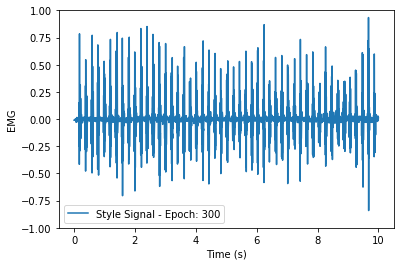

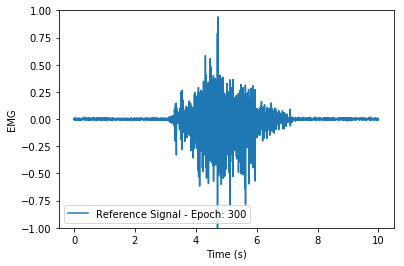

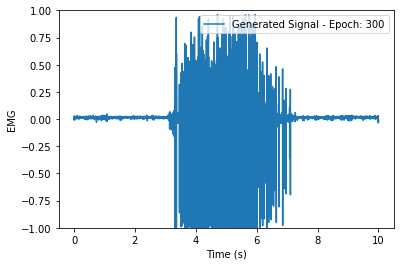

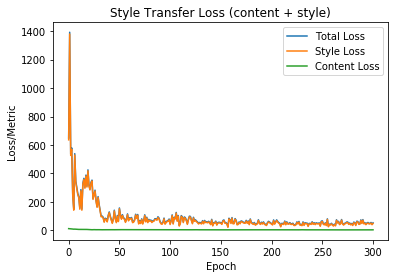

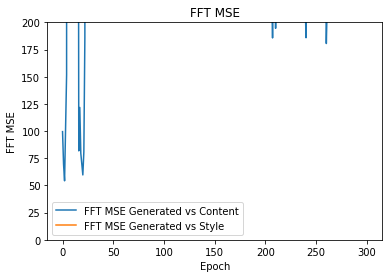

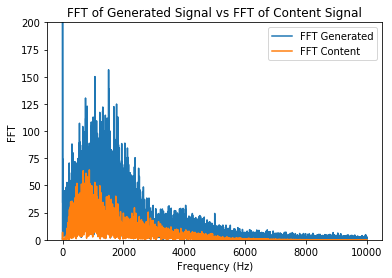

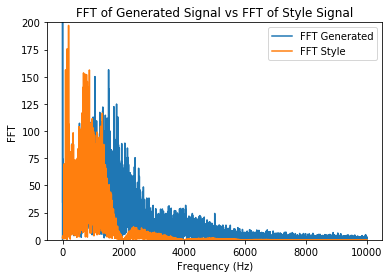

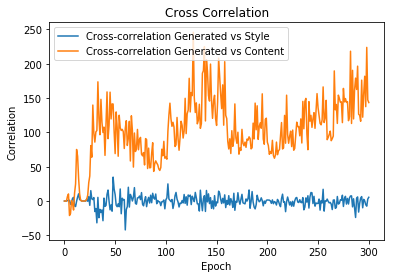

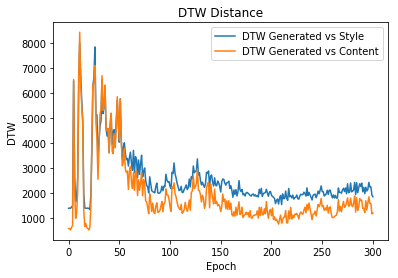

Epoch: 301 
 Content Loss: 4.59158992767334 
 Style Loss: 72.683349609375 
 Total Loss: 77.27494049072266
Metrics - Content CC:[122.9458404], FFT:392.9446291386562, DTW:1387.05066236894
Metrics - Style CC:[3.86653795], FFT:421.87837202702104, DTW:2024.8321215071746
Epoch: 302 
 Content Loss: 4.348542213439941 
 Style Loss: 43.09895706176758 
 Total Loss: 47.4474983215332
Metrics - Content CC:[134.25526849], FFT:304.086503269139, DTW:1207.0548849139004
Metrics - Style CC:[-0.98587902], FFT:374.2216747622113, DTW:1938.9568408229431
Epoch: 303 
 Content Loss: 4.238430976867676 
 Style Loss: 48.924583435058594 
 Total Loss: 53.16301345825195
Metrics - Content CC:[177.59143332], FFT:379.4990604610152, DTW:1478.9519081697138
Metrics - Style CC:[11.00771465], FFT:462.67462350634463, DTW:2107.0301367354955
Epoch: 304 
 Content Loss: 4.275688648223877 
 Style Loss: 38.48223114013672 
 Total Loss: 42.75791931152344
Metrics - Content CC:[149.38190705], FFT:413.5524633958947, DTW:1513.897379041271

Epoch: 332 
 Content Loss: 4.096817970275879 
 Style Loss: 36.471622467041016 
 Total Loss: 40.56843948364258
Metrics - Content CC:[194.76489455], FFT:470.56525151714544, DTW:1514.2715978812867
Metrics - Style CC:[4.86164955], FFT:577.9593932003039, DTW:2226.4527381024564
Epoch: 333 
 Content Loss: 4.125370979309082 
 Style Loss: 35.784393310546875 
 Total Loss: 39.90976333618164
Metrics - Content CC:[190.92974306], FFT:536.9908284595825, DTW:1475.5856602004078
Metrics - Style CC:[5.31456654], FFT:611.3791341958553, DTW:2335.9169837616014
Epoch: 334 
 Content Loss: 4.149721145629883 
 Style Loss: 40.22847366333008 
 Total Loss: 44.378196716308594
Metrics - Content CC:[189.33568943], FFT:476.5564811962496, DTW:1548.3463582967122
Metrics - Style CC:[-5.00116339], FFT:595.2113216149625, DTW:2354.7126591619676
Epoch: 335 
 Content Loss: 4.186601161956787 
 Style Loss: 37.60935974121094 
 Total Loss: 41.79595947265625
Metrics - Content CC:[145.30671034], FFT:383.09475489351945, DTW:1166.859

Epoch: 363 
 Content Loss: 4.207152843475342 
 Style Loss: 74.90648651123047 
 Total Loss: 79.11363983154297
Metrics - Content CC:[181.18313403], FFT:893.7014679824763, DTW:1996.7255778712465
Metrics - Style CC:[0.36479165], FFT:950.516783360712, DTW:2762.8652842799484
Epoch: 364 
 Content Loss: 4.2606635093688965 
 Style Loss: 84.11672973632812 
 Total Loss: 88.37739562988281
Metrics - Content CC:[272.04211979], FFT:1263.7416348126853, DTW:2644.286856971467
Metrics - Style CC:[1.32324289], FFT:1384.5611097490462, DTW:3475.8972471659
Epoch: 365 
 Content Loss: 4.391962051391602 
 Style Loss: 79.44231414794922 
 Total Loss: 83.83427429199219
Metrics - Content CC:[154.68104647], FFT:880.3310260613638, DTW:1788.3553205843477
Metrics - Style CC:[4.07933128], FFT:874.5274150484588, DTW:2636.7485832403486
Epoch: 366 
 Content Loss: 4.2515740394592285 
 Style Loss: 45.16455841064453 
 Total Loss: 49.416133880615234
Metrics - Content CC:[195.14057742], FFT:970.7539810269266, DTW:1988.647928726

Epoch: 394 
 Content Loss: 4.40110445022583 
 Style Loss: 47.82660675048828 
 Total Loss: 52.22771072387695
Metrics - Content CC:[144.99148162], FFT:385.9169106092909, DTW:1213.2615514129868
Metrics - Style CC:[4.52325422], FFT:442.7698093339755, DTW:2181.9758097811564
Epoch: 395 
 Content Loss: 4.395871639251709 
 Style Loss: 66.50791931152344 
 Total Loss: 70.90379333496094
Metrics - Content CC:[173.0057202], FFT:494.63116374366075, DTW:1550.694877802071
Metrics - Style CC:[2.11449635], FFT:553.3788501689329, DTW:2278.63866536878
Epoch: 396 
 Content Loss: 4.297171592712402 
 Style Loss: 79.43956756591797 
 Total Loss: 83.73674011230469
Metrics - Content CC:[142.96106017], FFT:374.2427019359843, DTW:1127.2182171942688
Metrics - Style CC:[-1.68535512], FFT:442.2071008779898, DTW:1981.5013393231156
Epoch: 397 
 Content Loss: 4.210049629211426 
 Style Loss: 44.437225341796875 
 Total Loss: 48.647274017333984
Metrics - Content CC:[203.51836175], FFT:485.03118669450896, DTW:1528.376364195

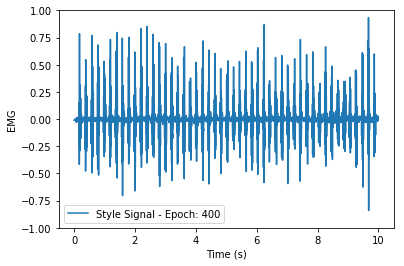

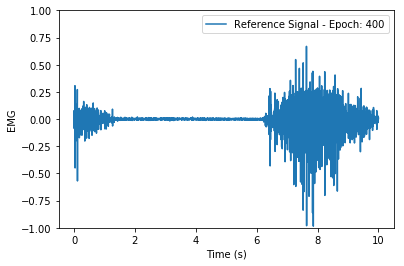

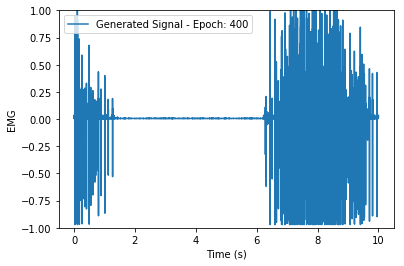

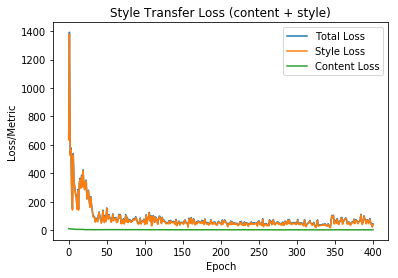

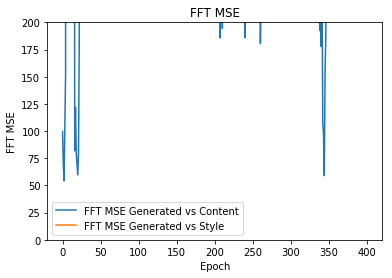

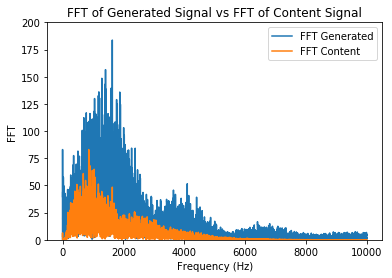

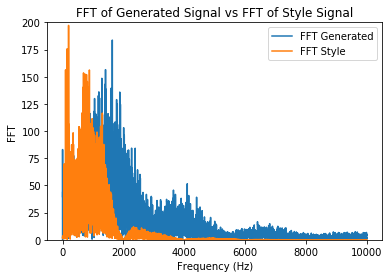

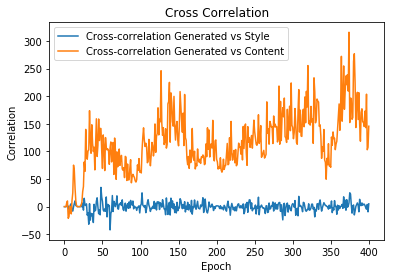

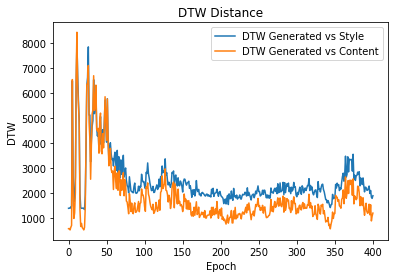

Epoch: 401 
 Content Loss: 4.391206741333008 
 Style Loss: 74.39026641845703 
 Total Loss: 78.7814712524414
Metrics - Content CC:[112.63488434], FFT:325.7892683091031, DTW:1043.3774788964895
Metrics - Style CC:[3.42321952], FFT:392.31958992991275, DTW:1894.8092422382767
Epoch: 402 
 Content Loss: 4.396886825561523 
 Style Loss: 67.16400909423828 
 Total Loss: 71.56089782714844
Metrics - Content CC:[134.20362835], FFT:313.6231391972547, DTW:1032.1522405475691
Metrics - Style CC:[0.83297247], FFT:397.7096800087144, DTW:1946.2456232334714
Epoch: 403 
 Content Loss: 4.188398361206055 
 Style Loss: 47.45159912109375 
 Total Loss: 51.6400032043457
Metrics - Content CC:[174.04146795], FFT:417.3540684880038, DTW:1392.7036040401752
Metrics - Style CC:[25.1986506], FFT:504.3671963430495, DTW:2112.262014848322
Epoch: 404 
 Content Loss: 4.145459175109863 
 Style Loss: 63.34088134765625 
 Total Loss: 67.48634338378906
Metrics - Content CC:[113.71038952], FFT:327.1912624962335, DTW:1213.58734047748

Epoch: 432 
 Content Loss: 4.223605155944824 
 Style Loss: 50.721214294433594 
 Total Loss: 54.94481658935547
Metrics - Content CC:[182.3323007], FFT:349.4793588809968, DTW:1325.3990849794238
Metrics - Style CC:[-3.75662321], FFT:446.83520599848674, DTW:1971.88225228054
Epoch: 433 
 Content Loss: 4.253631591796875 
 Style Loss: 68.67837524414062 
 Total Loss: 72.9320068359375
Metrics - Content CC:[134.59999576], FFT:298.9206997018207, DTW:1214.5467710935673
Metrics - Style CC:[-14.47093791], FFT:365.3786165328544, DTW:1922.7327563451258
Epoch: 434 
 Content Loss: 4.419848918914795 
 Style Loss: 46.14813995361328 
 Total Loss: 50.567989349365234
Metrics - Content CC:[98.51061905], FFT:214.5101728330001, DTW:852.8681706325452
Metrics - Style CC:[4.42180757], FFT:275.7407772443209, DTW:1736.2041279244017
Epoch: 435 
 Content Loss: 4.3777971267700195 
 Style Loss: 31.164541244506836 
 Total Loss: 35.54233932495117
Metrics - Content CC:[126.05344463], FFT:231.4564786930135, DTW:1010.5951173

Epoch: 463 
 Content Loss: 4.213283538818359 
 Style Loss: 49.02506637573242 
 Total Loss: 53.23834991455078
Metrics - Content CC:[190.01402647], FFT:483.31418648061094, DTW:1522.2036002153807
Metrics - Style CC:[0.78174052], FFT:514.8723037311295, DTW:2315.460301699469
Epoch: 464 
 Content Loss: 4.254006862640381 
 Style Loss: 33.89601516723633 
 Total Loss: 38.150020599365234
Metrics - Content CC:[137.22550432], FFT:358.0414953303472, DTW:1180.8983234644736
Metrics - Style CC:[-3.64718328], FFT:384.4877985596763, DTW:1979.6753600519642
Epoch: 465 
 Content Loss: 4.226059436798096 
 Style Loss: 32.24217224121094 
 Total Loss: 36.468231201171875
Metrics - Content CC:[111.27526804], FFT:338.3605081608934, DTW:1193.2677291612476
Metrics - Style CC:[6.82479303], FFT:340.766315839839, DTW:1951.0964202132918
Epoch: 466 
 Content Loss: 4.230501174926758 
 Style Loss: 43.13557434082031 
 Total Loss: 47.36607360839844
Metrics - Content CC:[116.66784503], FFT:377.7054200913041, DTW:1446.4648373

Epoch: 494 
 Content Loss: 4.453301906585693 
 Style Loss: 36.878204345703125 
 Total Loss: 41.331504821777344
Metrics - Content CC:[54.82640079], FFT:83.02365266210307, DTW:766.6349639405616
Metrics - Style CC:[-5.63097941], FFT:242.40699100005332, DTW:1517.2272470603127
Epoch: 495 
 Content Loss: 4.426084518432617 
 Style Loss: 45.12470245361328 
 Total Loss: 49.55078887939453
Metrics - Content CC:[86.56275038], FFT:103.4025643891927, DTW:839.8000930451965
Metrics - Style CC:[4.00694905], FFT:261.36357558225774, DTW:1425.1923692805435
Epoch: 496 
 Content Loss: 4.420644283294678 
 Style Loss: 46.40585708618164 
 Total Loss: 50.826499938964844
Metrics - Content CC:[70.0545359], FFT:102.30536543050236, DTW:830.0241101201626
Metrics - Style CC:[0.5071141], FFT:253.4423831991765, DTW:1469.2179446313353
Epoch: 497 
 Content Loss: 4.464653491973877 
 Style Loss: 36.49921417236328 
 Total Loss: 40.9638671875
Metrics - Content CC:[67.46141185], FFT:84.49229260553342, DTW:677.1068996387982
Me

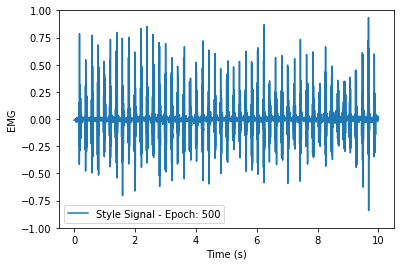

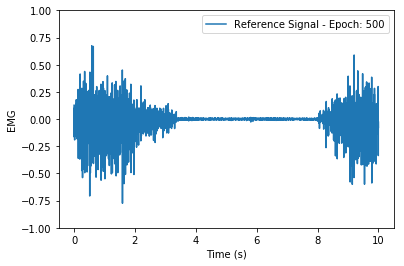

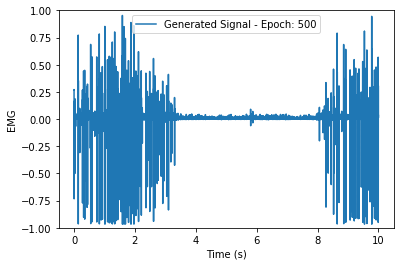

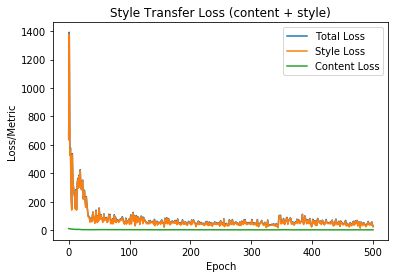

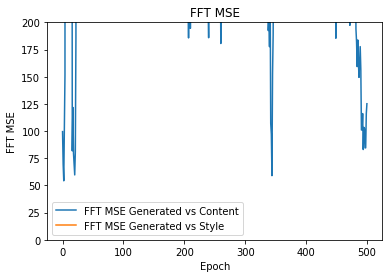

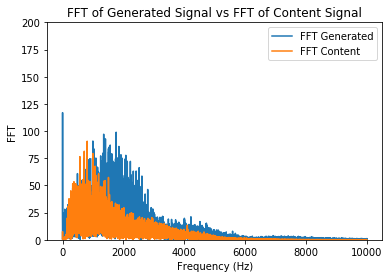

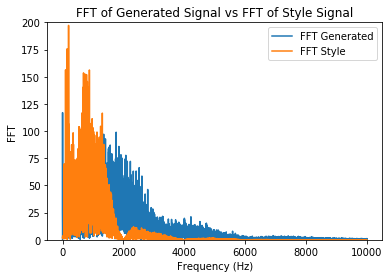

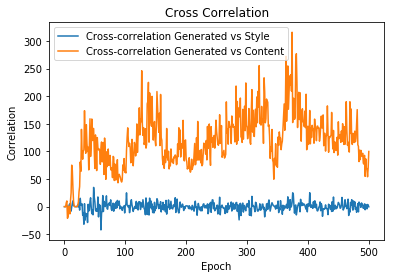

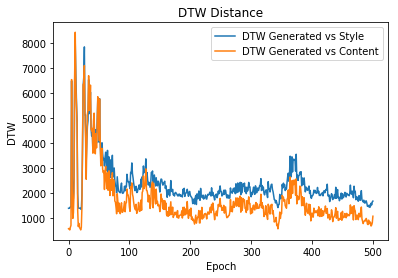

Epoch: 501 
 Content Loss: 4.125043869018555 
 Style Loss: 44.249900817871094 
 Total Loss: 48.37494659423828
Metrics - Content CC:[77.48324435], FFT:110.99242363668921, DTW:930.2624322985479
Metrics - Style CC:[2.66548918], FFT:273.9312485399353, DTW:1580.4787054564222
Epoch: 502 
 Content Loss: 4.256353378295898 
 Style Loss: 41.90734100341797 
 Total Loss: 46.1636962890625
Metrics - Content CC:[57.08742514], FFT:89.42888971704946, DTW:717.2125796868263
Metrics - Style CC:[-2.2349987], FFT:254.23774374424912, DTW:1567.1573923572712
Epoch: 503 
 Content Loss: 4.149297714233398 
 Style Loss: 51.21430587768555 
 Total Loss: 55.36359786987305
Metrics - Content CC:[65.3459935], FFT:88.23635698641581, DTW:776.0969436987302
Metrics - Style CC:[-4.12602488], FFT:261.51264065057734, DTW:1451.4310034653327
Epoch: 504 
 Content Loss: 4.1993937492370605 
 Style Loss: 49.23063278198242 
 Total Loss: 53.430030822753906
Metrics - Content CC:[61.9497484], FFT:70.88637692100427, DTW:738.5142035691013

Epoch: 532 
 Content Loss: 3.8299307823181152 
 Style Loss: 29.74441909790039 
 Total Loss: 33.57434844970703
Metrics - Content CC:[171.80023329], FFT:293.4472265916189, DTW:1236.4498620568804
Metrics - Style CC:[-3.84039909], FFT:406.10207083481276, DTW:1988.4656812143216
Epoch: 533 
 Content Loss: 3.899233341217041 
 Style Loss: 27.006845474243164 
 Total Loss: 30.906078338623047
Metrics - Content CC:[146.45009863], FFT:242.41688211335105, DTW:962.6668458073357
Metrics - Style CC:[-3.98374715], FFT:354.6704365278446, DTW:1791.4917586108718
Epoch: 534 
 Content Loss: 3.9849605560302734 
 Style Loss: 26.7265682220459 
 Total Loss: 30.711528778076172
Metrics - Content CC:[129.95595458], FFT:262.0995976517079, DTW:1050.3773966605763
Metrics - Style CC:[-6.81391448], FFT:354.14574616158916, DTW:1861.015944311463
Epoch: 535 
 Content Loss: 3.81874680519104 
 Style Loss: 38.1004638671875 
 Total Loss: 41.919212341308594
Metrics - Content CC:[125.21096176], FFT:232.39198652965297, DTW:955.52

Epoch: 563 
 Content Loss: 3.8981850147247314 
 Style Loss: 27.291404724121094 
 Total Loss: 31.189590454101562
Metrics - Content CC:[71.6413187], FFT:68.13840297442651, DTW:548.3470822596963
Metrics - Style CC:[5.7069921], FFT:248.4633365028094, DTW:1527.2601470031143
Epoch: 564 
 Content Loss: 3.9486567974090576 
 Style Loss: 20.81117057800293 
 Total Loss: 24.75982666015625
Metrics - Content CC:[82.24751408], FFT:93.28749111449933, DTW:812.9897058526327
Metrics - Style CC:[3.45728264], FFT:258.964709747435, DTW:1553.4853338471842
Epoch: 565 
 Content Loss: 3.8484981060028076 
 Style Loss: 42.73918914794922 
 Total Loss: 46.58768844604492
Metrics - Content CC:[56.87035636], FFT:66.23987301197928, DTW:602.4326098424423
Metrics - Style CC:[-2.27988182], FFT:238.43395767765833, DTW:1540.2040603914795
Epoch: 566 
 Content Loss: 3.748270034790039 
 Style Loss: 24.994976043701172 
 Total Loss: 28.74324607849121
Metrics - Content CC:[76.38586678], FFT:71.76780006425089, DTW:610.223649365168

Epoch: 594 
 Content Loss: 3.7179715633392334 
 Style Loss: 29.56863021850586 
 Total Loss: 33.28660202026367
Metrics - Content CC:[60.43778841], FFT:56.276303915340904, DTW:629.0093092561447
Metrics - Style CC:[1.47684379], FFT:241.75797806824716, DTW:1493.5554634565935
Epoch: 595 
 Content Loss: 3.827399969100952 
 Style Loss: 21.999919891357422 
 Total Loss: 25.827320098876953
Metrics - Content CC:[58.94125104], FFT:62.160845963763435, DTW:690.1287510379844
Metrics - Style CC:[1.00330297], FFT:236.46551728764138, DTW:1448.7286337827577
Epoch: 596 
 Content Loss: 3.833085536956787 
 Style Loss: 13.204286575317383 
 Total Loss: 17.037372589111328
Metrics - Content CC:[42.04347761], FFT:46.43244614980156, DTW:480.7895802541933
Metrics - Style CC:[-1.8201821], FFT:242.66820101318115, DTW:1391.7006729551972
Epoch: 597 
 Content Loss: 3.7019569873809814 
 Style Loss: 19.613250732421875 
 Total Loss: 23.315208435058594
Metrics - Content CC:[43.34884463], FFT:47.086569832513334, DTW:564.879

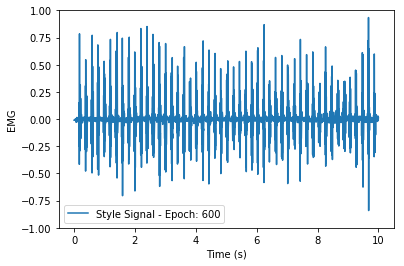

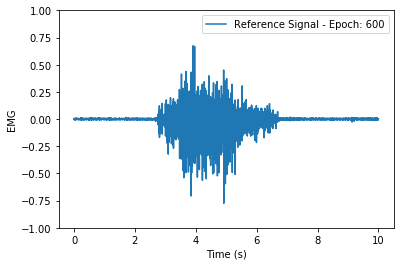

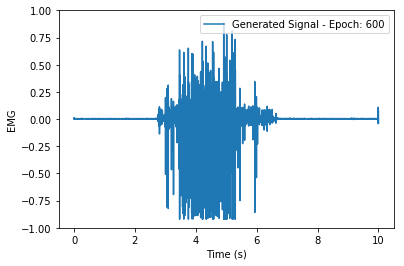

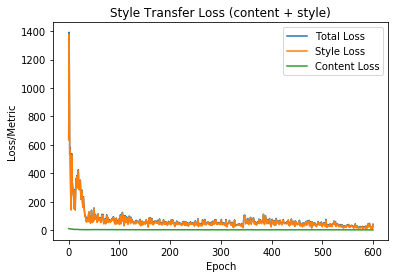

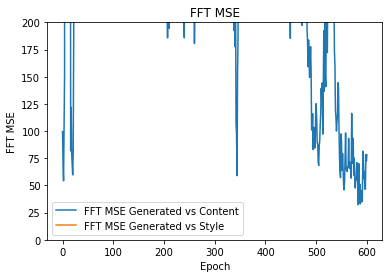

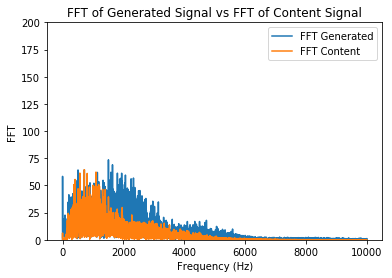

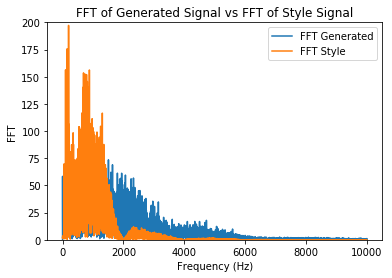

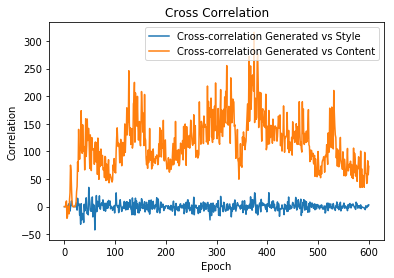

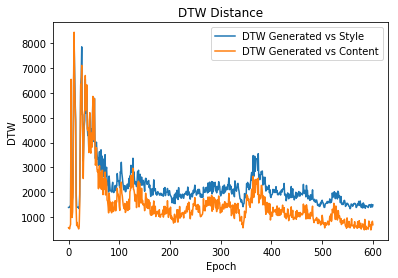

Epoch: 601 
 Content Loss: 3.704439163208008 
 Style Loss: 14.373111724853516 
 Total Loss: 18.077550888061523
Metrics - Content CC:[90.10667417], FFT:87.47074299912332, DTW:684.3109495967842
Metrics - Style CC:[-7.27746231], FFT:266.2902880881666, DTW:1410.553118448078
Epoch: 602 
 Content Loss: 3.634417772293091 
 Style Loss: 27.21278190612793 
 Total Loss: 30.84720230102539
Metrics - Content CC:[83.21391796], FFT:87.91012182882773, DTW:651.7723464303472
Metrics - Style CC:[-1.39366456], FFT:267.03914250997815, DTW:1447.1507915757768
Epoch: 603 
 Content Loss: 3.7076594829559326 
 Style Loss: 18.894739151000977 
 Total Loss: 22.602397918701172
Metrics - Content CC:[74.23170473], FFT:82.67780454846051, DTW:597.5460515377914
Metrics - Style CC:[-5.07422746], FFT:255.73773501356445, DTW:1512.8197466291622
Epoch: 604 
 Content Loss: 3.6477484703063965 
 Style Loss: 15.568578720092773 
 Total Loss: 19.216327667236328
Metrics - Content CC:[72.21777483], FFT:79.28293063917292, DTW:592.93615

Epoch: 632 
 Content Loss: 3.6171605587005615 
 Style Loss: 12.71379280090332 
 Total Loss: 16.33095359802246
Metrics - Content CC:[42.67502608], FFT:48.90262708135488, DTW:653.5905700401332
Metrics - Style CC:[1.66564181], FFT:231.5352566254223, DTW:1382.7130272057377
Epoch: 633 
 Content Loss: 3.5857651233673096 
 Style Loss: 21.515724182128906 
 Total Loss: 25.101490020751953
Metrics - Content CC:[37.52014316], FFT:38.40297210840553, DTW:525.8379546200026
Metrics - Style CC:[0.06784558], FFT:232.56707741311575, DTW:1358.973120662814
Epoch: 634 
 Content Loss: 3.650007486343384 
 Style Loss: 13.407585144042969 
 Total Loss: 17.057592391967773
Metrics - Content CC:[61.75364922], FFT:47.89260464522926, DTW:658.0710928176437
Metrics - Style CC:[-0.18298737], FFT:226.4908317221318, DTW:1387.4886526646967
Epoch: 635 
 Content Loss: 3.567711353302002 
 Style Loss: 14.012691497802734 
 Total Loss: 17.580402374267578
Metrics - Content CC:[53.79087631], FFT:47.03945018843157, DTW:586.32007381

Epoch: 663 
 Content Loss: 3.4746696949005127 
 Style Loss: 10.624309539794922 
 Total Loss: 14.098978996276855
Metrics - Content CC:[86.93791959], FFT:94.65000905828627, DTW:852.9883193432295
Metrics - Style CC:[-1.48301069], FFT:235.49979197640215, DTW:1558.3973136462632
Epoch: 664 
 Content Loss: 3.5356719493865967 
 Style Loss: 17.71334457397461 
 Total Loss: 21.24901580810547
Metrics - Content CC:[97.4644193], FFT:89.30464324785055, DTW:801.6709529028633
Metrics - Style CC:[-3.32359003], FFT:234.65286297385754, DTW:1592.4625977859243
Epoch: 665 
 Content Loss: 3.6514835357666016 
 Style Loss: 14.28506088256836 
 Total Loss: 17.93654441833496
Metrics - Content CC:[88.40415942], FFT:81.30286672866042, DTW:734.599713798851
Metrics - Style CC:[-0.42187747], FFT:225.45555684562476, DTW:1621.7155052246246
Epoch: 666 
 Content Loss: 3.571317195892334 
 Style Loss: 16.092823028564453 
 Total Loss: 19.664140701293945
Metrics - Content CC:[61.32106289], FFT:84.91335955823776, DTW:778.405979

Epoch: 694 
 Content Loss: 3.511997699737549 
 Style Loss: 12.776191711425781 
 Total Loss: 16.288188934326172
Metrics - Content CC:[121.35784214], FFT:134.94882679302017, DTW:918.4401088002608
Metrics - Style CC:[3.17945657], FFT:287.3392328142281, DTW:1501.3307000244365
Epoch: 695 
 Content Loss: 3.5241153240203857 
 Style Loss: 10.883265495300293 
 Total Loss: 14.407381057739258
Metrics - Content CC:[52.53051279], FFT:70.65812280126762, DTW:556.2975238165749
Metrics - Style CC:[0.37466766], FFT:237.3638988882941, DTW:1521.6805485694451
Epoch: 696 
 Content Loss: 3.549206495285034 
 Style Loss: 36.35455322265625 
 Total Loss: 39.90375900268555
Metrics - Content CC:[73.99733368], FFT:74.23223880249336, DTW:716.2597102349271
Metrics - Style CC:[-1.74776979], FFT:241.0678902713354, DTW:1549.1068227159244
Epoch: 697 
 Content Loss: 3.6151349544525146 
 Style Loss: 16.68134117126465 
 Total Loss: 20.296476364135742
Metrics - Content CC:[65.78951247], FFT:71.80998035788045, DTW:634.7309218

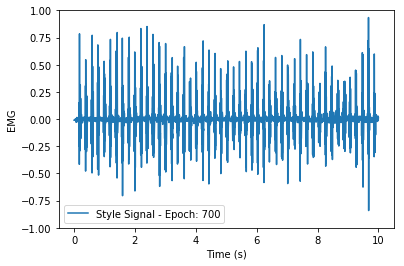

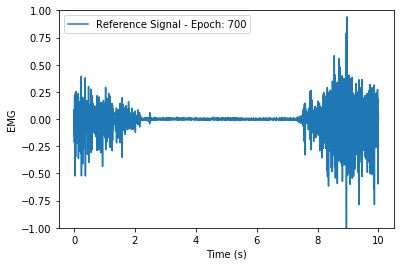

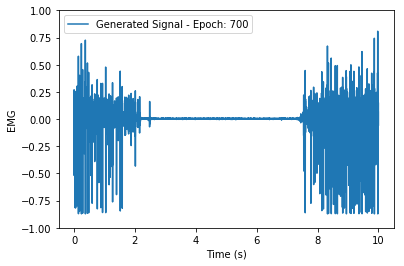

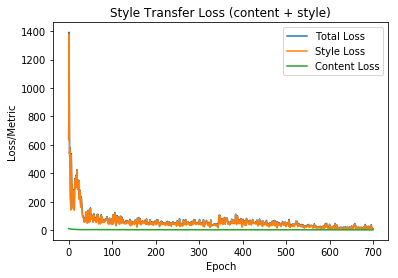

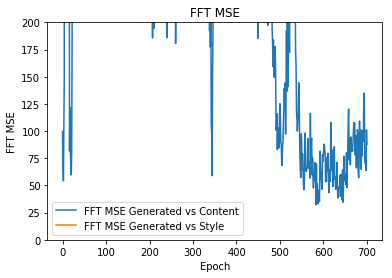

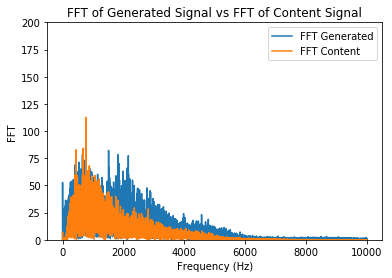

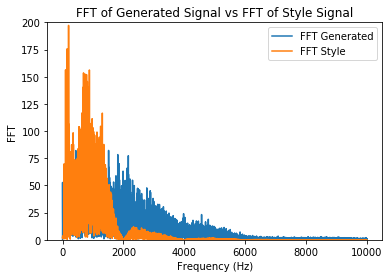

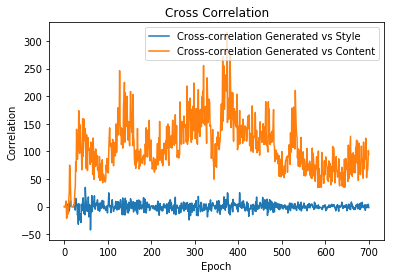

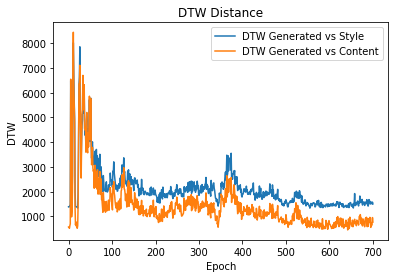

Epoch: 701 
 Content Loss: 3.6184258460998535 
 Style Loss: 11.493946075439453 
 Total Loss: 15.112371444702148
Metrics - Content CC:[82.14826513], FFT:98.38403504302647, DTW:787.6783721219856
Metrics - Style CC:[0.70631907], FFT:243.871852919791, DTW:1474.159356436154
Epoch: 702 
 Content Loss: 3.5110251903533936 
 Style Loss: 23.203235626220703 
 Total Loss: 26.71426010131836
Metrics - Content CC:[102.58279419], FFT:94.57118925361524, DTW:827.4841439474413
Metrics - Style CC:[-13.37378157], FFT:254.30439314852325, DTW:1682.8902464865635
Epoch: 703 
 Content Loss: 3.5754456520080566 
 Style Loss: 10.235742568969727 
 Total Loss: 13.811187744140625
Metrics - Content CC:[82.51996499], FFT:75.7782310682484, DTW:676.3369922257641
Metrics - Style CC:[-1.43880212], FFT:239.4053467816069, DTW:1557.3538746004738
Epoch: 704 
 Content Loss: 3.513188362121582 
 Style Loss: 9.864160537719727 
 Total Loss: 13.377347946166992
Metrics - Content CC:[77.91345573], FFT:86.53257658096753, DTW:624.542487

Epoch: 732 
 Content Loss: 3.3112425804138184 
 Style Loss: 9.251863479614258 
 Total Loss: 12.563106536865234
Metrics - Content CC:[119.69064882], FFT:116.22444238121179, DTW:835.7269052472103
Metrics - Style CC:[5.63982949], FFT:257.22357320025765, DTW:1574.4878780992265
Epoch: 733 
 Content Loss: 3.420849323272705 
 Style Loss: 6.839592933654785 
 Total Loss: 10.260442733764648
Metrics - Content CC:[81.79368105], FFT:91.3464462155137, DTW:684.1515555431978
Metrics - Style CC:[4.19370019], FFT:236.91530756406286, DTW:1564.5205416684548
Epoch: 734 
 Content Loss: 3.4122631549835205 
 Style Loss: 9.656882286071777 
 Total Loss: 13.069145202636719
Metrics - Content CC:[89.91699086], FFT:85.3273962871007, DTW:753.1980300394329
Metrics - Style CC:[2.59733127], FFT:237.69148427708802, DTW:1527.963405145893
Epoch: 735 
 Content Loss: 3.401597261428833 
 Style Loss: 13.204055786132812 
 Total Loss: 16.605653762817383
Metrics - Content CC:[84.32062859], FFT:84.09385120508804, DTW:673.18318802

Epoch: 763 
 Content Loss: 3.255568265914917 
 Style Loss: 12.31385612487793 
 Total Loss: 15.569424629211426
Metrics - Content CC:[60.17667021], FFT:45.06872240347324, DTW:606.2652015941801
Metrics - Style CC:[-0.69644896], FFT:204.98155592988675, DTW:1490.3367756293158
Epoch: 764 
 Content Loss: 3.232104778289795 
 Style Loss: 8.903213500976562 
 Total Loss: 12.135318756103516
Metrics - Content CC:[96.52945307], FFT:60.50356943397531, DTW:812.8909991236662
Metrics - Style CC:[-0.21504738], FFT:207.24444258613985, DTW:1414.1765577239541
Epoch: 765 
 Content Loss: 3.208254337310791 
 Style Loss: 8.519857406616211 
 Total Loss: 11.728111267089844
Metrics - Content CC:[56.94711307], FFT:41.25821013724232, DTW:576.8067660082389
Metrics - Style CC:[4.71525639], FFT:203.2277588608767, DTW:1441.3699361819058
Epoch: 766 
 Content Loss: 3.230678081512451 
 Style Loss: 9.254276275634766 
 Total Loss: 12.484954833984375
Metrics - Content CC:[40.3054958], FFT:32.4740585176473, DTW:476.08245652962

Epoch: 794 
 Content Loss: 3.2417242527008057 
 Style Loss: 6.750033855438232 
 Total Loss: 9.991758346557617
Metrics - Content CC:[100.59304385], FFT:123.34600314768998, DTW:918.8815279358776
Metrics - Style CC:[-0.56977961], FFT:230.12721874721487, DTW:1658.2074903728665
Epoch: 795 
 Content Loss: 3.2205491065979004 
 Style Loss: 12.096003532409668 
 Total Loss: 15.316553115844727
Metrics - Content CC:[99.70479236], FFT:126.34356753093381, DTW:943.1769267141584
Metrics - Style CC:[-3.58463122], FFT:232.91895608244863, DTW:1709.9032876542856
Epoch: 796 
 Content Loss: 3.208697557449341 
 Style Loss: 5.388298034667969 
 Total Loss: 8.59699535369873
Metrics - Content CC:[114.99355119], FFT:176.97476416283772, DTW:1151.3753348741566
Metrics - Style CC:[-8.62236039], FFT:273.85724810861564, DTW:1884.7980771241648
Epoch: 797 
 Content Loss: 3.2209537029266357 
 Style Loss: 7.174675941467285 
 Total Loss: 10.3956298828125
Metrics - Content CC:[126.23511141], FFT:173.01217137684716, DTW:1160

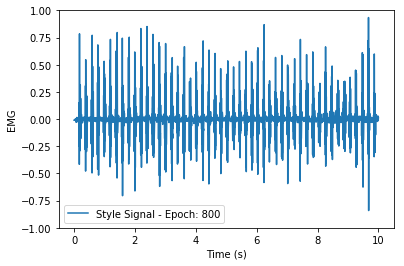

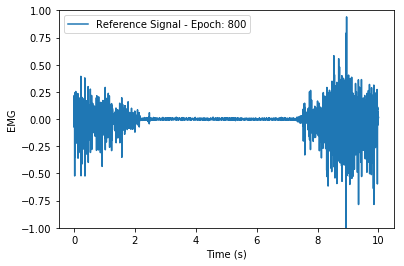

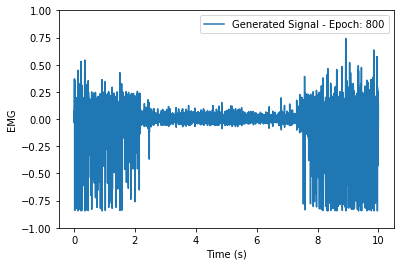

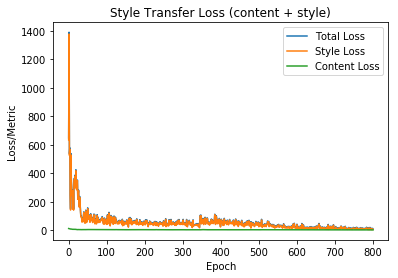

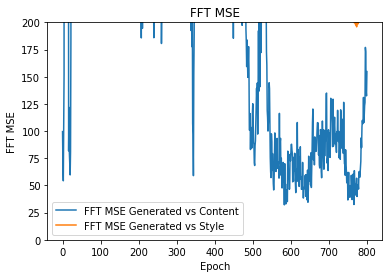

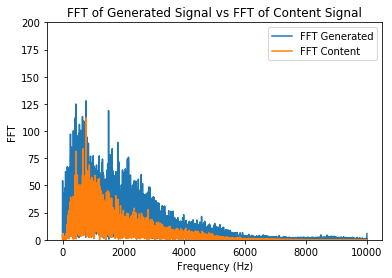

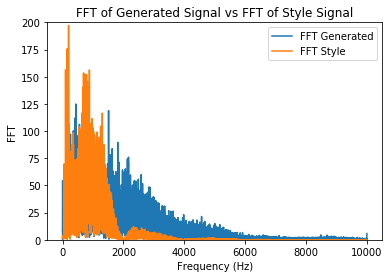

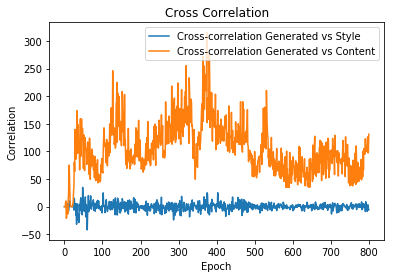

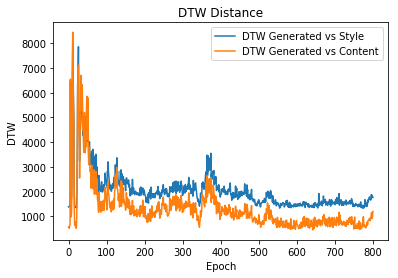

Epoch: 801 
 Content Loss: 3.233200788497925 
 Style Loss: 12.736637115478516 
 Total Loss: 15.96983814239502
Metrics - Content CC:[123.88637858], FFT:187.15261421849098, DTW:1188.8359588815847
Metrics - Style CC:[-5.49053595], FFT:289.6112712328636, DTW:1875.6722216572186
Epoch: 802 
 Content Loss: 3.1765737533569336 
 Style Loss: 9.589279174804688 
 Total Loss: 12.765852928161621
Metrics - Content CC:[75.32581623], FFT:126.15283614666605, DTW:1032.2875791594004
Metrics - Style CC:[-1.04877009], FFT:227.24152068315698, DTW:1697.0000305073684
Epoch: 803 
 Content Loss: 3.206594944000244 
 Style Loss: 6.281493186950684 
 Total Loss: 9.488088607788086
Metrics - Content CC:[118.26066209], FFT:160.73268327922335, DTW:1309.560531867999
Metrics - Style CC:[2.05662867], FFT:262.38133668839856, DTW:1845.9324375390345
Epoch: 804 
 Content Loss: 3.2037246227264404 
 Style Loss: 8.3336181640625 
 Total Loss: 11.53734302520752
Metrics - Content CC:[72.29086984], FFT:153.44521060023146, DTW:1147.44

Epoch: 832 
 Content Loss: 3.1308867931365967 
 Style Loss: 9.06385326385498 
 Total Loss: 12.194740295410156
Metrics - Content CC:[53.73261125], FFT:132.65057599560117, DTW:1342.9803168405267
Metrics - Style CC:[-2.62681723], FFT:253.34077873234332, DTW:1914.0759174951968
Epoch: 833 
 Content Loss: 3.1375627517700195 
 Style Loss: 7.767491340637207 
 Total Loss: 10.905054092407227
Metrics - Content CC:[82.11135551], FFT:123.6743349873697, DTW:1205.6842088875808
Metrics - Style CC:[-5.63547607], FFT:245.32047393185454, DTW:1917.8712009073188
Epoch: 834 
 Content Loss: 3.131124973297119 
 Style Loss: 14.41784954071045 
 Total Loss: 17.548974990844727
Metrics - Content CC:[85.57999114], FFT:116.74942686746415, DTW:1305.9347052778394
Metrics - Style CC:[2.71991739], FFT:243.0515732356101, DTW:1956.834772690531
Epoch: 835 
 Content Loss: 3.0829689502716064 
 Style Loss: 7.497672080993652 
 Total Loss: 10.58064079284668
Metrics - Content CC:[87.20772358], FFT:117.25065648569384, DTW:1340.14

Epoch: 863 
 Content Loss: 2.9353818893432617 
 Style Loss: 8.708341598510742 
 Total Loss: 11.643723487854004
Metrics - Content CC:[98.37421296], FFT:149.19341855242905, DTW:1423.1296494902303
Metrics - Style CC:[7.56601199], FFT:254.80865862455536, DTW:1884.9121305251215
Epoch: 864 
 Content Loss: 2.9446516036987305 
 Style Loss: 17.02385902404785 
 Total Loss: 19.968509674072266
Metrics - Content CC:[89.05771154], FFT:186.59941089739166, DTW:1520.9470580879595
Metrics - Style CC:[10.66279441], FFT:270.7822242156133, DTW:1899.5195361140911
Epoch: 865 
 Content Loss: 2.895493984222412 
 Style Loss: 13.932126998901367 
 Total Loss: 16.827621459960938
Metrics - Content CC:[70.13740136], FFT:181.21470962390367, DTW:1369.5210270775672
Metrics - Style CC:[2.44356413], FFT:274.9044975928335, DTW:1930.666172496733
Epoch: 866 
 Content Loss: 2.9066524505615234 
 Style Loss: 11.802440643310547 
 Total Loss: 14.70909309387207
Metrics - Content CC:[92.35805897], FFT:149.1387173403798, DTW:1374.7

Epoch: 894 
 Content Loss: 3.042832136154175 
 Style Loss: 9.294337272644043 
 Total Loss: 12.337169647216797
Metrics - Content CC:[97.38348506], FFT:155.54742045424416, DTW:1514.8555668244487
Metrics - Style CC:[6.6434504], FFT:292.72747393862977, DTW:1983.4739612602702
Epoch: 895 
 Content Loss: 3.04801344871521 
 Style Loss: 8.938222885131836 
 Total Loss: 11.986236572265625
Metrics - Content CC:[75.55635402], FFT:171.53875162691716, DTW:1537.3357518726734
Metrics - Style CC:[0.10587314], FFT:288.769050355837, DTW:2063.139614194693
Epoch: 896 
 Content Loss: 3.0686168670654297 
 Style Loss: 8.83119010925293 
 Total Loss: 11.89980697631836
Metrics - Content CC:[74.38328215], FFT:132.1897446414408, DTW:1323.6196903548866
Metrics - Style CC:[2.85228486], FFT:262.72942101480044, DTW:1827.8194356513352
Epoch: 897 
 Content Loss: 3.047924757003784 
 Style Loss: 11.596268653869629 
 Total Loss: 14.644193649291992
Metrics - Content CC:[77.57338326], FFT:141.7998488648346, DTW:1467.316200983

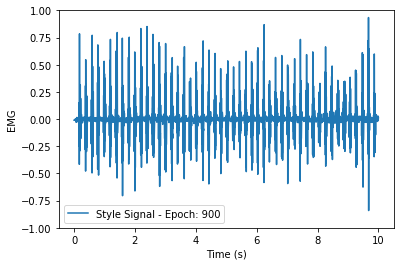

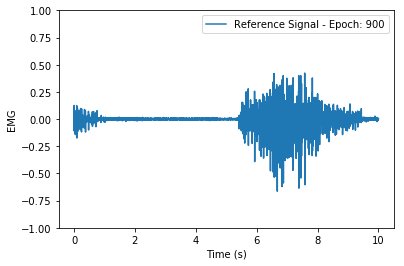

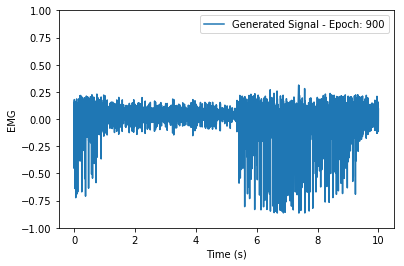

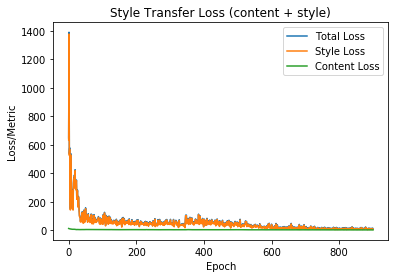

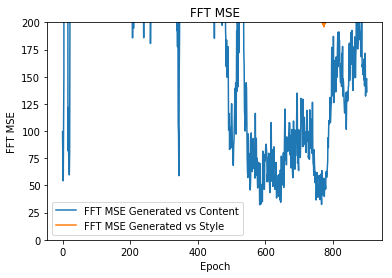

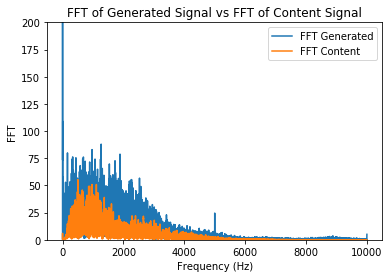

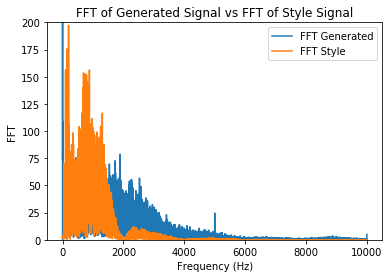

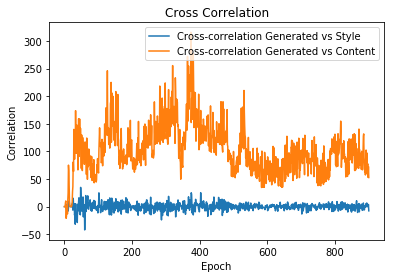

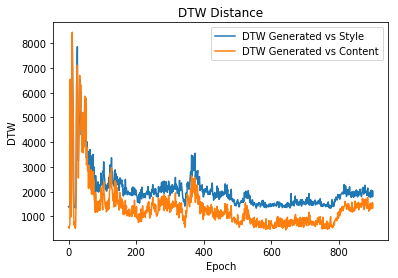

Epoch: 901 
 Content Loss: 3.0145254135131836 
 Style Loss: 5.854249000549316 
 Total Loss: 8.8687744140625
Metrics - Content CC:[48.15341887], FFT:133.17669245805652, DTW:1319.9674821225276
Metrics - Style CC:[2.09743151], FFT:260.5473994148001, DTW:1781.6668688981579
Epoch: 902 
 Content Loss: 2.995443820953369 
 Style Loss: 11.820630073547363 
 Total Loss: 14.816073417663574
Metrics - Content CC:[50.88774472], FFT:114.98162595073654, DTW:1132.094246236194
Metrics - Style CC:[3.99570646], FFT:253.4309013270176, DTW:1670.9228569882214
Epoch: 903 
 Content Loss: 3.0176949501037598 
 Style Loss: 5.042749404907227 
 Total Loss: 8.060443878173828
Metrics - Content CC:[67.07794566], FFT:114.15317441183163, DTW:1343.1978084811703
Metrics - Style CC:[-2.79858186], FFT:255.0704094938892, DTW:1714.8294750834093
Epoch: 904 
 Content Loss: 2.999206304550171 
 Style Loss: 11.939823150634766 
 Total Loss: 14.9390287399292
Metrics - Content CC:[83.45335202], FFT:142.35247306873177, DTW:1425.2903100

Epoch: 932 
 Content Loss: 2.9940643310546875 
 Style Loss: 16.851951599121094 
 Total Loss: 19.84601593017578
Metrics - Content CC:[94.06685205], FFT:146.07925962135454, DTW:1655.1679301126708
Metrics - Style CC:[5.26717744], FFT:251.31768975119013, DTW:1955.5414007802158
Epoch: 933 
 Content Loss: 3.0157883167266846 
 Style Loss: 6.887235641479492 
 Total Loss: 9.903023719787598
Metrics - Content CC:[62.84993949], FFT:131.70655159411473, DTW:1307.6369901248768
Metrics - Style CC:[-0.00211318], FFT:224.4420101576597, DTW:1756.124095281812
Epoch: 934 
 Content Loss: 3.0251717567443848 
 Style Loss: 7.1971845626831055 
 Total Loss: 10.222356796264648
Metrics - Content CC:[84.56521236], FFT:131.3220390396643, DTW:1331.865490641342
Metrics - Style CC:[2.2676764], FFT:224.43198544195644, DTW:1826.0183892323541
Epoch: 935 
 Content Loss: 2.960911750793457 
 Style Loss: 12.278496742248535 
 Total Loss: 15.239408493041992
Metrics - Content CC:[92.43563312], FFT:132.89849203627926, DTW:1321.50

Epoch: 963 
 Content Loss: 2.9993557929992676 
 Style Loss: 7.511038303375244 
 Total Loss: 10.510394096374512
Metrics - Content CC:[64.37973755], FFT:165.65893915834764, DTW:1376.7262862802618
Metrics - Style CC:[1.49014883], FFT:256.7232433965752, DTW:2045.6050801787082
Epoch: 964 
 Content Loss: 2.9234981536865234 
 Style Loss: 9.417435646057129 
 Total Loss: 12.340933799743652
Metrics - Content CC:[56.75855977], FFT:127.3601270840292, DTW:1146.3013522723431
Metrics - Style CC:[7.35387943], FFT:246.57449986796374, DTW:2014.0839516967756
Epoch: 965 
 Content Loss: 2.97780442237854 
 Style Loss: 9.075339317321777 
 Total Loss: 12.053143501281738
Metrics - Content CC:[78.84477482], FFT:120.2852536984475, DTW:1272.5807025112183
Metrics - Style CC:[-1.12971813], FFT:247.0037724597322, DTW:1930.2031115838101
Epoch: 966 
 Content Loss: 2.981410503387451 
 Style Loss: 4.374739646911621 
 Total Loss: 7.356150150299072
Metrics - Content CC:[85.80328358], FFT:136.06397452557198, DTW:1241.53930

Epoch: 994 
 Content Loss: 2.921433448791504 
 Style Loss: 12.324152946472168 
 Total Loss: 15.245587348937988
Metrics - Content CC:[67.18303243], FFT:136.6105755478019, DTW:1534.6564334807842
Metrics - Style CC:[5.53436899], FFT:257.6374720119496, DTW:1989.1080738856122
Epoch: 995 
 Content Loss: 2.946167469024658 
 Style Loss: 8.87016773223877 
 Total Loss: 11.816335678100586
Metrics - Content CC:[38.55220794], FFT:158.29498364220314, DTW:1701.5202680453494
Metrics - Style CC:[-2.09174621], FFT:253.1941878744647, DTW:2087.845924044081
Epoch: 996 
 Content Loss: 2.962705135345459 
 Style Loss: 8.179550170898438 
 Total Loss: 11.142255783081055
Metrics - Content CC:[84.43769753], FFT:150.8886102429491, DTW:1628.264696369717
Metrics - Style CC:[6.21960368], FFT:263.4602940058009, DTW:1996.766372596874
Epoch: 997 
 Content Loss: 2.951136350631714 
 Style Loss: 5.826900482177734 
 Total Loss: 8.778037071228027
Metrics - Content CC:[47.66512071], FFT:141.33353482756343, DTW:1501.1827703080

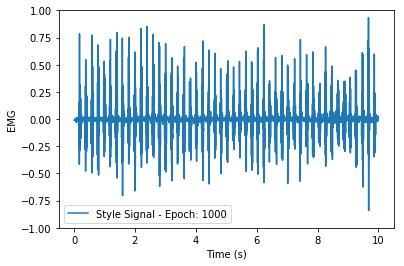

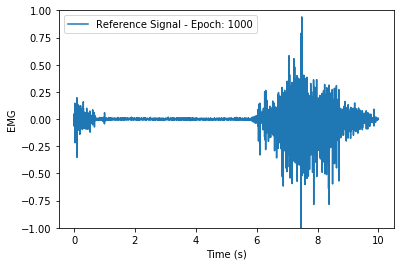

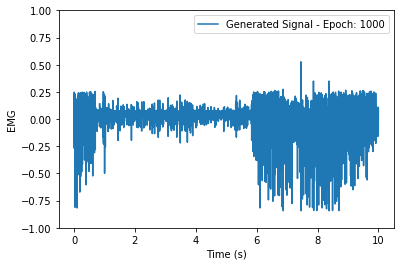

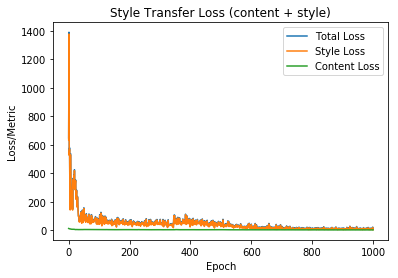

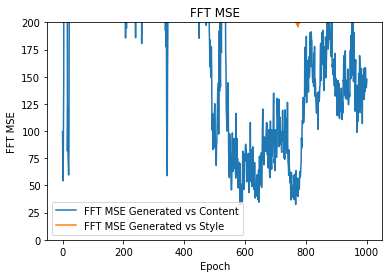

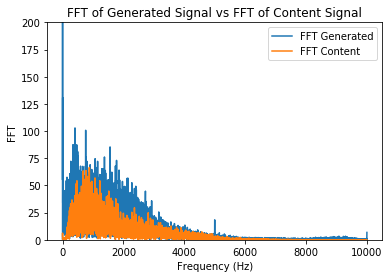

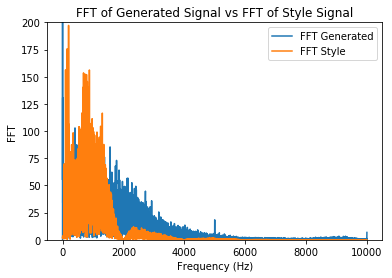

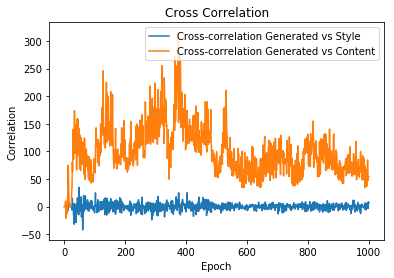

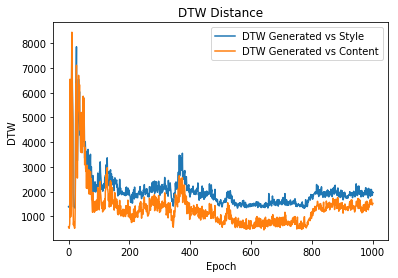

Epoch: 1001 
 Content Loss: 2.9533281326293945 
 Style Loss: 6.26996374130249 
 Total Loss: 9.223291397094727
Metrics - Content CC:[39.25551311], FFT:153.48240329834022, DTW:1516.4470143566496
Metrics - Style CC:[-0.17387701], FFT:265.4511002347519, DTW:2019.991664261269
Epoch: 1002 
 Content Loss: 2.9178378582000732 
 Style Loss: 7.626533031463623 
 Total Loss: 10.544370651245117
Metrics - Content CC:[43.15403267], FFT:135.09152002477555, DTW:1394.4093285737463
Metrics - Style CC:[-4.52205848], FFT:268.2401163232565, DTW:1854.0337219079797
Epoch: 1003 
 Content Loss: 2.881577968597412 
 Style Loss: 17.579269409179688 
 Total Loss: 20.460847854614258
Metrics - Content CC:[41.40582946], FFT:132.27305844666213, DTW:1276.2663895891947
Metrics - Style CC:[3.96571802], FFT:268.1068432649647, DTW:1895.4496776642613
Epoch: 1004 
 Content Loss: 2.8933403491973877 
 Style Loss: 6.728127956390381 
 Total Loss: 9.621468544006348
Metrics - Content CC:[49.18594461], FFT:164.46665487740012, DTW:1582

Epoch: 1031 
 Content Loss: 2.9022793769836426 
 Style Loss: 8.341407775878906 
 Total Loss: 11.24368667602539
Metrics - Content CC:[49.33379823], FFT:91.60249875960301, DTW:1156.7287859124742
Metrics - Style CC:[-3.8281263], FFT:249.70347039793626, DTW:1744.0783852160075
Epoch: 1032 
 Content Loss: 2.8420214653015137 
 Style Loss: 9.856340408325195 
 Total Loss: 12.698362350463867
Metrics - Content CC:[33.27016346], FFT:113.40474935606275, DTW:1384.3115165139154
Metrics - Style CC:[-0.95818408], FFT:265.0092476180778, DTW:1782.0640916590014
Epoch: 1033 
 Content Loss: 2.883188486099243 
 Style Loss: 16.356592178344727 
 Total Loss: 19.23978042602539
Metrics - Content CC:[51.73877397], FFT:110.07154369315083, DTW:1500.170648155136
Metrics - Style CC:[0.34825254], FFT:263.82481818964106, DTW:1989.9402807554643
Epoch: 1034 
 Content Loss: 2.9316699504852295 
 Style Loss: 12.367408752441406 
 Total Loss: 15.299077987670898
Metrics - Content CC:[47.30654849], FFT:100.45359026007802, DTW:12

Epoch: 1061 
 Content Loss: 2.8439674377441406 
 Style Loss: 6.598005294799805 
 Total Loss: 9.441972732543945
Metrics - Content CC:[51.60255816], FFT:127.02101469200738, DTW:1394.9634466396478
Metrics - Style CC:[-3.5517552], FFT:270.86641983123667, DTW:1782.4626083789926
Epoch: 1062 
 Content Loss: 2.91522479057312 
 Style Loss: 8.370930671691895 
 Total Loss: 11.286155700683594
Metrics - Content CC:[56.95610684], FFT:120.67821259187845, DTW:1373.0595907073396
Metrics - Style CC:[-4.73791808], FFT:255.00366791050666, DTW:1765.6119513189553
Epoch: 1063 
 Content Loss: 2.881047010421753 
 Style Loss: 7.80972957611084 
 Total Loss: 10.690776824951172
Metrics - Content CC:[55.63394339], FFT:128.81776156662013, DTW:1343.4146706997706
Metrics - Style CC:[-0.86316542], FFT:257.3711834493085, DTW:1768.6489475709018
Epoch: 1064 
 Content Loss: 2.8716914653778076 
 Style Loss: 8.161910057067871 
 Total Loss: 11.033601760864258
Metrics - Content CC:[61.54358171], FFT:166.52968838449198, DTW:158

Epoch: 1091 
 Content Loss: 2.8498170375823975 
 Style Loss: 15.376720428466797 
 Total Loss: 18.226537704467773
Metrics - Content CC:[83.30722454], FFT:173.77719156607262, DTW:1649.950802172737
Metrics - Style CC:[-1.38990668], FFT:298.62657435578575, DTW:2071.94348251406
Epoch: 1092 
 Content Loss: 2.921126365661621 
 Style Loss: 12.932762145996094 
 Total Loss: 15.853887557983398
Metrics - Content CC:[72.27850921], FFT:178.34296069342608, DTW:1710.696202237879
Metrics - Style CC:[5.39834201], FFT:295.7455174936374, DTW:2175.1508744567386
Epoch: 1093 
 Content Loss: 2.9117438793182373 
 Style Loss: 4.618156909942627 
 Total Loss: 7.529900550842285
Metrics - Content CC:[64.27791218], FFT:153.18465926099313, DTW:1500.412321865533
Metrics - Style CC:[-4.76214995], FFT:281.00359263009557, DTW:1912.761577143122
Epoch: 1094 
 Content Loss: 2.9278066158294678 
 Style Loss: 6.906354904174805 
 Total Loss: 9.834161758422852
Metrics - Content CC:[66.09455652], FFT:189.67164631999853, DTW:1740.

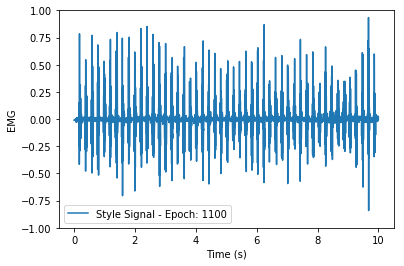

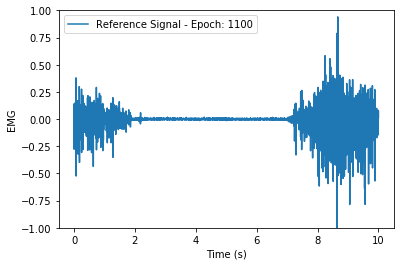

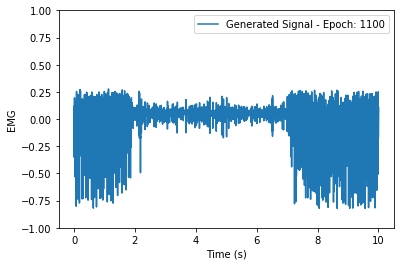

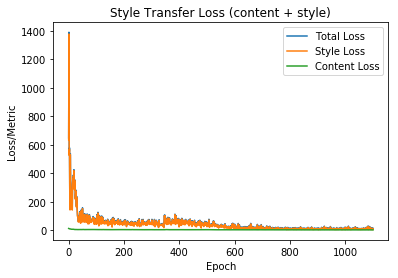

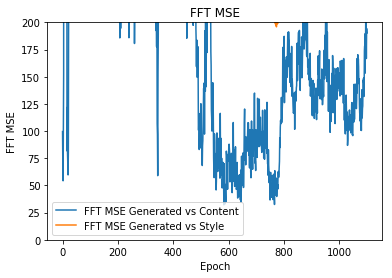

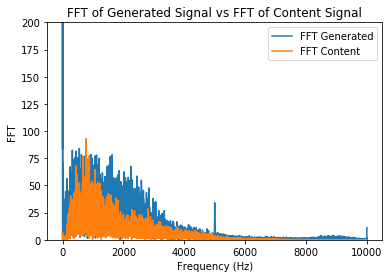

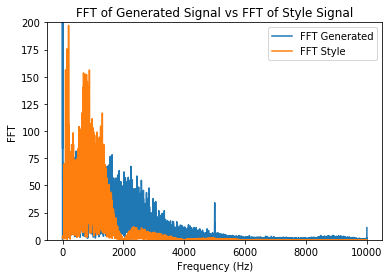

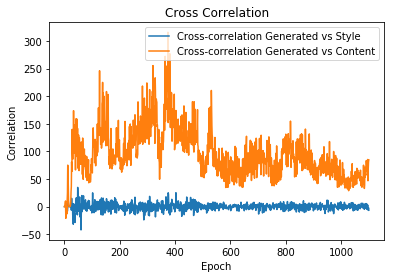

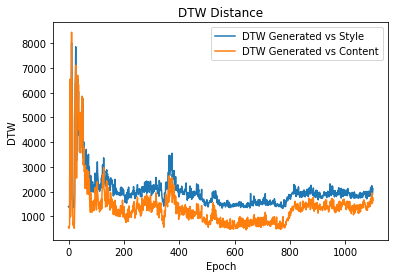

Epoch: 1101 
 Content Loss: 2.821673631668091 
 Style Loss: 5.876763343811035 
 Total Loss: 8.698436737060547
Metrics - Content CC:[85.22152307], FFT:192.89513697635303, DTW:1661.9921691339944
Metrics - Style CC:[1.92251057], FFT:315.9707631779416, DTW:1961.25372113917
Epoch: 1102 
 Content Loss: 2.863300085067749 
 Style Loss: 7.6691694259643555 
 Total Loss: 10.532469749450684
Metrics - Content CC:[70.41325175], FFT:167.8766322739874, DTW:1515.6416731613183
Metrics - Style CC:[5.482552], FFT:285.82682889965577, DTW:1881.4787162468344
Epoch: 1103 
 Content Loss: 2.819669246673584 
 Style Loss: 8.958385467529297 
 Total Loss: 11.778055191040039
Metrics - Content CC:[54.02679455], FFT:213.2811264428307, DTW:1837.8881301052609
Metrics - Style CC:[-15.31208162], FFT:310.1354499423271, DTW:2254.5712614029344
Epoch: 1104 
 Content Loss: 2.9021482467651367 
 Style Loss: 9.59085750579834 
 Total Loss: 12.493005752563477
Metrics - Content CC:[67.07232707], FFT:171.1734138510132, DTW:1507.30147

Epoch: 1132 
 Content Loss: 2.7307229042053223 
 Style Loss: 5.218666076660156 
 Total Loss: 7.9493889808654785
Metrics - Content CC:[56.95596823], FFT:112.78195859937551, DTW:1473.8609491281973
Metrics - Style CC:[0.85743862], FFT:231.3098599260672, DTW:2083.2906511511524
Epoch: 1133 
 Content Loss: 2.836165428161621 
 Style Loss: 7.581692695617676 
 Total Loss: 10.417858123779297
Metrics - Content CC:[44.62568442], FFT:108.76425710172818, DTW:1339.7590405441724
Metrics - Style CC:[-2.65294324], FFT:226.81130891921737, DTW:1933.254001315042
Epoch: 1134 
 Content Loss: 2.8150150775909424 
 Style Loss: 4.429453372955322 
 Total Loss: 7.244468688964844
Metrics - Content CC:[68.05540285], FFT:103.08933629116221, DTW:1510.852569167831
Metrics - Style CC:[-1.94444054], FFT:225.68344421402122, DTW:2050.882447128972
Epoch: 1135 
 Content Loss: 2.813493490219116 
 Style Loss: 5.407546043395996 
 Total Loss: 8.221039772033691
Metrics - Content CC:[71.47479678], FFT:102.53310424533584, DTW:1422.

Epoch: 1162 
 Content Loss: 2.8323559761047363 
 Style Loss: 9.074469566345215 
 Total Loss: 11.90682601928711
Metrics - Content CC:[107.21716431], FFT:179.31879968489258, DTW:1681.194160070434
Metrics - Style CC:[-3.01508491], FFT:284.6623986655999, DTW:2171.632939547452
Epoch: 1163 
 Content Loss: 2.67154860496521 
 Style Loss: 5.898873329162598 
 Total Loss: 8.570422172546387
Metrics - Content CC:[56.3812217], FFT:201.73623111344673, DTW:1657.0082389999807
Metrics - Style CC:[10.90690188], FFT:294.00954228748293, DTW:2297.534698920514
Epoch: 1164 
 Content Loss: 2.8024704456329346 
 Style Loss: 4.697079181671143 
 Total Loss: 7.499549865722656
Metrics - Content CC:[52.72831847], FFT:179.1350863163053, DTW:1641.347998163413
Metrics - Style CC:[3.18459155], FFT:281.79202580520865, DTW:2090.0519184696673
Epoch: 1165 
 Content Loss: 2.79422926902771 
 Style Loss: 6.082116603851318 
 Total Loss: 8.87634563446045
Metrics - Content CC:[76.58141926], FFT:197.5552821508169, DTW:1620.52994097

Epoch: 1192 
 Content Loss: 2.7291688919067383 
 Style Loss: 12.854978561401367 
 Total Loss: 15.584147453308105
Metrics - Content CC:[83.95698243], FFT:140.27362449885538, DTW:1473.7173695890651
Metrics - Style CC:[11.14804761], FFT:239.93465954125912, DTW:1890.6372526181526
Epoch: 1193 
 Content Loss: 2.6675705909729004 
 Style Loss: 9.381421089172363 
 Total Loss: 12.048992156982422
Metrics - Content CC:[61.30646685], FFT:174.66685295689624, DTW:1600.36850479386
Metrics - Style CC:[7.45610897], FFT:251.82292293886866, DTW:2000.3122474412382
Epoch: 1194 
 Content Loss: 2.6520843505859375 
 Style Loss: 11.00185489654541 
 Total Loss: 13.653940200805664
Metrics - Content CC:[89.25175182], FFT:188.07225416148003, DTW:1652.2129721774518
Metrics - Style CC:[12.38112987], FFT:277.59145835890877, DTW:2104.3822320123913
Epoch: 1195 
 Content Loss: 2.636225461959839 
 Style Loss: 7.995124816894531 
 Total Loss: 10.63135051727295
Metrics - Content CC:[75.90995722], FFT:148.99642299216558, DTW:

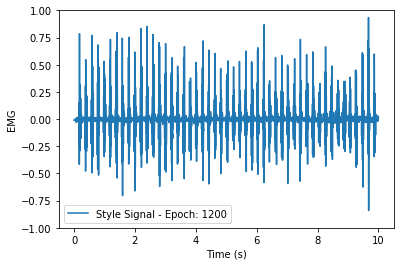

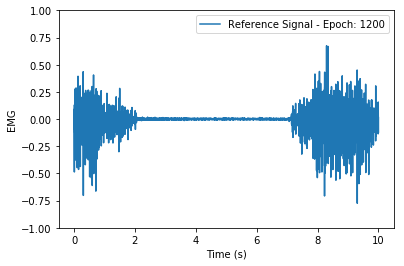

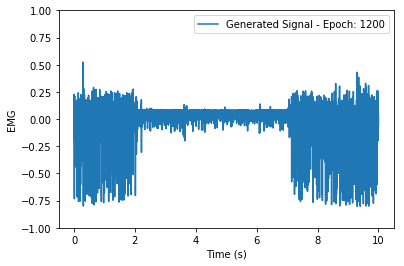

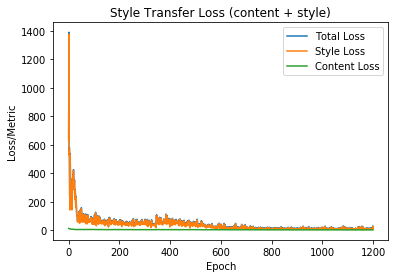

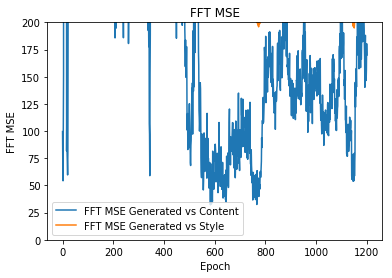

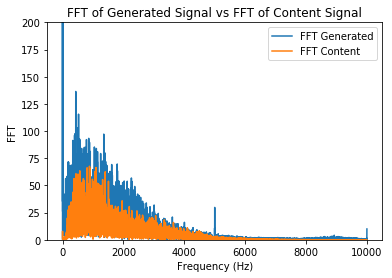

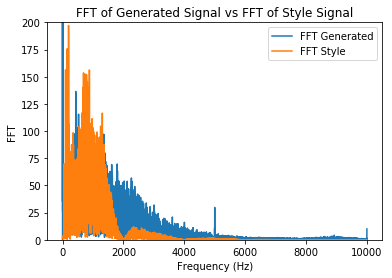

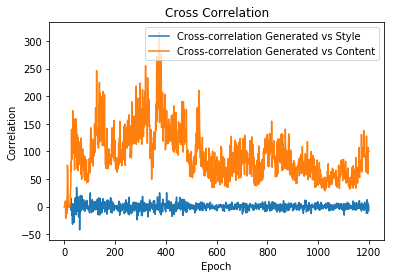

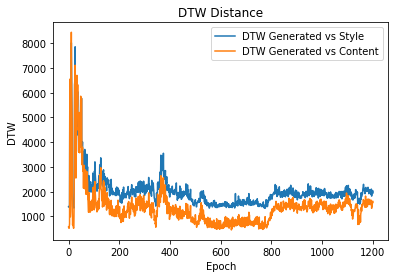

Epoch: 1201 
 Content Loss: 2.6388232707977295 
 Style Loss: 8.61964225769043 
 Total Loss: 11.258465766906738
Metrics - Content CC:[92.53123729], FFT:162.46328790350955, DTW:1611.2400936901656
Metrics - Style CC:[5.51864935], FFT:268.3711812856266, DTW:2020.8594871662995
Epoch: 1202 
 Content Loss: 2.6497321128845215 
 Style Loss: 10.71075439453125 
 Total Loss: 13.36048698425293
Metrics - Content CC:[78.2807201], FFT:159.24832663086758, DTW:1371.0139550678623
Metrics - Style CC:[-0.66990348], FFT:264.89068559909714, DTW:1920.6614457722212
Epoch: 1203 
 Content Loss: 2.631481409072876 
 Style Loss: 9.874143600463867 
 Total Loss: 12.505624771118164
Metrics - Content CC:[60.14246915], FFT:165.4073847376907, DTW:1417.5279503011159
Metrics - Style CC:[4.90208347], FFT:257.5265999358606, DTW:1848.3428252905
Epoch: 1204 
 Content Loss: 2.60135817527771 
 Style Loss: 12.004749298095703 
 Total Loss: 14.606107711791992
Metrics - Content CC:[84.22153478], FFT:140.29555901090578, DTW:1272.6118

Epoch: 1232 
 Content Loss: 2.6505939960479736 
 Style Loss: 11.250123977661133 
 Total Loss: 13.900716781616211
Metrics - Content CC:[54.43911178], FFT:145.83051184021383, DTW:1512.2371624182401
Metrics - Style CC:[1.72832773], FFT:269.2185843932333, DTW:2000.0774990085183
Epoch: 1233 
 Content Loss: 2.662029504776001 
 Style Loss: 7.601177215576172 
 Total Loss: 10.263206481933594
Metrics - Content CC:[42.51386416], FFT:103.89886723722843, DTW:1204.204129767456
Metrics - Style CC:[0.14355521], FFT:256.9929929458066, DTW:1810.0834370814375
Epoch: 1234 
 Content Loss: 2.6507160663604736 
 Style Loss: 6.272750377655029 
 Total Loss: 8.923466682434082
Metrics - Content CC:[73.6227178], FFT:131.68676702505047, DTW:1441.6305208565518
Metrics - Style CC:[0.41832301], FFT:257.2210881574743, DTW:2018.8480852032972
Epoch: 1235 
 Content Loss: 2.700054168701172 
 Style Loss: 19.435476303100586 
 Total Loss: 22.135530471801758
Metrics - Content CC:[56.58597466], FFT:106.84212187115247, DTW:1229.

Epoch: 1263 
 Content Loss: 2.659517765045166 
 Style Loss: 7.792553901672363 
 Total Loss: 10.452072143554688
Metrics - Content CC:[58.39271308], FFT:141.3590962556389, DTW:1683.0993506555744
Metrics - Style CC:[-7.27975516], FFT:240.00049525769379, DTW:2004.3814675046397
Epoch: 1264 
 Content Loss: 2.6352288722991943 
 Style Loss: 11.268726348876953 
 Total Loss: 13.903955459594727
Metrics - Content CC:[74.02921478], FFT:169.1123100659035, DTW:1616.5104948100354
Metrics - Style CC:[-2.64070254], FFT:268.99947756962763, DTW:2171.4384316763503
Epoch: 1265 
 Content Loss: 2.6191816329956055 
 Style Loss: 9.825570106506348 
 Total Loss: 12.444751739501953
Metrics - Content CC:[83.26202775], FFT:142.62638373063095, DTW:1648.3173047503733
Metrics - Style CC:[5.66884982], FFT:246.9428054585838, DTW:2024.3909520425868
Epoch: 1266 
 Content Loss: 2.5770037174224854 
 Style Loss: 5.0212531089782715 
 Total Loss: 7.598257541656494
Metrics - Content CC:[66.80897522], FFT:150.2835481062731, DTW:1

Epoch: 1293 
 Content Loss: 2.6158246994018555 
 Style Loss: 5.11411714553833 
 Total Loss: 7.729941368103027
Metrics - Content CC:[81.1623173], FFT:144.7129178921869, DTW:1354.3247450391095
Metrics - Style CC:[-0.37808523], FFT:234.3711872636628, DTW:2069.531130261369
Epoch: 1294 
 Content Loss: 2.691187620162964 
 Style Loss: 8.494946479797363 
 Total Loss: 11.186134338378906
Metrics - Content CC:[112.37522598], FFT:126.0697077753806, DTW:1331.6029831186338
Metrics - Style CC:[0.150732], FFT:230.52687427435038, DTW:1906.2982287685634
Epoch: 1295 
 Content Loss: 2.5347979068756104 
 Style Loss: 8.466827392578125 
 Total Loss: 11.001625061035156
Metrics - Content CC:[57.02940595], FFT:129.7146683105891, DTW:1230.680368045078
Metrics - Style CC:[0.97877101], FFT:229.90853671300385, DTW:1759.6418709603736
Epoch: 1296 
 Content Loss: 2.533731460571289 
 Style Loss: 9.373900413513184 
 Total Loss: 11.907631874084473
Metrics - Content CC:[96.4340005], FFT:130.1140037484369, DTW:1326.0769899

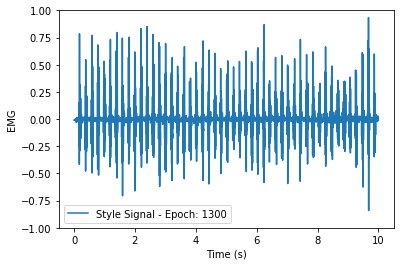

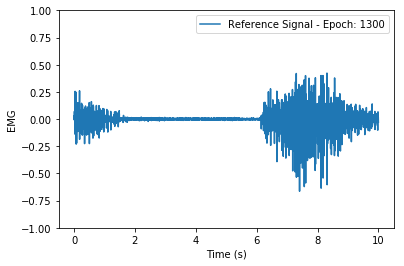

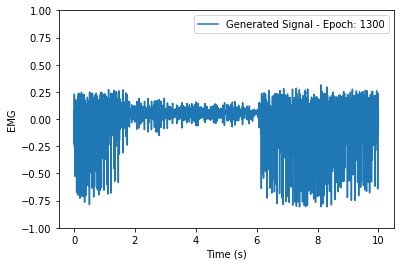

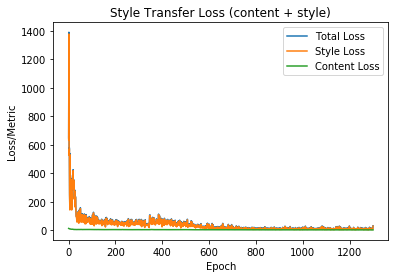

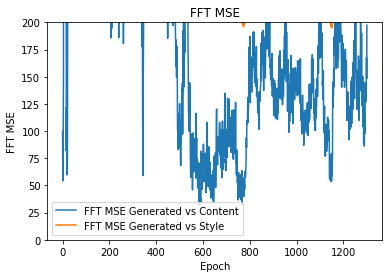

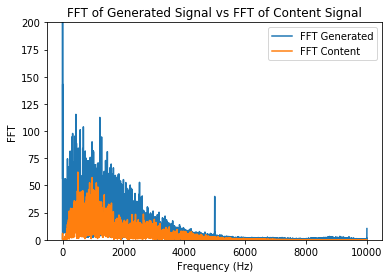

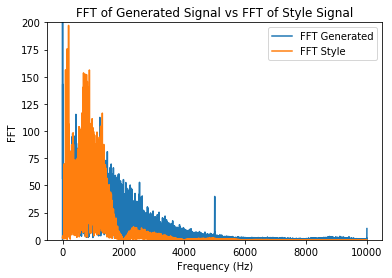

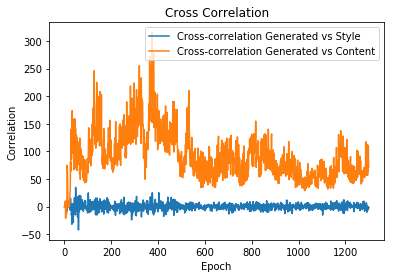

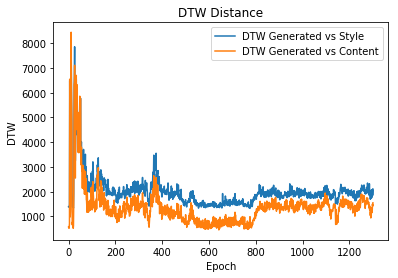

Epoch: 1301 
 Content Loss: 2.5770974159240723 
 Style Loss: 8.36707592010498 
 Total Loss: 10.944173812866211
Metrics - Content CC:[88.66259149], FFT:152.0513390021871, DTW:1464.9706665613505
Metrics - Style CC:[-0.62151777], FFT:260.2599515210191, DTW:1959.1668527059298
Epoch: 1302 
 Content Loss: 2.5861616134643555 
 Style Loss: 8.978460311889648 
 Total Loss: 11.564621925354004
Metrics - Content CC:[64.03213903], FFT:192.3650134554954, DTW:1605.7327764039997
Metrics - Style CC:[-5.55997629], FFT:277.0403998762144, DTW:1956.194619758053
Epoch: 1303 
 Content Loss: 2.524667739868164 
 Style Loss: 9.834643363952637 
 Total Loss: 12.3593111038208
Metrics - Content CC:[95.57085177], FFT:213.44432109771748, DTW:1734.6301082023463
Metrics - Style CC:[-3.85865168], FFT:291.0296516957167, DTW:2146.905254444617
Epoch: 1304 
 Content Loss: 2.5635454654693604 
 Style Loss: 10.639253616333008 
 Total Loss: 13.202798843383789
Metrics - Content CC:[81.1423039], FFT:166.706159196113, DTW:1473.5577

Epoch: 1331 
 Content Loss: 2.588785409927368 
 Style Loss: 14.320530891418457 
 Total Loss: 16.909317016601562
Metrics - Content CC:[67.61643232], FFT:120.65647252481817, DTW:1418.7940749988743
Metrics - Style CC:[1.96948303], FFT:254.83809289127623, DTW:1812.776496877137
Epoch: 1332 
 Content Loss: 2.685620069503784 
 Style Loss: 9.523496627807617 
 Total Loss: 12.20911693572998
Metrics - Content CC:[59.32077123], FFT:100.15896298049813, DTW:1327.8663800693973
Metrics - Style CC:[7.19366435], FFT:244.25740005353381, DTW:1797.0215825520568
Epoch: 1333 
 Content Loss: 2.6421685218811035 
 Style Loss: 7.584351539611816 
 Total Loss: 10.226520538330078
Metrics - Content CC:[39.52857399], FFT:103.61272572649962, DTW:1237.0642275334785
Metrics - Style CC:[-5.28604191], FFT:248.21458856723763, DTW:1900.8036169802426
Epoch: 1334 
 Content Loss: 2.597529172897339 
 Style Loss: 9.229776382446289 
 Total Loss: 11.827305793762207
Metrics - Content CC:[61.55805218], FFT:86.67071722209246, DTW:130

Epoch: 1362 
 Content Loss: 2.576169967651367 
 Style Loss: 4.6639628410339355 
 Total Loss: 7.240132808685303
Metrics - Content CC:[91.90973248], FFT:119.21260752850688, DTW:1365.7367976771143
Metrics - Style CC:[-4.3320359], FFT:255.662420918629, DTW:1877.7822380969703
Epoch: 1363 
 Content Loss: 2.582003593444824 
 Style Loss: 5.8396100997924805 
 Total Loss: 8.421613693237305
Metrics - Content CC:[64.04365161], FFT:96.7845424755591, DTW:1138.6532279398398
Metrics - Style CC:[-4.06898213], FFT:242.80895672535712, DTW:1738.7504517388245
Epoch: 1364 
 Content Loss: 2.621786117553711 
 Style Loss: 5.555278778076172 
 Total Loss: 8.177064895629883
Metrics - Content CC:[74.00076303], FFT:113.85582921827827, DTW:1446.0314400431814
Metrics - Style CC:[1.89471695], FFT:249.3828138481513, DTW:1921.4202916932222
Epoch: 1365 
 Content Loss: 2.575805902481079 
 Style Loss: 9.457113265991211 
 Total Loss: 12.032918930053711
Metrics - Content CC:[96.43148923], FFT:112.15110508726703, DTW:1410.552

Epoch: 1393 
 Content Loss: 2.5639357566833496 
 Style Loss: 8.30848503112793 
 Total Loss: 10.872421264648438
Metrics - Content CC:[68.51878812], FFT:134.79764743610812, DTW:1385.8305116998727
Metrics - Style CC:[5.46555491], FFT:245.74586772046325, DTW:1914.2793388657972
Epoch: 1394 
 Content Loss: 2.563735246658325 
 Style Loss: 6.155462265014648 
 Total Loss: 8.719197273254395
Metrics - Content CC:[51.69812181], FFT:106.062224111884, DTW:1140.3560255908112
Metrics - Style CC:[1.48640281], FFT:225.9473737971505, DTW:1753.0251106961257
Epoch: 1395 
 Content Loss: 2.5738370418548584 
 Style Loss: 6.538699150085449 
 Total Loss: 9.112536430358887
Metrics - Content CC:[51.25215602], FFT:106.49468070075815, DTW:1100.8977615595923
Metrics - Style CC:[0.05748474], FFT:227.0958173863351, DTW:1703.4871745205003
Epoch: 1396 
 Content Loss: 2.602189779281616 
 Style Loss: 7.0742621421813965 
 Total Loss: 9.676451683044434
Metrics - Content CC:[66.79425001], FFT:103.51211930333392, DTW:1256.634

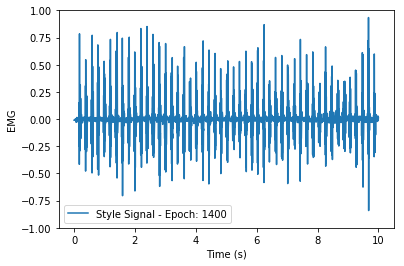

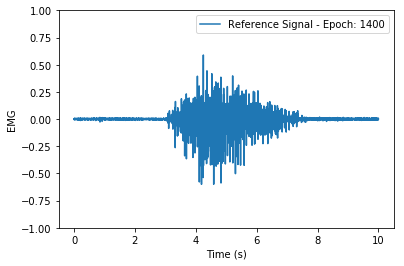

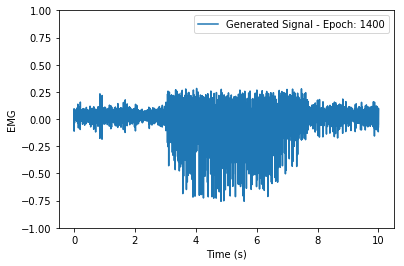

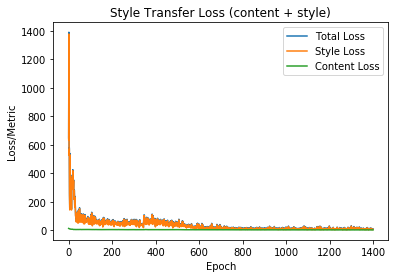

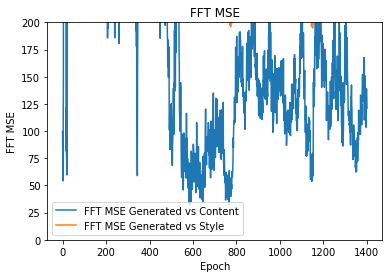

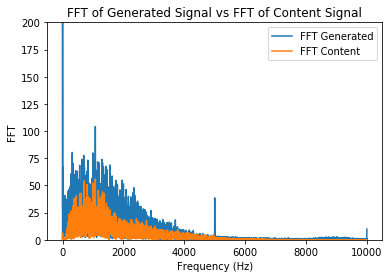

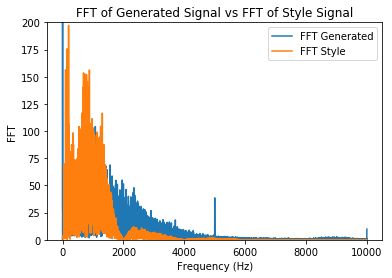

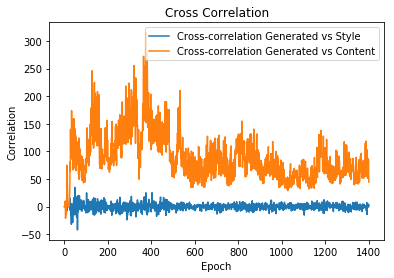

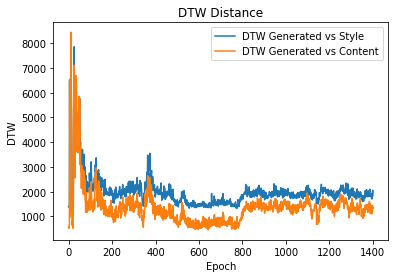

Epoch: 1401 
 Content Loss: 2.5054290294647217 
 Style Loss: 6.870458602905273 
 Total Loss: 9.375887870788574
Metrics - Content CC:[45.28757423], FFT:119.55442803703659, DTW:1485.9421615921608
Metrics - Style CC:[1.6024704], FFT:238.61209626493786, DTW:2062.2132583729945
Epoch: 1402 
 Content Loss: 2.584667444229126 
 Style Loss: 6.159695625305176 
 Total Loss: 8.744362831115723
Metrics - Content CC:[62.81847026], FFT:95.67779743843849, DTW:1197.4242763366742
Metrics - Style CC:[-2.83269491], FFT:218.60987300015054, DTW:1775.2719096984922
Epoch: 1403 
 Content Loss: 2.5573842525482178 
 Style Loss: 7.530658721923828 
 Total Loss: 10.088043212890625
Metrics - Content CC:[58.24246615], FFT:101.99250162343209, DTW:1203.4226552447126
Metrics - Style CC:[2.98032663], FFT:228.78223141270794, DTW:1849.1296906769414
Epoch: 1404 
 Content Loss: 2.5367419719696045 
 Style Loss: 9.923789978027344 
 Total Loss: 12.460532188415527
Metrics - Content CC:[57.53356279], FFT:95.92733727365446, DTW:1151

Epoch: 1432 
 Content Loss: 2.5675508975982666 
 Style Loss: 5.818856716156006 
 Total Loss: 8.386407852172852
Metrics - Content CC:[53.29570699], FFT:131.74858385801565, DTW:1390.8403108942273
Metrics - Style CC:[8.5154539], FFT:218.60087473771318, DTW:1884.7710689218286
Epoch: 1433 
 Content Loss: 2.5230720043182373 
 Style Loss: 4.069266319274902 
 Total Loss: 6.592338562011719
Metrics - Content CC:[56.36995325], FFT:151.63026029585188, DTW:1376.5218270018158
Metrics - Style CC:[-7.21542622], FFT:229.66771361492417, DTW:2118.310017858254
Epoch: 1434 
 Content Loss: 2.5750482082366943 
 Style Loss: 6.672447204589844 
 Total Loss: 9.247495651245117
Metrics - Content CC:[56.85778557], FFT:148.6617866697351, DTW:1431.0796908981538
Metrics - Style CC:[-1.66638893], FFT:227.0375584370762, DTW:2064.9890210840003
Epoch: 1435 
 Content Loss: 2.4935431480407715 
 Style Loss: 11.108802795410156 
 Total Loss: 13.602346420288086
Metrics - Content CC:[50.88170165], FFT:138.86393307402022, DTW:134

Epoch: 1463 
 Content Loss: 2.421072483062744 
 Style Loss: 6.58489990234375 
 Total Loss: 9.005971908569336
Metrics - Content CC:[63.71101548], FFT:105.29124530500071, DTW:1351.551131863628
Metrics - Style CC:[-1.61714754], FFT:234.99111532880818, DTW:1900.0425457320766
Epoch: 1464 
 Content Loss: 2.3897900581359863 
 Style Loss: 8.870573043823242 
 Total Loss: 11.26036262512207
Metrics - Content CC:[64.65047769], FFT:105.76070184228382, DTW:1225.2595035268582
Metrics - Style CC:[-1.09958095], FFT:238.18413357592488, DTW:1702.516529085077
Epoch: 1465 
 Content Loss: 2.429422616958618 
 Style Loss: 5.121854305267334 
 Total Loss: 7.551277160644531
Metrics - Content CC:[98.53524669], FFT:123.51229637353266, DTW:1463.231053725223
Metrics - Style CC:[-0.5817331], FFT:237.3584344971232, DTW:1923.5546164052496
Epoch: 1466 
 Content Loss: 2.4146459102630615 
 Style Loss: 9.240468978881836 
 Total Loss: 11.655115127563477
Metrics - Content CC:[75.3550123], FFT:143.3083779453009, DTW:1551.9583

Epoch: 1493 
 Content Loss: 2.4025611877441406 
 Style Loss: 9.024740219116211 
 Total Loss: 11.427301406860352
Metrics - Content CC:[58.11235964], FFT:117.4770667036162, DTW:1512.1934375264586
Metrics - Style CC:[1.49027287], FFT:237.9965148072055, DTW:2021.461928659291
Epoch: 1494 
 Content Loss: 2.4190738201141357 
 Style Loss: 9.157756805419922 
 Total Loss: 11.576830863952637
Metrics - Content CC:[59.38028956], FFT:110.71877824857974, DTW:1430.3114348229258
Metrics - Style CC:[-6.7190178], FFT:238.7943010103448, DTW:1904.8618612198484
Epoch: 1495 
 Content Loss: 2.37288236618042 
 Style Loss: 5.927577972412109 
 Total Loss: 8.300460815429688
Metrics - Content CC:[64.72079742], FFT:111.70294051084215, DTW:1427.308064215382
Metrics - Style CC:[-9.32060442], FFT:239.49172067324653, DTW:1869.7619416221514
Epoch: 1496 
 Content Loss: 2.348470449447632 
 Style Loss: 7.432600021362305 
 Total Loss: 9.781070709228516
Metrics - Content CC:[61.56718836], FFT:113.87998260748756, DTW:1510.455

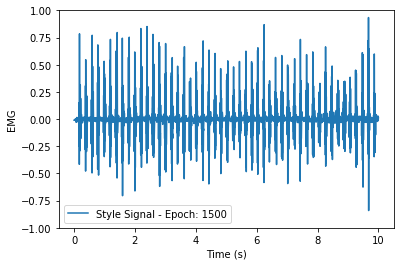

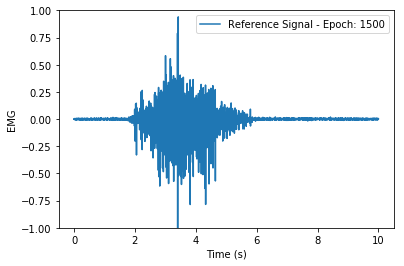

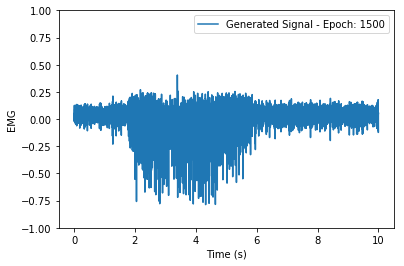

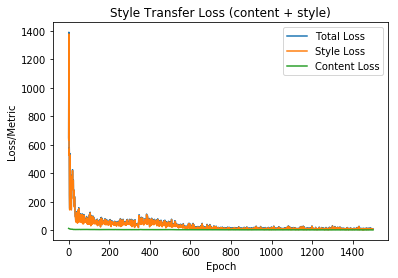

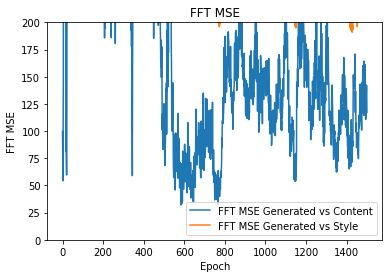

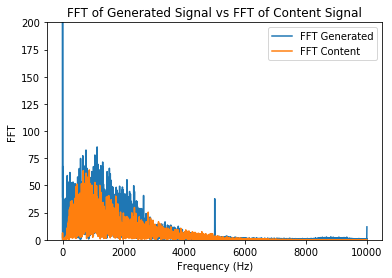

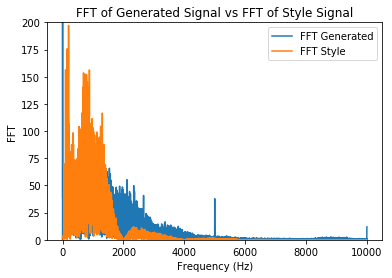

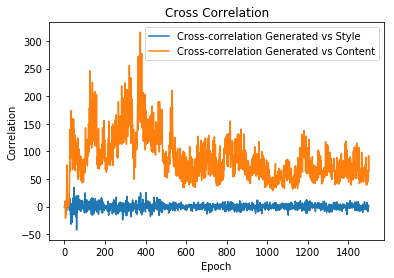

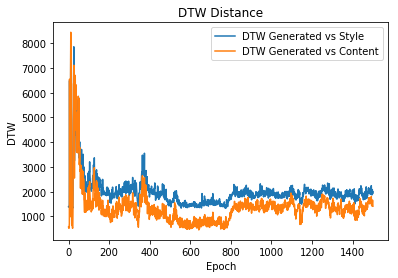

Epoch: 1501 
 Content Loss: 2.4563255310058594 
 Style Loss: 5.2471208572387695 
 Total Loss: 7.703446388244629
Metrics - Content CC:[49.40994684], FFT:135.58521126870426, DTW:1594.7391259129638
Metrics - Style CC:[0.6548863], FFT:248.31321360150872, DTW:2017.0007501937864
Epoch: 1502 
 Content Loss: 2.4426448345184326 
 Style Loss: 7.877358436584473 
 Total Loss: 10.320003509521484
Metrics - Content CC:[100.39196683], FFT:131.74469972642993, DTW:1481.1285563195593
Metrics - Style CC:[6.48099861], FFT:246.14806030957044, DTW:1963.175111373732
Epoch: 1503 
 Content Loss: 2.464948892593384 
 Style Loss: 3.5611443519592285 
 Total Loss: 6.026093482971191
Metrics - Content CC:[78.59886101], FFT:154.55245157839585, DTW:1644.110323210326
Metrics - Style CC:[4.5821082], FFT:253.8191446475015, DTW:2090.33871688896
Epoch: 1504 
 Content Loss: 2.4183509349823 
 Style Loss: 6.07023811340332 
 Total Loss: 8.4885892868042
Metrics - Content CC:[64.01656489], FFT:156.0734564466741, DTW:1670.517905482

Epoch: 1532 
 Content Loss: 2.4644877910614014 
 Style Loss: 7.54133415222168 
 Total Loss: 10.00582218170166
Metrics - Content CC:[101.78404872], FFT:105.33018243324095, DTW:1555.0876634504627
Metrics - Style CC:[-6.7121868], FFT:221.55670672808284, DTW:2015.922161130216
Epoch: 1533 
 Content Loss: 2.5075690746307373 
 Style Loss: 11.170701026916504 
 Total Loss: 13.67827033996582
Metrics - Content CC:[70.01176978], FFT:79.34332199903831, DTW:1156.9840791265026
Metrics - Style CC:[3.66877442], FFT:208.5801142095374, DTW:1666.2756709938767
Epoch: 1534 
 Content Loss: 2.4661803245544434 
 Style Loss: 7.124148368835449 
 Total Loss: 9.590328216552734
Metrics - Content CC:[49.92551701], FFT:63.636309128950806, DTW:1005.2935065295802
Metrics - Style CC:[-3.16608313], FFT:194.92318025404916, DTW:1668.7581691190562
Epoch: 1535 
 Content Loss: 2.474946975708008 
 Style Loss: 4.6848063468933105 
 Total Loss: 7.159753322601318
Metrics - Content CC:[48.98952486], FFT:60.787874411505406, DTW:871.

Epoch: 1563 
 Content Loss: 2.3229026794433594 
 Style Loss: 11.32984447479248 
 Total Loss: 13.652746200561523
Metrics - Content CC:[58.1913101], FFT:60.41016547514991, DTW:1167.6400334182908
Metrics - Style CC:[3.13395904], FFT:207.9760124505208, DTW:1708.073407674867
Epoch: 1564 
 Content Loss: 2.37636661529541 
 Style Loss: 9.664531707763672 
 Total Loss: 12.040898323059082
Metrics - Content CC:[80.24219599], FFT:81.81585219628926, DTW:1206.0146200844963
Metrics - Style CC:[4.91895872], FFT:212.96222488293807, DTW:1857.694689249323
Epoch: 1565 
 Content Loss: 2.435783624649048 
 Style Loss: 3.9201111793518066 
 Total Loss: 6.355895042419434
Metrics - Content CC:[89.08970085], FFT:83.33662503972114, DTW:1240.4141233550988
Metrics - Style CC:[8.2603085], FFT:209.0958681894612, DTW:1726.8740823887354
Epoch: 1566 
 Content Loss: 2.374506950378418 
 Style Loss: 8.252961158752441 
 Total Loss: 10.62746810913086
Metrics - Content CC:[60.51797525], FFT:85.04010784495263, DTW:1407.326116228

Epoch: 1594 
 Content Loss: 2.3705525398254395 
 Style Loss: 7.9168901443481445 
 Total Loss: 10.287443161010742
Metrics - Content CC:[85.07324041], FFT:106.67816738543144, DTW:1407.4477812693071
Metrics - Style CC:[-1.36174962], FFT:210.644745018774, DTW:1941.9172385681643
Epoch: 1595 
 Content Loss: 2.3103203773498535 
 Style Loss: 15.231334686279297 
 Total Loss: 17.541654586791992
Metrics - Content CC:[101.39078887], FFT:107.32328058574123, DTW:1430.5956225505279
Metrics - Style CC:[-4.25085011], FFT:210.61932855457022, DTW:1901.3904104081491
Epoch: 1596 
 Content Loss: 2.3330295085906982 
 Style Loss: 8.819625854492188 
 Total Loss: 11.152655601501465
Metrics - Content CC:[70.02656544], FFT:104.84126791181492, DTW:1361.3684971691841
Metrics - Style CC:[1.28529343], FFT:216.12596003421416, DTW:1881.0878148578306
Epoch: 1597 
 Content Loss: 2.378648042678833 
 Style Loss: 7.580155372619629 
 Total Loss: 9.958803176879883
Metrics - Content CC:[62.78646629], FFT:98.73668516435845, DTW

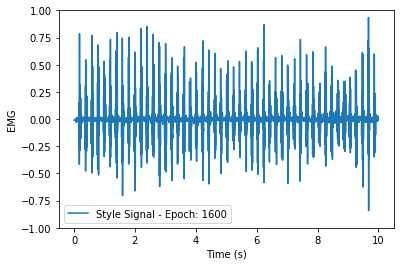

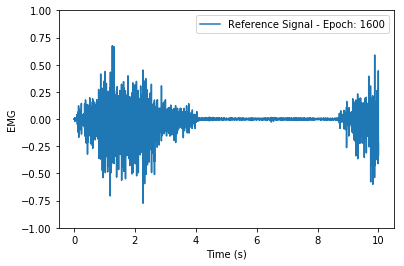

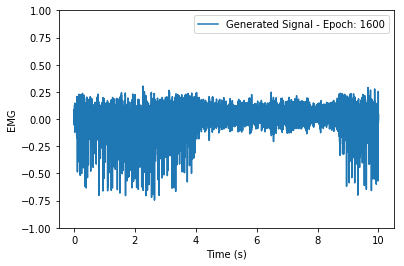

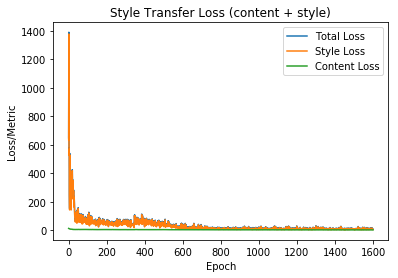

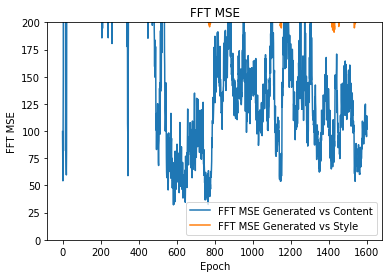

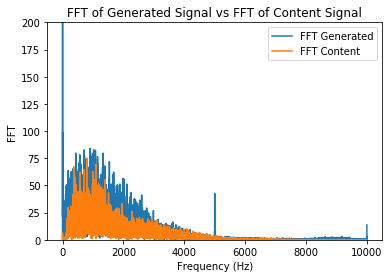

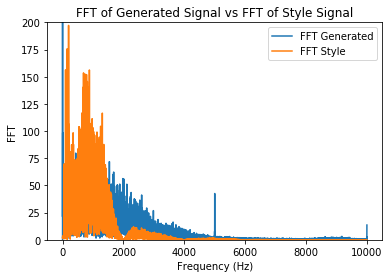

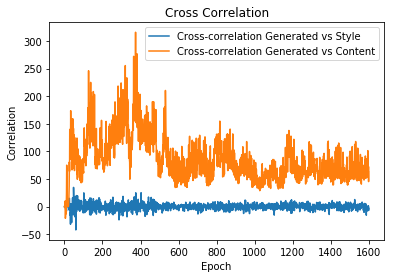

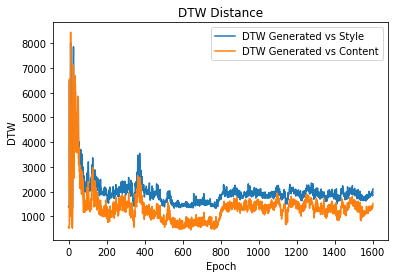

Epoch: 1601 
 Content Loss: 2.4054291248321533 
 Style Loss: 5.731813907623291 
 Total Loss: 8.137243270874023
Metrics - Content CC:[44.22007936], FFT:85.42703406513562, DTW:1147.4797934410187
Metrics - Style CC:[-0.97766197], FFT:207.26631828581364, DTW:1777.927459867601
Epoch: 1602 
 Content Loss: 2.386942148208618 
 Style Loss: 8.278765678405762 
 Total Loss: 10.6657075881958
Metrics - Content CC:[73.76998282], FFT:89.31625233703379, DTW:1450.146527183877
Metrics - Style CC:[-8.99349721], FFT:207.00106396842094, DTW:1972.6714811508155
Epoch: 1603 
 Content Loss: 2.3485591411590576 
 Style Loss: 8.788905143737793 
 Total Loss: 11.13746452331543
Metrics - Content CC:[43.76975422], FFT:93.52481825190057, DTW:1318.8485210414365
Metrics - Style CC:[-1.63620118], FFT:206.82873231962495, DTW:1904.5125851153632
Epoch: 1604 
 Content Loss: 2.3314707279205322 
 Style Loss: 7.699697494506836 
 Total Loss: 10.031167984008789
Metrics - Content CC:[56.95442142], FFT:72.28862475496057, DTW:1206.21

Epoch: 1632 
 Content Loss: 2.298013210296631 
 Style Loss: 11.038311958312988 
 Total Loss: 13.336324691772461
Metrics - Content CC:[57.21583267], FFT:48.42411780161045, DTW:883.9369699511343
Metrics - Style CC:[5.85523719], FFT:200.9512708902858, DTW:1522.915067200905
Epoch: 1633 
 Content Loss: 2.313131332397461 
 Style Loss: 6.309142589569092 
 Total Loss: 8.622274398803711
Metrics - Content CC:[65.52574508], FFT:56.83975645850328, DTW:1032.2748548036054
Metrics - Style CC:[4.13624439], FFT:201.5508503716571, DTW:1811.7882083093486
Epoch: 1634 
 Content Loss: 2.2578721046447754 
 Style Loss: 5.184433460235596 
 Total Loss: 7.442305564880371
Metrics - Content CC:[45.6497039], FFT:51.14953033173371, DTW:935.2906622911272
Metrics - Style CC:[2.3636839], FFT:201.39243349959318, DTW:1664.1736268718794
Epoch: 1635 
 Content Loss: 2.2837204933166504 
 Style Loss: 8.354558944702148 
 Total Loss: 10.63827896118164
Metrics - Content CC:[62.13023251], FFT:50.65732654693875, DTW:1021.942561123

Epoch: 1663 
 Content Loss: 2.244499444961548 
 Style Loss: 4.791558265686035 
 Total Loss: 7.036057472229004
Metrics - Content CC:[66.98870661], FFT:68.00408092249376, DTW:1144.6196770766153
Metrics - Style CC:[0.21638659], FFT:208.8296660314487, DTW:1633.8704655250344
Epoch: 1664 
 Content Loss: 2.346968412399292 
 Style Loss: 5.3406853675842285 
 Total Loss: 7.687653541564941
Metrics - Content CC:[66.57038697], FFT:67.18393809926188, DTW:1075.777713403279
Metrics - Style CC:[2.41964062], FFT:209.6349135418425, DTW:1751.1703931796244
Epoch: 1665 
 Content Loss: 2.257373332977295 
 Style Loss: 4.305815696716309 
 Total Loss: 6.5631890296936035
Metrics - Content CC:[66.24489524], FFT:66.71270182494231, DTW:1203.1765725979994
Metrics - Style CC:[1.14169065], FFT:209.50246234251117, DTW:1625.6943249745873
Epoch: 1666 
 Content Loss: 2.2258503437042236 
 Style Loss: 4.661935806274414 
 Total Loss: 6.887785911560059
Metrics - Content CC:[81.74834039], FFT:77.43574867735042, DTW:1109.570525

Epoch: 1694 
 Content Loss: 2.1254642009735107 
 Style Loss: 6.28977632522583 
 Total Loss: 8.415240287780762
Metrics - Content CC:[50.81554689], FFT:53.84386028339879, DTW:1046.7695422207873
Metrics - Style CC:[1.04274669], FFT:194.65048074456942, DTW:1617.6817164683143
Epoch: 1695 
 Content Loss: 2.133802890777588 
 Style Loss: 10.639470100402832 
 Total Loss: 12.773273468017578
Metrics - Content CC:[60.9076755], FFT:53.232296205365074, DTW:1006.8627193233984
Metrics - Style CC:[1.28134525], FFT:197.10846175803115, DTW:1736.2414706145094
Epoch: 1696 
 Content Loss: 2.1164803504943848 
 Style Loss: 5.840948104858398 
 Total Loss: 7.957428932189941
Metrics - Content CC:[63.72211792], FFT:49.01197035533025, DTW:884.8797219504037
Metrics - Style CC:[-0.76049692], FFT:202.00750114416175, DTW:1704.8166240401151
Epoch: 1697 
 Content Loss: 2.071686029434204 
 Style Loss: 8.05046558380127 
 Total Loss: 10.122151374816895
Metrics - Content CC:[44.93283363], FFT:44.33802407684392, DTW:743.0341

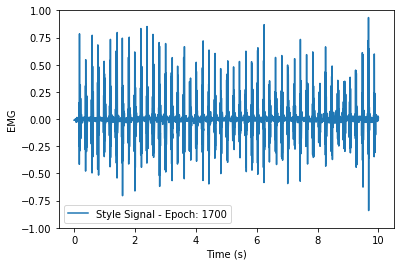

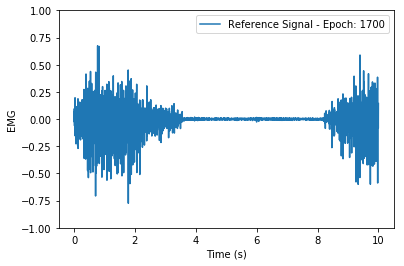

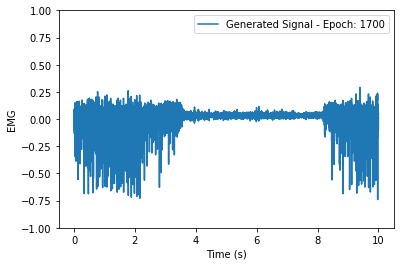

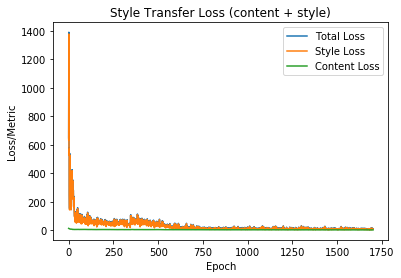

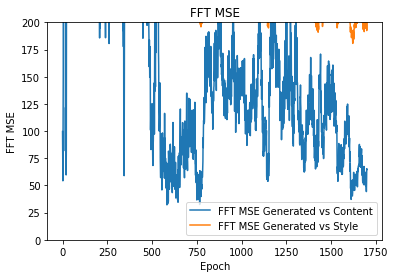

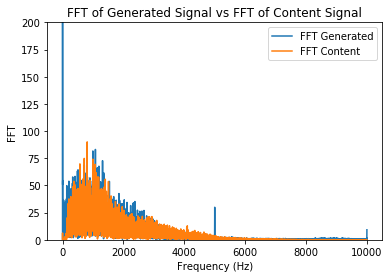

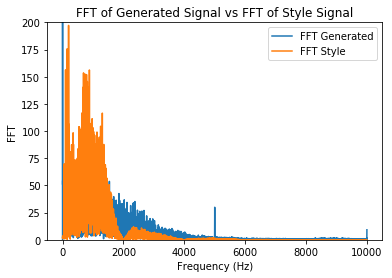

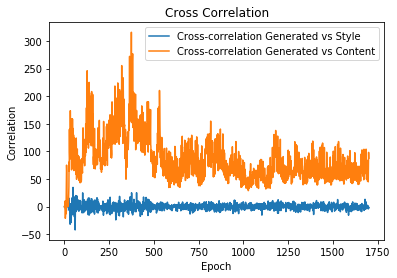

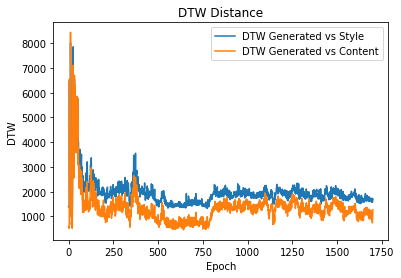

Epoch: 1701 
 Content Loss: 2.11750864982605 
 Style Loss: 5.343736171722412 
 Total Loss: 7.461244106292725
Metrics - Content CC:[61.2622068], FFT:52.564560934817486, DTW:904.2594436626363
Metrics - Style CC:[-1.29604943], FFT:205.47065539231232, DTW:1619.7507472404702
Epoch: 1702 
 Content Loss: 2.142115354537964 
 Style Loss: 5.122021675109863 
 Total Loss: 7.264137268066406
Metrics - Content CC:[78.31910455], FFT:66.65567509017907, DTW:1134.6532540736184
Metrics - Style CC:[3.84927142], FFT:198.62448376998861, DTW:1620.030936008359
Epoch: 1703 
 Content Loss: 2.186821937561035 
 Style Loss: 4.9064412117004395 
 Total Loss: 7.093263149261475
Metrics - Content CC:[61.75050111], FFT:53.190364623914114, DTW:970.6251002489008
Metrics - Style CC:[-2.37200387], FFT:206.2625288135028, DTW:1632.0327490155087
Epoch: 1704 
 Content Loss: 2.1088151931762695 
 Style Loss: 6.858105659484863 
 Total Loss: 8.966920852661133
Metrics - Content CC:[46.20016509], FFT:48.91627597565137, DTW:816.7914291

Epoch: 1732 
 Content Loss: 2.248349905014038 
 Style Loss: 8.255096435546875 
 Total Loss: 10.503446578979492
Metrics - Content CC:[70.20698246], FFT:60.85587439221745, DTW:984.1038527152846
Metrics - Style CC:[1.6796783], FFT:192.37419407718372, DTW:1757.780091417575
Epoch: 1733 
 Content Loss: 2.2000350952148438 
 Style Loss: 9.052952766418457 
 Total Loss: 11.2529878616333
Metrics - Content CC:[93.45665213], FFT:73.7626581936022, DTW:1101.5429303213123
Metrics - Style CC:[-0.81144216], FFT:203.3562594377297, DTW:1774.2149076420183
Epoch: 1734 
 Content Loss: 2.226041793823242 
 Style Loss: 7.203643798828125 
 Total Loss: 9.429685592651367
Metrics - Content CC:[72.30452986], FFT:60.0158802888051, DTW:1127.5039970215232
Metrics - Style CC:[-0.81720853], FFT:195.88133332807192, DTW:1691.9038234060276
Epoch: 1735 
 Content Loss: 2.226388454437256 
 Style Loss: 6.68845796585083 
 Total Loss: 8.914846420288086
Metrics - Content CC:[70.60531883], FFT:56.90529009024257, DTW:1028.6403152559

Epoch: 1763 
 Content Loss: 2.117465019226074 
 Style Loss: 22.75925064086914 
 Total Loss: 24.87671661376953
Metrics - Content CC:[54.79196895], FFT:43.41262669221751, DTW:829.3702132598681
Metrics - Style CC:[-1.52017221], FFT:197.97871977742474, DTW:1497.275242978742
Epoch: 1764 
 Content Loss: 2.0814311504364014 
 Style Loss: 5.9233880043029785 
 Total Loss: 8.0048189163208
Metrics - Content CC:[57.15006408], FFT:43.78583698234861, DTW:868.8818127024614
Metrics - Style CC:[-3.51377808], FFT:197.2473519921591, DTW:1562.2360177663172
Epoch: 1765 
 Content Loss: 2.063422918319702 
 Style Loss: 6.050497055053711 
 Total Loss: 8.113920211791992
Metrics - Content CC:[66.23842383], FFT:54.23484764865555, DTW:1060.6953070319942
Metrics - Style CC:[-3.84897936], FFT:188.39783288671768, DTW:1609.3412637013087
Epoch: 1766 
 Content Loss: 2.0911571979522705 
 Style Loss: 10.378998756408691 
 Total Loss: 12.470155715942383
Metrics - Content CC:[59.21929794], FFT:44.26809437573788, DTW:838.11482

Epoch: 1794 
 Content Loss: 2.030001163482666 
 Style Loss: 6.334763050079346 
 Total Loss: 8.364764213562012
Metrics - Content CC:[83.41252162], FFT:63.86607895776506, DTW:1071.7460433725344
Metrics - Style CC:[-2.68498558], FFT:205.35221536839728, DTW:1808.406430840524
Epoch: 1795 
 Content Loss: 2.067173719406128 
 Style Loss: 14.184008598327637 
 Total Loss: 16.251182556152344
Metrics - Content CC:[71.39824474], FFT:64.10408612569758, DTW:1017.7270586337536
Metrics - Style CC:[-1.5287303], FFT:211.1184992365509, DTW:1659.8518036859027
Epoch: 1796 
 Content Loss: 2.000066041946411 
 Style Loss: 3.329737901687622 
 Total Loss: 5.329803943634033
Metrics - Content CC:[77.82411838], FFT:71.98051961275172, DTW:1065.0634724603015
Metrics - Style CC:[2.6218], FFT:209.72967540778674, DTW:1799.4126153593777
Epoch: 1797 
 Content Loss: 1.9683246612548828 
 Style Loss: 7.673498630523682 
 Total Loss: 9.641822814941406
Metrics - Content CC:[81.44186397], FFT:77.52168905256015, DTW:1193.26056270

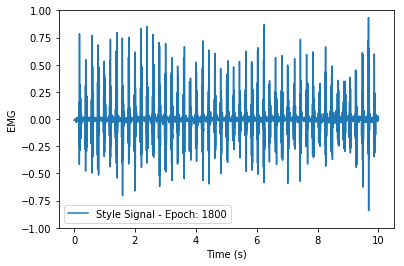

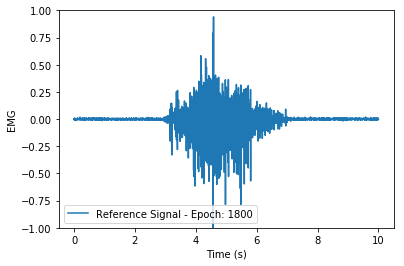

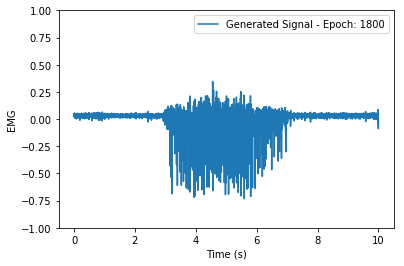

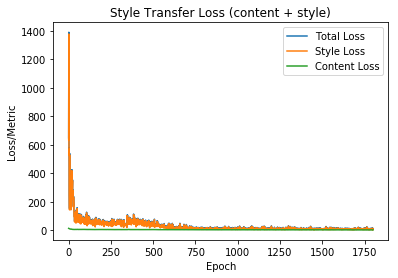

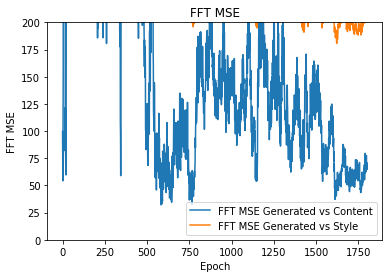

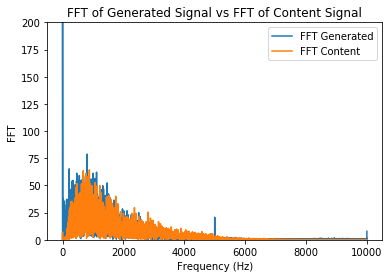

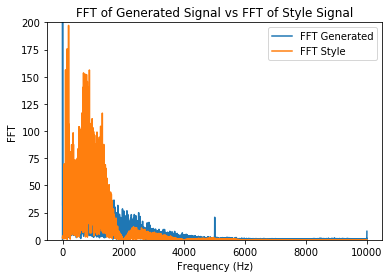

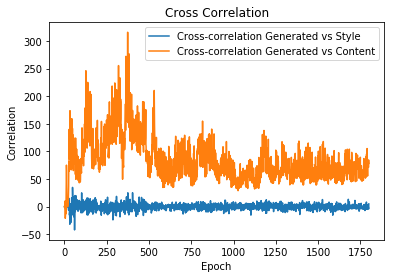

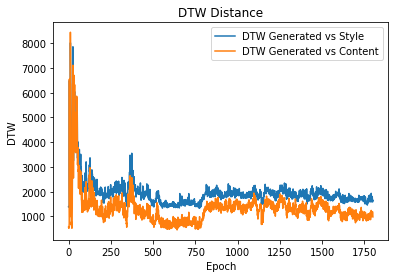

Epoch: 1801 
 Content Loss: 2.075552225112915 
 Style Loss: 9.150335311889648 
 Total Loss: 11.225887298583984
Metrics - Content CC:[91.47130723], FFT:77.60793063026883, DTW:1242.1588247704194
Metrics - Style CC:[-0.0769072], FFT:212.16022336055946, DTW:1796.827876593318
Epoch: 1802 
 Content Loss: 2.068370819091797 
 Style Loss: 6.5758209228515625 
 Total Loss: 8.64419174194336
Metrics - Content CC:[75.41722153], FFT:68.4649993300741, DTW:1208.4719696997565
Metrics - Style CC:[-0.41488367], FFT:213.65396495602482, DTW:1732.2195518835185
Epoch: 1803 
 Content Loss: 2.0766286849975586 
 Style Loss: 5.834251403808594 
 Total Loss: 7.910880088806152
Metrics - Content CC:[84.10875346], FFT:69.82246081512127, DTW:1063.2966090115224
Metrics - Style CC:[3.31296216], FFT:202.9605154859572, DTW:1859.2714639930266
Epoch: 1804 
 Content Loss: 2.063812255859375 
 Style Loss: 8.03084659576416 
 Total Loss: 10.094658851623535
Metrics - Content CC:[77.47838586], FFT:73.5269443961808, DTW:1149.0713081

Epoch: 1832 
 Content Loss: 1.9410274028778076 
 Style Loss: 6.811139106750488 
 Total Loss: 8.752166748046875
Metrics - Content CC:[83.22514836], FFT:52.18304675906897, DTW:1171.2378537552315
Metrics - Style CC:[-5.24230056], FFT:173.71468548891698, DTW:1546.8257910179188
Epoch: 1833 
 Content Loss: 1.9592368602752686 
 Style Loss: 6.045489311218262 
 Total Loss: 8.00472640991211
Metrics - Content CC:[87.63456521], FFT:71.65926058793872, DTW:1153.737521847007
Metrics - Style CC:[1.6275893], FFT:173.9216340755587, DTW:1704.2372102581471
Epoch: 1834 
 Content Loss: 1.9389302730560303 
 Style Loss: 10.362817764282227 
 Total Loss: 12.301748275756836
Metrics - Content CC:[56.7247944], FFT:49.88774153307171, DTW:982.382845297421
Metrics - Style CC:[0.39351396], FFT:175.49723890271363, DTW:1648.2548281452835
Epoch: 1835 
 Content Loss: 1.966965675354004 
 Style Loss: 5.565093040466309 
 Total Loss: 7.5320587158203125
Metrics - Content CC:[79.28231649], FFT:55.779832356412086, DTW:945.178336

Epoch: 1863 
 Content Loss: 2.0945446491241455 
 Style Loss: 10.792129516601562 
 Total Loss: 12.886674880981445
Metrics - Content CC:[88.39106279], FFT:139.15341105928863, DTW:1482.8992453027156
Metrics - Style CC:[-2.36854076], FFT:244.05377070826765, DTW:1940.2310187411351
Epoch: 1864 
 Content Loss: 2.0583372116088867 
 Style Loss: 8.39143180847168 
 Total Loss: 10.449769020080566
Metrics - Content CC:[77.21127029], FFT:115.0458590493584, DTW:1385.4100801467093
Metrics - Style CC:[-6.08970496], FFT:217.93810605519843, DTW:1884.0751363042875
Epoch: 1865 
 Content Loss: 2.077430486679077 
 Style Loss: 5.582313537597656 
 Total Loss: 7.6597442626953125
Metrics - Content CC:[71.45363647], FFT:114.99839127497518, DTW:1328.8608871985796
Metrics - Style CC:[-8.84705484], FFT:218.89145696426883, DTW:1877.5788081579205
Epoch: 1866 
 Content Loss: 2.0411133766174316 
 Style Loss: 7.598867893218994 
 Total Loss: 9.639981269836426
Metrics - Content CC:[53.22628452], FFT:119.58850314684288, DTW

Epoch: 1893 
 Content Loss: 2.1211745738983154 
 Style Loss: 14.814170837402344 
 Total Loss: 16.935344696044922
Metrics - Content CC:[74.95415512], FFT:89.5556188948825, DTW:1408.463005509161
Metrics - Style CC:[4.44239085], FFT:195.92426988468003, DTW:1782.3598108721792
Epoch: 1894 
 Content Loss: 2.1354331970214844 
 Style Loss: 8.188180923461914 
 Total Loss: 10.323614120483398
Metrics - Content CC:[62.16905209], FFT:69.33628915058306, DTW:1100.491372014472
Metrics - Style CC:[-3.15316797], FFT:200.31650727756156, DTW:1760.4404397362748
Epoch: 1895 
 Content Loss: 2.096038818359375 
 Style Loss: 5.9506425857543945 
 Total Loss: 8.04668140411377
Metrics - Content CC:[84.24296188], FFT:75.70205635657172, DTW:1193.7196538360288
Metrics - Style CC:[2.63326887], FFT:190.47885105606707, DTW:1672.416525144699
Epoch: 1896 
 Content Loss: 1.9772586822509766 
 Style Loss: 7.541805267333984 
 Total Loss: 9.519063949584961
Metrics - Content CC:[58.40628316], FFT:56.52531475868391, DTW:924.1866

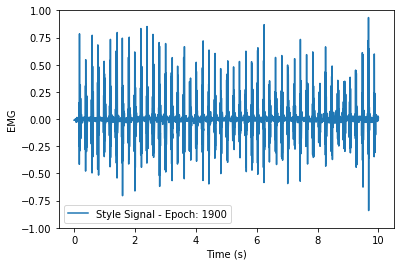

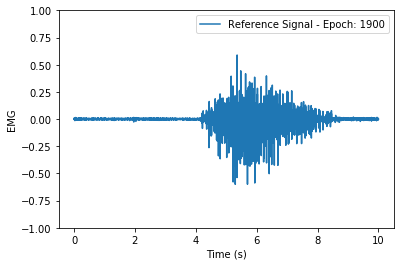

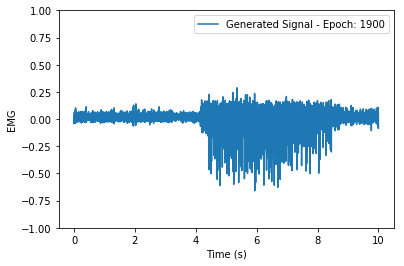

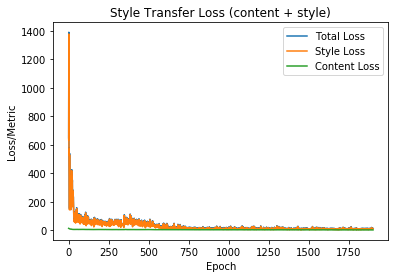

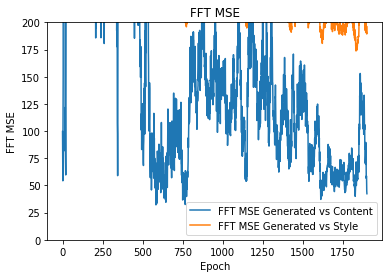

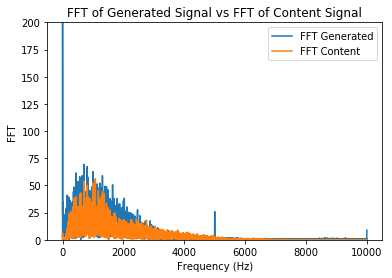

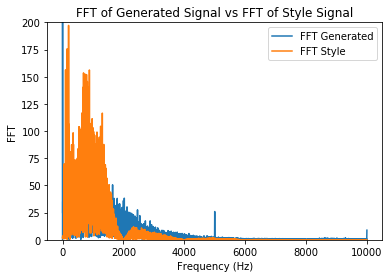

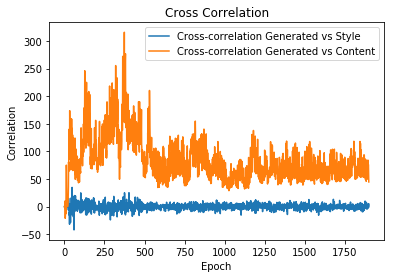

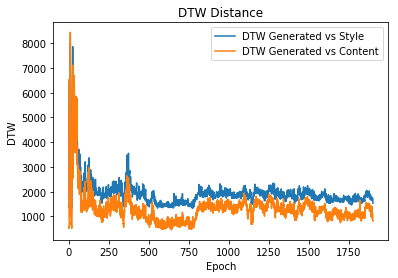

Epoch: 1901 
 Content Loss: 1.9493223428726196 
 Style Loss: 9.98825740814209 
 Total Loss: 11.937580108642578
Metrics - Content CC:[59.94163157], FFT:36.83476975098842, DTW:774.8958156892817
Metrics - Style CC:[3.44180063], FFT:191.440003939723, DTW:1616.6842980160677
Epoch: 1902 
 Content Loss: 1.9159475564956665 
 Style Loss: 5.612826824188232 
 Total Loss: 7.528774261474609
Metrics - Content CC:[65.21290212], FFT:42.58547214246139, DTW:757.9495829061659
Metrics - Style CC:[-3.37030363], FFT:188.8152813491019, DTW:1601.756192211306
Epoch: 1903 
 Content Loss: 1.8776507377624512 
 Style Loss: 9.305774688720703 
 Total Loss: 11.183425903320312
Metrics - Content CC:[45.81778569], FFT:29.82509477832588, DTW:813.3313785400112
Metrics - Style CC:[2.55717644], FFT:191.84069416444933, DTW:1546.9454675478464
Epoch: 1904 
 Content Loss: 1.9372972249984741 
 Style Loss: 6.296449661254883 
 Total Loss: 8.233746528625488
Metrics - Content CC:[64.85294966], FFT:31.891411576723335, DTW:734.3575088

Epoch: 1932 
 Content Loss: 1.924733281135559 
 Style Loss: 11.154088020324707 
 Total Loss: 13.078821182250977
Metrics - Content CC:[65.46102157], FFT:22.11417348259766, DTW:590.4504386571327
Metrics - Style CC:[0.1671582], FFT:195.8872497931973, DTW:1219.383916985762
Epoch: 1933 
 Content Loss: 1.9476542472839355 
 Style Loss: 7.78400182723999 
 Total Loss: 9.731656074523926
Metrics - Content CC:[82.33902329], FFT:23.14136905075612, DTW:666.0645701715739
Metrics - Style CC:[2.26561397], FFT:185.19027988544548, DTW:1309.3862591778122
Epoch: 1934 
 Content Loss: 1.8491026163101196 
 Style Loss: 18.662302017211914 
 Total Loss: 20.511404037475586
Metrics - Content CC:[43.55246836], FFT:11.418217648884537, DTW:494.54008324334603
Metrics - Style CC:[6.78781435], FFT:203.97059938766992, DTW:1354.9833223711234
Epoch: 1935 
 Content Loss: 1.9357500076293945 
 Style Loss: 6.221133708953857 
 Total Loss: 8.156883239746094
Metrics - Content CC:[58.50139167], FFT:15.652010415509325, DTW:569.6265

Epoch: 1963 
 Content Loss: 1.9932366609573364 
 Style Loss: 8.742620468139648 
 Total Loss: 10.735857009887695
Metrics - Content CC:[63.27592535], FFT:31.633777635949116, DTW:467.64626454785594
Metrics - Style CC:[0.80390223], FFT:170.5347383427047, DTW:1298.9044747490998
Epoch: 1964 
 Content Loss: 2.0548298358917236 
 Style Loss: 6.229419708251953 
 Total Loss: 8.284249305725098
Metrics - Content CC:[83.23029236], FFT:40.909445828831046, DTW:953.4668189436636
Metrics - Style CC:[2.69743641], FFT:160.88932677725256, DTW:1589.8887966117798
Epoch: 1965 
 Content Loss: 2.0205914974212646 
 Style Loss: 4.0303449630737305 
 Total Loss: 6.050936698913574
Metrics - Content CC:[84.16559798], FFT:34.60556876340319, DTW:761.119376823588
Metrics - Style CC:[3.33091211], FFT:164.46770581427305, DTW:1461.1765763411236
Epoch: 1966 
 Content Loss: 2.0263242721557617 
 Style Loss: 8.583467483520508 
 Total Loss: 10.60979175567627
Metrics - Content CC:[83.6674053], FFT:33.79643836245998, DTW:836.8485

Epoch: 1994 
 Content Loss: 1.8892006874084473 
 Style Loss: 7.836338996887207 
 Total Loss: 9.725540161132812
Metrics - Content CC:[72.52357005], FFT:43.54385427025229, DTW:749.3042047496767
Metrics - Style CC:[2.81177753], FFT:173.5370131087342, DTW:1613.1601420280767
Epoch: 1995 
 Content Loss: 1.9210084676742554 
 Style Loss: 5.019643783569336 
 Total Loss: 6.940652370452881
Metrics - Content CC:[79.76105791], FFT:35.17462504772434, DTW:714.6040379035635
Metrics - Style CC:[-8.46357852], FFT:176.74217787938306, DTW:1487.7676660486138
Epoch: 1996 
 Content Loss: 1.9672365188598633 
 Style Loss: 8.459464073181152 
 Total Loss: 10.426700592041016
Metrics - Content CC:[114.54032706], FFT:47.617952021369334, DTW:1010.5228502467603
Metrics - Style CC:[0.1021798], FFT:168.46841857936573, DTW:1477.7912833329704
Epoch: 1997 
 Content Loss: 1.9081833362579346 
 Style Loss: 5.721364974975586 
 Total Loss: 7.629548072814941
Metrics - Content CC:[54.54588295], FFT:37.95341999644524, DTW:662.376

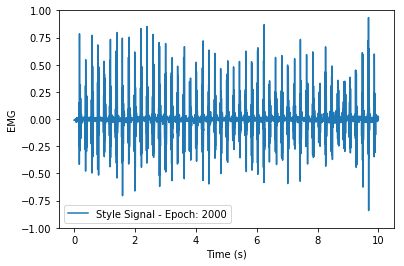

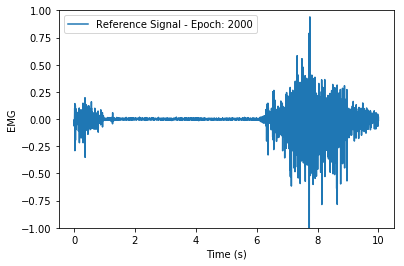

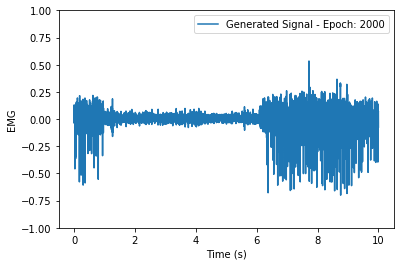

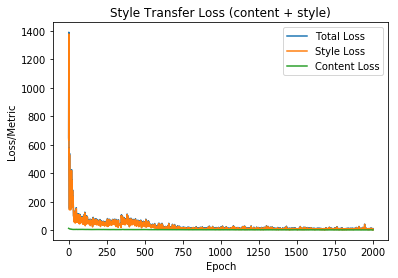

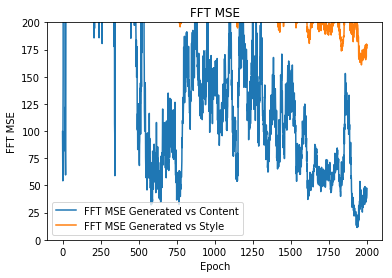

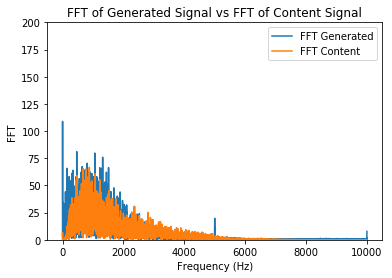

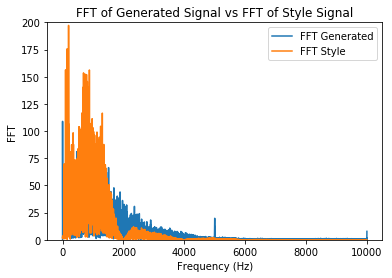

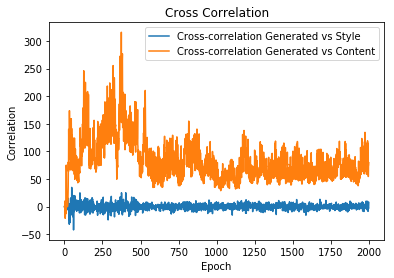

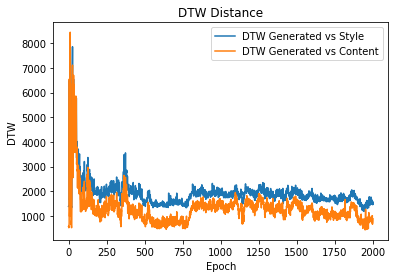

Epoch: 2001 
 Content Loss: 1.9287128448486328 
 Style Loss: 4.078534126281738 
 Total Loss: 6.007246971130371
Metrics - Content CC:[75.32965603], FFT:43.452560083816216, DTW:809.7890898737254
Metrics - Style CC:[-1.37590186], FFT:180.05245069514362, DTW:1564.2312371149783
Epoch: 2002 
 Content Loss: 1.9451571702957153 
 Style Loss: 7.53659725189209 
 Total Loss: 9.481754302978516
Metrics - Content CC:[76.0604062], FFT:44.13889801585272, DTW:840.8388111696692
Metrics - Style CC:[2.55169158], FFT:176.3453676420565, DTW:1551.4618524666332
Epoch: 2003 
 Content Loss: 1.9260280132293701 
 Style Loss: 9.755416870117188 
 Total Loss: 11.681445121765137
Metrics - Content CC:[101.72204575], FFT:56.55350658135803, DTW:927.3726873297251
Metrics - Style CC:[-1.34823634], FFT:179.49549573443554, DTW:1619.6038967648701
Epoch: 2004 
 Content Loss: 1.9790440797805786 
 Style Loss: 8.960208892822266 
 Total Loss: 10.939252853393555
Metrics - Content CC:[106.46391419], FFT:57.20481160699196, DTW:1013.7

Epoch: 2032 
 Content Loss: 1.9293382167816162 
 Style Loss: 8.932992935180664 
 Total Loss: 10.86233139038086
Metrics - Content CC:[53.91876594], FFT:133.2277244803188, DTW:1278.0740950429672
Metrics - Style CC:[7.75147054], FFT:209.30717706683652, DTW:1843.3729946451272
Epoch: 2033 
 Content Loss: 1.9594621658325195 
 Style Loss: 6.552342414855957 
 Total Loss: 8.511804580688477
Metrics - Content CC:[74.45217758], FFT:129.0052181456628, DTW:1408.4480036149057
Metrics - Style CC:[-5.93867301], FFT:207.83494947927932, DTW:1829.3305036115273
Epoch: 2034 
 Content Loss: 1.9783167839050293 
 Style Loss: 6.777144432067871 
 Total Loss: 8.755460739135742
Metrics - Content CC:[63.77983253], FFT:140.30682414650678, DTW:1354.2025676042726
Metrics - Style CC:[-4.58394109], FFT:220.44430360131946, DTW:1892.3317676872223
Epoch: 2035 
 Content Loss: 1.9486727714538574 
 Style Loss: 13.301558494567871 
 Total Loss: 15.25023078918457
Metrics - Content CC:[106.94204549], FFT:152.73613865371436, DTW:1

Epoch: 2062 
 Content Loss: 1.9066358804702759 
 Style Loss: 5.474501132965088 
 Total Loss: 7.381136894226074
Metrics - Content CC:[76.11573116], FFT:103.14195625181993, DTW:1251.742258280901
Metrics - Style CC:[-4.18574746], FFT:203.8395436159491, DTW:1851.5406960492878
Epoch: 2063 
 Content Loss: 1.928799033164978 
 Style Loss: 4.062436103820801 
 Total Loss: 5.991235256195068
Metrics - Content CC:[52.16661321], FFT:106.08806151988604, DTW:1491.3151741355762
Metrics - Style CC:[5.40768012], FFT:206.1544976460303, DTW:1923.8056010923062
Epoch: 2064 
 Content Loss: 1.9158369302749634 
 Style Loss: 15.827861785888672 
 Total Loss: 17.743698120117188
Metrics - Content CC:[92.8049173], FFT:92.6229247987211, DTW:1344.90656812843
Metrics - Style CC:[6.70906929], FFT:200.42155627049672, DTW:1868.7332295819838
Epoch: 2065 
 Content Loss: 1.9730781316757202 
 Style Loss: 11.618936538696289 
 Total Loss: 13.592013359069824
Metrics - Content CC:[76.17207561], FFT:79.63547666395219, DTW:1243.705

Epoch: 2093 
 Content Loss: 2.0094664096832275 
 Style Loss: 10.677985191345215 
 Total Loss: 12.687451362609863
Metrics - Content CC:[74.49963649], FFT:115.8398281862583, DTW:1404.9170593978345
Metrics - Style CC:[-3.26161868], FFT:210.2737258009156, DTW:1790.6766355501552
Epoch: 2094 
 Content Loss: 1.991300344467163 
 Style Loss: 5.115161418914795 
 Total Loss: 7.106461524963379
Metrics - Content CC:[83.50381328], FFT:102.54286863159652, DTW:1853.9283953817182
Metrics - Style CC:[1.70259284], FFT:203.49279662088878, DTW:2073.0635711430527
Epoch: 2095 
 Content Loss: 1.9286171197891235 
 Style Loss: 11.491400718688965 
 Total Loss: 13.420018196105957
Metrics - Content CC:[83.24934571], FFT:143.18191843812932, DTW:1591.992088273654
Metrics - Style CC:[1.39467576], FFT:212.32963844578083, DTW:2102.6581813773637
Epoch: 2096 
 Content Loss: 1.9465057849884033 
 Style Loss: 5.358064651489258 
 Total Loss: 7.304570198059082
Metrics - Content CC:[73.58689352], FFT:105.07788633043096, DTW:13

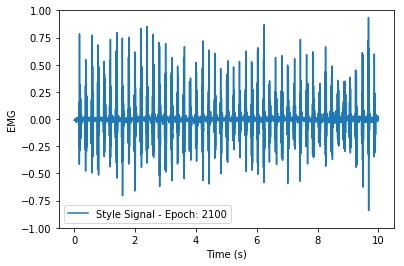

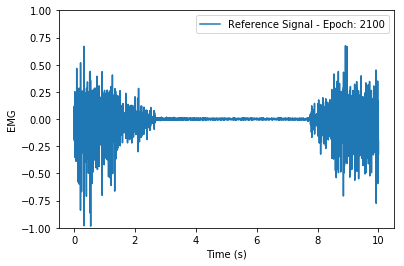

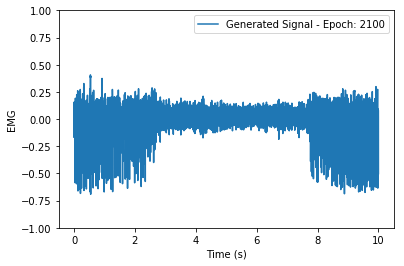

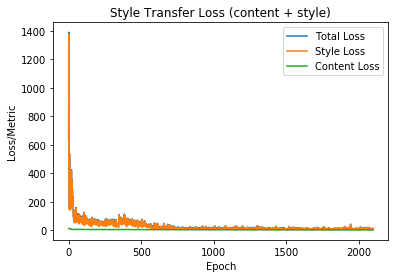

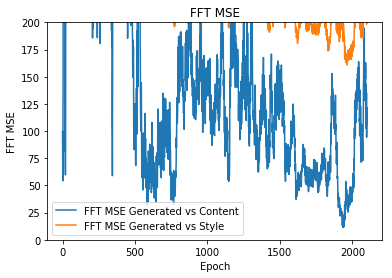

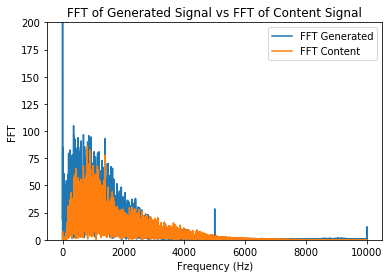

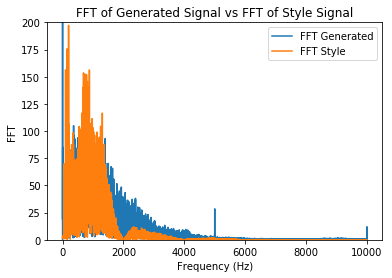

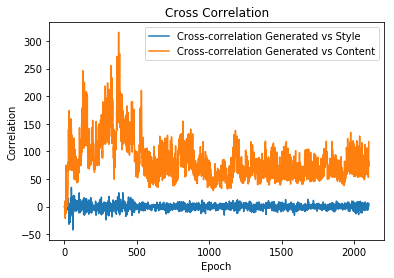

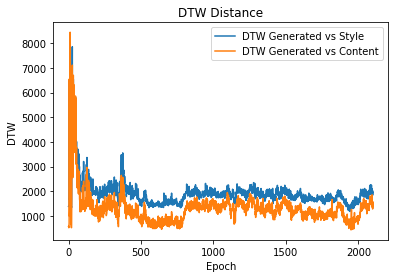

Epoch: 2101 
 Content Loss: 1.9709910154342651 
 Style Loss: 7.4007110595703125 
 Total Loss: 9.371702194213867
Metrics - Content CC:[49.82425248], FFT:129.09108015984825, DTW:1588.3967665848613
Metrics - Style CC:[-2.50536351], FFT:211.3224265990135, DTW:1842.4489849866652
Epoch: 2102 
 Content Loss: 1.9996452331542969 
 Style Loss: 5.430160045623779 
 Total Loss: 7.429804801940918
Metrics - Content CC:[74.28251664], FFT:102.32466318486892, DTW:1352.101415836393
Metrics - Style CC:[-4.89326292], FFT:194.0746854436139, DTW:1913.4327423971272
Epoch: 2103 
 Content Loss: 1.966995120048523 
 Style Loss: 7.732687950134277 
 Total Loss: 9.69968318939209
Metrics - Content CC:[109.76386249], FFT:117.77214972222747, DTW:1399.1098826162506
Metrics - Style CC:[3.34283432], FFT:203.44213196764255, DTW:2038.306841728732
Epoch: 2104 
 Content Loss: 1.9820165634155273 
 Style Loss: 6.584712028503418 
 Total Loss: 8.566728591918945
Metrics - Content CC:[88.30094854], FFT:122.38905847327675, DTW:1426.

Epoch: 2131 
 Content Loss: 1.8890300989151 
 Style Loss: 9.28114128112793 
 Total Loss: 11.170171737670898
Metrics - Content CC:[91.19189903], FFT:54.07993894896553, DTW:1283.6884185176293
Metrics - Style CC:[2.62149494], FFT:189.27656567784518, DTW:1829.922359589707
Epoch: 2132 
 Content Loss: 1.880167007446289 
 Style Loss: 8.171079635620117 
 Total Loss: 10.051246643066406
Metrics - Content CC:[102.04117828], FFT:64.37520341501668, DTW:1240.966872246746
Metrics - Style CC:[7.09257525], FFT:187.0767932975438, DTW:1788.903066070648
Epoch: 2133 
 Content Loss: 1.8544081449508667 
 Style Loss: 5.605935096740723 
 Total Loss: 7.460343360900879
Metrics - Content CC:[83.40569815], FFT:53.45063935479575, DTW:965.4476280395928
Metrics - Style CC:[-6.14599604], FFT:186.51600151130359, DTW:1692.341705833369
Epoch: 2134 
 Content Loss: 1.8841544389724731 
 Style Loss: 11.483059883117676 
 Total Loss: 13.367215156555176
Metrics - Content CC:[62.95072016], FFT:54.09686451969809, DTW:957.62780610

Epoch: 2162 
 Content Loss: 1.8626902103424072 
 Style Loss: 6.652973175048828 
 Total Loss: 8.515663146972656
Metrics - Content CC:[73.72841746], FFT:41.76816580134332, DTW:810.1795674408152
Metrics - Style CC:[5.2604093], FFT:181.3533784808441, DTW:1682.1227710754513
Epoch: 2163 
 Content Loss: 1.7861884832382202 
 Style Loss: 13.461870193481445 
 Total Loss: 15.248059272766113
Metrics - Content CC:[68.68229894], FFT:32.69476440376547, DTW:772.9220055490708
Metrics - Style CC:[-1.11779519], FFT:198.0032524482752, DTW:1573.4514404935574
Epoch: 2164 
 Content Loss: 1.7258778810501099 
 Style Loss: 4.258831977844238 
 Total Loss: 5.984709739685059
Metrics - Content CC:[46.77701041], FFT:31.496248347515323, DTW:660.9393710518165
Metrics - Style CC:[-1.36543417], FFT:197.7696530726922, DTW:1562.9499831212447
Epoch: 2165 
 Content Loss: 1.6872282028198242 
 Style Loss: 9.315914154052734 
 Total Loss: 11.003142356872559
Metrics - Content CC:[65.45977378], FFT:37.621378239756595, DTW:870.288

Epoch: 2192 
 Content Loss: 1.945101261138916 
 Style Loss: 6.185039520263672 
 Total Loss: 8.13014030456543
Metrics - Content CC:[49.64322055], FFT:100.83582237425738, DTW:1305.2953365557041
Metrics - Style CC:[-4.52727942], FFT:193.66668853468258, DTW:1785.1443191720625
Epoch: 2193 
 Content Loss: 1.9712910652160645 
 Style Loss: 11.672758102416992 
 Total Loss: 13.644048690795898
Metrics - Content CC:[66.49054781], FFT:96.81302698070711, DTW:1301.8380450708012
Metrics - Style CC:[8.76681388], FFT:187.67368129710312, DTW:1779.998899432045
Epoch: 2194 
 Content Loss: 1.9273838996887207 
 Style Loss: 6.33579158782959 
 Total Loss: 8.263175964355469
Metrics - Content CC:[90.78778526], FFT:106.45478281723452, DTW:1306.6361074211038
Metrics - Style CC:[-1.1086916], FFT:203.7095408258043, DTW:1874.859439343781
Epoch: 2195 
 Content Loss: 1.9384201765060425 
 Style Loss: 6.06017541885376 
 Total Loss: 7.998595237731934
Metrics - Content CC:[42.89394492], FFT:101.21304883260484, DTW:1215.914

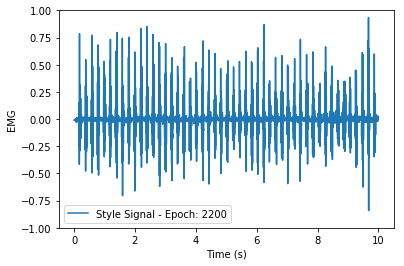

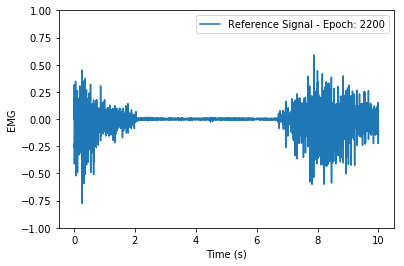

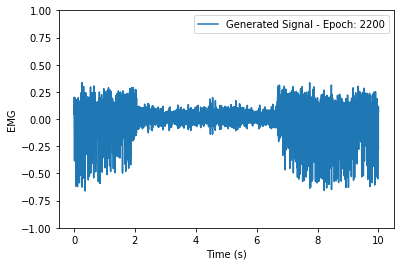

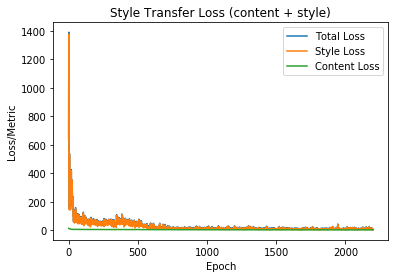

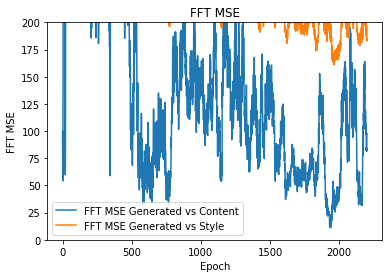

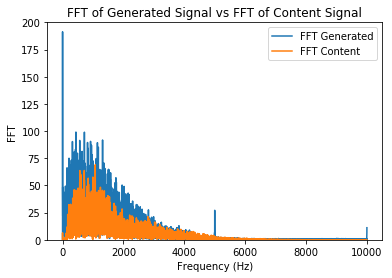

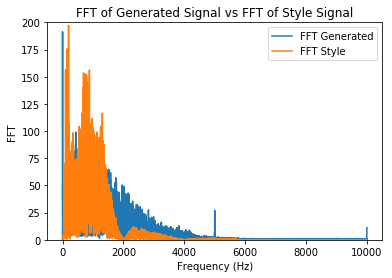

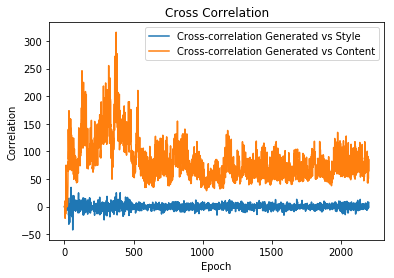

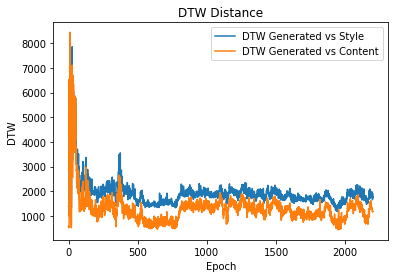

Epoch: 2201 
 Content Loss: 1.9213082790374756 
 Style Loss: 7.2636260986328125 
 Total Loss: 9.184934616088867
Metrics - Content CC:[86.49049702], FFT:86.72359711854462, DTW:1054.2477473868971
Metrics - Style CC:[-0.71407863], FFT:181.6789048742765, DTW:1646.9958005155179
Epoch: 2202 
 Content Loss: 1.8978947401046753 
 Style Loss: 6.101738452911377 
 Total Loss: 7.999632835388184
Metrics - Content CC:[74.98875396], FFT:58.7227790817839, DTW:861.1290375802845
Metrics - Style CC:[-5.49508106], FFT:175.52995370990274, DTW:1656.0948129791468
Epoch: 2203 
 Content Loss: 1.8579866886138916 
 Style Loss: 14.76192855834961 
 Total Loss: 16.619915008544922
Metrics - Content CC:[44.37213626], FFT:81.09389241987772, DTW:930.0935554115662
Metrics - Style CC:[3.53262054], FFT:182.1872174363367, DTW:1684.7949439189354
Epoch: 2204 
 Content Loss: 1.869171380996704 
 Style Loss: 5.007694721221924 
 Total Loss: 6.876866340637207
Metrics - Content CC:[90.52063744], FFT:72.50299664628031, DTW:989.57085

Epoch: 2232 
 Content Loss: 1.7419261932373047 
 Style Loss: 4.742679595947266 
 Total Loss: 6.484605312347412
Metrics - Content CC:[74.86499701], FFT:70.33833915394187, DTW:901.672096877125
Metrics - Style CC:[-3.42717611], FFT:193.1468665705429, DTW:1722.1131481911468
Epoch: 2233 
 Content Loss: 1.6877005100250244 
 Style Loss: 7.2655158042907715 
 Total Loss: 8.953216552734375
Metrics - Content CC:[52.38155946], FFT:80.54821815060956, DTW:997.3383220490847
Metrics - Style CC:[-6.47311322], FFT:180.70806375497534, DTW:1754.6785768412808
Epoch: 2234 
 Content Loss: 1.8470760583877563 
 Style Loss: 9.168084144592285 
 Total Loss: 11.01516056060791
Metrics - Content CC:[64.91814404], FFT:52.40709968437698, DTW:655.2732449214554
Metrics - Style CC:[4.49026653], FFT:178.26440799112294, DTW:1542.3799339137026
Epoch: 2235 
 Content Loss: 1.781308889389038 
 Style Loss: 12.648077011108398 
 Total Loss: 14.4293851852417
Metrics - Content CC:[45.94189402], FFT:86.09286829617007, DTW:1036.51812

Epoch: 2263 
 Content Loss: 1.805302381515503 
 Style Loss: 5.313478469848633 
 Total Loss: 7.118781089782715
Metrics - Content CC:[79.91363095], FFT:133.22440919214452, DTW:1653.9308693464416
Metrics - Style CC:[-6.97753021], FFT:224.40218350750376, DTW:2073.157987341121
Epoch: 2264 
 Content Loss: 1.7629480361938477 
 Style Loss: 5.796497821807861 
 Total Loss: 7.559445858001709
Metrics - Content CC:[54.01440365], FFT:144.0303971266394, DTW:1685.5994397013717
Metrics - Style CC:[-8.07858315], FFT:213.16654044452335, DTW:2102.3217106652746
Epoch: 2265 
 Content Loss: 1.7907600402832031 
 Style Loss: 5.0316362380981445 
 Total Loss: 6.822396278381348
Metrics - Content CC:[76.59203159], FFT:144.63989425112598, DTW:1649.768344587238
Metrics - Style CC:[10.43304433], FFT:227.80568896068826, DTW:2176.658828304317
Epoch: 2266 
 Content Loss: 1.8397027254104614 
 Style Loss: 4.9092817306518555 
 Total Loss: 6.748984336853027
Metrics - Content CC:[74.79134605], FFT:138.25662344257043, DTW:164

Epoch: 2293 
 Content Loss: 1.6930421590805054 
 Style Loss: 6.32567024230957 
 Total Loss: 8.018712043762207
Metrics - Content CC:[61.53286398], FFT:128.93601382626963, DTW:1480.1586474914868
Metrics - Style CC:[-0.18763201], FFT:213.58281317138847, DTW:1985.3585282063127
Epoch: 2294 
 Content Loss: 1.852567434310913 
 Style Loss: 5.517642498016357 
 Total Loss: 7.370209693908691
Metrics - Content CC:[115.06332833], FFT:104.45863806880708, DTW:1459.459955245482
Metrics - Style CC:[-4.84613942], FFT:214.0943512567231, DTW:1954.7369237168493
Epoch: 2295 
 Content Loss: 1.7068489789962769 
 Style Loss: 8.87643051147461 
 Total Loss: 10.583279609680176
Metrics - Content CC:[75.56721791], FFT:96.29461012708408, DTW:1366.1279441644517
Metrics - Style CC:[3.83885963], FFT:211.26690249174504, DTW:1830.3821575264365
Epoch: 2296 
 Content Loss: 1.7252373695373535 
 Style Loss: 20.507572174072266 
 Total Loss: 22.23280906677246
Metrics - Content CC:[87.84024509], FFT:113.7206855173582, DTW:1528.

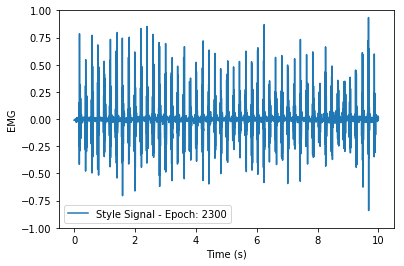

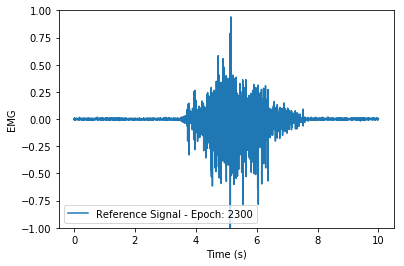

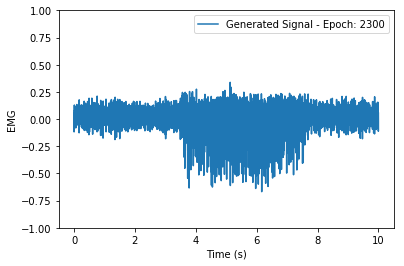

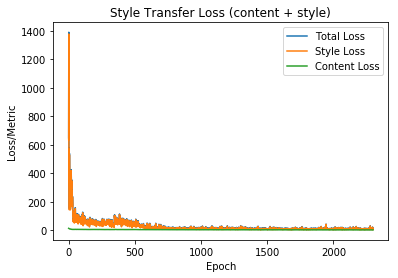

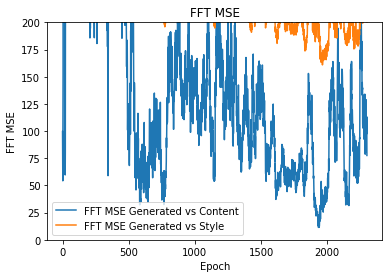

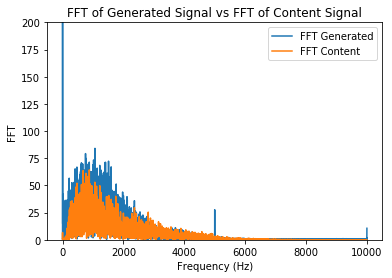

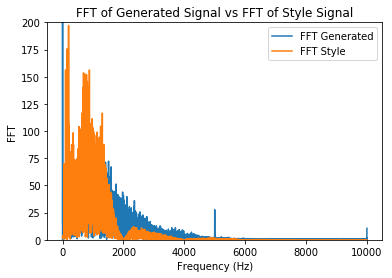

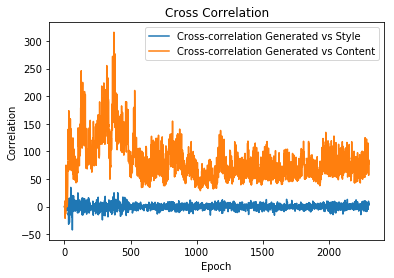

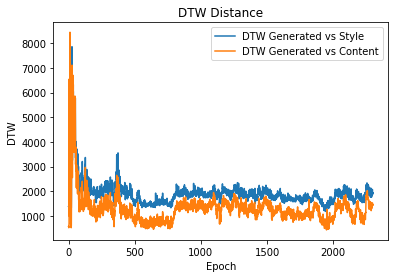

Epoch: 2301 
 Content Loss: 1.7137995958328247 
 Style Loss: 13.148911476135254 
 Total Loss: 14.862710952758789
Metrics - Content CC:[94.2185814], FFT:90.84641908790307, DTW:1489.081640161052
Metrics - Style CC:[4.74248404], FFT:207.34060399587182, DTW:1934.0746088668213
Epoch: 2302 
 Content Loss: 1.676781415939331 
 Style Loss: 24.073272705078125 
 Total Loss: 25.75005531311035
Metrics - Content CC:[55.07346285], FFT:91.85805739189794, DTW:1350.731691086581
Metrics - Style CC:[-2.53968226], FFT:204.44707142950887, DTW:1814.6287507560937
Epoch: 2303 
 Content Loss: 1.742634654045105 
 Style Loss: 5.065505027770996 
 Total Loss: 6.808139801025391
Metrics - Content CC:[60.26020102], FFT:112.69220238603565, DTW:1472.6050470301727
Metrics - Style CC:[4.15686242], FFT:195.28248568792577, DTW:1863.8307449713907
Epoch: 2304 
 Content Loss: 1.7374329566955566 
 Style Loss: 7.676243305206299 
 Total Loss: 9.413676261901855
Metrics - Content CC:[87.17848541], FFT:84.57784792730725, DTW:1308.00

Epoch: 2332 
 Content Loss: 1.8528143167495728 
 Style Loss: 5.680290222167969 
 Total Loss: 7.53310489654541
Metrics - Content CC:[89.06622199], FFT:84.9297485102676, DTW:1221.607681733193
Metrics - Style CC:[7.21482255], FFT:203.98200058566405, DTW:1754.3763940027304
Epoch: 2333 
 Content Loss: 1.7955790758132935 
 Style Loss: 3.3109052181243896 
 Total Loss: 5.106484413146973
Metrics - Content CC:[82.37173318], FFT:96.7864825860012, DTW:1209.0625169173352
Metrics - Style CC:[0.7071711], FFT:213.44692427125105, DTW:1789.1966673925142
Epoch: 2334 
 Content Loss: 1.7995727062225342 
 Style Loss: 7.460430145263672 
 Total Loss: 9.260003089904785
Metrics - Content CC:[89.76256005], FFT:80.7257533429411, DTW:1218.9705545662875
Metrics - Style CC:[0.81741929], FFT:203.36352360732448, DTW:1748.6743628750203
Epoch: 2335 
 Content Loss: 1.820908546447754 
 Style Loss: 7.771632194519043 
 Total Loss: 9.592540740966797
Metrics - Content CC:[84.03784718], FFT:84.32210461292435, DTW:1253.61227019

Epoch: 2363 
 Content Loss: 1.8630602359771729 
 Style Loss: 8.273080825805664 
 Total Loss: 10.136140823364258
Metrics - Content CC:[82.0294907], FFT:123.72346800418978, DTW:1451.3878405511734
Metrics - Style CC:[-9.01203434], FFT:225.00855971359317, DTW:2111.044594429261
Epoch: 2364 
 Content Loss: 1.8853625059127808 
 Style Loss: 10.536548614501953 
 Total Loss: 12.421911239624023
Metrics - Content CC:[78.2117992], FFT:104.58621966106575, DTW:1330.048400309064
Metrics - Style CC:[-0.266092], FFT:214.05684963911725, DTW:1853.4004302922554
Epoch: 2365 
 Content Loss: 1.830783724784851 
 Style Loss: 4.924059867858887 
 Total Loss: 6.754843711853027
Metrics - Content CC:[78.32712847], FFT:106.44843194084972, DTW:1348.7399515636514
Metrics - Style CC:[-2.51825835], FFT:215.37621232333055, DTW:1731.4746724756508
Epoch: 2366 
 Content Loss: 1.815128207206726 
 Style Loss: 6.287894248962402 
 Total Loss: 8.103022575378418
Metrics - Content CC:[102.09141387], FFT:125.40600067067568, DTW:1504

Epoch: 2393 
 Content Loss: 1.7281558513641357 
 Style Loss: 5.757172584533691 
 Total Loss: 7.485328674316406
Metrics - Content CC:[70.20570618], FFT:109.05640851199105, DTW:1367.701302860823
Metrics - Style CC:[-4.30925747], FFT:223.2306239073075, DTW:1838.0958556760204
Epoch: 2394 
 Content Loss: 1.7182430028915405 
 Style Loss: 6.600467681884766 
 Total Loss: 8.318710327148438
Metrics - Content CC:[50.82357171], FFT:121.87577718454845, DTW:1408.60671491025
Metrics - Style CC:[1.68876335], FFT:216.1754907051766, DTW:1834.1299146156068
Epoch: 2395 
 Content Loss: 1.7658286094665527 
 Style Loss: 8.183881759643555 
 Total Loss: 9.949710845947266
Metrics - Content CC:[50.17697881], FFT:120.3263369965246, DTW:1338.099668122572
Metrics - Style CC:[3.94774624], FFT:217.5345020381136, DTW:1835.1071264871043
Epoch: 2396 
 Content Loss: 1.7935254573822021 
 Style Loss: 8.234302520751953 
 Total Loss: 10.027828216552734
Metrics - Content CC:[72.97457175], FFT:95.37934028206786, DTW:1239.68126

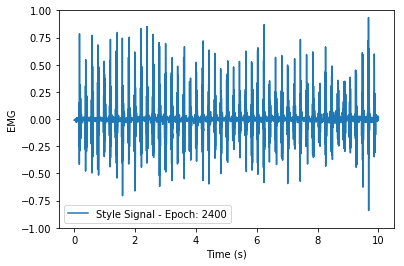

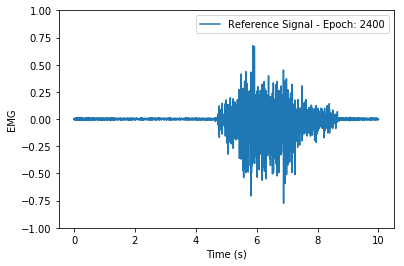

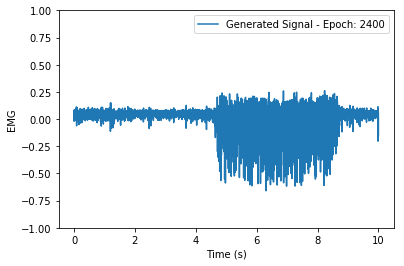

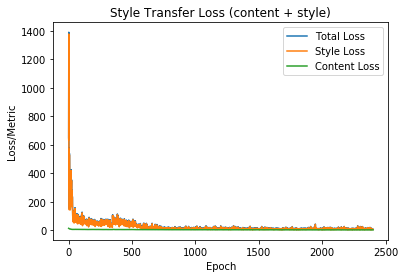

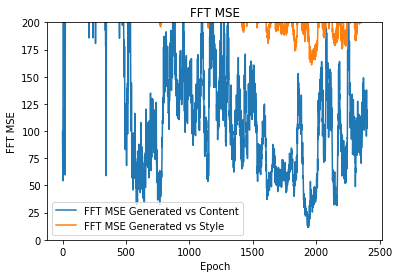

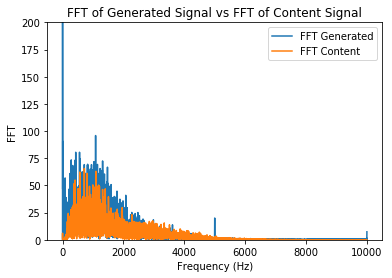

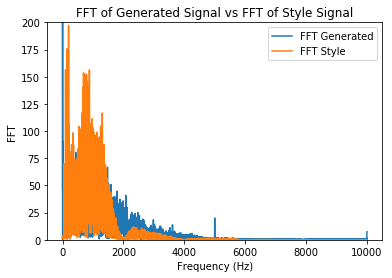

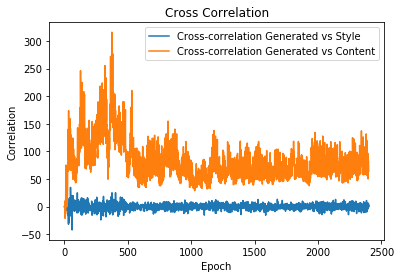

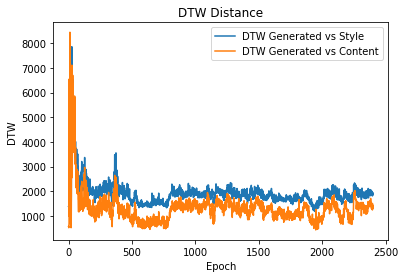

Epoch: 2401 
 Content Loss: 1.7697421312332153 
 Style Loss: 4.220703125 
 Total Loss: 5.990445137023926
Metrics - Content CC:[95.57250434], FFT:117.95220682264512, DTW:1546.5724069634473
Metrics - Style CC:[0.93466281], FFT:225.757037003664, DTW:1910.1906377457965
Epoch: 2402 
 Content Loss: 1.7481541633605957 
 Style Loss: 3.598452091217041 
 Total Loss: 5.346606254577637
Metrics - Content CC:[62.84690529], FFT:134.5948684832256, DTW:1548.4928144013613
Metrics - Style CC:[-7.6821829], FFT:238.11255850924562, DTW:1972.3613790694212
Epoch: 2403 
 Content Loss: 1.7364710569381714 
 Style Loss: 9.429727554321289 
 Total Loss: 11.16619873046875
Metrics - Content CC:[66.45656724], FFT:121.25963709070719, DTW:1413.4851140536705
Metrics - Style CC:[7.68288523], FFT:228.1772785843444, DTW:2006.6208350263475
Epoch: 2404 
 Content Loss: 1.6933293342590332 
 Style Loss: 5.744909763336182 
 Total Loss: 7.438239097595215
Metrics - Content CC:[102.92206475], FFT:98.19856701301208, DTW:1591.85191418

Epoch: 2432 
 Content Loss: 1.6337867975234985 
 Style Loss: 3.29494047164917 
 Total Loss: 4.928727149963379
Metrics - Content CC:[68.19911229], FFT:91.64766952160224, DTW:1178.4826863344967
Metrics - Style CC:[1.00762349], FFT:210.13656624186547, DTW:1830.7181482977278
Epoch: 2433 
 Content Loss: 1.6020333766937256 
 Style Loss: 3.758706569671631 
 Total Loss: 5.360739707946777
Metrics - Content CC:[50.71462978], FFT:70.54198489487634, DTW:981.8980137119457
Metrics - Style CC:[4.86967366], FFT:202.10830477454218, DTW:1689.1172988103594
Epoch: 2434 
 Content Loss: 1.617475986480713 
 Style Loss: 3.138030529022217 
 Total Loss: 4.75550651550293
Metrics - Content CC:[50.22409976], FFT:91.2403481869439, DTW:1179.3104644046446
Metrics - Style CC:[-2.63561941], FFT:206.20620320877313, DTW:1767.2962181452792
Epoch: 2435 
 Content Loss: 1.6504489183425903 
 Style Loss: 3.5220870971679688 
 Total Loss: 5.1725358963012695
Metrics - Content CC:[72.07251536], FFT:82.80600382752614, DTW:1303.9494

Epoch: 2463 
 Content Loss: 1.6417840719223022 
 Style Loss: 5.081958770751953 
 Total Loss: 6.723742485046387
Metrics - Content CC:[75.89441721], FFT:53.218612675853954, DTW:905.3261796261196
Metrics - Style CC:[-5.80869285], FFT:179.30920575111196, DTW:1681.6308283700723
Epoch: 2464 
 Content Loss: 1.632517695426941 
 Style Loss: 7.684106826782227 
 Total Loss: 9.316624641418457
Metrics - Content CC:[76.52226588], FFT:58.70724942436887, DTW:993.5634059793109
Metrics - Style CC:[-7.73807829], FFT:180.9659927446133, DTW:1677.2741175180834
Epoch: 2465 
 Content Loss: 1.6754930019378662 
 Style Loss: 8.703482627868652 
 Total Loss: 10.378975868225098
Metrics - Content CC:[76.05247617], FFT:56.27783760603132, DTW:928.6553527742755
Metrics - Style CC:[-3.49859235], FFT:183.14409021967808, DTW:1713.238991496827
Epoch: 2466 
 Content Loss: 1.6414822340011597 
 Style Loss: 4.352065086364746 
 Total Loss: 5.993547439575195
Metrics - Content CC:[70.39503825], FFT:61.39153582696723, DTW:1042.846

Epoch: 2494 
 Content Loss: 1.5637280941009521 
 Style Loss: 10.289700508117676 
 Total Loss: 11.853428840637207
Metrics - Content CC:[54.68012412], FFT:133.5378697513284, DTW:1319.0248091964393
Metrics - Style CC:[8.33711868], FFT:212.32416880239649, DTW:1900.205851226902
Epoch: 2495 
 Content Loss: 1.690672755241394 
 Style Loss: 8.082518577575684 
 Total Loss: 9.773191452026367
Metrics - Content CC:[118.85617388], FFT:85.37376772283973, DTW:1139.6260364677062
Metrics - Style CC:[4.28997688], FFT:182.7169924371082, DTW:1779.1364537647537
Epoch: 2496 
 Content Loss: 1.6625726222991943 
 Style Loss: 6.00922966003418 
 Total Loss: 7.671802520751953
Metrics - Content CC:[74.37304517], FFT:67.81737315810359, DTW:1009.5546380918144
Metrics - Style CC:[1.34113079], FFT:177.97442390057358, DTW:1737.578972152505
Epoch: 2497 
 Content Loss: 1.672277569770813 
 Style Loss: 11.192635536193848 
 Total Loss: 12.864912033081055
Metrics - Content CC:[73.44933566], FFT:64.65974898090762, DTW:773.4165

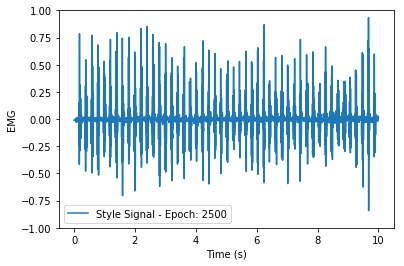

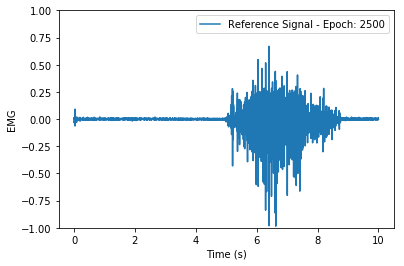

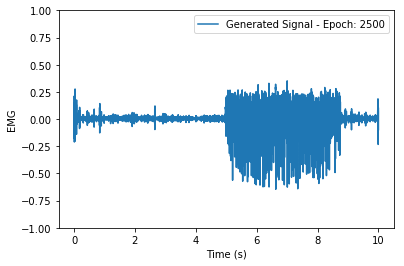

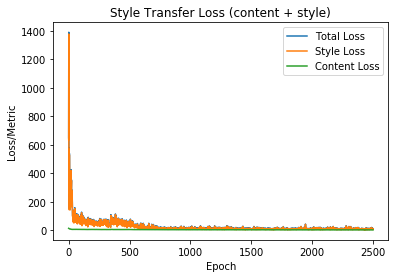

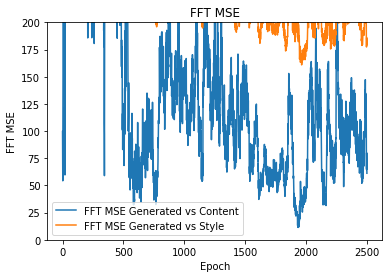

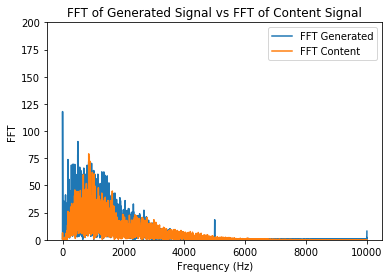

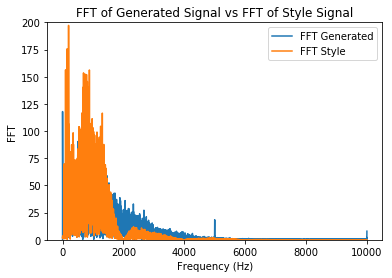

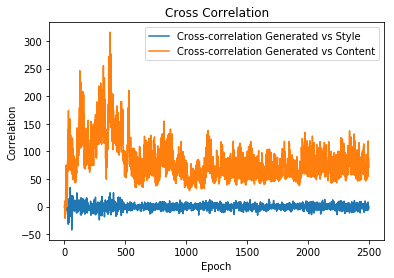

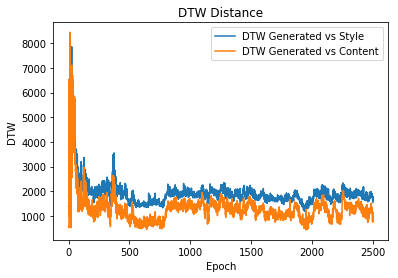

Epoch: 2501 
 Content Loss: 1.6129412651062012 
 Style Loss: 4.30954647064209 
 Total Loss: 5.922487735748291
Metrics - Content CC:[70.72033619], FFT:60.069696717565584, DTW:896.6994834024955
Metrics - Style CC:[-0.27804702], FFT:179.12537140911863, DTW:1674.089478667569
Epoch: 2502 
 Content Loss: 1.5868887901306152 
 Style Loss: 5.558804988861084 
 Total Loss: 7.145693778991699
Metrics - Content CC:[85.84941387], FFT:81.29575098019019, DTW:981.1667967274929
Metrics - Style CC:[4.32863181], FFT:187.50444859122757, DTW:1597.907522113646
Epoch: 2503 
 Content Loss: 1.685503602027893 
 Style Loss: 6.712161540985107 
 Total Loss: 8.397665023803711
Metrics - Content CC:[73.57120803], FFT:54.681859708054645, DTW:750.9182909596137
Metrics - Style CC:[5.26064415], FFT:174.4181571816989, DTW:1606.244741139054
Epoch: 2504 
 Content Loss: 1.630220651626587 
 Style Loss: 6.9689507484436035 
 Total Loss: 8.59917163848877
Metrics - Content CC:[74.54261067], FFT:61.02433076896225, DTW:732.5985084891

Epoch: 2532 
 Content Loss: 1.5881006717681885 
 Style Loss: 11.139803886413574 
 Total Loss: 12.727904319763184
Metrics - Content CC:[75.722349], FFT:77.34959592863314, DTW:1053.4951929681715
Metrics - Style CC:[0.44360801], FFT:174.18504278080056, DTW:1777.0689346102401
Epoch: 2533 
 Content Loss: 1.593410849571228 
 Style Loss: 7.976933002471924 
 Total Loss: 9.570343971252441
Metrics - Content CC:[87.17040043], FFT:87.41247255516122, DTW:1183.9098038603347
Metrics - Style CC:[0.64133911], FFT:185.89079773626634, DTW:1842.5270098501178
Epoch: 2534 
 Content Loss: 1.6089810132980347 
 Style Loss: 11.309000968933105 
 Total Loss: 12.91798210144043
Metrics - Content CC:[76.34976518], FFT:93.69169549569267, DTW:1149.3754749534396
Metrics - Style CC:[-3.80812369], FFT:189.52686838543815, DTW:1810.6851032585064
Epoch: 2535 
 Content Loss: 1.5728837251663208 
 Style Loss: 5.421477317810059 
 Total Loss: 6.99436092376709
Metrics - Content CC:[62.21614175], FFT:148.579313217343, DTW:1416.070

Epoch: 2563 
 Content Loss: 1.6098078489303589 
 Style Loss: 4.270204067230225 
 Total Loss: 5.880012035369873
Metrics - Content CC:[56.46675687], FFT:95.99672891098987, DTW:1260.5645563912537
Metrics - Style CC:[-2.22794415], FFT:197.84508795631572, DTW:1957.0022466691112
Epoch: 2564 
 Content Loss: 1.608812689781189 
 Style Loss: 12.182427406311035 
 Total Loss: 13.791239738464355
Metrics - Content CC:[85.12899515], FFT:72.00396599905382, DTW:1233.5754329276942
Metrics - Style CC:[0.17653761], FFT:201.61468665944088, DTW:1772.412056029735
Epoch: 2565 
 Content Loss: 1.6217395067214966 
 Style Loss: 27.131498336791992 
 Total Loss: 28.753238677978516
Metrics - Content CC:[54.35691774], FFT:100.56229338160365, DTW:1307.7515533544854
Metrics - Style CC:[9.87247349], FFT:201.89854067616946, DTW:1764.162894887963
Epoch: 2566 
 Content Loss: 1.5273569822311401 
 Style Loss: 5.723104953765869 
 Total Loss: 7.250462532043457
Metrics - Content CC:[54.57651287], FFT:104.77340496845709, DTW:123

Epoch: 2594 
 Content Loss: 1.6612544059753418 
 Style Loss: 6.9231462478637695 
 Total Loss: 8.584400177001953
Metrics - Content CC:[114.81030206], FFT:72.01510695193087, DTW:1306.8867238506853
Metrics - Style CC:[10.99102863], FFT:181.22516107613254, DTW:1835.3014697110334
Epoch: 2595 
 Content Loss: 1.4630690813064575 
 Style Loss: 6.755744457244873 
 Total Loss: 8.2188138961792
Metrics - Content CC:[59.58246908], FFT:62.936245631070484, DTW:1055.1773703261872
Metrics - Style CC:[-2.97196612], FFT:185.91049211080016, DTW:1742.6458650097547
Epoch: 2596 
 Content Loss: 1.4998406171798706 
 Style Loss: 13.837896347045898 
 Total Loss: 15.337736129760742
Metrics - Content CC:[61.51918444], FFT:84.56097989098656, DTW:1098.3382179512255
Metrics - Style CC:[-5.05276908], FFT:186.31868429305678, DTW:1806.3314903652577
Epoch: 2597 
 Content Loss: 1.509560227394104 
 Style Loss: 9.002704620361328 
 Total Loss: 10.5122652053833
Metrics - Content CC:[78.1706773], FFT:60.851545133912346, DTW:990

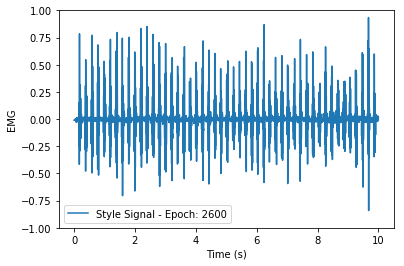

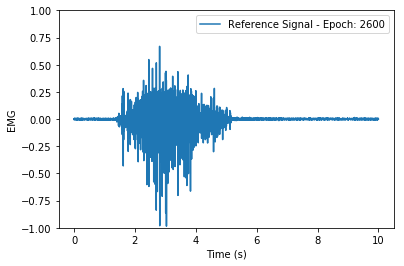

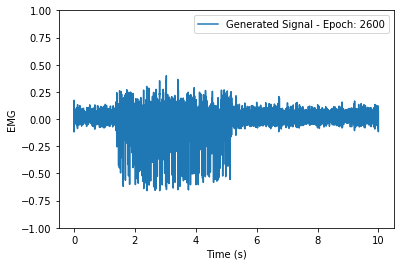

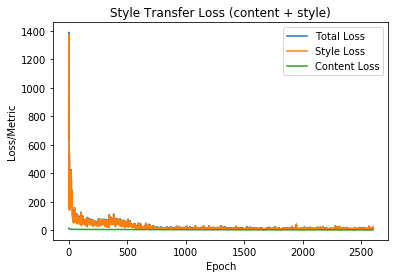

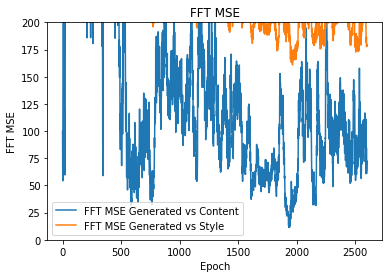

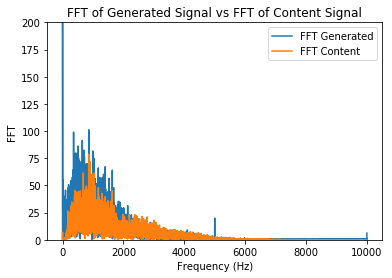

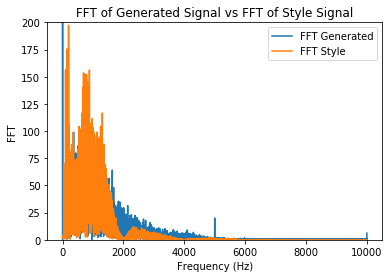

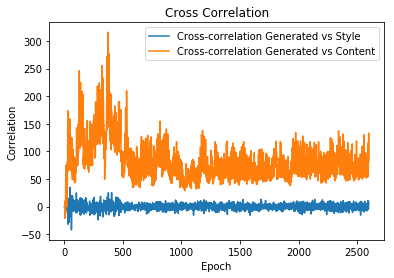

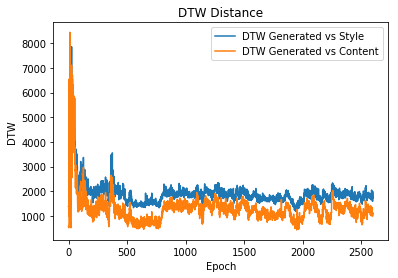

Epoch: 2601 
 Content Loss: 1.5801024436950684 
 Style Loss: 11.852251052856445 
 Total Loss: 13.432354927062988
Metrics - Content CC:[81.67631904], FFT:73.90555674078817, DTW:1084.8708351124008
Metrics - Style CC:[-12.36305276], FFT:186.0857498018043, DTW:1707.7432674283189
Epoch: 2602 
 Content Loss: 1.6150519847869873 
 Style Loss: 21.9876651763916 
 Total Loss: 23.60271644592285
Metrics - Content CC:[61.35214852], FFT:85.32411824548939, DTW:1141.0673898916943
Metrics - Style CC:[1.06727113], FFT:186.90524399929905, DTW:1901.1720874453838
Epoch: 2603 
 Content Loss: 1.5705575942993164 
 Style Loss: 15.723515510559082 
 Total Loss: 17.2940731048584
Metrics - Content CC:[60.99290621], FFT:79.58201660817896, DTW:1146.0650921738031
Metrics - Style CC:[-1.46826488], FFT:185.28197493032152, DTW:1871.171724549156
Epoch: 2604 
 Content Loss: 1.5203063488006592 
 Style Loss: 11.949155807495117 
 Total Loss: 13.469462394714355
Metrics - Content CC:[81.74930869], FFT:63.06994133686055, DTW:107

Epoch: 2632 
 Content Loss: 1.6119149923324585 
 Style Loss: 9.192912101745605 
 Total Loss: 10.804826736450195
Metrics - Content CC:[86.3964569], FFT:75.82168305509332, DTW:1144.1047651389629
Metrics - Style CC:[-5.48675427], FFT:203.0305469442132, DTW:1710.4123133369467
Epoch: 2633 
 Content Loss: 1.6148656606674194 
 Style Loss: 7.762442588806152 
 Total Loss: 9.377307891845703
Metrics - Content CC:[107.62175262], FFT:89.66902668451385, DTW:1250.1865015439616
Metrics - Style CC:[-2.40509885], FFT:203.7663915408696, DTW:1808.7499561579132
Epoch: 2634 
 Content Loss: 1.563319206237793 
 Style Loss: 7.10508394241333 
 Total Loss: 8.668403625488281
Metrics - Content CC:[66.50235082], FFT:73.74519357638499, DTW:1257.010519111361
Metrics - Style CC:[3.27261191], FFT:200.66013759596117, DTW:1748.5546697745156
Epoch: 2635 
 Content Loss: 1.5950466394424438 
 Style Loss: 5.0009355545043945 
 Total Loss: 6.595982551574707
Metrics - Content CC:[110.37880706], FFT:82.49674480828278, DTW:1154.57

Epoch: 2663 
 Content Loss: 1.4159551858901978 
 Style Loss: 7.209518909454346 
 Total Loss: 8.625473976135254
Metrics - Content CC:[58.29358404], FFT:47.68920509057184, DTW:1142.743827043326
Metrics - Style CC:[0.40304629], FFT:195.66086679616635, DTW:1724.2641732778554
Epoch: 2664 
 Content Loss: 1.4190425872802734 
 Style Loss: 10.50210952758789 
 Total Loss: 11.921152114868164
Metrics - Content CC:[57.99247464], FFT:46.729361646226046, DTW:924.721396586422
Metrics - Style CC:[3.12172968], FFT:199.68093814905905, DTW:1699.98952665142
Epoch: 2665 
 Content Loss: 1.470833420753479 
 Style Loss: 6.745678901672363 
 Total Loss: 8.216512680053711
Metrics - Content CC:[80.86907909], FFT:47.66447877944183, DTW:1226.3986121482833
Metrics - Style CC:[3.52167035], FFT:195.9080131524449, DTW:1820.207863655289
Epoch: 2666 
 Content Loss: 1.4708534479141235 
 Style Loss: 6.929441452026367 
 Total Loss: 8.40029525756836
Metrics - Content CC:[87.72643037], FFT:47.97277064684392, DTW:1140.861353920

Epoch: 2693 
 Content Loss: 1.519991159439087 
 Style Loss: 6.269479274749756 
 Total Loss: 7.789470672607422
Metrics - Content CC:[86.70261659], FFT:80.5985382663091, DTW:1089.7711749150144
Metrics - Style CC:[-4.2041355], FFT:209.65617251025972, DTW:1733.2844389197885
Epoch: 2694 
 Content Loss: 1.5341639518737793 
 Style Loss: 9.24850845336914 
 Total Loss: 10.782672882080078
Metrics - Content CC:[87.03911086], FFT:83.28823138186081, DTW:1118.8728571470194
Metrics - Style CC:[-2.83748836], FFT:209.2281890726023, DTW:1741.5434778826786
Epoch: 2695 
 Content Loss: 1.5291110277175903 
 Style Loss: 8.763020515441895 
 Total Loss: 10.292131423950195
Metrics - Content CC:[132.40297274], FFT:89.5607142077278, DTW:1278.2203166479544
Metrics - Style CC:[-6.47991174], FFT:200.38141926185415, DTW:1793.638232193492
Epoch: 2696 
 Content Loss: 1.512360692024231 
 Style Loss: 7.05080509185791 
 Total Loss: 8.563165664672852
Metrics - Content CC:[72.38048731], FFT:116.03803158637032, DTW:1230.8723

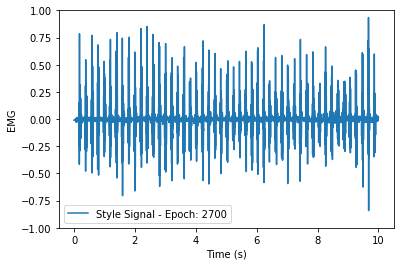

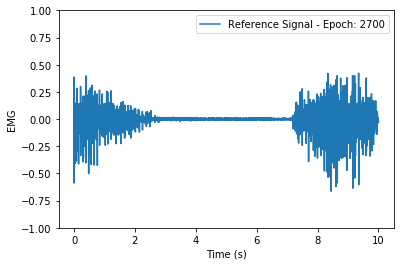

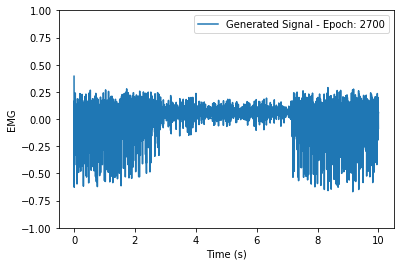

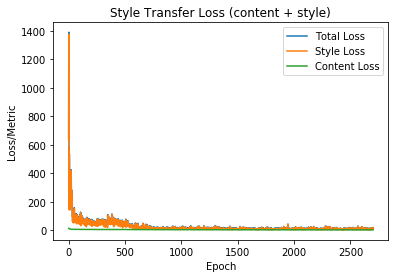

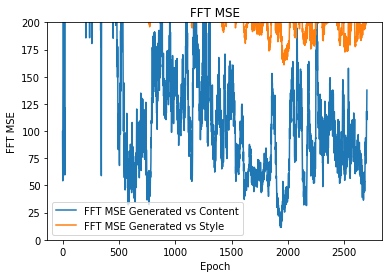

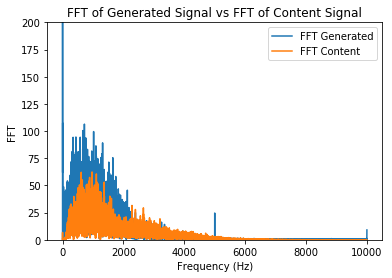

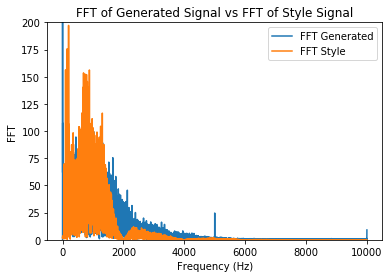

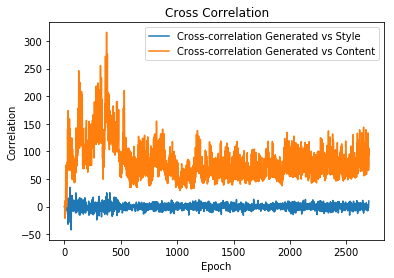

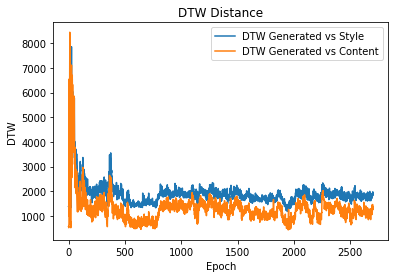

Epoch: 2701 
 Content Loss: 1.4900522232055664 
 Style Loss: 8.20290470123291 
 Total Loss: 9.692956924438477
Metrics - Content CC:[67.9964903], FFT:147.3924233796793, DTW:1467.5858626199145
Metrics - Style CC:[-3.59490032], FFT:225.02814902597902, DTW:1972.3726219609996
Epoch: 2702 
 Content Loss: 1.4877870082855225 
 Style Loss: 3.7229490280151367 
 Total Loss: 5.210736274719238
Metrics - Content CC:[82.90993548], FFT:106.74915693513684, DTW:1280.5421753336066
Metrics - Style CC:[1.94852419], FFT:215.87946705236868, DTW:1771.7188326982694
Epoch: 2703 
 Content Loss: 1.4893953800201416 
 Style Loss: 4.583410263061523 
 Total Loss: 6.072805404663086
Metrics - Content CC:[83.02259095], FFT:101.36263865717605, DTW:1241.2142028303856
Metrics - Style CC:[3.07238716], FFT:212.53739439457675, DTW:1788.8544391643475
Epoch: 2704 
 Content Loss: 1.5079023838043213 
 Style Loss: 7.919090747833252 
 Total Loss: 9.426993370056152
Metrics - Content CC:[104.22709878], FFT:109.93958588837015, DTW:130

Epoch: 2731 
 Content Loss: 1.4793120622634888 
 Style Loss: 13.351668357849121 
 Total Loss: 14.83098030090332
Metrics - Content CC:[74.35062007], FFT:47.28212563987571, DTW:1101.3638414045931
Metrics - Style CC:[-3.93102073], FFT:201.29757218533737, DTW:1673.1040116677955
Epoch: 2732 
 Content Loss: 1.486441969871521 
 Style Loss: 7.472557067871094 
 Total Loss: 8.958998680114746
Metrics - Content CC:[72.44412153], FFT:42.73782293291604, DTW:1078.737523215436
Metrics - Style CC:[-2.52053205], FFT:203.14715370220486, DTW:1589.4193859017792
Epoch: 2733 
 Content Loss: 1.5088553428649902 
 Style Loss: 5.569165229797363 
 Total Loss: 7.0780205726623535
Metrics - Content CC:[76.71143734], FFT:39.503584409230015, DTW:987.5511866648222
Metrics - Style CC:[0.13364854], FFT:201.7243863964038, DTW:1629.8077290170017
Epoch: 2734 
 Content Loss: 1.5266447067260742 
 Style Loss: 8.025492668151855 
 Total Loss: 9.55213737487793
Metrics - Content CC:[50.01148797], FFT:35.08539129637497, DTW:893.290

Epoch: 2762 
 Content Loss: 1.4440326690673828 
 Style Loss: 8.861748695373535 
 Total Loss: 10.305781364440918
Metrics - Content CC:[91.59440122], FFT:41.42544054821042, DTW:1076.654172403844
Metrics - Style CC:[-1.77288367], FFT:189.97982437184618, DTW:1591.6114276955002
Epoch: 2763 
 Content Loss: 1.406466007232666 
 Style Loss: 4.996893405914307 
 Total Loss: 6.403359413146973
Metrics - Content CC:[87.36608725], FFT:37.65152002130222, DTW:1022.3834899502847
Metrics - Style CC:[-2.51957265], FFT:189.85031620839226, DTW:1833.383223257495
Epoch: 2764 
 Content Loss: 1.4196652173995972 
 Style Loss: 9.872968673706055 
 Total Loss: 11.292634010314941
Metrics - Content CC:[80.68979987], FFT:36.20021200488046, DTW:983.9949920413678
Metrics - Style CC:[-0.85148369], FFT:196.2633124394836, DTW:1672.7884914690894
Epoch: 2765 
 Content Loss: 1.4378491640090942 
 Style Loss: 7.914278507232666 
 Total Loss: 9.352128028869629
Metrics - Content CC:[76.9824612], FFT:34.55103872182783, DTW:814.5373

Epoch: 2793 
 Content Loss: 1.462697982788086 
 Style Loss: 5.964276313781738 
 Total Loss: 7.426974296569824
Metrics - Content CC:[57.80545222], FFT:132.23658630250847, DTW:1412.9356584795444
Metrics - Style CC:[0.7879534], FFT:214.71754796560558, DTW:2046.6341434323683
Epoch: 2794 
 Content Loss: 1.3682955503463745 
 Style Loss: 5.855754852294922 
 Total Loss: 7.224050998687744
Metrics - Content CC:[55.25818394], FFT:96.47603125301427, DTW:1328.2849459517083
Metrics - Style CC:[6.71902168], FFT:199.9147385780174, DTW:1906.7467436178385
Epoch: 2795 
 Content Loss: 1.4870489835739136 
 Style Loss: 8.463807106018066 
 Total Loss: 9.95085620880127
Metrics - Content CC:[76.91823545], FFT:116.56625321435745, DTW:1383.006368241299
Metrics - Style CC:[-6.89236608], FFT:205.7684683809804, DTW:1849.2509770080073
Epoch: 2796 
 Content Loss: 1.4096653461456299 
 Style Loss: 7.752811908721924 
 Total Loss: 9.162477493286133
Metrics - Content CC:[51.62806604], FFT:114.68927749555702, DTW:1494.8332

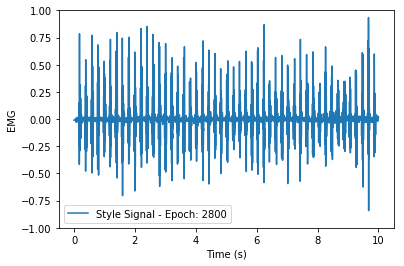

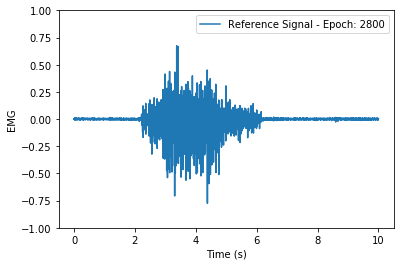

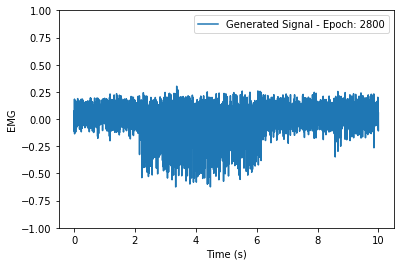

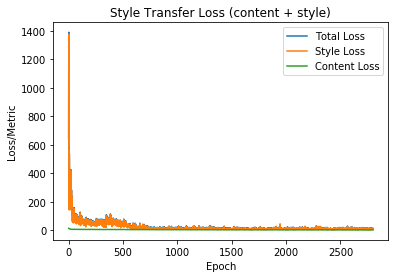

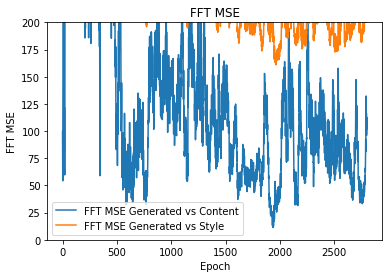

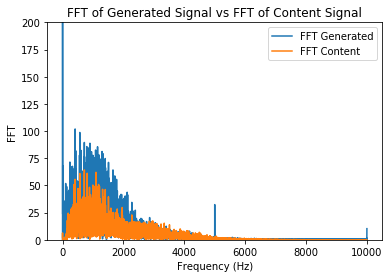

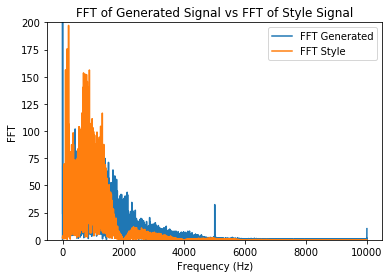

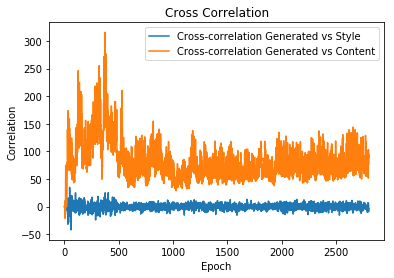

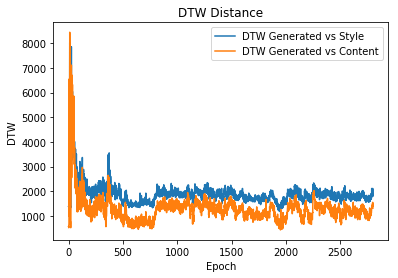

Epoch: 2801 
 Content Loss: 1.4310996532440186 
 Style Loss: 3.825809955596924 
 Total Loss: 5.256909370422363
Metrics - Content CC:[65.39053896], FFT:131.71294458476942, DTW:1460.625522330805
Metrics - Style CC:[2.33629142], FFT:219.8770494499761, DTW:1933.510461101535
Epoch: 2802 
 Content Loss: 1.4768081903457642 
 Style Loss: 6.346156120300293 
 Total Loss: 7.822964668273926
Metrics - Content CC:[61.72529318], FFT:130.17717053591292, DTW:1659.384994624279
Metrics - Style CC:[-4.95316199], FFT:218.02525869158362, DTW:2122.6678292503416
Epoch: 2803 
 Content Loss: 1.5689843893051147 
 Style Loss: 3.9780282974243164 
 Total Loss: 5.547012805938721
Metrics - Content CC:[94.08689718], FFT:100.1039463231684, DTW:1491.6161676242368
Metrics - Style CC:[3.50172818], FFT:212.66788771930706, DTW:1965.1628729742813
Epoch: 2804 
 Content Loss: 1.4949058294296265 
 Style Loss: 7.190968036651611 
 Total Loss: 8.685873985290527
Metrics - Content CC:[63.091302], FFT:138.7365484371571, DTW:1617.3439

Epoch: 2831 
 Content Loss: 1.6449271440505981 
 Style Loss: 5.2648701667785645 
 Total Loss: 6.909796714782715
Metrics - Content CC:[52.53682725], FFT:155.72870216349764, DTW:1541.3493432003404
Metrics - Style CC:[10.22851169], FFT:209.75157120461319, DTW:2046.1196008216468
Epoch: 2832 
 Content Loss: 1.6025539636611938 
 Style Loss: 16.417762756347656 
 Total Loss: 18.02031707763672
Metrics - Content CC:[76.10880056], FFT:118.62776213098749, DTW:1541.8646578807072
Metrics - Style CC:[-13.79031628], FFT:200.5192307752794, DTW:1955.6966010332462
Epoch: 2833 
 Content Loss: 1.5724282264709473 
 Style Loss: 8.845163345336914 
 Total Loss: 10.417591094970703
Metrics - Content CC:[82.58965265], FFT:145.86560690846463, DTW:1743.634801490222
Metrics - Style CC:[6.17029684], FFT:210.05332573583635, DTW:2042.5004791655526
Epoch: 2834 
 Content Loss: 1.5668734312057495 
 Style Loss: 4.487720489501953 
 Total Loss: 6.054594039916992
Metrics - Content CC:[59.03618276], FFT:153.62606723720958, DTW

Epoch: 2861 
 Content Loss: 1.4543663263320923 
 Style Loss: 7.24904727935791 
 Total Loss: 8.703413963317871
Metrics - Content CC:[82.20736805], FFT:60.03422725021113, DTW:1214.3168981368049
Metrics - Style CC:[-1.64107314], FFT:200.23649826741527, DTW:1692.513544973019
Epoch: 2862 
 Content Loss: 1.47636878490448 
 Style Loss: 7.808596134185791 
 Total Loss: 9.284964561462402
Metrics - Content CC:[62.47970955], FFT:72.31600039080651, DTW:1228.3444252123832
Metrics - Style CC:[5.22487275], FFT:207.14728270758488, DTW:1942.9279925257686
Epoch: 2863 
 Content Loss: 1.4595500230789185 
 Style Loss: 9.299630165100098 
 Total Loss: 10.759180068969727
Metrics - Content CC:[96.68763733], FFT:68.46530601331433, DTW:1274.705088776077
Metrics - Style CC:[3.7280788], FFT:201.25352832033218, DTW:1871.646019875299
Epoch: 2864 
 Content Loss: 1.470823049545288 
 Style Loss: 8.778850555419922 
 Total Loss: 10.249673843383789
Metrics - Content CC:[62.99134225], FFT:63.10081435709454, DTW:1141.1355691

Epoch: 2892 
 Content Loss: 1.4784005880355835 
 Style Loss: 6.147033214569092 
 Total Loss: 7.625433921813965
Metrics - Content CC:[77.6341152], FFT:99.07322489250826, DTW:1342.640352524689
Metrics - Style CC:[1.82759212], FFT:219.7319537657834, DTW:1959.212031079081
Epoch: 2893 
 Content Loss: 1.5651308298110962 
 Style Loss: 10.062039375305176 
 Total Loss: 11.62717056274414
Metrics - Content CC:[83.27748971], FFT:74.89720868642968, DTW:1310.4128907322654
Metrics - Style CC:[1.64389126], FFT:220.88241993681575, DTW:1819.1832455251379
Epoch: 2894 
 Content Loss: 1.476169228553772 
 Style Loss: 8.363524436950684 
 Total Loss: 9.839694023132324
Metrics - Content CC:[100.81235548], FFT:85.81894530470505, DTW:1257.6661221981697
Metrics - Style CC:[-0.98451201], FFT:228.7998950575491, DTW:1843.8286724748818
Epoch: 2895 
 Content Loss: 1.5411938428878784 
 Style Loss: 7.02667236328125 
 Total Loss: 8.567866325378418
Metrics - Content CC:[94.26211817], FFT:83.3082226599075, DTW:1261.7233785

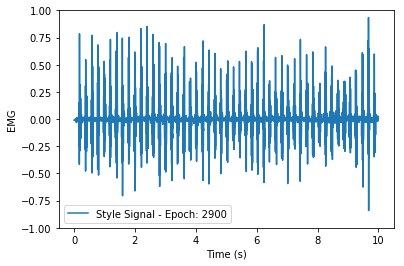

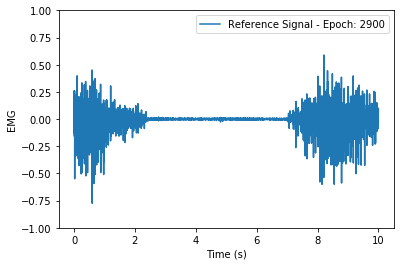

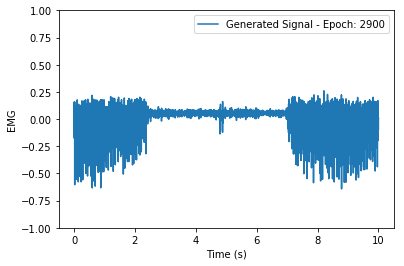

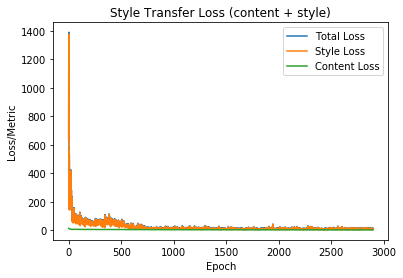

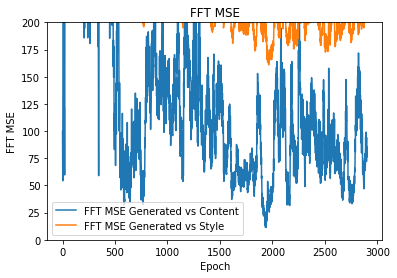

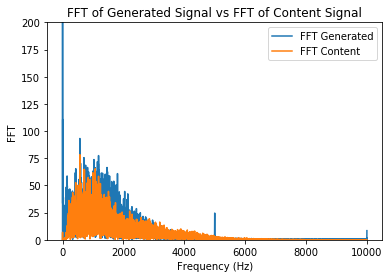

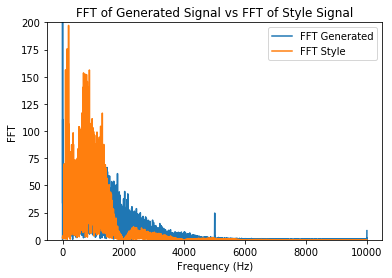

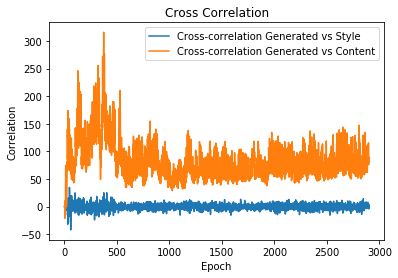

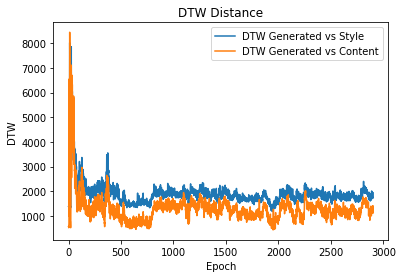

Epoch: 2901 
 Content Loss: 1.5038031339645386 
 Style Loss: 7.76035213470459 
 Total Loss: 9.264155387878418
Metrics - Content CC:[59.52807283], FFT:89.07815444681624, DTW:1455.2474943934262
Metrics - Style CC:[0.16517234], FFT:230.50058183395234, DTW:1715.9351659349122
Epoch: 2902 
 Content Loss: 1.5007269382476807 
 Style Loss: 6.015625 
 Total Loss: 7.516351222991943
Metrics - Content CC:[56.41486878], FFT:75.71500502249016, DTW:1327.5717027826715
Metrics - Style CC:[2.4536006], FFT:229.16274686436347, DTW:1795.3990542264312
Epoch: 2903 
 Content Loss: 1.5374386310577393 
 Style Loss: 7.50932502746582 
 Total Loss: 9.04676342010498
Metrics - Content CC:[78.23256194], FFT:82.28214982776957, DTW:1326.7719512544156
Metrics - Style CC:[-1.04097039], FFT:228.03048648023656, DTW:1797.30912419591
Epoch: 2904 
 Content Loss: 1.5100393295288086 
 Style Loss: 7.940697193145752 
 Total Loss: 9.450736999511719
Metrics - Content CC:[57.45647234], FFT:71.55094218343048, DTW:1189.1055410460267
Me

Epoch: 2932 
 Content Loss: 1.4308117628097534 
 Style Loss: 7.795306205749512 
 Total Loss: 9.226118087768555
Metrics - Content CC:[63.21864141], FFT:78.52823626491217, DTW:1294.7118181396497
Metrics - Style CC:[3.47867573], FFT:223.62081750693756, DTW:1842.9476468320047
Epoch: 2933 
 Content Loss: 1.4528491497039795 
 Style Loss: 6.219756603240967 
 Total Loss: 7.672605991363525
Metrics - Content CC:[79.89460372], FFT:76.04734815751124, DTW:1190.9163098830047
Metrics - Style CC:[2.66550905], FFT:223.02120393457167, DTW:1708.7481449265456
Epoch: 2934 
 Content Loss: 1.3874306678771973 
 Style Loss: 6.515870571136475 
 Total Loss: 7.903301239013672
Metrics - Content CC:[59.88274239], FFT:76.19083500810504, DTW:1224.0976707918355
Metrics - Style CC:[-5.2724324], FFT:215.59639036339107, DTW:1758.150730870057
Epoch: 2935 
 Content Loss: 1.4370641708374023 
 Style Loss: 5.982980728149414 
 Total Loss: 7.420044898986816
Metrics - Content CC:[82.89671225], FFT:80.30535198772652, DTW:1269.384

Epoch: 2963 
 Content Loss: 1.3743987083435059 
 Style Loss: 5.198930263519287 
 Total Loss: 6.573328971862793
Metrics - Content CC:[77.79807113], FFT:85.80574395172401, DTW:1329.5574528366935
Metrics - Style CC:[1.6699333], FFT:223.13228980384187, DTW:1803.0968795762367
Epoch: 2964 
 Content Loss: 1.3891396522521973 
 Style Loss: 5.47670316696167 
 Total Loss: 6.865843296051025
Metrics - Content CC:[78.88111501], FFT:80.03492923512854, DTW:1177.7702114526562
Metrics - Style CC:[2.24560017], FFT:221.61667112462138, DTW:1689.9138326413558
Epoch: 2965 
 Content Loss: 1.410762071609497 
 Style Loss: 13.162455558776855 
 Total Loss: 14.573217391967773
Metrics - Content CC:[85.6589897], FFT:92.48996081189242, DTW:1301.8789559578074
Metrics - Style CC:[-3.85746159], FFT:219.7223476086205, DTW:1953.6623948152514
Epoch: 2966 
 Content Loss: 1.3766381740570068 
 Style Loss: 12.696955680847168 
 Total Loss: 14.07359504699707
Metrics - Content CC:[93.29152004], FFT:86.63791678149573, DTW:1401.912

Epoch: 2994 
 Content Loss: 1.4460499286651611 
 Style Loss: 5.406436443328857 
 Total Loss: 6.852486610412598
Metrics - Content CC:[87.40183621], FFT:63.14164360324341, DTW:1088.2739192091287
Metrics - Style CC:[3.92431115], FFT:206.9152273537071, DTW:1787.7847188068877
Epoch: 2995 
 Content Loss: 1.3927791118621826 
 Style Loss: 9.916927337646484 
 Total Loss: 11.309706687927246
Metrics - Content CC:[90.37173816], FFT:63.80168728493029, DTW:1061.9404945784363
Metrics - Style CC:[6.80820147], FFT:207.94196175197558, DTW:1715.2454562979638
Epoch: 2996 
 Content Loss: 1.3791370391845703 
 Style Loss: 6.138401985168457 
 Total Loss: 7.517539024353027
Metrics - Content CC:[66.54105678], FFT:65.2884880365155, DTW:953.8685029814327
Metrics - Style CC:[-1.09337199], FFT:213.89823167086618, DTW:1702.08960522304
Epoch: 2997 
 Content Loss: 1.4001903533935547 
 Style Loss: 7.099172592163086 
 Total Loss: 8.49936294555664
Metrics - Content CC:[89.27969393], FFT:61.63019555324184, DTW:1129.791290

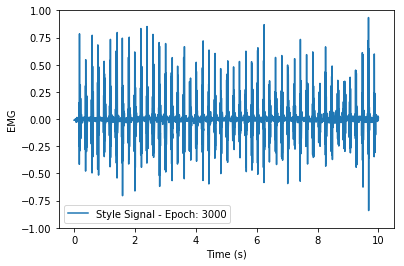

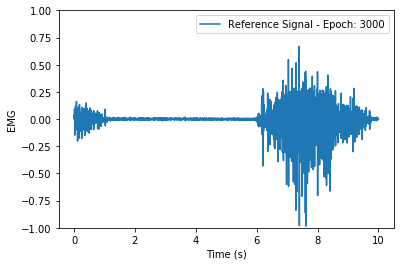

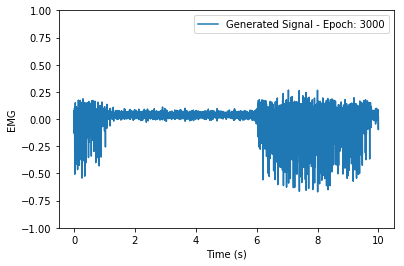

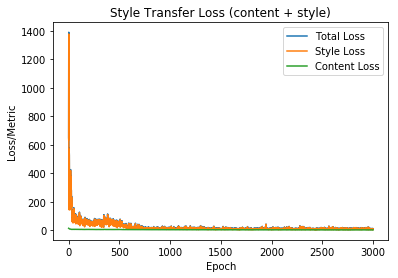

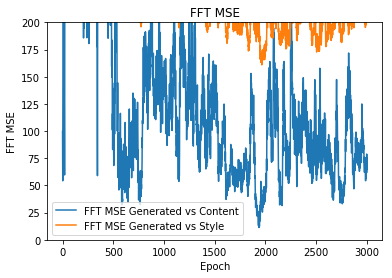

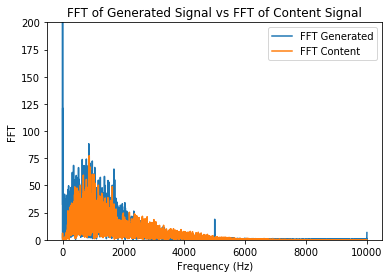

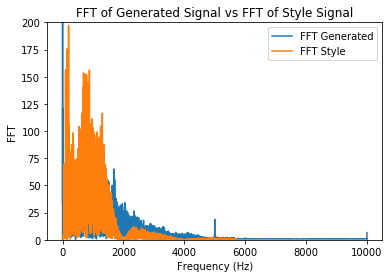

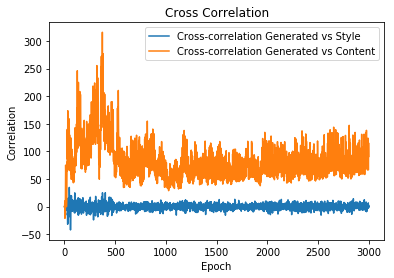

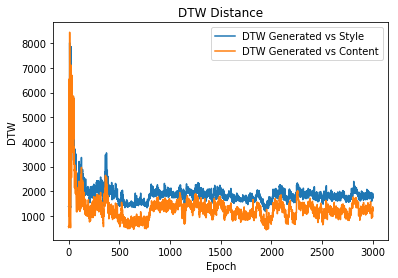

Epoch: 3001 
 Content Loss: 1.3789252042770386 
 Style Loss: 5.300965309143066 
 Total Loss: 6.6798906326293945
Metrics - Content CC:[95.81713905], FFT:75.07574499509224, DTW:1407.2582689785431
Metrics - Style CC:[-2.20382361], FFT:213.18174400456226, DTW:1716.369227732438
Epoch: 3002 
 Content Loss: 1.3552204370498657 
 Style Loss: 4.4189839363098145 
 Total Loss: 5.774204254150391
Metrics - Content CC:[88.93741471], FFT:76.87651172995007, DTW:1217.6749010496817
Metrics - Style CC:[0.37375492], FFT:209.85347629425135, DTW:1712.1315708500692
Epoch: 3003 
 Content Loss: 1.3718591928482056 
 Style Loss: 5.333911895751953 
 Total Loss: 6.705770969390869
Metrics - Content CC:[63.41332214], FFT:73.46137304664731, DTW:1042.207529932404
Metrics - Style CC:[-1.38471633], FFT:220.53514838619603, DTW:1856.7769329870953
Epoch: 3004 
 Content Loss: 1.3831425905227661 
 Style Loss: 15.35074520111084 
 Total Loss: 16.733888626098633
Metrics - Content CC:[83.05920505], FFT:72.90112569876185, DTW:1022

Epoch: 3032 
 Content Loss: 1.3072413206100464 
 Style Loss: 8.85808277130127 
 Total Loss: 10.165324211120605
Metrics - Content CC:[57.72315587], FFT:93.42772155568078, DTW:1377.9452923765089
Metrics - Style CC:[8.14328485], FFT:194.9309962328024, DTW:1882.8068538954358
Epoch: 3033 
 Content Loss: 1.3012298345565796 
 Style Loss: 3.8065712451934814 
 Total Loss: 5.1078009605407715
Metrics - Content CC:[56.5327311], FFT:94.10763659897334, DTW:1276.9187899483284
Metrics - Style CC:[-2.81189124], FFT:196.02016171838875, DTW:1843.0470621671686
Epoch: 3034 
 Content Loss: 1.4029549360275269 
 Style Loss: 7.111446380615234 
 Total Loss: 8.51440143585205
Metrics - Content CC:[99.47019657], FFT:79.36439650520647, DTW:1300.4801489308013
Metrics - Style CC:[-4.9148938], FFT:207.2801435299572, DTW:1825.5072791482414
Epoch: 3035 
 Content Loss: 1.432023286819458 
 Style Loss: 6.585575580596924 
 Total Loss: 8.017599105834961
Metrics - Content CC:[70.59970319], FFT:75.64807541736306, DTW:1150.2751

Epoch: 3063 
 Content Loss: 1.333832025527954 
 Style Loss: 5.405218124389648 
 Total Loss: 6.739050388336182
Metrics - Content CC:[57.33733019], FFT:62.28628296110878, DTW:1116.0471598357565
Metrics - Style CC:[-7.0652232], FFT:205.6151827498367, DTW:1791.1122216929714
Epoch: 3064 
 Content Loss: 1.3607383966445923 
 Style Loss: 4.048722267150879 
 Total Loss: 5.409460544586182
Metrics - Content CC:[57.55161516], FFT:63.19227084508027, DTW:1030.6649996444464
Metrics - Style CC:[3.62910123], FFT:205.9703690249935, DTW:1662.8919427173093
Epoch: 3065 
 Content Loss: 1.4033629894256592 
 Style Loss: 5.6270222663879395 
 Total Loss: 7.0303850173950195
Metrics - Content CC:[65.31777577], FFT:66.40683168557256, DTW:1008.5134833502326
Metrics - Style CC:[-3.36932309], FFT:207.61033482247717, DTW:1841.5229710829337
Epoch: 3066 
 Content Loss: 1.3483854532241821 
 Style Loss: 6.243136405944824 
 Total Loss: 7.591521263122559
Metrics - Content CC:[105.62778582], FFT:63.25423224789294, DTW:1356.6

Epoch: 3094 
 Content Loss: 1.5741370916366577 
 Style Loss: 3.2171356678009033 
 Total Loss: 4.7912726402282715
Metrics - Content CC:[91.27132138], FFT:72.60834420057392, DTW:960.7434535167295
Metrics - Style CC:[7.31003734], FFT:186.33599407317527, DTW:1754.5037468035705
Epoch: 3095 
 Content Loss: 1.6249873638153076 
 Style Loss: 5.927342891693115 
 Total Loss: 7.552330017089844
Metrics - Content CC:[142.23387353], FFT:94.4133612494233, DTW:1185.149846648869
Metrics - Style CC:[3.24450017], FFT:195.7127780823337, DTW:1791.8465483832342
Epoch: 3096 
 Content Loss: 1.6564439535140991 
 Style Loss: 3.6967999935150146 
 Total Loss: 5.353243827819824
Metrics - Content CC:[118.37366195], FFT:98.43356207324732, DTW:1249.6572043799872
Metrics - Style CC:[0.95321815], FFT:194.6263444678858, DTW:1980.0792011929043
Epoch: 3097 
 Content Loss: 1.5764614343643188 
 Style Loss: 6.483757972717285 
 Total Loss: 8.060219764709473
Metrics - Content CC:[134.48527482], FFT:97.04052172690895, DTW:1160.7

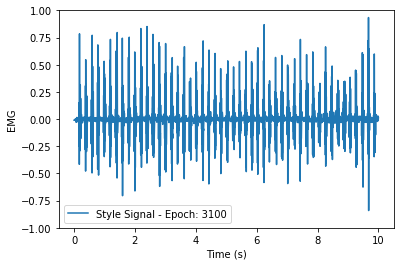

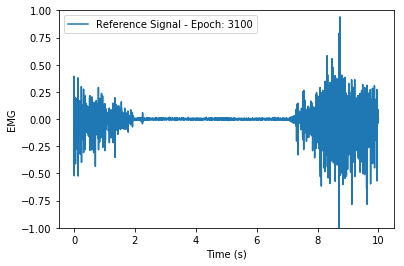

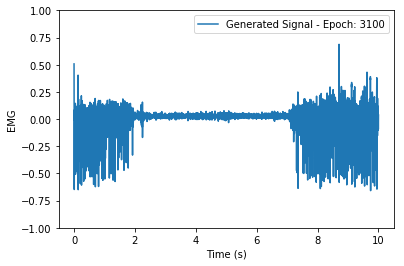

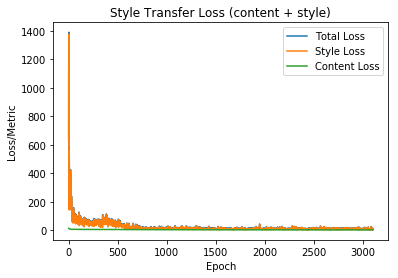

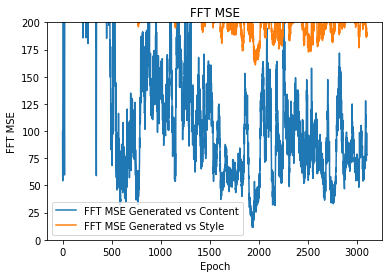

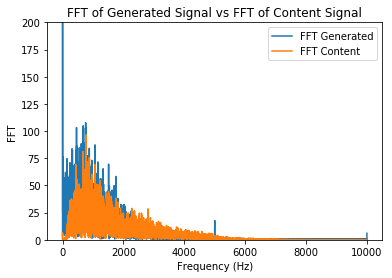

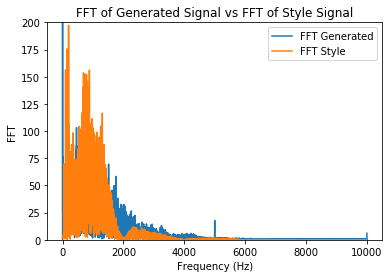

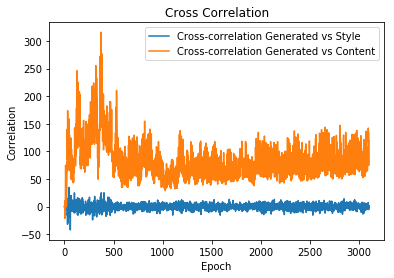

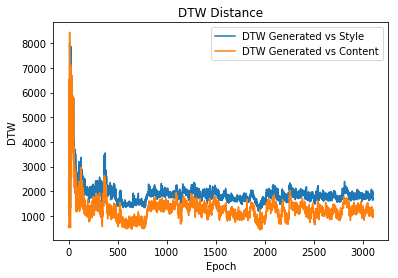

Epoch: 3101 
 Content Loss: 1.4800876379013062 
 Style Loss: 6.127155303955078 
 Total Loss: 7.607243537902832
Metrics - Content CC:[68.59670628], FFT:65.75749665978232, DTW:997.2495801339884
Metrics - Style CC:[3.46826829], FFT:189.5868818024116, DTW:1718.569847447127
Epoch: 3102 
 Content Loss: 1.4736522436141968 
 Style Loss: 8.835136413574219 
 Total Loss: 10.308788299560547
Metrics - Content CC:[96.81080199], FFT:56.78430131777874, DTW:876.2393518686871
Metrics - Style CC:[6.50011054], FFT:175.93859230276735, DTW:1709.7068502771765
Epoch: 3103 
 Content Loss: 1.554517149925232 
 Style Loss: 7.796748161315918 
 Total Loss: 9.351264953613281
Metrics - Content CC:[141.59242714], FFT:71.00450816384985, DTW:1056.616647525571
Metrics - Style CC:[-0.17896756], FFT:180.6876515709822, DTW:1717.6343087753798
Epoch: 3104 
 Content Loss: 1.4628195762634277 
 Style Loss: 8.005352973937988 
 Total Loss: 9.468172073364258
Metrics - Content CC:[69.5170458], FFT:55.780199386698584, DTW:799.3942532

Epoch: 3132 
 Content Loss: 1.4133845567703247 
 Style Loss: 5.570136070251465 
 Total Loss: 6.9835205078125
Metrics - Content CC:[56.58036355], FFT:70.32180287200525, DTW:1084.9974314267768
Metrics - Style CC:[1.14670352], FFT:205.61687389128184, DTW:1723.0305279548063
Epoch: 3133 
 Content Loss: 1.460038423538208 
 Style Loss: 6.144317626953125 
 Total Loss: 7.604355812072754
Metrics - Content CC:[82.04453558], FFT:56.2692595043847, DTW:1024.972643715293
Metrics - Style CC:[-2.39040311], FFT:201.06302694970483, DTW:1779.6581947121938
Epoch: 3134 
 Content Loss: 1.4835330247879028 
 Style Loss: 3.4305992126464844 
 Total Loss: 4.914132118225098
Metrics - Content CC:[54.29366902], FFT:63.789086691331455, DTW:1045.6951456917232
Metrics - Style CC:[-1.47032144], FFT:209.359908673928, DTW:1676.5007683652934
Epoch: 3135 
 Content Loss: 1.4273309707641602 
 Style Loss: 6.584791660308838 
 Total Loss: 8.012123107910156
Metrics - Content CC:[54.03170718], FFT:66.79097637265171, DTW:1009.82543

Epoch: 3163 
 Content Loss: 1.403035283088684 
 Style Loss: 5.971413612365723 
 Total Loss: 7.374449253082275
Metrics - Content CC:[132.74859311], FFT:60.42600334912778, DTW:1114.472471202058
Metrics - Style CC:[-3.89450014], FFT:198.52750913200973, DTW:1824.41292594348
Epoch: 3164 
 Content Loss: 1.4147385358810425 
 Style Loss: 7.055178165435791 
 Total Loss: 8.469916343688965
Metrics - Content CC:[104.80466634], FFT:52.598311202321426, DTW:1140.6580547087367
Metrics - Style CC:[3.37687342], FFT:197.41233135156452, DTW:1683.8765936905224
Epoch: 3165 
 Content Loss: 1.3881769180297852 
 Style Loss: 9.621255874633789 
 Total Loss: 11.009432792663574
Metrics - Content CC:[81.18065312], FFT:54.255881574110965, DTW:1241.8035853804547
Metrics - Style CC:[1.42016463], FFT:199.86910719412916, DTW:1682.0453194098093
Epoch: 3166 
 Content Loss: 1.3720494508743286 
 Style Loss: 7.546228408813477 
 Total Loss: 8.918277740478516
Metrics - Content CC:[98.60143104], FFT:46.083981615534384, DTW:1128

Epoch: 3194 
 Content Loss: 1.3608301877975464 
 Style Loss: 6.107822418212891 
 Total Loss: 7.468652248382568
Metrics - Content CC:[62.61703205], FFT:79.42345525416579, DTW:1207.351327985246
Metrics - Style CC:[6.26731318], FFT:219.189301377146, DTW:1826.3707633466404
Epoch: 3195 
 Content Loss: 1.4596763849258423 
 Style Loss: 3.9208109378814697 
 Total Loss: 5.380487442016602
Metrics - Content CC:[137.87643802], FFT:89.8874443452597, DTW:1527.8189649468666
Metrics - Style CC:[3.80263635], FFT:214.2014458770852, DTW:2020.535899873855
Epoch: 3196 
 Content Loss: 1.4233689308166504 
 Style Loss: 7.150445461273193 
 Total Loss: 8.573814392089844
Metrics - Content CC:[84.11513425], FFT:88.60916237499751, DTW:1376.8155854598199
Metrics - Style CC:[7.24322805], FFT:222.17358378479153, DTW:1867.9183808645405
Epoch: 3197 
 Content Loss: 1.504230260848999 
 Style Loss: 11.455028533935547 
 Total Loss: 12.959259033203125
Metrics - Content CC:[92.21750032], FFT:91.81718686025214, DTW:1272.76751

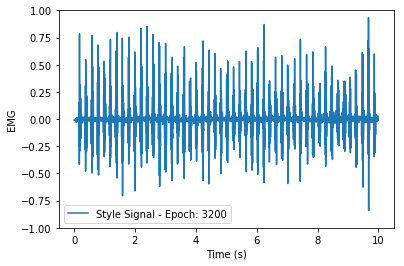

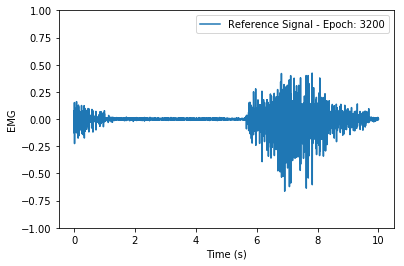

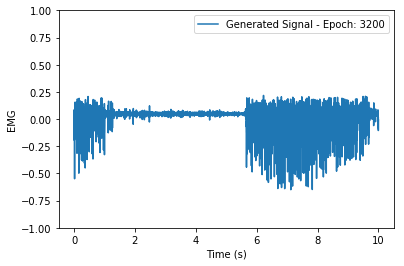

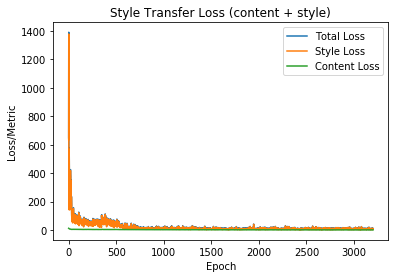

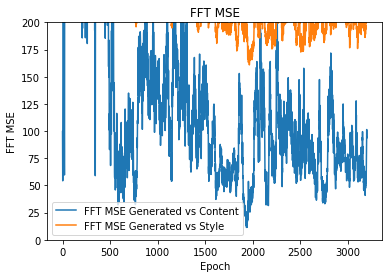

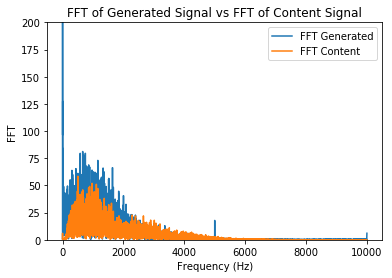

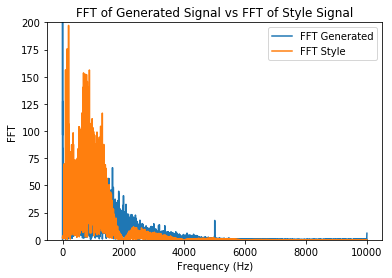

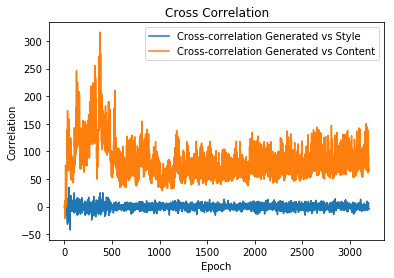

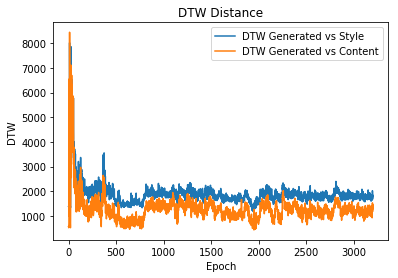

Epoch: 3201 
 Content Loss: 1.4346582889556885 
 Style Loss: 6.6460700035095215 
 Total Loss: 8.080728530883789
Metrics - Content CC:[95.71287224], FFT:106.05750607056893, DTW:1427.9662915979097
Metrics - Style CC:[1.68704614], FFT:220.65409161005203, DTW:2068.2252052778326
Epoch: 3202 
 Content Loss: 1.5162944793701172 
 Style Loss: 11.388882637023926 
 Total Loss: 12.905177116394043
Metrics - Content CC:[85.69942477], FFT:79.82636699018498, DTW:1142.5521219767638
Metrics - Style CC:[-0.79188951], FFT:219.78765502935104, DTW:1798.7019224895978
Epoch: 3203 
 Content Loss: 1.4154384136199951 
 Style Loss: 6.992548942565918 
 Total Loss: 8.407987594604492
Metrics - Content CC:[94.15326698], FFT:80.71108362555081, DTW:1240.2380750770908
Metrics - Style CC:[-6.86383326], FFT:215.87204656123382, DTW:1866.0144078904843
Epoch: 3204 
 Content Loss: 1.4238333702087402 
 Style Loss: 9.6434965133667 
 Total Loss: 11.067329406738281
Metrics - Content CC:[64.73566405], FFT:95.02950596555614, DTW:14

Epoch: 3232 
 Content Loss: 1.3722375631332397 
 Style Loss: 7.37350606918335 
 Total Loss: 8.745743751525879
Metrics - Content CC:[138.9091581], FFT:59.86562240077435, DTW:1327.7965264805944
Metrics - Style CC:[-2.13101821], FFT:189.65642156934211, DTW:1850.1745494584154
Epoch: 3233 
 Content Loss: 1.3174185752868652 
 Style Loss: 5.798443794250488 
 Total Loss: 7.1158623695373535
Metrics - Content CC:[128.80176754], FFT:58.90860328407151, DTW:1162.8338002835533
Metrics - Style CC:[-4.77644271], FFT:200.73428762883827, DTW:1818.7812822293638
Epoch: 3234 
 Content Loss: 1.3468972444534302 
 Style Loss: 12.11193561553955 
 Total Loss: 13.458833694458008
Metrics - Content CC:[138.59086641], FFT:61.831545932164715, DTW:1373.7860541335067
Metrics - Style CC:[-3.14836974], FFT:190.22497014114546, DTW:1866.7792270089192
Epoch: 3235 
 Content Loss: 1.3167974948883057 
 Style Loss: 5.213919639587402 
 Total Loss: 6.530716896057129
Metrics - Content CC:[64.72474232], FFT:48.621595359031666, DTW

Epoch: 3263 
 Content Loss: 1.3587855100631714 
 Style Loss: 3.8322651386260986 
 Total Loss: 5.1910505294799805
Metrics - Content CC:[58.64303792], FFT:29.865275940338027, DTW:776.0314027923612
Metrics - Style CC:[5.72984265], FFT:202.73620367832086, DTW:1561.3919767990403
Epoch: 3264 
 Content Loss: 1.414990782737732 
 Style Loss: 7.439631462097168 
 Total Loss: 8.854621887207031
Metrics - Content CC:[79.83729804], FFT:32.47823953335502, DTW:977.2123642222592
Metrics - Style CC:[-1.71271214], FFT:200.67834514997168, DTW:1649.7363286476907
Epoch: 3265 
 Content Loss: 1.4345283508300781 
 Style Loss: 6.663305282592773 
 Total Loss: 8.097833633422852
Metrics - Content CC:[123.50208172], FFT:42.92437318969304, DTW:1325.9320171869497
Metrics - Style CC:[-3.92634285], FFT:190.87312495343335, DTW:1733.7248844242026
Epoch: 3266 
 Content Loss: 1.4650928974151611 
 Style Loss: 6.581976413726807 
 Total Loss: 8.047069549560547
Metrics - Content CC:[62.59135511], FFT:36.03060816062691, DTW:863.

Epoch: 3293 
 Content Loss: 1.3962643146514893 
 Style Loss: 5.776841163635254 
 Total Loss: 7.173104763031006
Metrics - Content CC:[99.69954502], FFT:69.81133652905247, DTW:1079.584101676987
Metrics - Style CC:[2.18971131], FFT:198.59012291777682, DTW:1737.0511615926039
Epoch: 3294 
 Content Loss: 1.4476065635681152 
 Style Loss: 7.651752471923828 
 Total Loss: 9.099359512329102
Metrics - Content CC:[94.26797906], FFT:77.01683750341657, DTW:1085.9199380476032
Metrics - Style CC:[-2.00005807], FFT:207.47127309046584, DTW:1729.6970977772526
Epoch: 3295 
 Content Loss: 1.3887158632278442 
 Style Loss: 7.873958587646484 
 Total Loss: 9.262674331665039
Metrics - Content CC:[122.79399649], FFT:104.07170264113662, DTW:1370.2324376627869
Metrics - Style CC:[-0.49103408], FFT:219.15777728129385, DTW:1959.9299012307542
Epoch: 3296 
 Content Loss: 1.4909440279006958 
 Style Loss: 7.000273704528809 
 Total Loss: 8.491217613220215
Metrics - Content CC:[102.36408571], FFT:78.55848292570869, DTW:118

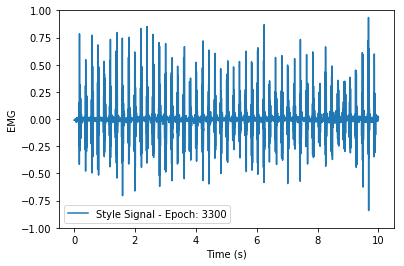

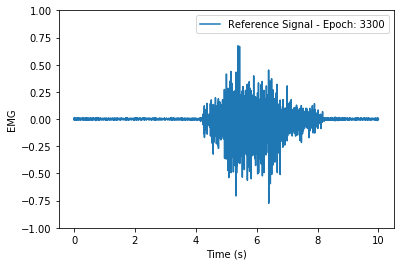

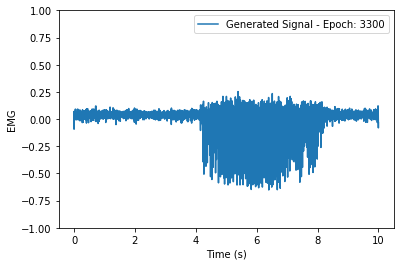

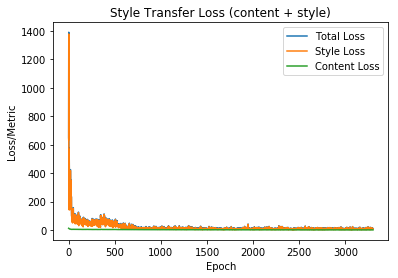

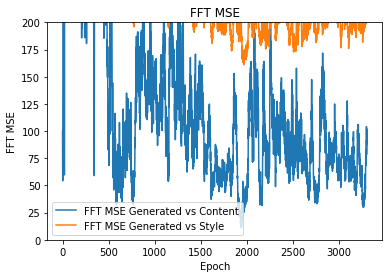

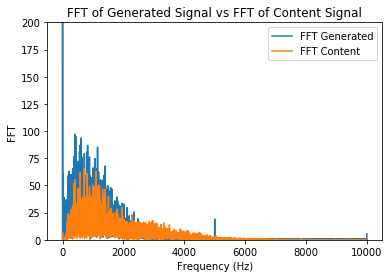

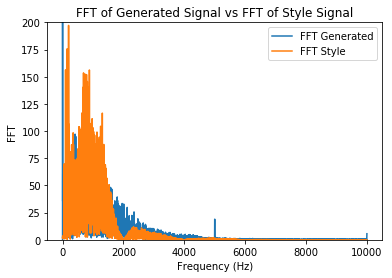

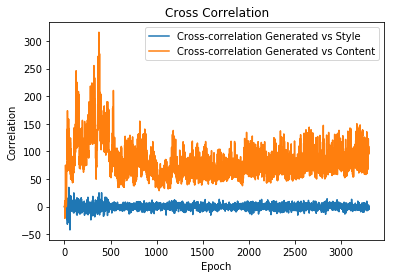

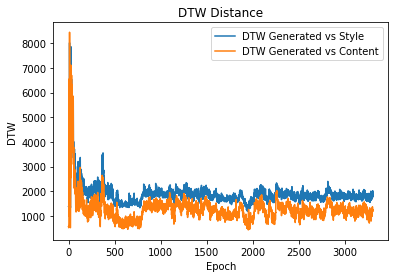

Epoch: 3301 
 Content Loss: 1.4647188186645508 
 Style Loss: 4.058019638061523 
 Total Loss: 5.522738456726074
Metrics - Content CC:[95.03817295], FFT:90.763437362625, DTW:1335.64716826013
Metrics - Style CC:[6.58493946], FFT:211.28945070427184, DTW:1804.0965512363584
Epoch: 3302 
 Content Loss: 1.4599946737289429 
 Style Loss: 10.796677589416504 
 Total Loss: 12.256671905517578
Metrics - Content CC:[124.78515731], FFT:104.30850360782, DTW:1374.2556543088024
Metrics - Style CC:[-3.07924854], FFT:209.9684116026713, DTW:1987.5024401875505
Epoch: 3303 
 Content Loss: 1.4461121559143066 
 Style Loss: 8.409772872924805 
 Total Loss: 9.855884552001953
Metrics - Content CC:[122.52489555], FFT:90.02758688976397, DTW:1277.24090681713
Metrics - Style CC:[-3.66968994], FFT:208.60829620830583, DTW:1857.5103639692438
Epoch: 3304 
 Content Loss: 1.4194424152374268 
 Style Loss: 5.498197078704834 
 Total Loss: 6.91763973236084
Metrics - Content CC:[90.98269914], FFT:89.76231859505944, DTW:1121.039476

Epoch: 3332 
 Content Loss: 1.377572774887085 
 Style Loss: 7.272333145141602 
 Total Loss: 8.649906158447266
Metrics - Content CC:[82.65250896], FFT:49.134137178837044, DTW:1007.1628161444212
Metrics - Style CC:[0.18229103], FFT:203.4828565283191, DTW:1697.6133435986778
Epoch: 3333 
 Content Loss: 1.3872610330581665 
 Style Loss: 6.470806121826172 
 Total Loss: 7.858067512512207
Metrics - Content CC:[89.87474947], FFT:47.21298215071698, DTW:1270.3733509268102
Metrics - Style CC:[-2.86371016], FFT:195.98555087731503, DTW:1775.1099773089254
Epoch: 3334 
 Content Loss: 1.3446195125579834 
 Style Loss: 19.105377197265625 
 Total Loss: 20.449996948242188
Metrics - Content CC:[84.4650624], FFT:43.630544489950246, DTW:910.8675101897803
Metrics - Style CC:[4.05462991], FFT:196.25382525926722, DTW:1729.6695154425465
Epoch: 3335 
 Content Loss: 1.4381296634674072 
 Style Loss: 5.404324054718018 
 Total Loss: 6.842453956604004
Metrics - Content CC:[124.87342277], FFT:54.780706492057845, DTW:1161

Epoch: 3363 
 Content Loss: 1.2773845195770264 
 Style Loss: 4.353426933288574 
 Total Loss: 5.63081169128418
Metrics - Content CC:[65.71365154], FFT:87.99150472287485, DTW:1396.9166119602824
Metrics - Style CC:[-6.24255305], FFT:197.42409515398816, DTW:1924.134122058846
Epoch: 3364 
 Content Loss: 1.3291932344436646 
 Style Loss: 8.497878074645996 
 Total Loss: 9.827071189880371
Metrics - Content CC:[90.82735498], FFT:119.63456384748737, DTW:1347.8013983818635
Metrics - Style CC:[-8.01201319], FFT:204.5146772831364, DTW:1935.3187856247794
Epoch: 3365 
 Content Loss: 1.3320075273513794 
 Style Loss: 6.848835468292236 
 Total Loss: 8.180843353271484
Metrics - Content CC:[93.69087905], FFT:137.2786828103884, DTW:1540.254332179795
Metrics - Style CC:[-1.18545592], FFT:213.0384511956819, DTW:1964.5658738422842
Epoch: 3366 
 Content Loss: 1.3506823778152466 
 Style Loss: 8.529485702514648 
 Total Loss: 9.880167961120605
Metrics - Content CC:[100.42535055], FFT:121.3001659974988, DTW:1482.02

Epoch: 3393 
 Content Loss: 1.4192047119140625 
 Style Loss: 6.477413654327393 
 Total Loss: 7.896618843078613
Metrics - Content CC:[95.00536777], FFT:97.41980615769663, DTW:1255.0569440233369
Metrics - Style CC:[-4.43930356], FFT:198.94483512605896, DTW:1813.535733125629
Epoch: 3394 
 Content Loss: 1.3934012651443481 
 Style Loss: 6.36544132232666 
 Total Loss: 7.758842468261719
Metrics - Content CC:[127.67474631], FFT:104.05964196670158, DTW:1363.8449347950602
Metrics - Style CC:[5.83935701], FFT:213.27647128305134, DTW:1956.4223622330574
Epoch: 3395 
 Content Loss: 1.437347650527954 
 Style Loss: 5.286078453063965 
 Total Loss: 6.72342586517334
Metrics - Content CC:[133.13389147], FFT:111.11224934289802, DTW:1510.5647498735634
Metrics - Style CC:[-2.11105041], FFT:212.06044691810678, DTW:2162.3921358103835
Epoch: 3396 
 Content Loss: 1.5067089796066284 
 Style Loss: 9.258035659790039 
 Total Loss: 10.764744758605957
Metrics - Content CC:[105.23334196], FFT:110.83840622362656, DTW:15

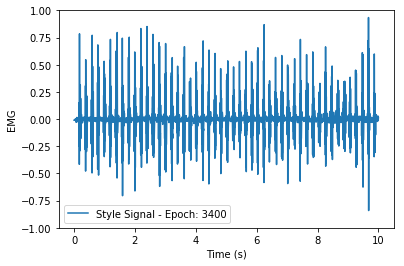

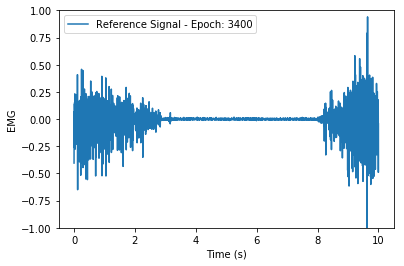

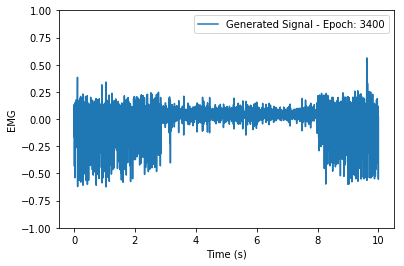

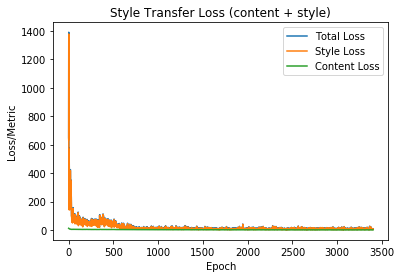

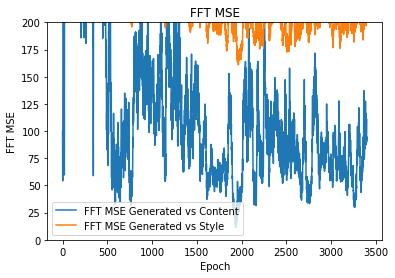

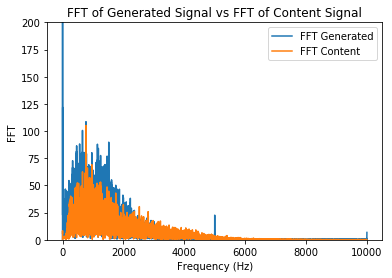

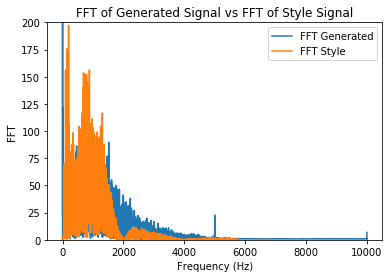

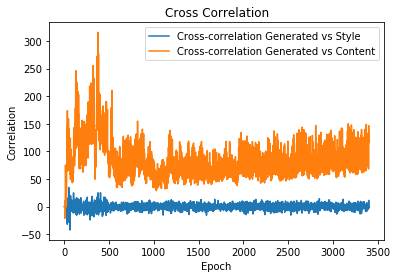

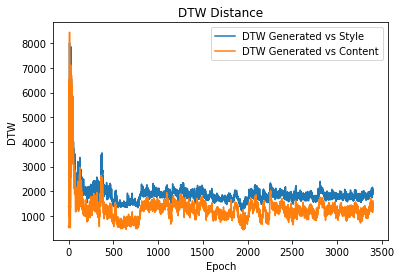

Epoch: 3401 
 Content Loss: 1.3669084310531616 
 Style Loss: 7.306872844696045 
 Total Loss: 8.673781394958496
Metrics - Content CC:[95.28468972], FFT:109.69380789615438, DTW:1289.5578504458074
Metrics - Style CC:[-2.94945497], FFT:210.24705397871577, DTW:1918.7037142654292
Epoch: 3402 
 Content Loss: 1.4629122018814087 
 Style Loss: 5.457122325897217 
 Total Loss: 6.920034885406494
Metrics - Content CC:[101.90652828], FFT:108.09623061022785, DTW:1336.029224244777
Metrics - Style CC:[1.57071251], FFT:209.04798328417783, DTW:1931.7871757362461
Epoch: 3403 
 Content Loss: 1.4962283372879028 
 Style Loss: 9.027420043945312 
 Total Loss: 10.523648262023926
Metrics - Content CC:[85.02223406], FFT:78.77566975556634, DTW:1155.0713675585364
Metrics - Style CC:[-0.03855275], FFT:201.1199412666899, DTW:1771.3563890746059
Epoch: 3404 
 Content Loss: 1.3507746458053589 
 Style Loss: 8.129402160644531 
 Total Loss: 9.48017692565918
Metrics - Content CC:[60.0506391], FFT:102.56468457526816, DTW:1283

Epoch: 3432 
 Content Loss: 1.349977731704712 
 Style Loss: 8.998089790344238 
 Total Loss: 10.348067283630371
Metrics - Content CC:[121.82845358], FFT:71.1639534044588, DTW:1243.0701045556723
Metrics - Style CC:[-11.97684969], FFT:192.35139142597777, DTW:1785.4708706512522
Epoch: 3433 
 Content Loss: 1.2872694730758667 
 Style Loss: 3.7376484870910645 
 Total Loss: 5.024918079376221
Metrics - Content CC:[91.29130717], FFT:55.59320953396838, DTW:1104.9134874221952
Metrics - Style CC:[-2.41201805], FFT:194.65908839795327, DTW:1656.6425040817037
Epoch: 3434 
 Content Loss: 1.3478225469589233 
 Style Loss: 10.375118255615234 
 Total Loss: 11.722940444946289
Metrics - Content CC:[101.24278173], FFT:75.77886211643009, DTW:1256.9933789683782
Metrics - Style CC:[-5.86245412], FFT:185.23283468997124, DTW:1950.6118557765074
Epoch: 3435 
 Content Loss: 1.3080706596374512 
 Style Loss: 4.721075057983398 
 Total Loss: 6.02914571762085
Metrics - Content CC:[91.03674375], FFT:57.51933547149678, DTW:

Epoch: 3463 
 Content Loss: 1.4404025077819824 
 Style Loss: 6.660336017608643 
 Total Loss: 8.100738525390625
Metrics - Content CC:[79.21472227], FFT:89.3180094629697, DTW:1279.4096649016813
Metrics - Style CC:[-6.80063323], FFT:206.5168552112026, DTW:2021.3149076641794
Epoch: 3464 
 Content Loss: 1.3967303037643433 
 Style Loss: 6.858491897583008 
 Total Loss: 8.25522232055664
Metrics - Content CC:[85.11853015], FFT:72.47109770619433, DTW:1149.3064040197953
Metrics - Style CC:[2.48846717], FFT:206.41449653766708, DTW:1766.9959096146404
Epoch: 3465 
 Content Loss: 1.4374706745147705 
 Style Loss: 6.2490949630737305 
 Total Loss: 7.686565399169922
Metrics - Content CC:[83.44769708], FFT:69.25449104633446, DTW:1136.4950070976652
Metrics - Style CC:[0.01303754], FFT:205.38331939641648, DTW:1679.139422066522
Epoch: 3466 
 Content Loss: 1.295359492301941 
 Style Loss: 5.531399250030518 
 Total Loss: 6.82675838470459
Metrics - Content CC:[82.00129699], FFT:76.57801307139995, DTW:1167.569539

Epoch: 3494 
 Content Loss: 1.3098773956298828 
 Style Loss: 7.205775260925293 
 Total Loss: 8.515652656555176
Metrics - Content CC:[62.0119979], FFT:73.40322783290824, DTW:1195.3632635785984
Metrics - Style CC:[-2.80264109], FFT:185.6565425577322, DTW:1753.2372514660092
Epoch: 3495 
 Content Loss: 1.3239692449569702 
 Style Loss: 5.046765327453613 
 Total Loss: 6.370734691619873
Metrics - Content CC:[57.9452397], FFT:51.87328626549062, DTW:1019.558740038806
Metrics - Style CC:[-3.1186427], FFT:196.48587853185603, DTW:1739.7823037321357
Epoch: 3496 
 Content Loss: 1.3132939338684082 
 Style Loss: 7.771666526794434 
 Total Loss: 9.0849609375
Metrics - Content CC:[58.22579732], FFT:51.877684272400714, DTW:985.1786422707681
Metrics - Style CC:[4.27006543], FFT:195.6902052787222, DTW:1682.4901870261717
Epoch: 3497 
 Content Loss: 1.3323718309402466 
 Style Loss: 4.440768718719482 
 Total Loss: 5.7731404304504395
Metrics - Content CC:[78.94372451], FFT:58.8521388593728, DTW:1188.73043864239

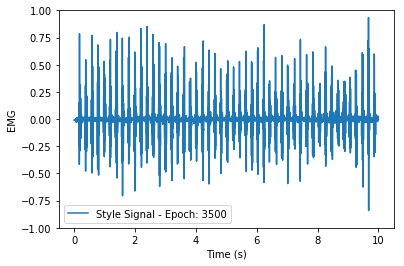

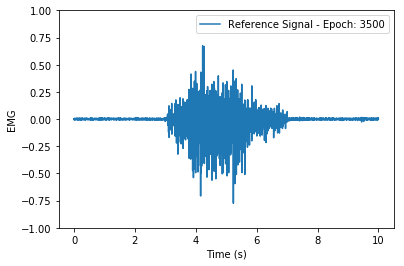

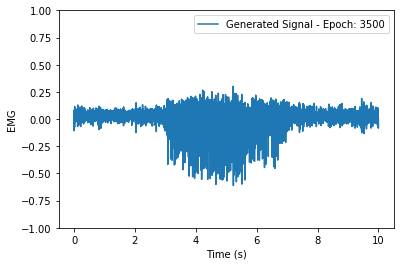

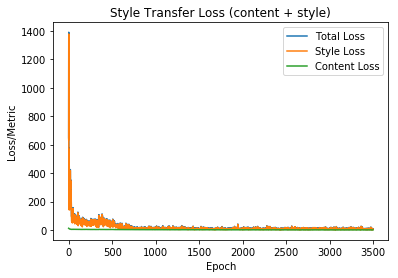

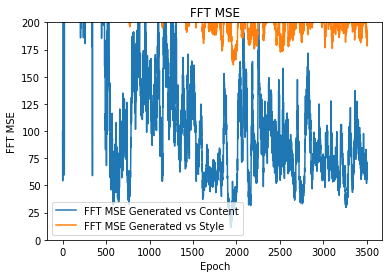

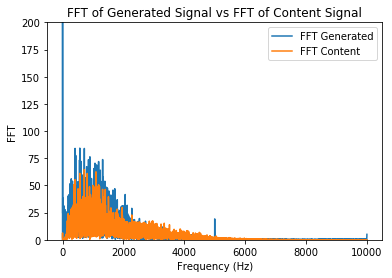

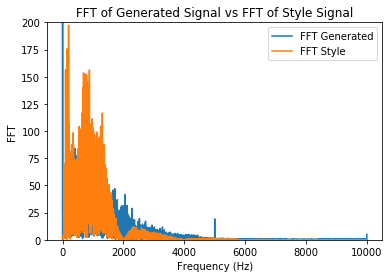

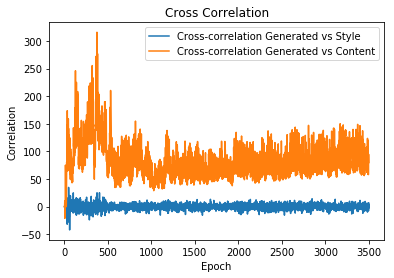

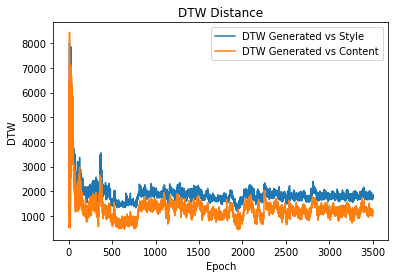

Epoch: 3501 
 Content Loss: 1.3449463844299316 
 Style Loss: 10.319709777832031 
 Total Loss: 11.664655685424805
Metrics - Content CC:[61.34881044], FFT:65.75642637166521, DTW:1086.7196056439375
Metrics - Style CC:[3.03595107], FFT:195.24627132326924, DTW:1734.0484937378185
Epoch: 3502 
 Content Loss: 1.2946388721466064 
 Style Loss: 7.371232986450195 
 Total Loss: 8.665871620178223
Metrics - Content CC:[59.40769946], FFT:49.63445532725165, DTW:886.2126480614786
Metrics - Style CC:[-0.24609448], FFT:193.25457923301934, DTW:1670.6194519358748
Epoch: 3503 
 Content Loss: 1.415696382522583 
 Style Loss: 6.240667343139648 
 Total Loss: 7.656363487243652
Metrics - Content CC:[123.32875328], FFT:65.15498057446072, DTW:1285.1976607275715
Metrics - Style CC:[-5.4860174], FFT:182.52726718721385, DTW:1858.5798682793043
Epoch: 3504 
 Content Loss: 1.3545600175857544 
 Style Loss: 5.080374240875244 
 Total Loss: 6.434934139251709
Metrics - Content CC:[113.5451772], FFT:64.8927765588488, DTW:1175.2

Epoch: 3532 
 Content Loss: 1.399551272392273 
 Style Loss: 9.025490760803223 
 Total Loss: 10.425042152404785
Metrics - Content CC:[123.24236058], FFT:27.802901717283703, DTW:1004.4228751664016
Metrics - Style CC:[-2.92404142], FFT:185.60033134086027, DTW:1681.8331281432013
Epoch: 3533 
 Content Loss: 1.3590868711471558 
 Style Loss: 6.468642234802246 
 Total Loss: 7.827729225158691
Metrics - Content CC:[68.59641077], FFT:21.45949313701347, DTW:771.710173467816
Metrics - Style CC:[-4.94161593], FFT:187.71550083802617, DTW:1754.6531745546558
Epoch: 3534 
 Content Loss: 1.4110788106918335 
 Style Loss: 10.601302146911621 
 Total Loss: 12.012380599975586
Metrics - Content CC:[113.56579642], FFT:26.20685996402861, DTW:905.8134725924252
Metrics - Style CC:[-7.65872163], FFT:179.2192863578192, DTW:1816.0807212420782
Epoch: 3535 
 Content Loss: 1.3679239749908447 
 Style Loss: 9.18744945526123 
 Total Loss: 10.555373191833496
Metrics - Content CC:[92.711184], FFT:19.049457224370567, DTW:820.

Epoch: 3563 
 Content Loss: 1.3236395120620728 
 Style Loss: 5.424771785736084 
 Total Loss: 6.748411655426025
Metrics - Content CC:[104.75959963], FFT:47.03142461450425, DTW:1046.2665660031814
Metrics - Style CC:[0.47085534], FFT:182.54738883884525, DTW:2012.614068980421
Epoch: 3564 
 Content Loss: 1.3333632946014404 
 Style Loss: 4.1785807609558105 
 Total Loss: 5.511943817138672
Metrics - Content CC:[89.68204291], FFT:35.345511391000635, DTW:992.0215539061138
Metrics - Style CC:[4.27386456], FFT:185.46485637719428, DTW:1811.871235063868
Epoch: 3565 
 Content Loss: 1.3472975492477417 
 Style Loss: 4.854867935180664 
 Total Loss: 6.202165603637695
Metrics - Content CC:[63.85555377], FFT:34.765345758620015, DTW:865.5939443829385
Metrics - Style CC:[-1.72303625], FFT:186.83539043458367, DTW:1675.2882366975193
Epoch: 3566 
 Content Loss: 1.3356542587280273 
 Style Loss: 7.288081645965576 
 Total Loss: 8.623735427856445
Metrics - Content CC:[91.5124002], FFT:39.558742303080955, DTW:976.85

Epoch: 3593 
 Content Loss: 1.3860278129577637 
 Style Loss: 7.680848598480225 
 Total Loss: 9.066876411437988
Metrics - Content CC:[55.55764179], FFT:122.50312085430663, DTW:1319.5295307909964
Metrics - Style CC:[-4.39050688], FFT:192.19669596476902, DTW:1970.0244868544075
Epoch: 3594 
 Content Loss: 1.4544346332550049 
 Style Loss: 4.812736511230469 
 Total Loss: 6.2671709060668945
Metrics - Content CC:[72.58256873], FFT:120.2970988188143, DTW:1382.7040231780634
Metrics - Style CC:[-1.49308248], FFT:192.9392277644426, DTW:2199.562373036586
Epoch: 3595 
 Content Loss: 1.4157730340957642 
 Style Loss: 5.128362655639648 
 Total Loss: 6.544135093688965
Metrics - Content CC:[76.07261123], FFT:104.29431140911637, DTW:1492.0496245563752
Metrics - Style CC:[1.23257185], FFT:187.394355713187, DTW:2030.6267934728137
Epoch: 3596 
 Content Loss: 1.3744125366210938 
 Style Loss: 8.904135704040527 
 Total Loss: 10.278548240661621
Metrics - Content CC:[64.31336758], FFT:115.6754680833415, DTW:1547.

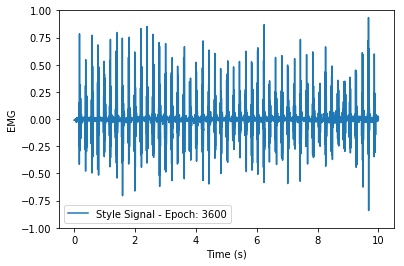

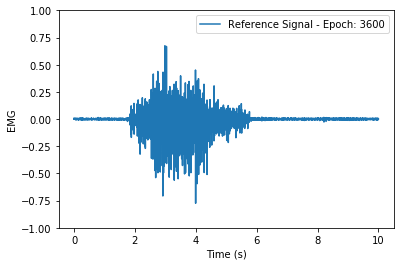

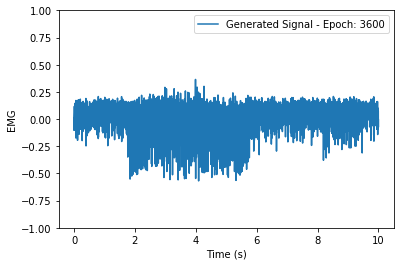

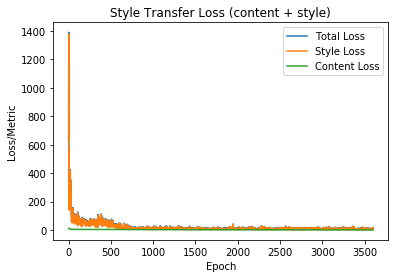

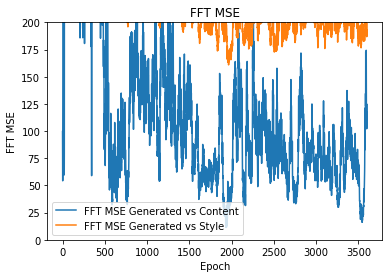

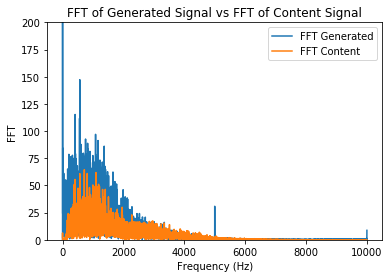

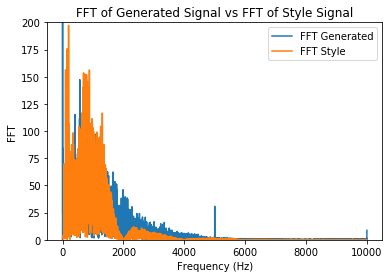

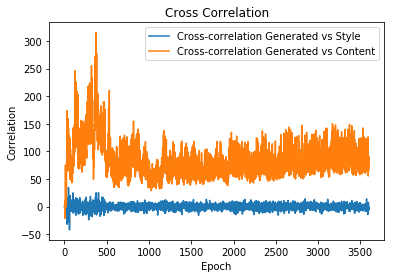

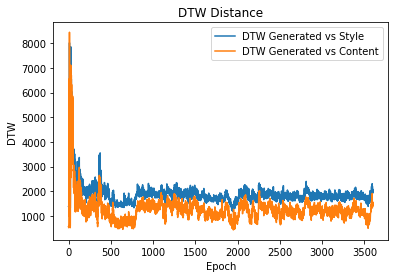

Epoch: 3601 
 Content Loss: 1.5012964010238647 
 Style Loss: 21.007375717163086 
 Total Loss: 22.5086727142334
Metrics - Content CC:[81.63876252], FFT:95.44697778760103, DTW:1421.7003261198356
Metrics - Style CC:[1.19777332], FFT:189.9108195196772, DTW:1853.7187182114608
Epoch: 3602 
 Content Loss: 1.3952016830444336 
 Style Loss: 8.634672164916992 
 Total Loss: 10.029873847961426
Metrics - Content CC:[74.01441863], FFT:111.4216141135332, DTW:1357.7265782943305
Metrics - Style CC:[1.88558883], FFT:195.18250121022325, DTW:1958.252680830317
Epoch: 3603 
 Content Loss: 1.3353180885314941 
 Style Loss: 7.655600070953369 
 Total Loss: 8.990918159484863
Metrics - Content CC:[57.2185135], FFT:126.23220036727456, DTW:1565.9314490413517
Metrics - Style CC:[0.8673522], FFT:194.40362720372983, DTW:2055.430934590155
Epoch: 3604 
 Content Loss: 1.273303508758545 
 Style Loss: 11.035791397094727 
 Total Loss: 12.30909538269043
Metrics - Content CC:[62.64383609], FFT:106.80098130439198, DTW:1303.9417

Epoch: 3631 
 Content Loss: 1.598909854888916 
 Style Loss: 8.153705596923828 
 Total Loss: 9.752614974975586
Metrics - Content CC:[85.68578906], FFT:60.66204445447307, DTW:1010.3569145398633
Metrics - Style CC:[-5.45811759], FFT:188.50181452958714, DTW:1724.671332117409
Epoch: 3632 
 Content Loss: 1.5958818197250366 
 Style Loss: 5.71107292175293 
 Total Loss: 7.306954860687256
Metrics - Content CC:[63.86756734], FFT:73.13441957790101, DTW:1110.3425839521867
Metrics - Style CC:[-2.35611954], FFT:198.7145565651003, DTW:1816.925225277921
Epoch: 3633 
 Content Loss: 1.6672685146331787 
 Style Loss: 10.570413589477539 
 Total Loss: 12.237682342529297
Metrics - Content CC:[133.63952477], FFT:72.92332972482376, DTW:1185.074235477623
Metrics - Style CC:[2.5417038], FFT:185.6638510033095, DTW:1858.6252381258846
Epoch: 3634 
 Content Loss: 1.6295421123504639 
 Style Loss: 4.73005485534668 
 Total Loss: 6.359597206115723
Metrics - Content CC:[87.45638789], FFT:69.28961450571497, DTW:1017.175134

Epoch: 3661 
 Content Loss: 1.4491757154464722 
 Style Loss: 3.4860191345214844 
 Total Loss: 4.935194969177246
Metrics - Content CC:[75.12523603], FFT:25.020824417330463, DTW:884.5939677636807
Metrics - Style CC:[-2.43311611], FFT:189.56260910270342, DTW:1635.8277888247017
Epoch: 3662 
 Content Loss: 1.4569567441940308 
 Style Loss: 10.692584991455078 
 Total Loss: 12.149541854858398
Metrics - Content CC:[99.81033077], FFT:21.619429458032243, DTW:924.6396952574569
Metrics - Style CC:[-6.44645162], FFT:184.11011416628983, DTW:1491.4371337987848
Epoch: 3663 
 Content Loss: 1.4663996696472168 
 Style Loss: 6.462519645690918 
 Total Loss: 7.928919315338135
Metrics - Content CC:[115.55457104], FFT:25.79114758459303, DTW:860.4437710875197
Metrics - Style CC:[-0.52938152], FFT:182.91654961052348, DTW:1714.9939200414728
Epoch: 3664 
 Content Loss: 1.4523534774780273 
 Style Loss: 6.739044189453125 
 Total Loss: 8.191397666931152
Metrics - Content CC:[93.62022266], FFT:22.96990753095198, DTW:9

Epoch: 3692 
 Content Loss: 1.3666568994522095 
 Style Loss: 6.884831428527832 
 Total Loss: 8.25148868560791
Metrics - Content CC:[108.72964978], FFT:49.575995738870304, DTW:1289.5097782642679
Metrics - Style CC:[-10.51821704], FFT:194.9577944723191, DTW:1868.2889272313319
Epoch: 3693 
 Content Loss: 1.4417850971221924 
 Style Loss: 5.913354396820068 
 Total Loss: 7.35513973236084
Metrics - Content CC:[94.53096253], FFT:46.74653734409119, DTW:1081.2802823925865
Metrics - Style CC:[4.34396342], FFT:195.33088943831336, DTW:1874.9336412312255
Epoch: 3694 
 Content Loss: 1.3210229873657227 
 Style Loss: 6.927757740020752 
 Total Loss: 8.248781204223633
Metrics - Content CC:[61.40435658], FFT:44.761047993052536, DTW:933.3065065095903
Metrics - Style CC:[-1.76618275], FFT:199.02557467855982, DTW:1694.2418741417998
Epoch: 3695 
 Content Loss: 1.3225593566894531 
 Style Loss: 9.745796203613281 
 Total Loss: 11.068355560302734
Metrics - Content CC:[90.35002076], FFT:48.82178549695651, DTW:1264

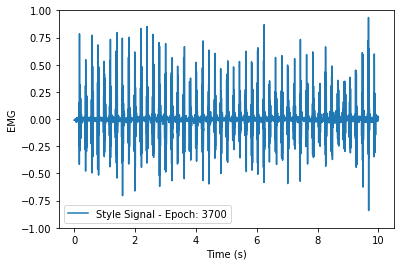

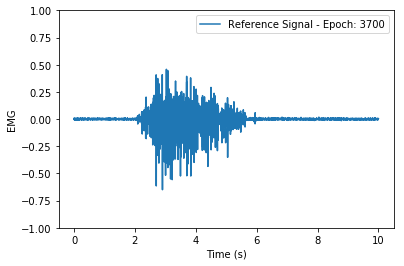

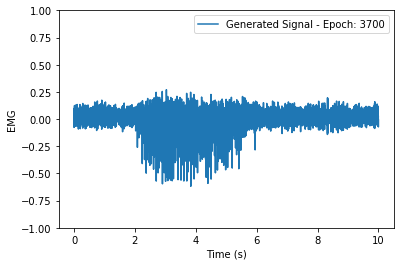

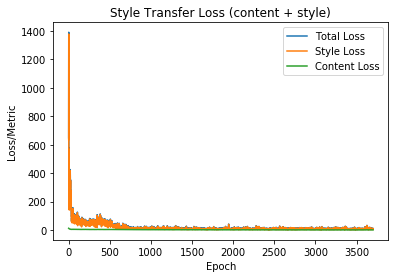

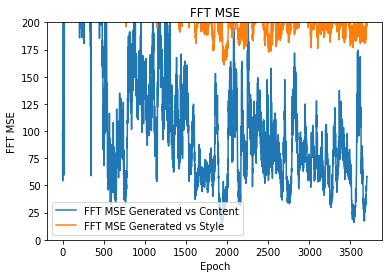

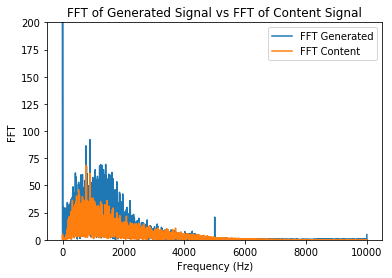

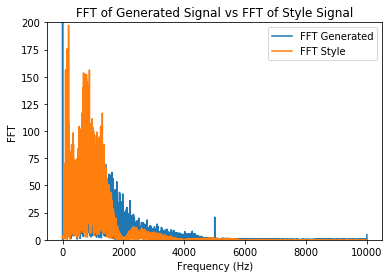

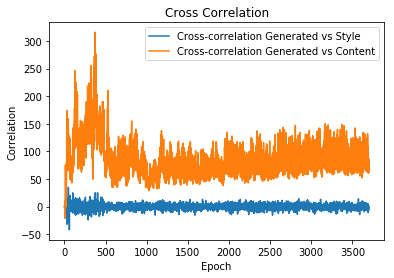

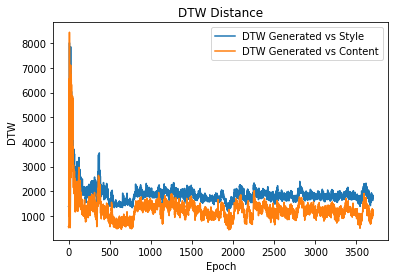

Epoch: 3701 
 Content Loss: 1.3390341997146606 
 Style Loss: 3.8802967071533203 
 Total Loss: 5.219330787658691
Metrics - Content CC:[62.2123847], FFT:62.08475628675362, DTW:1058.8585734356498
Metrics - Style CC:[5.55030463], FFT:200.8502541452543, DTW:1838.2257382685739
Epoch: 3702 
 Content Loss: 1.311780571937561 
 Style Loss: 5.385986804962158 
 Total Loss: 6.697767734527588
Metrics - Content CC:[82.90323209], FFT:66.49347800477052, DTW:1404.0859868530183
Metrics - Style CC:[-3.41269991], FFT:205.8049596488569, DTW:1932.2688235309104
Epoch: 3703 
 Content Loss: 1.279563307762146 
 Style Loss: 7.531997203826904 
 Total Loss: 8.81156063079834
Metrics - Content CC:[60.9099919], FFT:67.70220988264312, DTW:1162.1531042800523
Metrics - Style CC:[-9.80959913], FFT:202.12309713334466, DTW:1728.4074290487356
Epoch: 3704 
 Content Loss: 1.3340911865234375 
 Style Loss: 7.87930965423584 
 Total Loss: 9.213400840759277
Metrics - Content CC:[86.25131744], FFT:85.4748046982399, DTW:1284.93148523

Epoch: 3732 
 Content Loss: 1.4838863611221313 
 Style Loss: 8.198081016540527 
 Total Loss: 9.681967735290527
Metrics - Content CC:[94.44390603], FFT:97.30329391630448, DTW:1380.5334743250783
Metrics - Style CC:[2.17877407], FFT:212.12827714828293, DTW:1947.2325466007542
Epoch: 3733 
 Content Loss: 1.3582239151000977 
 Style Loss: 12.99739933013916 
 Total Loss: 14.355623245239258
Metrics - Content CC:[82.97661356], FFT:140.36132204037912, DTW:1424.1707563482635
Metrics - Style CC:[-4.07487179], FFT:230.92426658602358, DTW:2040.709450542752
Epoch: 3734 
 Content Loss: 1.3879657983779907 
 Style Loss: 4.047021865844727 
 Total Loss: 5.434987545013428
Metrics - Content CC:[85.20890348], FFT:122.5356408774426, DTW:1389.651243538034
Metrics - Style CC:[5.39222155], FFT:228.50116506432414, DTW:1931.0671048507527
Epoch: 3735 
 Content Loss: 1.4495904445648193 
 Style Loss: 9.569894790649414 
 Total Loss: 11.019485473632812
Metrics - Content CC:[63.99801535], FFT:144.1375837391178, DTW:1400.

Epoch: 3762 
 Content Loss: 1.324222207069397 
 Style Loss: 4.123860836029053 
 Total Loss: 5.44808292388916
Metrics - Content CC:[75.6734979], FFT:68.19193909561058, DTW:1183.3447935540935
Metrics - Style CC:[0.21040632], FFT:192.61829994471003, DTW:1824.642542701688
Epoch: 3763 
 Content Loss: 1.411992073059082 
 Style Loss: 6.0064616203308105 
 Total Loss: 7.418454170227051
Metrics - Content CC:[105.63040296], FFT:69.60261738758233, DTW:1231.8106902945367
Metrics - Style CC:[0.72840314], FFT:190.07330189003886, DTW:1876.6983976825745
Epoch: 3764 
 Content Loss: 1.3422131538391113 
 Style Loss: 5.746716499328613 
 Total Loss: 7.088929653167725
Metrics - Content CC:[62.98635683], FFT:81.08094552363967, DTW:1317.6981499094486
Metrics - Style CC:[1.18866184], FFT:196.99375113808568, DTW:1986.8792411505167
Epoch: 3765 
 Content Loss: 1.3630393743515015 
 Style Loss: 11.083271980285645 
 Total Loss: 12.446310997009277
Metrics - Content CC:[54.94600911], FFT:78.37109750250919, DTW:1288.214

Epoch: 3793 
 Content Loss: 1.3104318380355835 
 Style Loss: 5.682859897613525 
 Total Loss: 6.993292331695557
Metrics - Content CC:[99.00148758], FFT:54.09904699844664, DTW:1194.3535417273313
Metrics - Style CC:[-8.92643757], FFT:189.4603072203966, DTW:1922.6147353127255
Epoch: 3794 
 Content Loss: 1.3430418968200684 
 Style Loss: 13.828237533569336 
 Total Loss: 15.171279907226562
Metrics - Content CC:[99.29552098], FFT:47.57017414322051, DTW:1117.605425599324
Metrics - Style CC:[7.89732965], FFT:187.6682449235874, DTW:1867.534253674504
Epoch: 3795 
 Content Loss: 1.3426035642623901 
 Style Loss: 4.4653143882751465 
 Total Loss: 5.807918071746826
Metrics - Content CC:[105.41293986], FFT:46.719850614148186, DTW:1163.4442111980381
Metrics - Style CC:[-3.5846582], FFT:184.3525984683457, DTW:1723.4611431389228
Epoch: 3796 
 Content Loss: 1.3769832849502563 
 Style Loss: 8.638921737670898 
 Total Loss: 10.015905380249023
Metrics - Content CC:[78.73231293], FFT:58.326788863764705, DTW:1212

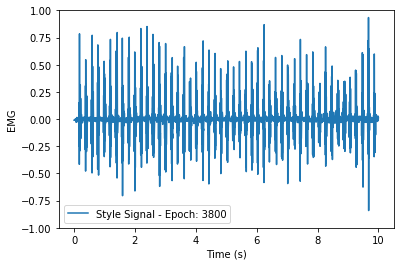

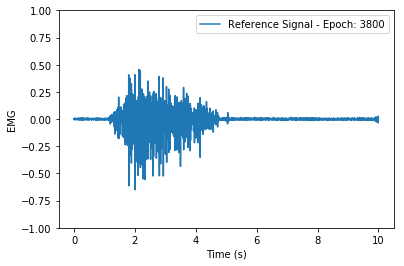

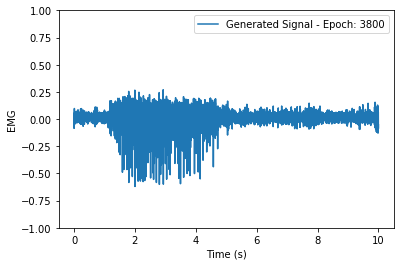

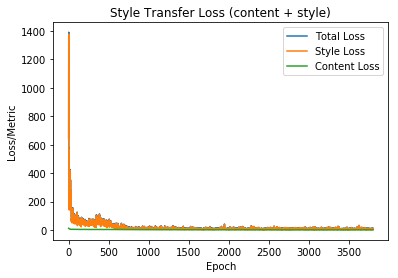

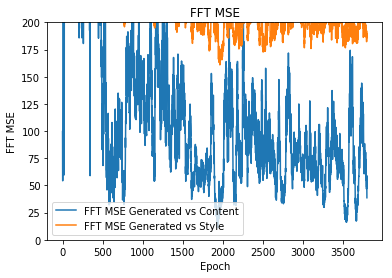

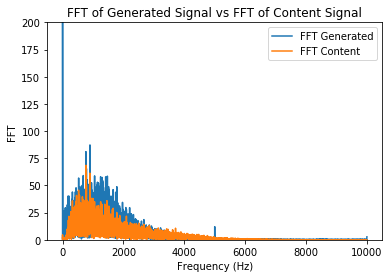

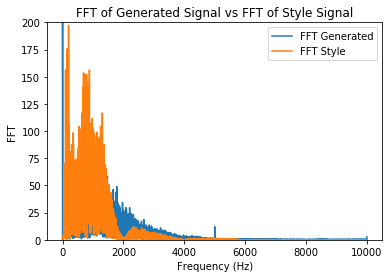

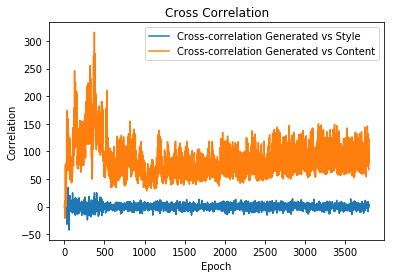

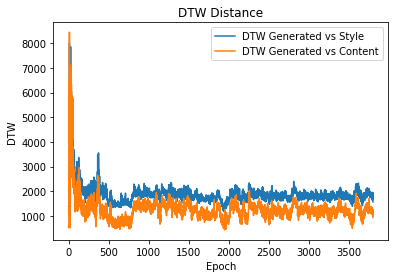

Epoch: 3801 
 Content Loss: 1.3777703046798706 
 Style Loss: 7.842933654785156 
 Total Loss: 9.220704078674316
Metrics - Content CC:[133.0937493], FFT:52.49173623973533, DTW:1188.9559293578757
Metrics - Style CC:[-8.87488193], FFT:192.7933691651092, DTW:2027.6713564150955
Epoch: 3802 
 Content Loss: 1.342442274093628 
 Style Loss: 4.908414363861084 
 Total Loss: 6.250856399536133
Metrics - Content CC:[70.68871032], FFT:48.184789073241134, DTW:1030.8466010733728
Metrics - Style CC:[7.0743536], FFT:191.60492742788307, DTW:1842.7104972656587
Epoch: 3803 
 Content Loss: 1.3511862754821777 
 Style Loss: 5.507945537567139 
 Total Loss: 6.859131813049316
Metrics - Content CC:[116.14048503], FFT:50.233973975662785, DTW:1270.4341478124838
Metrics - Style CC:[2.50952551], FFT:190.57402891349363, DTW:1850.5289731519617
Epoch: 3804 
 Content Loss: 1.3392844200134277 
 Style Loss: 6.713888168334961 
 Total Loss: 8.053173065185547
Metrics - Content CC:[94.08963252], FFT:46.07304204818905, DTW:1108.2

Epoch: 3832 
 Content Loss: 1.4385032653808594 
 Style Loss: 3.588676929473877 
 Total Loss: 5.027180194854736
Metrics - Content CC:[138.70425385], FFT:32.5914123066919, DTW:1136.9727092927824
Metrics - Style CC:[-1.13944394], FFT:185.24357360443804, DTW:1824.3907282452117
Epoch: 3833 
 Content Loss: 1.2933084964752197 
 Style Loss: 4.170285701751709 
 Total Loss: 5.463594436645508
Metrics - Content CC:[61.47552459], FFT:21.242401742739656, DTW:712.3765260797194
Metrics - Style CC:[0.61555454], FFT:201.5928602803466, DTW:1656.4315272153951
Epoch: 3834 
 Content Loss: 1.3146589994430542 
 Style Loss: 4.621962547302246 
 Total Loss: 5.93662166595459
Metrics - Content CC:[85.25791162], FFT:24.264388718202735, DTW:951.7383668227934
Metrics - Style CC:[4.4044195], FFT:200.95181769533363, DTW:1770.9228405226324
Epoch: 3835 
 Content Loss: 1.312164068222046 
 Style Loss: 10.889384269714355 
 Total Loss: 12.20154857635498
Metrics - Content CC:[90.28315908], FFT:27.98882597323766, DTW:843.12658

Epoch: 3862 
 Content Loss: 1.3291215896606445 
 Style Loss: 6.61458683013916 
 Total Loss: 7.943708896636963
Metrics - Content CC:[135.54767569], FFT:36.039376462011454, DTW:1150.5876417300897
Metrics - Style CC:[4.70613192], FFT:176.59116541188357, DTW:1949.3670991604886
Epoch: 3863 
 Content Loss: 1.3302993774414062 
 Style Loss: 7.052111625671387 
 Total Loss: 8.382411003112793
Metrics - Content CC:[149.93316337], FFT:33.34794031055722, DTW:1025.6719432503328
Metrics - Style CC:[4.05869053], FFT:169.79188535194527, DTW:1843.3455107521027
Epoch: 3864 
 Content Loss: 1.3126899003982544 
 Style Loss: 8.84853744506836 
 Total Loss: 10.161227226257324
Metrics - Content CC:[75.76045031], FFT:29.182297658843183, DTW:817.9328753456128
Metrics - Style CC:[3.89673146], FFT:182.9835179235817, DTW:1577.5888763333448
Epoch: 3865 
 Content Loss: 1.3274199962615967 
 Style Loss: 4.648969650268555 
 Total Loss: 5.9763898849487305
Metrics - Content CC:[74.54480774], FFT:25.03444428163417, DTW:875.3

Epoch: 3893 
 Content Loss: 1.2634809017181396 
 Style Loss: 9.102858543395996 
 Total Loss: 10.366339683532715
Metrics - Content CC:[71.52784414], FFT:20.09255050310159, DTW:927.9997571067372
Metrics - Style CC:[-0.11032117], FFT:187.63832071000002, DTW:1579.3238076146001
Epoch: 3894 
 Content Loss: 1.2470967769622803 
 Style Loss: 10.889023780822754 
 Total Loss: 12.136120796203613
Metrics - Content CC:[65.00584622], FFT:16.322940369186977, DTW:572.5876279631754
Metrics - Style CC:[2.06779477], FFT:195.870814070573, DTW:1513.2184563283197
Epoch: 3895 
 Content Loss: 1.2142328023910522 
 Style Loss: 7.076009750366211 
 Total Loss: 8.290242195129395
Metrics - Content CC:[122.71727512], FFT:23.691569847806655, DTW:1222.5340006001256
Metrics - Style CC:[-2.60207941], FFT:179.7885576484215, DTW:1708.7227005996176
Epoch: 3896 
 Content Loss: 1.2343451976776123 
 Style Loss: 2.6137001514434814 
 Total Loss: 3.8480453491210938
Metrics - Content CC:[99.19012188], FFT:20.453762771165152, DTW:9

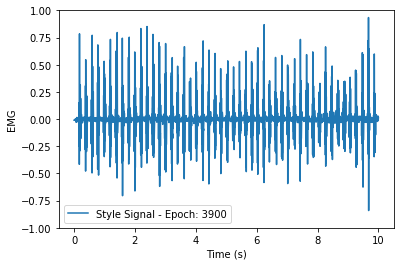

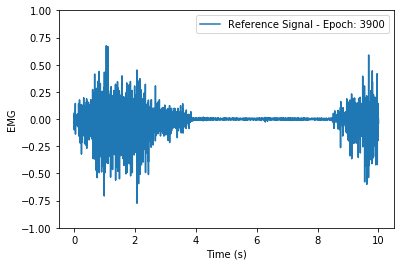

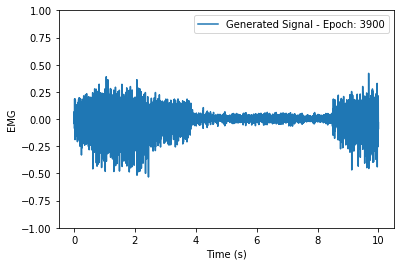

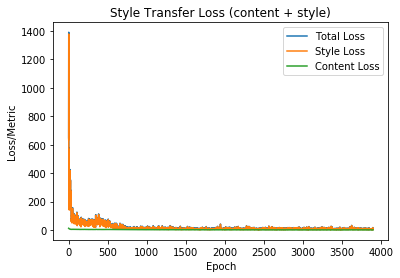

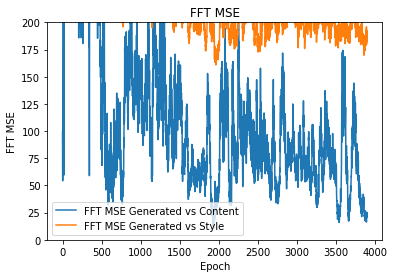

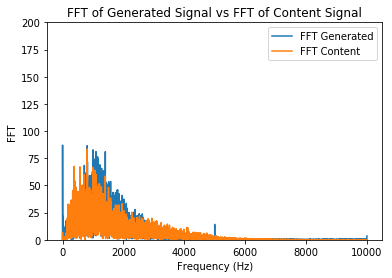

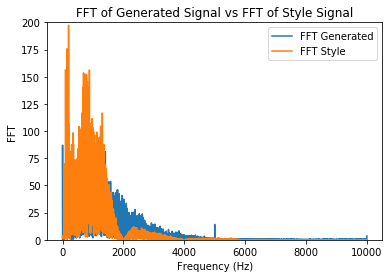

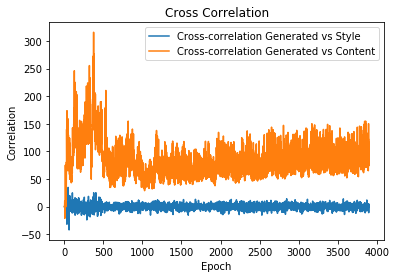

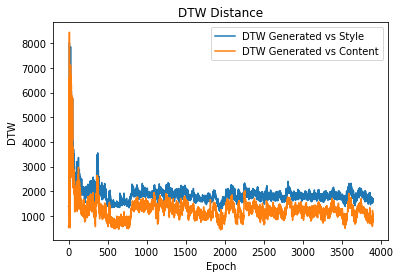

Epoch: 3901 
 Content Loss: 1.2297651767730713 
 Style Loss: 7.348217964172363 
 Total Loss: 8.577982902526855
Metrics - Content CC:[87.32633332], FFT:19.759246357932422, DTW:1024.723167836005
Metrics - Style CC:[5.44063148], FFT:193.11466101707876, DTW:1765.772600535648
Epoch: 3902 
 Content Loss: 1.177732229232788 
 Style Loss: 5.309347152709961 
 Total Loss: 6.487079620361328
Metrics - Content CC:[86.97284737], FFT:19.630740294161413, DTW:911.4145800083256
Metrics - Style CC:[-1.08471196], FFT:193.37397101878196, DTW:1663.8191672032488
Epoch: 3903 
 Content Loss: 1.1814546585083008 
 Style Loss: 11.347587585449219 
 Total Loss: 12.52904224395752
Metrics - Content CC:[95.23471164], FFT:22.20603676081403, DTW:1004.4814547850007
Metrics - Style CC:[-3.43333672], FFT:192.83822469986598, DTW:1690.5794294901502
Epoch: 3904 
 Content Loss: 1.1838833093643188 
 Style Loss: 9.154500007629395 
 Total Loss: 10.338383674621582
Metrics - Content CC:[64.42854847], FFT:20.374867025986127, DTW:721.

Epoch: 3932 
 Content Loss: 1.433505892753601 
 Style Loss: 9.204943656921387 
 Total Loss: 10.638449668884277
Metrics - Content CC:[86.39053429], FFT:47.65254249929317, DTW:966.0330628869718
Metrics - Style CC:[3.54731044], FFT:180.99588961667433, DTW:1613.6202995846945
Epoch: 3933 
 Content Loss: 1.4883087873458862 
 Style Loss: 5.298287868499756 
 Total Loss: 6.786596775054932
Metrics - Content CC:[92.0145389], FFT:54.04195465302743, DTW:1175.9316018818204
Metrics - Style CC:[11.94213964], FFT:178.7506275575906, DTW:1977.6283532896828
Epoch: 3934 
 Content Loss: 1.4858009815216064 
 Style Loss: 6.5171966552734375 
 Total Loss: 8.002997398376465
Metrics - Content CC:[87.0560658], FFT:46.99638299937222, DTW:884.9643298667291
Metrics - Style CC:[6.36420002], FFT:179.57541340503656, DTW:1630.7905944758525
Epoch: 3935 
 Content Loss: 1.458263635635376 
 Style Loss: 6.7098307609558105 
 Total Loss: 8.168094635009766
Metrics - Content CC:[91.09335189], FFT:46.173924065061435, DTW:873.49406

Epoch: 3962 
 Content Loss: 1.3762794733047485 
 Style Loss: 7.392987251281738 
 Total Loss: 8.769267082214355
Metrics - Content CC:[98.69826494], FFT:57.01521059196895, DTW:1117.5623655769054
Metrics - Style CC:[-0.805495], FFT:195.14763413305798, DTW:1697.1558113898063
Epoch: 3963 
 Content Loss: 1.3762072324752808 
 Style Loss: 6.733722686767578 
 Total Loss: 8.109930038452148
Metrics - Content CC:[138.22906384], FFT:70.31911856920634, DTW:1212.9278001676278
Metrics - Style CC:[1.5897194], FFT:202.04650353069422, DTW:2019.056317028099
Epoch: 3964 
 Content Loss: 1.399782657623291 
 Style Loss: 8.575509071350098 
 Total Loss: 9.975292205810547
Metrics - Content CC:[100.59965932], FFT:61.16361452310211, DTW:1042.2733638253617
Metrics - Style CC:[-0.75271498], FFT:196.26289415074123, DTW:1716.7292611163339
Epoch: 3965 
 Content Loss: 1.3072149753570557 
 Style Loss: 12.470218658447266 
 Total Loss: 13.777433395385742
Metrics - Content CC:[75.13623417], FFT:61.570847503963975, DTW:1099.

Epoch: 3993 
 Content Loss: 1.3395769596099854 
 Style Loss: 14.247979164123535 
 Total Loss: 15.587556838989258
Metrics - Content CC:[147.74874265], FFT:56.495233224676845, DTW:1132.3946508201227
Metrics - Style CC:[8.42824201], FFT:193.99253576361858, DTW:1820.5489989157902
Epoch: 3994 
 Content Loss: 1.2995665073394775 
 Style Loss: 4.985622406005859 
 Total Loss: 6.285188674926758
Metrics - Content CC:[119.58056648], FFT:58.96925655250317, DTW:1150.030897351687
Metrics - Style CC:[3.95234579], FFT:204.92483135910942, DTW:1879.8367519986716
Epoch: 3995 
 Content Loss: 1.272855520248413 
 Style Loss: 5.6991167068481445 
 Total Loss: 6.971972465515137
Metrics - Content CC:[91.09996568], FFT:56.96490992535514, DTW:1029.4113690815332
Metrics - Style CC:[0.5271985], FFT:198.9517069626585, DTW:1711.2666752655268
Epoch: 3996 
 Content Loss: 1.3427623510360718 
 Style Loss: 6.154874801635742 
 Total Loss: 7.4976372718811035
Metrics - Content CC:[116.14937326], FFT:73.81924214848202, DTW:128

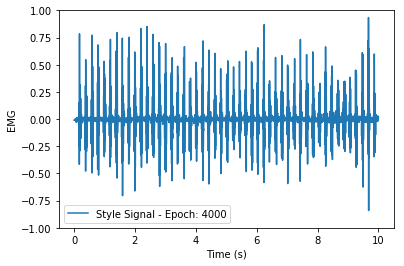

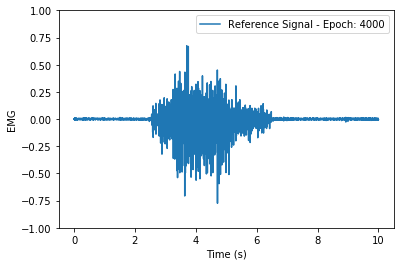

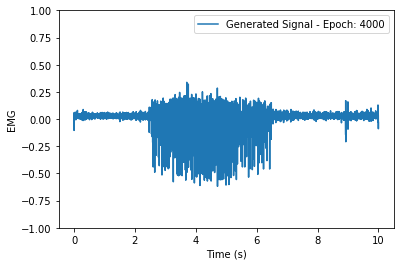

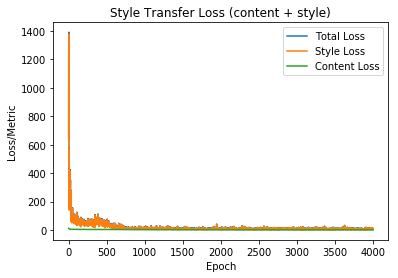

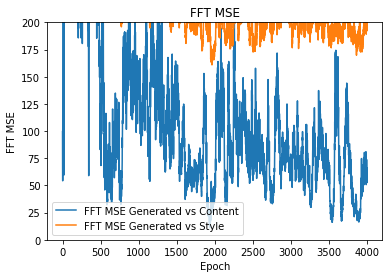

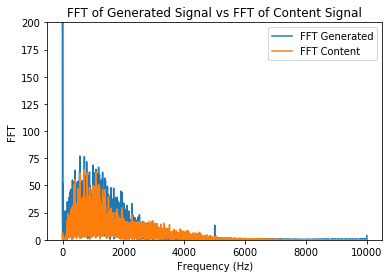

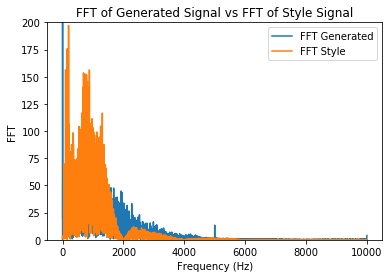

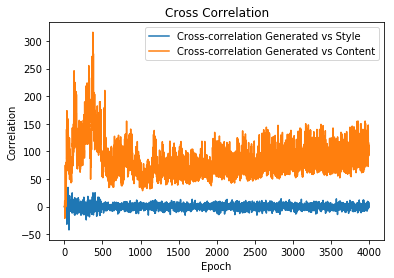

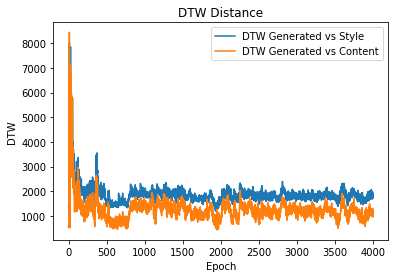

Epoch: 4001 
 Content Loss: 1.2801653146743774 
 Style Loss: 8.090254783630371 
 Total Loss: 9.370420455932617
Metrics - Content CC:[72.55252838], FFT:58.35665551310986, DTW:1111.7837226080355
Metrics - Style CC:[0.51164227], FFT:197.64167216111184, DTW:1669.5305600325146
Epoch: 4002 
 Content Loss: 1.3375272750854492 
 Style Loss: 13.593036651611328 
 Total Loss: 14.930562973022461
Metrics - Content CC:[101.20522922], FFT:70.11835130417215, DTW:1150.11773245526
Metrics - Style CC:[-3.95971392], FFT:193.2926741099845, DTW:1902.362373262819
Epoch: 4003 
 Content Loss: 1.3588908910751343 
 Style Loss: 7.3899335861206055 
 Total Loss: 8.748824119567871
Metrics - Content CC:[142.92101064], FFT:60.9500876719368, DTW:1269.5979678827077
Metrics - Style CC:[0.41818824], FFT:188.90012217888278, DTW:1969.6011886898743
Epoch: 4004 
 Content Loss: 1.4651533365249634 
 Style Loss: 2.7916312217712402 
 Total Loss: 4.256784439086914
Metrics - Content CC:[144.09049069], FFT:63.91041457038521, DTW:1386

Epoch: 4032 
 Content Loss: 1.3184058666229248 
 Style Loss: 7.213230133056641 
 Total Loss: 8.531636238098145
Metrics - Content CC:[83.80410164], FFT:94.81349229523826, DTW:1125.683738959326
Metrics - Style CC:[4.28924883], FFT:211.12362053908947, DTW:1744.1928257603
Epoch: 4033 
 Content Loss: 1.367955207824707 
 Style Loss: 5.785355567932129 
 Total Loss: 7.153311252593994
Metrics - Content CC:[117.8114879], FFT:98.5339127792646, DTW:1284.9258562549833
Metrics - Style CC:[1.10125254], FFT:202.46060263318404, DTW:1851.6174919957746
Epoch: 4034 
 Content Loss: 1.252370834350586 
 Style Loss: 5.333461284637451 
 Total Loss: 6.585832118988037
Metrics - Content CC:[82.35439126], FFT:100.28075602135212, DTW:1208.5606822069237
Metrics - Style CC:[-7.80229822], FFT:206.59774629935552, DTW:1744.8254122456212
Epoch: 4035 
 Content Loss: 1.3008919954299927 
 Style Loss: 7.365880966186523 
 Total Loss: 8.666772842407227
Metrics - Content CC:[117.90537527], FFT:115.08457149933332, DTW:1360.76737

Epoch: 4063 
 Content Loss: 1.256413221359253 
 Style Loss: 10.631290435791016 
 Total Loss: 11.887703895568848
Metrics - Content CC:[119.00738974], FFT:92.97991272951771, DTW:1316.6281482411925
Metrics - Style CC:[2.96071428], FFT:203.47586428024604, DTW:2103.517933535356
Epoch: 4064 
 Content Loss: 1.2675315141677856 
 Style Loss: 8.053860664367676 
 Total Loss: 9.321392059326172
Metrics - Content CC:[133.46632757], FFT:91.57045377165844, DTW:1279.2726196931458
Metrics - Style CC:[4.19375826], FFT:204.3370378346823, DTW:2028.0534059536058
Epoch: 4065 
 Content Loss: 1.2901039123535156 
 Style Loss: 11.850658416748047 
 Total Loss: 13.140762329101562
Metrics - Content CC:[94.25468011], FFT:84.53429634729227, DTW:1155.3697860297652
Metrics - Style CC:[-6.2560507], FFT:202.32923326887746, DTW:1796.7195102492262
Epoch: 4066 
 Content Loss: 1.2300454378128052 
 Style Loss: 6.228788375854492 
 Total Loss: 7.45883321762085
Metrics - Content CC:[60.77905553], FFT:115.75996862506283, DTW:1231

Epoch: 4093 
 Content Loss: 1.2629464864730835 
 Style Loss: 9.927264213562012 
 Total Loss: 11.190210342407227
Metrics - Content CC:[66.94631821], FFT:79.25797294230745, DTW:1073.294294335072
Metrics - Style CC:[1.48714728], FFT:201.10959198594412, DTW:1746.2440526304222
Epoch: 4094 
 Content Loss: 1.3220674991607666 
 Style Loss: 5.805409908294678 
 Total Loss: 7.127478122711182
Metrics - Content CC:[154.64693204], FFT:89.02356287272397, DTW:1402.4098463059402
Metrics - Style CC:[3.71911949], FFT:195.82019405668973, DTW:1999.2006119693929
Epoch: 4095 
 Content Loss: 1.3437856435775757 
 Style Loss: 9.721030235290527 
 Total Loss: 11.064815521240234
Metrics - Content CC:[88.71384928], FFT:85.90298212093975, DTW:1121.320690500206
Metrics - Style CC:[5.6455976], FFT:200.6990658525914, DTW:1805.0351311717434
Epoch: 4096 
 Content Loss: 1.2929344177246094 
 Style Loss: 4.231339454650879 
 Total Loss: 5.524273872375488
Metrics - Content CC:[72.48485698], FFT:110.38741042045746, DTW:1295.59

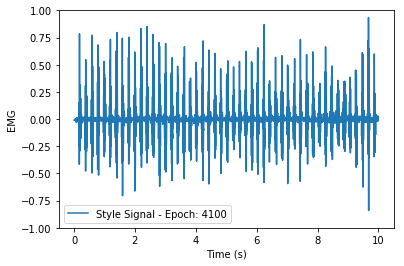

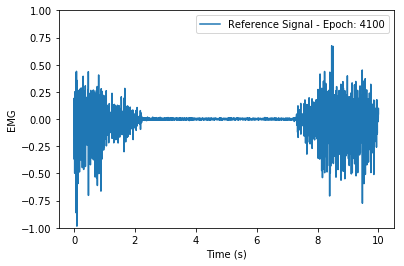

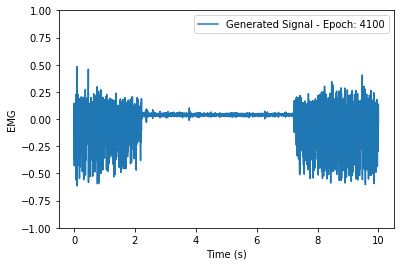

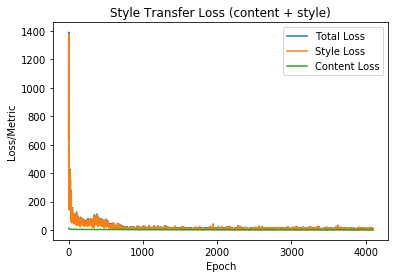

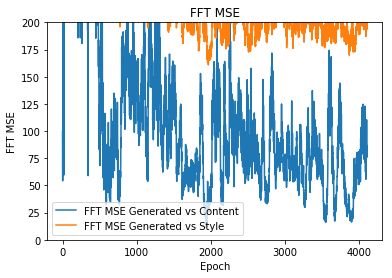

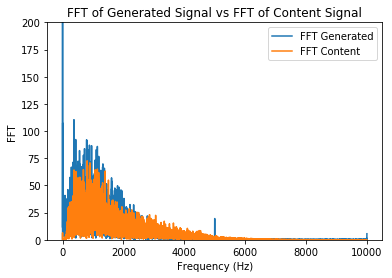

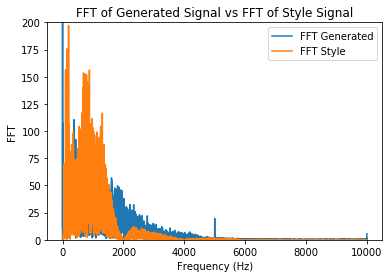

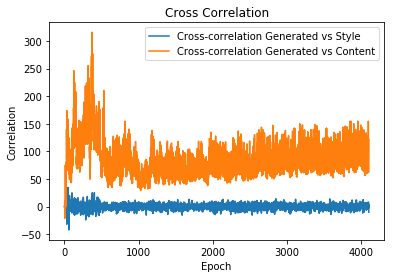

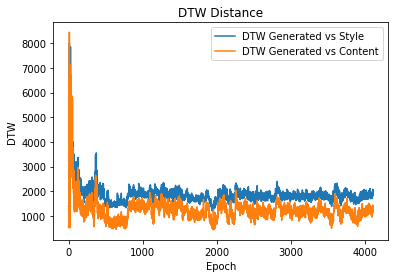

Epoch: 4101 
 Content Loss: 1.285823106765747 
 Style Loss: 7.839032173156738 
 Total Loss: 9.124855041503906
Metrics - Content CC:[79.05451493], FFT:108.87477827921539, DTW:1290.5458219247846
Metrics - Style CC:[-3.44035859], FFT:206.03350666671165, DTW:1907.5548270128975
Epoch: 4102 
 Content Loss: 1.3145556449890137 
 Style Loss: 5.971118927001953 
 Total Loss: 7.285674095153809
Metrics - Content CC:[87.56172825], FFT:94.60591676868599, DTW:1291.922311131532
Metrics - Style CC:[-4.01437532], FFT:202.39013519814023, DTW:1962.143023753493
Epoch: 4103 
 Content Loss: 1.3269249200820923 
 Style Loss: 10.185912132263184 
 Total Loss: 11.512837409973145
Metrics - Content CC:[91.17798301], FFT:71.96314206614102, DTW:1095.8799532789467
Metrics - Style CC:[-2.30608054], FFT:193.48512356462257, DTW:1764.7049094653946
Epoch: 4104 
 Content Loss: 1.3593701124191284 
 Style Loss: 5.037506580352783 
 Total Loss: 6.396876811981201
Metrics - Content CC:[79.20717899], FFT:113.4173732146772, DTW:1348

Epoch: 4131 
 Content Loss: 1.336783528327942 
 Style Loss: 5.1748857498168945 
 Total Loss: 6.511669158935547
Metrics - Content CC:[81.08765101], FFT:84.87246598989775, DTW:1426.1297933908247
Metrics - Style CC:[-0.82684277], FFT:200.624468095905, DTW:1759.4171611273703
Epoch: 4132 
 Content Loss: 1.3668031692504883 
 Style Loss: 7.592291355133057 
 Total Loss: 8.959095001220703
Metrics - Content CC:[82.44097897], FFT:92.65079106608238, DTW:1351.940208091912
Metrics - Style CC:[11.56500588], FFT:205.94425922623614, DTW:2079.8030635738155
Epoch: 4133 
 Content Loss: 1.2935999631881714 
 Style Loss: 4.669342041015625 
 Total Loss: 5.962942123413086
Metrics - Content CC:[88.67805595], FFT:92.15957110301561, DTW:1576.0736840530317
Metrics - Style CC:[-3.07929665], FFT:211.77243388241493, DTW:1818.8895161595287
Epoch: 4134 
 Content Loss: 1.3797121047973633 
 Style Loss: 4.333427429199219 
 Total Loss: 5.713139533996582
Metrics - Content CC:[81.79291482], FFT:89.35873451803596, DTW:1264.19

Epoch: 4161 
 Content Loss: 1.2676624059677124 
 Style Loss: 7.646397590637207 
 Total Loss: 8.91405963897705
Metrics - Content CC:[62.15311812], FFT:151.5282767917852, DTW:1607.0461991685897
Metrics - Style CC:[1.11687986], FFT:209.90879679872455, DTW:2151.874292293153
Epoch: 4162 
 Content Loss: 1.2679109573364258 
 Style Loss: 4.010680675506592 
 Total Loss: 5.278591632843018
Metrics - Content CC:[63.48438214], FFT:201.31960787038503, DTW:1735.4105725493469
Metrics - Style CC:[2.7474407], FFT:226.75793039177583, DTW:2287.468811652878
Epoch: 4163 
 Content Loss: 1.272250771522522 
 Style Loss: 5.282762050628662 
 Total Loss: 6.5550127029418945
Metrics - Content CC:[94.96562213], FFT:168.04433066854705, DTW:1675.5676249007192
Metrics - Style CC:[0.74514515], FFT:229.27847351684, DTW:2329.5728140523315
Epoch: 4164 
 Content Loss: 1.2058145999908447 
 Style Loss: 3.827181577682495 
 Total Loss: 5.03299617767334
Metrics - Content CC:[63.65655063], FFT:209.77150937450523, DTW:1815.5638861

Epoch: 4191 
 Content Loss: 1.2407560348510742 
 Style Loss: 4.67442512512207 
 Total Loss: 5.9151811599731445
Metrics - Content CC:[58.4423683], FFT:51.61787645322386, DTW:850.6883675817413
Metrics - Style CC:[-1.29085081], FFT:183.32471026857309, DTW:1509.4602769624428
Epoch: 4192 
 Content Loss: 1.3002690076828003 
 Style Loss: 4.995857238769531 
 Total Loss: 6.296126365661621
Metrics - Content CC:[104.83969702], FFT:59.37936976679078, DTW:952.8264594139496
Metrics - Style CC:[5.81977201], FFT:181.05719600105175, DTW:1758.158802005595
Epoch: 4193 
 Content Loss: 1.2664690017700195 
 Style Loss: 8.832038879394531 
 Total Loss: 10.09850788116455
Metrics - Content CC:[75.65868307], FFT:49.67865992807483, DTW:884.4498655422033
Metrics - Style CC:[0.26937193], FFT:190.6522450523624, DTW:1628.1181132039371
Epoch: 4194 
 Content Loss: 1.1829118728637695 
 Style Loss: 5.184442520141602 
 Total Loss: 6.367354393005371
Metrics - Content CC:[75.24722946], FFT:48.781005806752205, DTW:1002.96664

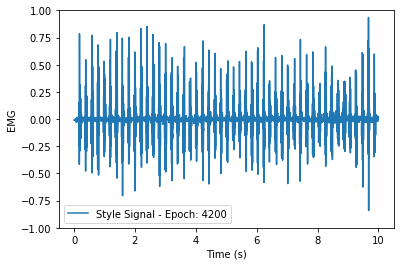

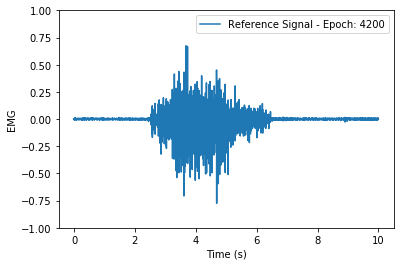

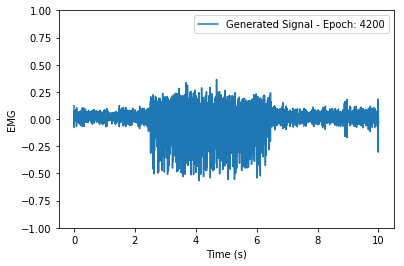

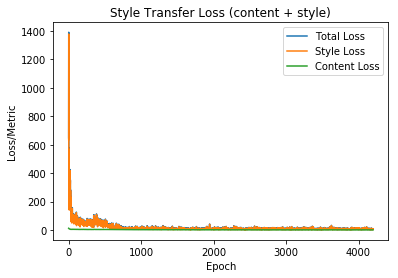

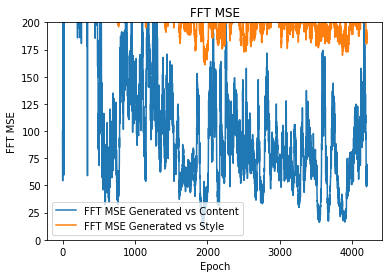

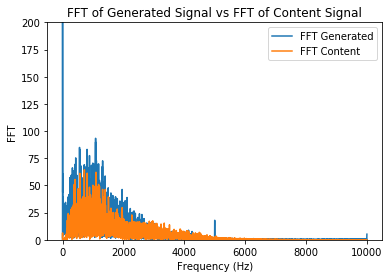

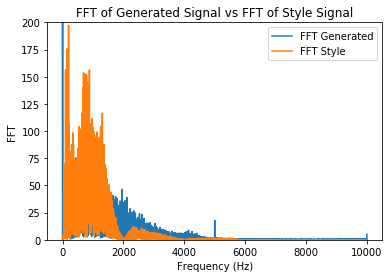

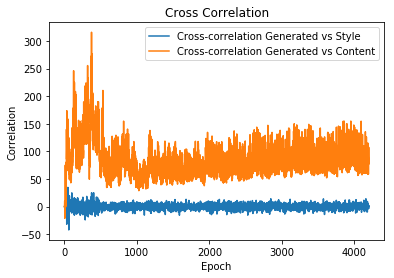

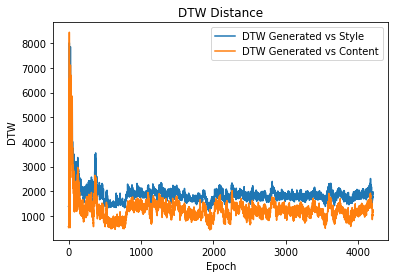

Epoch: 4201 
 Content Loss: 1.2304961681365967 
 Style Loss: 7.376847267150879 
 Total Loss: 8.607343673706055
Metrics - Content CC:[79.53299139], FFT:70.69821956418627, DTW:1205.5046461275715
Metrics - Style CC:[2.27146667], FFT:193.0560750200737, DTW:1776.6690439361694
Epoch: 4202 
 Content Loss: 1.2516556978225708 
 Style Loss: 11.1974515914917 
 Total Loss: 12.44910717010498
Metrics - Content CC:[113.75188237], FFT:87.63393709574406, DTW:1225.6030576523015
Metrics - Style CC:[-4.29071994], FFT:196.76094339235635, DTW:1866.6367928779769
Epoch: 4203 
 Content Loss: 1.2150359153747559 
 Style Loss: 4.5338897705078125 
 Total Loss: 5.748925685882568
Metrics - Content CC:[60.40587329], FFT:80.28986218992269, DTW:1228.0862139885514
Metrics - Style CC:[-4.07888228], FFT:204.74586981790645, DTW:1898.4828083976727
Epoch: 4204 
 Content Loss: 1.3078795671463013 
 Style Loss: 4.797283172607422 
 Total Loss: 6.105162620544434
Metrics - Content CC:[87.8067375], FFT:73.69913417186054, DTW:1112.4

Epoch: 4232 
 Content Loss: 1.2518775463104248 
 Style Loss: 4.167092323303223 
 Total Loss: 5.418970108032227
Metrics - Content CC:[120.0172696], FFT:62.876449800015784, DTW:1365.576587146417
Metrics - Style CC:[-3.91185653], FFT:192.00672302139674, DTW:2012.8725189365089
Epoch: 4233 
 Content Loss: 1.3024897575378418 
 Style Loss: 7.699355125427246 
 Total Loss: 9.00184440612793
Metrics - Content CC:[79.08663605], FFT:63.62522151509699, DTW:1270.9908363620398
Metrics - Style CC:[-4.0739477], FFT:201.28240444250213, DTW:1936.919951062992
Epoch: 4234 
 Content Loss: 1.3166329860687256 
 Style Loss: 6.120906352996826 
 Total Loss: 7.437539100646973
Metrics - Content CC:[158.43627307], FFT:65.59866520504724, DTW:1239.6429215404955
Metrics - Style CC:[-0.70311247], FFT:194.58054588173675, DTW:1956.0181620381468
Epoch: 4235 
 Content Loss: 1.3457183837890625 
 Style Loss: 12.600997924804688 
 Total Loss: 13.94671630859375
Metrics - Content CC:[71.38071439], FFT:61.255254683808865, DTW:1123

Epoch: 4263 
 Content Loss: 1.212923288345337 
 Style Loss: 9.451181411743164 
 Total Loss: 10.664104461669922
Metrics - Content CC:[132.09143894], FFT:83.85309008159344, DTW:1417.2831782659573
Metrics - Style CC:[-0.55010412], FFT:186.74738836737035, DTW:1998.8299924846672
Epoch: 4264 
 Content Loss: 1.1970648765563965 
 Style Loss: 8.133280754089355 
 Total Loss: 9.330345153808594
Metrics - Content CC:[94.2615994], FFT:95.10443488218003, DTW:1268.8650286536667
Metrics - Style CC:[-2.82559531], FFT:204.2929689459558, DTW:1995.9275209753769
Epoch: 4265 
 Content Loss: 1.2273447513580322 
 Style Loss: 4.503560543060303 
 Total Loss: 5.730905532836914
Metrics - Content CC:[84.45220138], FFT:78.57566807465803, DTW:1235.7326333819203
Metrics - Style CC:[8.19174539], FFT:197.65734538592432, DTW:1838.5606310076212
Epoch: 4266 
 Content Loss: 1.1719083786010742 
 Style Loss: 4.274125099182129 
 Total Loss: 5.446033477783203
Metrics - Content CC:[63.14734105], FFT:103.7503267803258, DTW:1299.8

Epoch: 4294 
 Content Loss: 1.2864577770233154 
 Style Loss: 11.506476402282715 
 Total Loss: 12.79293441772461
Metrics - Content CC:[111.52975513], FFT:95.48246823256397, DTW:1348.5481704805015
Metrics - Style CC:[-2.08220726], FFT:208.43745451688633, DTW:1964.2708250378444
Epoch: 4295 
 Content Loss: 1.1926106214523315 
 Style Loss: 9.949548721313477 
 Total Loss: 11.142159461975098
Metrics - Content CC:[59.81715378], FFT:111.37558440485472, DTW:1399.844633199762
Metrics - Style CC:[-1.16085371], FFT:193.7232048643473, DTW:1846.706872269954
Epoch: 4296 
 Content Loss: 1.1810989379882812 
 Style Loss: 5.952542304992676 
 Total Loss: 7.133641242980957
Metrics - Content CC:[72.36129504], FFT:118.48090408680406, DTW:1368.2122146141794
Metrics - Style CC:[-1.36815913], FFT:193.53205457958987, DTW:2052.9866566110327
Epoch: 4297 
 Content Loss: 1.1892271041870117 
 Style Loss: 6.350028038024902 
 Total Loss: 7.539254665374756
Metrics - Content CC:[57.90492559], FFT:85.55957179421763, DTW:11

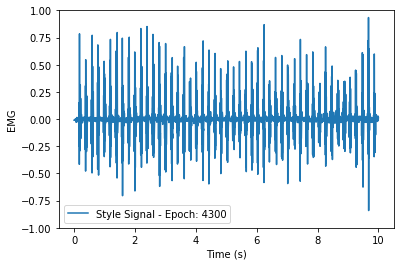

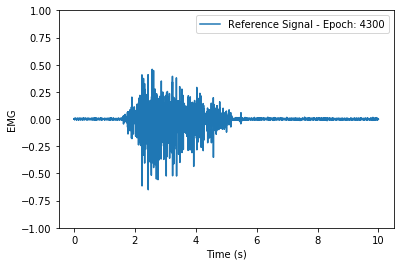

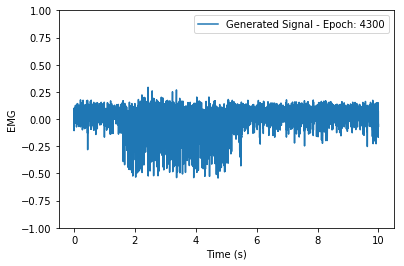

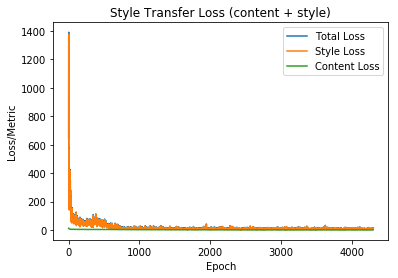

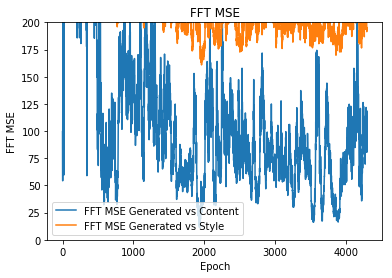

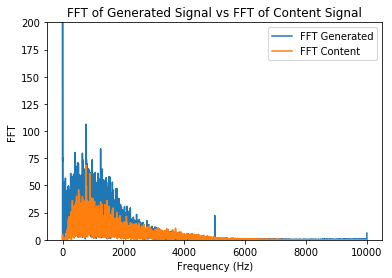

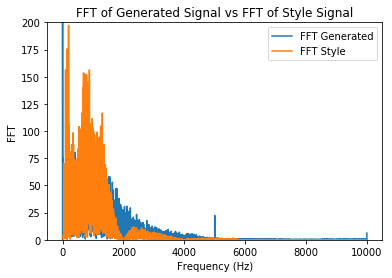

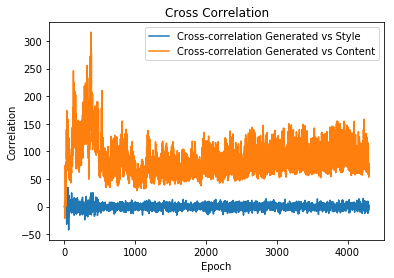

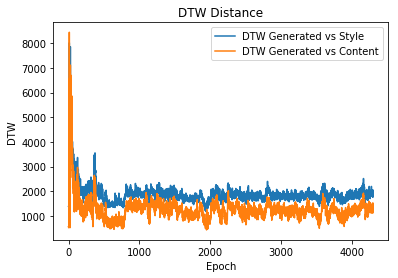

Epoch: 4301 
 Content Loss: 1.2160861492156982 
 Style Loss: 7.47455358505249 
 Total Loss: 8.69063949584961
Metrics - Content CC:[94.91926331], FFT:92.24077727071388, DTW:1401.5823117564814
Metrics - Style CC:[8.81082802], FFT:195.17745875471203, DTW:2047.0207015516744
Epoch: 4302 
 Content Loss: 1.1792588233947754 
 Style Loss: 8.275498390197754 
 Total Loss: 9.454757690429688
Metrics - Content CC:[58.01841593], FFT:117.71839151963935, DTW:1561.497097857224
Metrics - Style CC:[4.51342437], FFT:191.9330669665982, DTW:1977.4357885053387
Epoch: 4303 
 Content Loss: 1.3131059408187866 
 Style Loss: 10.798419952392578 
 Total Loss: 12.111525535583496
Metrics - Content CC:[102.17495818], FFT:97.25404937421591, DTW:1395.183096625847
Metrics - Style CC:[0.53027956], FFT:207.6371211709212, DTW:1890.2272033737413
Epoch: 4304 
 Content Loss: 1.2062466144561768 
 Style Loss: 8.411486625671387 
 Total Loss: 9.617733001708984
Metrics - Content CC:[62.09026369], FFT:120.01769495975257, DTW:1526.500

Epoch: 4331 
 Content Loss: 1.164812684059143 
 Style Loss: 4.580055236816406 
 Total Loss: 5.74486780166626
Metrics - Content CC:[77.42233739], FFT:84.90168511228947, DTW:1153.2297759255878
Metrics - Style CC:[10.3959086], FFT:199.7607663334283, DTW:1838.660348013432
Epoch: 4332 
 Content Loss: 1.3368180990219116 
 Style Loss: 10.43468952178955 
 Total Loss: 11.771507263183594
Metrics - Content CC:[75.87513995], FFT:104.06792337906812, DTW:1241.7798987050342
Metrics - Style CC:[4.49588123], FFT:195.39534639728842, DTW:1929.3649391864656
Epoch: 4333 
 Content Loss: 1.2508516311645508 
 Style Loss: 7.993053436279297 
 Total Loss: 9.243905067443848
Metrics - Content CC:[106.33909815], FFT:75.01957211411792, DTW:1172.4554366610423
Metrics - Style CC:[-2.5407112], FFT:198.05275721946515, DTW:1796.6189953978003
Epoch: 4334 
 Content Loss: 1.2202403545379639 
 Style Loss: 7.5421905517578125 
 Total Loss: 8.762431144714355
Metrics - Content CC:[119.14314464], FFT:78.2235028537406, DTW:1377.99

Epoch: 4362 
 Content Loss: 1.1911067962646484 
 Style Loss: 8.125906944274902 
 Total Loss: 9.31701374053955
Metrics - Content CC:[99.85307058], FFT:104.72600628596352, DTW:1545.0090961547742
Metrics - Style CC:[-6.94955584], FFT:184.04715630710885, DTW:1903.9073233417553
Epoch: 4363 
 Content Loss: 1.316063404083252 
 Style Loss: 19.57464599609375 
 Total Loss: 20.890708923339844
Metrics - Content CC:[75.27278354], FFT:115.24630939479502, DTW:1443.5278666348504
Metrics - Style CC:[5.43899541], FFT:189.07868838754675, DTW:1983.3110185596304
Epoch: 4364 
 Content Loss: 1.2797006368637085 
 Style Loss: 22.2520809173584 
 Total Loss: 23.531782150268555
Metrics - Content CC:[109.92027453], FFT:95.78237242783092, DTW:1459.3596077129919
Metrics - Style CC:[5.81157292], FFT:208.30477208525437, DTW:1867.7721527476237
Epoch: 4365 
 Content Loss: 1.2792856693267822 
 Style Loss: 8.141886711120605 
 Total Loss: 9.421172142028809
Metrics - Content CC:[82.08633668], FFT:80.97266754567197, DTW:1249

Epoch: 4392 
 Content Loss: 1.2500137090682983 
 Style Loss: 7.797257423400879 
 Total Loss: 9.047270774841309
Metrics - Content CC:[89.11765984], FFT:64.4055869297772, DTW:1144.47225673114
Metrics - Style CC:[-4.17770496], FFT:194.82096095645485, DTW:1953.5831040813887
Epoch: 4393 
 Content Loss: 1.2837861776351929 
 Style Loss: 6.749049186706543 
 Total Loss: 8.032835006713867
Metrics - Content CC:[86.89567008], FFT:61.63831102890539, DTW:1116.0269769386105
Metrics - Style CC:[5.42608849], FFT:195.6067951870037, DTW:2082.239401919873
Epoch: 4394 
 Content Loss: 1.260711431503296 
 Style Loss: 5.787681579589844 
 Total Loss: 7.048393249511719
Metrics - Content CC:[65.88268862], FFT:63.384292663585065, DTW:1015.5731944093118
Metrics - Style CC:[0.65815006], FFT:201.95663632942464, DTW:1689.108638739593
Epoch: 4395 
 Content Loss: 1.2699239253997803 
 Style Loss: 5.339583873748779 
 Total Loss: 6.6095075607299805
Metrics - Content CC:[94.60675818], FFT:80.09085139277599, DTW:1233.295651

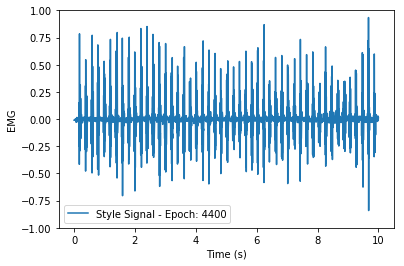

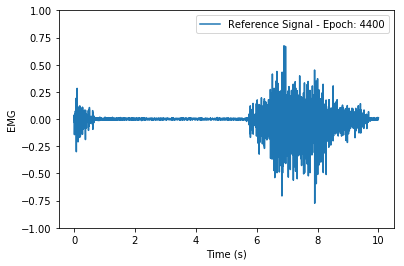

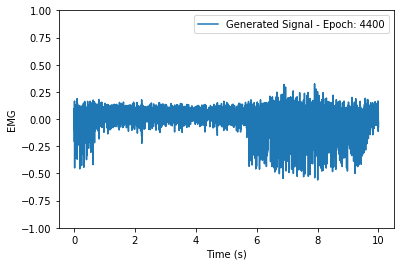

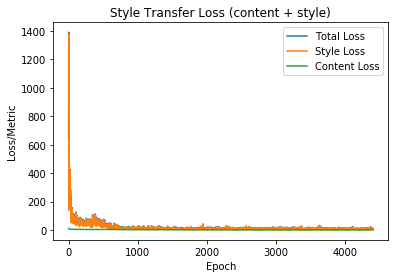

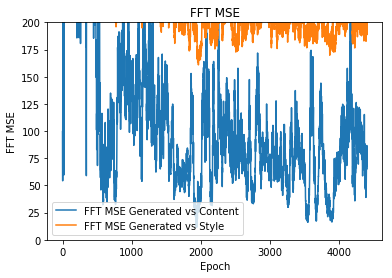

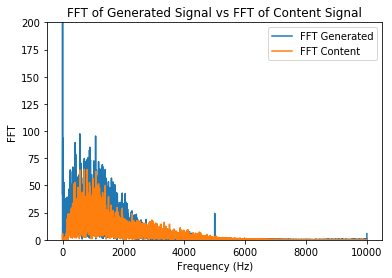

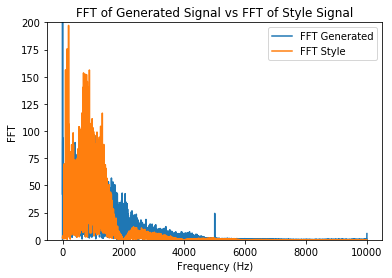

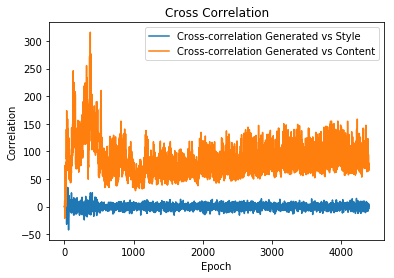

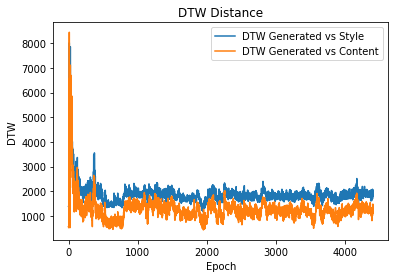

Epoch: 4401 
 Content Loss: 1.3318755626678467 
 Style Loss: 8.041581153869629 
 Total Loss: 9.373456954956055
Metrics - Content CC:[107.65987332], FFT:72.78822354483545, DTW:1164.9786641599758
Metrics - Style CC:[2.4126979], FFT:196.71656674413558, DTW:1897.8751442689693
Epoch: 4402 
 Content Loss: 1.2687400579452515 
 Style Loss: 6.065016269683838 
 Total Loss: 7.333756446838379
Metrics - Content CC:[90.08950336], FFT:82.52717750503108, DTW:1354.2836520688052
Metrics - Style CC:[-0.95702522], FFT:185.61175972057694, DTW:1949.1174844354646
Epoch: 4403 
 Content Loss: 1.4103165864944458 
 Style Loss: 11.425982475280762 
 Total Loss: 12.836298942565918
Metrics - Content CC:[80.01205792], FFT:89.19305463968104, DTW:1484.2066512169934
Metrics - Style CC:[-1.87392719], FFT:192.26796044051665, DTW:1997.7437365920339
Epoch: 4404 
 Content Loss: 1.3257354497909546 
 Style Loss: 5.486152648925781 
 Total Loss: 6.811888217926025
Metrics - Content CC:[129.64552281], FFT:69.1098038849438, DTW:124

Epoch: 4431 
 Content Loss: 1.389445424079895 
 Style Loss: 10.943778038024902 
 Total Loss: 12.333223342895508
Metrics - Content CC:[78.38872242], FFT:86.29739988781245, DTW:1238.8716662063403
Metrics - Style CC:[-7.93368009], FFT:204.55648027940072, DTW:1805.9205892178586
Epoch: 4432 
 Content Loss: 1.4575798511505127 
 Style Loss: 5.614790439605713 
 Total Loss: 7.072371006011963
Metrics - Content CC:[69.4672939], FFT:99.86435732463308, DTW:1168.5575147597763
Metrics - Style CC:[4.10894072], FFT:207.05092533136568, DTW:1846.2653642783707
Epoch: 4433 
 Content Loss: 1.4365583658218384 
 Style Loss: 8.934524536132812 
 Total Loss: 10.37108325958252
Metrics - Content CC:[53.79989921], FFT:112.45901169528341, DTW:1451.7258363308958
Metrics - Style CC:[1.1718828], FFT:195.97913044019938, DTW:2011.7948823359188
Epoch: 4434 
 Content Loss: 1.373638391494751 
 Style Loss: 11.703132629394531 
 Total Loss: 13.076769828796387
Metrics - Content CC:[83.28321075], FFT:109.01487007403902, DTW:1349

Epoch: 4462 
 Content Loss: 1.4268885850906372 
 Style Loss: 8.038628578186035 
 Total Loss: 9.465517044067383
Metrics - Content CC:[137.14485035], FFT:84.76712855884148, DTW:1278.8308932253947
Metrics - Style CC:[1.53775955], FFT:188.9941966384556, DTW:1968.25949265114
Epoch: 4463 
 Content Loss: 1.4381568431854248 
 Style Loss: 6.13817024230957 
 Total Loss: 7.576327323913574
Metrics - Content CC:[88.00612675], FFT:79.38045228969513, DTW:1083.9070702453957
Metrics - Style CC:[-3.90568163], FFT:200.1771433429664, DTW:1730.2812307203512
Epoch: 4464 
 Content Loss: 1.4789764881134033 
 Style Loss: 8.31296157836914 
 Total Loss: 9.791937828063965
Metrics - Content CC:[64.33736499], FFT:97.31523270293914, DTW:1326.4599087036547
Metrics - Style CC:[4.79720833], FFT:198.98801603778767, DTW:1839.8716170447854
Epoch: 4465 
 Content Loss: 1.4512463808059692 
 Style Loss: 5.648007392883301 
 Total Loss: 7.0992536544799805
Metrics - Content CC:[110.79910394], FFT:84.62904686626048, DTW:1251.9459

Epoch: 4493 
 Content Loss: 1.2601360082626343 
 Style Loss: 4.064490795135498 
 Total Loss: 5.324626922607422
Metrics - Content CC:[146.37689992], FFT:106.86492081620655, DTW:1438.075654382124
Metrics - Style CC:[-6.84502047], FFT:194.34257431784783, DTW:2135.2284464518543
Epoch: 4494 
 Content Loss: 1.2388666868209839 
 Style Loss: 4.331901550292969 
 Total Loss: 5.570768356323242
Metrics - Content CC:[104.56616684], FFT:94.37347697289482, DTW:1289.3683591586805
Metrics - Style CC:[-3.82263653], FFT:191.97896291259428, DTW:1920.4568862755207
Epoch: 4495 
 Content Loss: 1.21808660030365 
 Style Loss: 10.37643051147461 
 Total Loss: 11.59451675415039
Metrics - Content CC:[72.8333019], FFT:101.27075909233577, DTW:1300.7110924544959
Metrics - Style CC:[2.56726665], FFT:196.97460253090668, DTW:1888.2318845948157
Epoch: 4496 
 Content Loss: 1.1874451637268066 
 Style Loss: 9.366472244262695 
 Total Loss: 10.553916931152344
Metrics - Content CC:[72.54236366], FFT:104.99758544906686, DTW:121

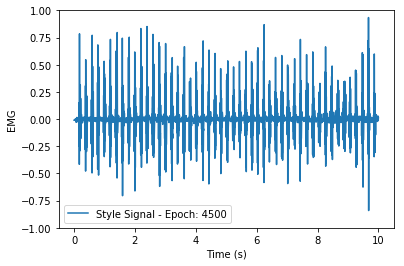

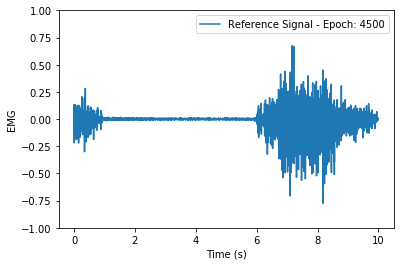

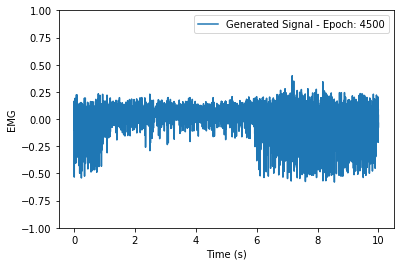

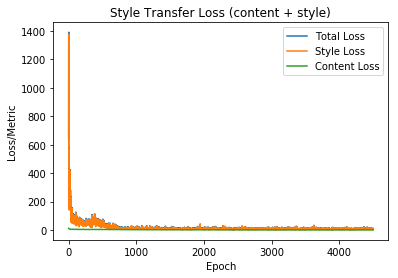

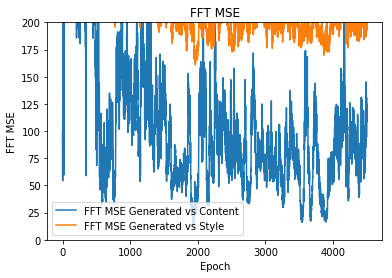

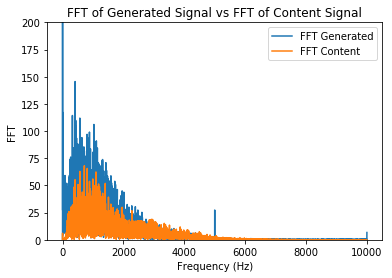

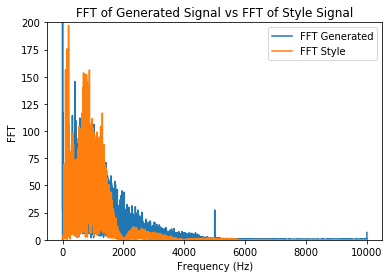

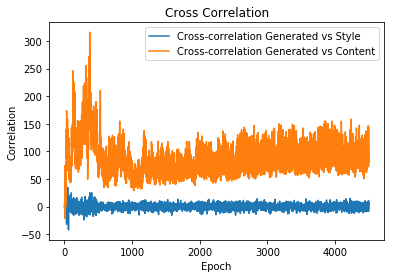

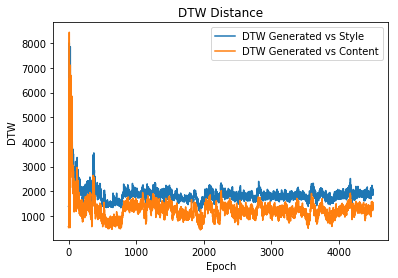

Epoch: 4501 
 Content Loss: 1.1564922332763672 
 Style Loss: 5.580179214477539 
 Total Loss: 6.736671447753906
Metrics - Content CC:[66.2510733], FFT:99.97665923026717, DTW:1303.5875755035581
Metrics - Style CC:[2.44723724], FFT:205.2606912924981, DTW:1838.4291164037422
Epoch: 4502 
 Content Loss: 1.1986597776412964 
 Style Loss: 6.821901321411133 
 Total Loss: 8.020561218261719
Metrics - Content CC:[64.3885986], FFT:101.36118222455315, DTW:1210.973058309179
Metrics - Style CC:[4.11226282], FFT:206.05245952475659, DTW:1901.8344773090923
Epoch: 4503 
 Content Loss: 1.1805776357650757 
 Style Loss: 8.877311706542969 
 Total Loss: 10.057888984680176
Metrics - Content CC:[63.09762848], FFT:97.65460549901383, DTW:1181.6679012478587
Metrics - Style CC:[2.01048024], FFT:206.93906418333864, DTW:1839.624555568981
Epoch: 4504 
 Content Loss: 1.2189229726791382 
 Style Loss: 14.10446548461914 
 Total Loss: 15.323389053344727
Metrics - Content CC:[81.5643263], FFT:96.56430051301349, DTW:1315.50021

Epoch: 4532 
 Content Loss: 1.3118150234222412 
 Style Loss: 5.87468147277832 
 Total Loss: 7.186496734619141
Metrics - Content CC:[76.22452418], FFT:57.8313645979564, DTW:934.875631509393
Metrics - Style CC:[0.34972848], FFT:183.99197846319146, DTW:1760.293020116766
Epoch: 4533 
 Content Loss: 1.3127989768981934 
 Style Loss: 11.25460433959961 
 Total Loss: 12.567403793334961
Metrics - Content CC:[115.25886355], FFT:80.87807260579785, DTW:1196.7405433221027
Metrics - Style CC:[3.44068107], FFT:186.73873621211874, DTW:1865.7542322614872
Epoch: 4534 
 Content Loss: 1.3358348608016968 
 Style Loss: 5.463935852050781 
 Total Loss: 6.799771308898926
Metrics - Content CC:[65.34356076], FFT:111.1866085023721, DTW:1169.7569823486544
Metrics - Style CC:[5.96614124], FFT:192.46075740986072, DTW:1795.3582081063737
Epoch: 4535 
 Content Loss: 1.3199937343597412 
 Style Loss: 6.1642656326293945 
 Total Loss: 7.484259605407715
Metrics - Content CC:[89.18554408], FFT:119.84383012938676, DTW:1328.272

Epoch: 4562 
 Content Loss: 1.8477827310562134 
 Style Loss: 4.402418613433838 
 Total Loss: 6.250201225280762
Metrics - Content CC:[73.93799352], FFT:146.40391429613808, DTW:1404.4023776987158
Metrics - Style CC:[3.09608491], FFT:222.9102406250291, DTW:1965.37792596717
Epoch: 4563 
 Content Loss: 1.6925753355026245 
 Style Loss: 6.075935363769531 
 Total Loss: 7.768510341644287
Metrics - Content CC:[49.13967931], FFT:136.80085427062068, DTW:1308.978596852513
Metrics - Style CC:[0.12988165], FFT:221.09671086260943, DTW:1882.288251198212
Epoch: 4564 
 Content Loss: 1.9316598176956177 
 Style Loss: 7.508198261260986 
 Total Loss: 9.439858436584473
Metrics - Content CC:[100.10703288], FFT:157.81215765127794, DTW:1761.5101685573698
Metrics - Style CC:[6.678816], FFT:231.09465579629494, DTW:2082.8521232386024
Epoch: 4565 
 Content Loss: 1.77206552028656 
 Style Loss: 5.672486305236816 
 Total Loss: 7.444551944732666
Metrics - Content CC:[66.9502833], FFT:147.67629997459485, DTW:1391.3906967

Epoch: 4593 
 Content Loss: 1.4769786596298218 
 Style Loss: 5.824020862579346 
 Total Loss: 7.300999641418457
Metrics - Content CC:[73.81905982], FFT:75.28311149337603, DTW:1120.800213387951
Metrics - Style CC:[-1.98260631], FFT:210.4326722977137, DTW:1786.142938390441
Epoch: 4594 
 Content Loss: 1.3541010618209839 
 Style Loss: 6.881924629211426 
 Total Loss: 8.2360258102417
Metrics - Content CC:[76.0206382], FFT:81.98364260037292, DTW:1334.512451498733
Metrics - Style CC:[-2.22883862], FFT:214.46553667777926, DTW:1809.1905150281057
Epoch: 4595 
 Content Loss: 1.420393943786621 
 Style Loss: 7.623741626739502 
 Total Loss: 9.044136047363281
Metrics - Content CC:[113.48789925], FFT:89.52727646785019, DTW:1470.207782323301
Metrics - Style CC:[-1.22839428], FFT:217.77906816861483, DTW:1958.1593983129012
Epoch: 4596 
 Content Loss: 1.3802937269210815 
 Style Loss: 9.019811630249023 
 Total Loss: 10.400105476379395
Metrics - Content CC:[84.82399639], FFT:79.90981478947671, DTW:1227.025519

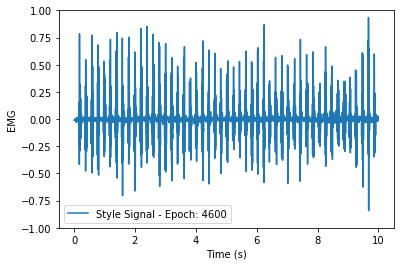

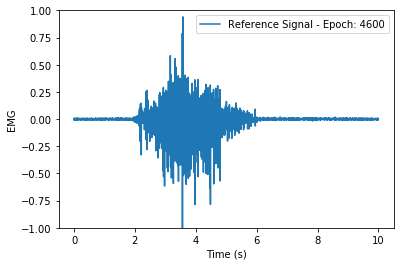

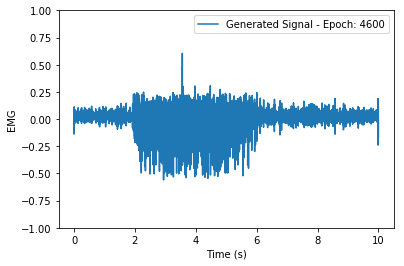

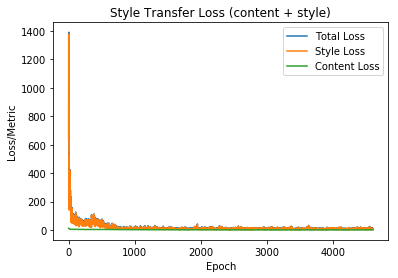

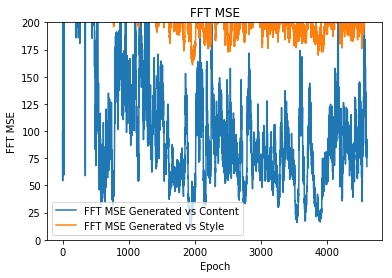

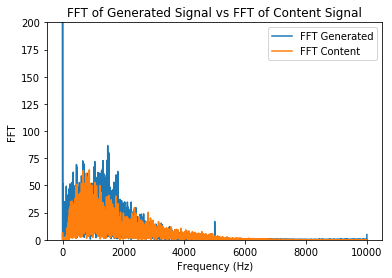

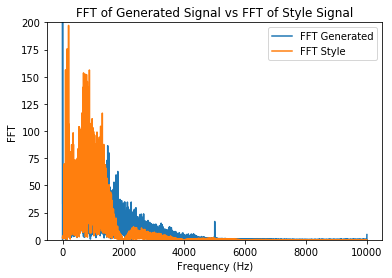

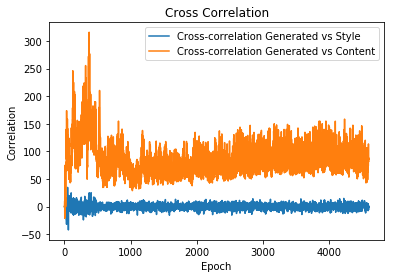

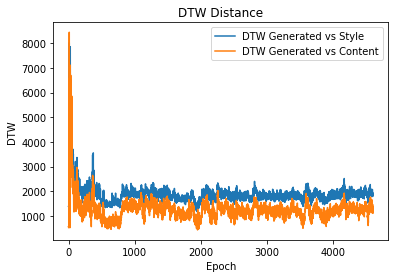

Epoch: 4601 
 Content Loss: 1.3936309814453125 
 Style Loss: 4.08144998550415 
 Total Loss: 5.475080966949463
Metrics - Content CC:[65.11438358], FFT:78.43349192969747, DTW:1153.5304973427578
Metrics - Style CC:[3.28718215], FFT:216.4860834395262, DTW:1789.2507125401253
Epoch: 4602 
 Content Loss: 1.4062554836273193 
 Style Loss: 3.6084413528442383 
 Total Loss: 5.014697074890137
Metrics - Content CC:[56.86621969], FFT:90.66432476614318, DTW:1158.511006809166
Metrics - Style CC:[6.26097238], FFT:207.87481914958664, DTW:1886.2468354245498
Epoch: 4603 
 Content Loss: 1.4056074619293213 
 Style Loss: 6.251739025115967 
 Total Loss: 7.657347202301025
Metrics - Content CC:[71.9847266], FFT:62.29333291029517, DTW:1012.8466753447842
Metrics - Style CC:[2.29093654], FFT:203.83833579207084, DTW:1777.8015771310143
Epoch: 4604 
 Content Loss: 1.4026058912277222 
 Style Loss: 7.054115295410156 
 Total Loss: 8.456721305847168
Metrics - Content CC:[96.69389654], FFT:71.62718952991726, DTW:1153.42653

Epoch: 4632 
 Content Loss: 1.7479708194732666 
 Style Loss: 11.15054702758789 
 Total Loss: 12.898516654968262
Metrics - Content CC:[94.91519849], FFT:141.67033170573552, DTW:1658.4668290869922
Metrics - Style CC:[-2.99133457], FFT:239.2850230836154, DTW:2166.3243949236607
Epoch: 4633 
 Content Loss: 1.5473322868347168 
 Style Loss: 4.093928337097168 
 Total Loss: 5.641260623931885
Metrics - Content CC:[67.24167142], FFT:148.82797039971544, DTW:1562.5779078744747
Metrics - Style CC:[10.23989391], FFT:227.79590271998111, DTW:2126.526272937616
Epoch: 4634 
 Content Loss: 1.5934442281723022 
 Style Loss: 7.186010837554932 
 Total Loss: 8.779455184936523
Metrics - Content CC:[87.39005933], FFT:103.55065838172644, DTW:1438.9294326648742
Metrics - Style CC:[-3.09842576], FFT:218.56188480932792, DTW:2078.8471330712637
Epoch: 4635 
 Content Loss: 1.5158910751342773 
 Style Loss: 7.999108791351318 
 Total Loss: 9.514999389648438
Metrics - Content CC:[69.38957438], FFT:136.61579290894784, DTW:1

Epoch: 4662 
 Content Loss: 1.4518507719039917 
 Style Loss: 4.523154258728027 
 Total Loss: 5.975005149841309
Metrics - Content CC:[77.92369774], FFT:141.86067164862018, DTW:1658.257908178743
Metrics - Style CC:[1.7848388], FFT:221.3535515975924, DTW:2085.9635684032182
Epoch: 4663 
 Content Loss: 1.3525887727737427 
 Style Loss: 9.477936744689941 
 Total Loss: 10.830525398254395
Metrics - Content CC:[90.44607796], FFT:120.2713455850802, DTW:1655.1149505082988
Metrics - Style CC:[-0.60365307], FFT:221.32583684113933, DTW:2150.5636396606315
Epoch: 4664 
 Content Loss: 1.3419387340545654 
 Style Loss: 6.11436128616333 
 Total Loss: 7.456299781799316
Metrics - Content CC:[111.45744105], FFT:125.4329311299369, DTW:1785.4620711248883
Metrics - Style CC:[4.64477615], FFT:238.24183458502083, DTW:2166.7708851456564
Epoch: 4665 
 Content Loss: 1.4406546354293823 
 Style Loss: 8.0299711227417 
 Total Loss: 9.470625877380371
Metrics - Content CC:[141.0228409], FFT:111.77794348901092, DTW:1699.002

Epoch: 4693 
 Content Loss: 1.3667900562286377 
 Style Loss: 8.04619026184082 
 Total Loss: 9.412980079650879
Metrics - Content CC:[93.23723325], FFT:108.91364243429558, DTW:1463.8354226161441
Metrics - Style CC:[8.21142663], FFT:216.90103333938055, DTW:1941.4030232108832
Epoch: 4694 
 Content Loss: 1.2972090244293213 
 Style Loss: 14.866599082946777 
 Total Loss: 16.163808822631836
Metrics - Content CC:[130.54859512], FFT:125.88904664598088, DTW:1430.3068852986264
Metrics - Style CC:[5.94383675], FFT:227.5259669471238, DTW:2121.941851871223
Epoch: 4695 
 Content Loss: 1.3371487855911255 
 Style Loss: 10.57504653930664 
 Total Loss: 11.912195205688477
Metrics - Content CC:[131.70402976], FFT:105.10642821480266, DTW:1438.3032996523261
Metrics - Style CC:[1.84126017], FFT:218.69715720729383, DTW:1958.3358070909158
Epoch: 4696 
 Content Loss: 1.329396367073059 
 Style Loss: 4.475970268249512 
 Total Loss: 5.805366516113281
Metrics - Content CC:[91.85950161], FFT:87.98290624704286, DTW:121

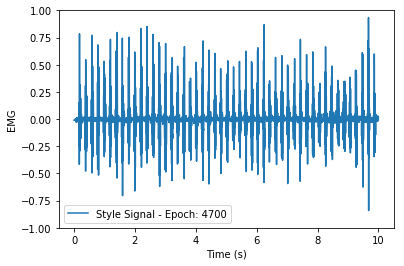

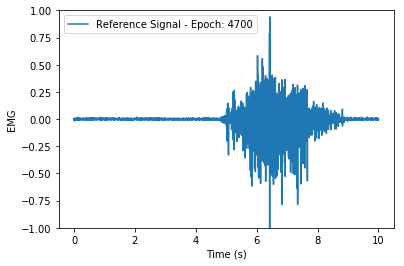

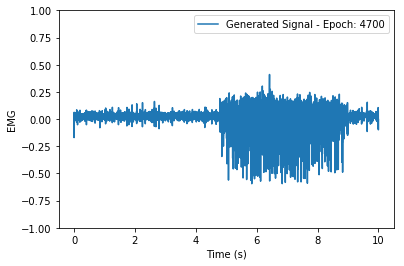

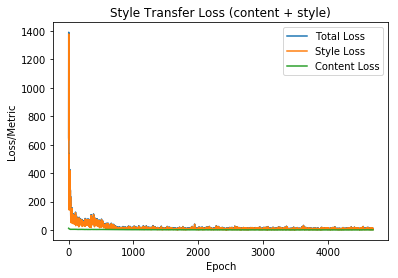

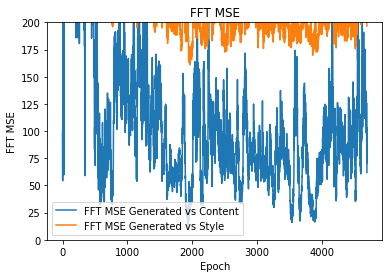

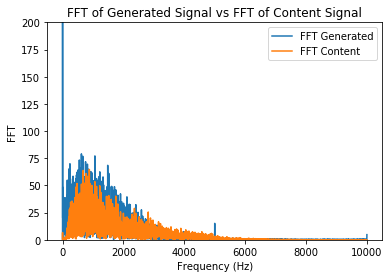

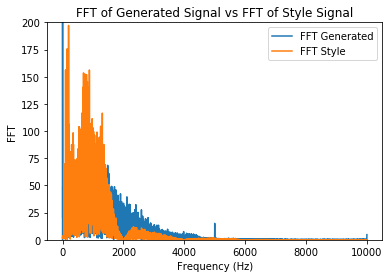

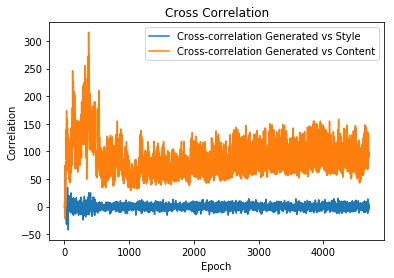

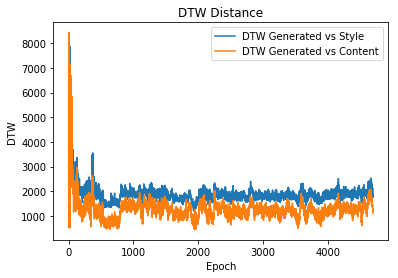

Epoch: 4701 
 Content Loss: 1.3043174743652344 
 Style Loss: 5.59366512298584 
 Total Loss: 6.897982597351074
Metrics - Content CC:[99.592178], FFT:59.633420212038864, DTW:1148.6557453085993
Metrics - Style CC:[-3.18881162], FFT:196.2221659102668, DTW:1809.0361921761707
Epoch: 4702 
 Content Loss: 1.313551902770996 
 Style Loss: 5.679685592651367 
 Total Loss: 6.993237495422363
Metrics - Content CC:[125.66340532], FFT:68.28602232772516, DTW:1263.8459460057989
Metrics - Style CC:[-0.22864532], FFT:200.94241188057498, DTW:2096.7622424082047
Epoch: 4703 
 Content Loss: 1.401484727859497 
 Style Loss: 10.156638145446777 
 Total Loss: 11.558122634887695
Metrics - Content CC:[154.1157676], FFT:67.92090067303982, DTW:1223.4133052534814
Metrics - Style CC:[5.62541906], FFT:197.03706288289334, DTW:1862.8784382034037
Epoch: 4704 
 Content Loss: 1.3625435829162598 
 Style Loss: 10.617612838745117 
 Total Loss: 11.980155944824219
Metrics - Content CC:[146.54392583], FFT:68.39557682995094, DTW:1219

Epoch: 4732 
 Content Loss: 1.323371410369873 
 Style Loss: 5.314730644226074 
 Total Loss: 6.638102054595947
Metrics - Content CC:[100.45180284], FFT:48.17327755645048, DTW:1052.4777639668441
Metrics - Style CC:[-7.54716217], FFT:176.18110457283737, DTW:1696.1793372622687
Epoch: 4733 
 Content Loss: 1.309565782546997 
 Style Loss: 5.812890529632568 
 Total Loss: 7.1224565505981445
Metrics - Content CC:[132.21034814], FFT:62.72157031922347, DTW:1014.0365428332991
Metrics - Style CC:[0.68924859], FFT:181.81678131925267, DTW:1930.6071877504246
Epoch: 4734 
 Content Loss: 1.2906219959259033 
 Style Loss: 9.361555099487305 
 Total Loss: 10.652176856994629
Metrics - Content CC:[96.50411412], FFT:73.44503441884827, DTW:1185.4942621313305
Metrics - Style CC:[9.34054458], FFT:174.93595871731293, DTW:1873.1139652721424
Epoch: 4735 
 Content Loss: 1.3381098508834839 
 Style Loss: 12.619224548339844 
 Total Loss: 13.957334518432617
Metrics - Content CC:[115.22225576], FFT:64.72589088925997, DTW:1

Epoch: 4762 
 Content Loss: 1.2240720987319946 
 Style Loss: 6.443508625030518 
 Total Loss: 7.667580604553223
Metrics - Content CC:[88.32093453], FFT:86.77382253280652, DTW:1308.745460621169
Metrics - Style CC:[-11.66003928], FFT:192.4706005410937, DTW:2090.745102871802
Epoch: 4763 
 Content Loss: 1.295734167098999 
 Style Loss: 4.390965461730957 
 Total Loss: 5.686699867248535
Metrics - Content CC:[138.21142743], FFT:78.19909214257589, DTW:1289.5532496505236
Metrics - Style CC:[2.41876498], FFT:192.54282620600512, DTW:1904.4658931897793
Epoch: 4764 
 Content Loss: 1.2025396823883057 
 Style Loss: 9.254734992980957 
 Total Loss: 10.457274436950684
Metrics - Content CC:[89.76039302], FFT:69.72081373255689, DTW:1234.4979075607498
Metrics - Style CC:[-2.6672888], FFT:194.5412727312186, DTW:1895.1066577764075
Epoch: 4765 
 Content Loss: 1.2214977741241455 
 Style Loss: 8.805006980895996 
 Total Loss: 10.026504516601562
Metrics - Content CC:[80.35154889], FFT:75.58417910794674, DTW:1074.36

Epoch: 4793 
 Content Loss: 1.2910585403442383 
 Style Loss: 4.176102638244629 
 Total Loss: 5.467161178588867
Metrics - Content CC:[59.87620949], FFT:96.31383787960024, DTW:1204.9627523890265
Metrics - Style CC:[-3.36144809], FFT:188.17028513602173, DTW:1835.477361758293
Epoch: 4794 
 Content Loss: 1.3624111413955688 
 Style Loss: 7.680779933929443 
 Total Loss: 9.043190956115723
Metrics - Content CC:[72.41758785], FFT:109.57009671070901, DTW:1288.3370221515931
Metrics - Style CC:[10.93798642], FFT:181.51102153793374, DTW:2049.269607207164
Epoch: 4795 
 Content Loss: 1.318748116493225 
 Style Loss: 11.691981315612793 
 Total Loss: 13.010729789733887
Metrics - Content CC:[109.82720554], FFT:83.91779114988627, DTW:1242.3237210755788
Metrics - Style CC:[0.00799239], FFT:197.66830183037231, DTW:1898.1286036814663
Epoch: 4796 
 Content Loss: 1.268300175666809 
 Style Loss: 5.340764999389648 
 Total Loss: 6.609065055847168
Metrics - Content CC:[59.78770211], FFT:99.72042585126249, DTW:1244.

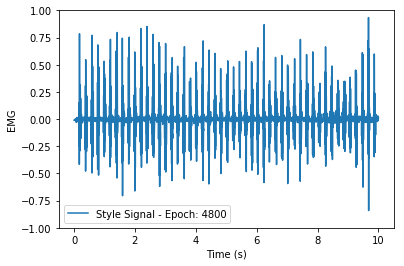

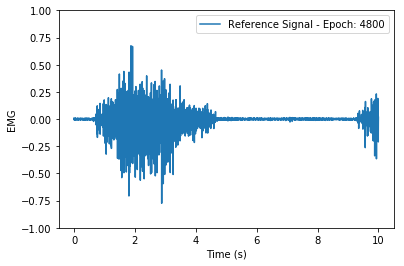

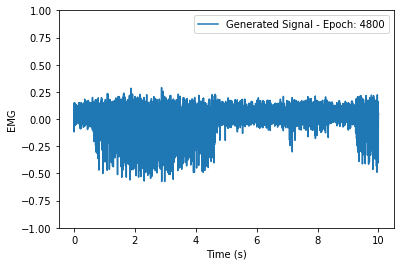

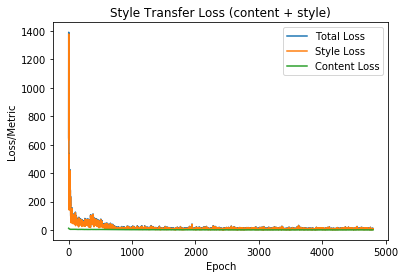

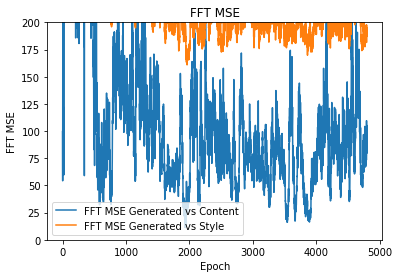

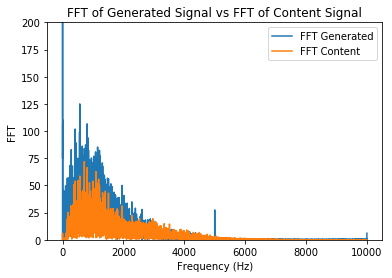

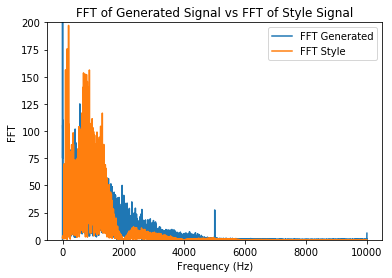

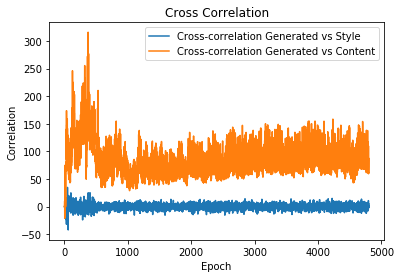

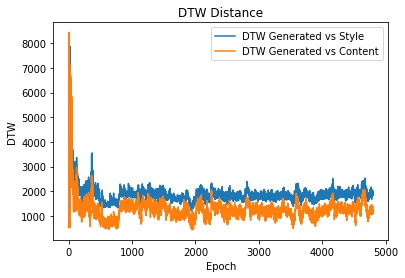

Epoch: 4801 
 Content Loss: 1.310133934020996 
 Style Loss: 5.63477087020874 
 Total Loss: 6.9449052810668945
Metrics - Content CC:[82.45500638], FFT:84.13095819838428, DTW:1226.7509407871937
Metrics - Style CC:[2.27535618], FFT:191.76883883254476, DTW:1895.4194271785666
Epoch: 4802 
 Content Loss: 1.3114796876907349 
 Style Loss: 8.1650390625 
 Total Loss: 9.476518630981445
Metrics - Content CC:[113.10856127], FFT:84.00350607176182, DTW:1199.1789714229574
Metrics - Style CC:[-8.54716526], FFT:191.9728900385462, DTW:1901.1086116842707
Epoch: 4803 
 Content Loss: 1.3712170124053955 
 Style Loss: 6.101725101470947 
 Total Loss: 7.472942352294922
Metrics - Content CC:[108.71906158], FFT:83.41781457076952, DTW:1248.6436048634275
Metrics - Style CC:[6.4058304], FFT:190.52810200383243, DTW:1981.8804324194673
Epoch: 4804 
 Content Loss: 1.263051152229309 
 Style Loss: 3.4046804904937744 
 Total Loss: 4.667731761932373
Metrics - Content CC:[89.19890707], FFT:71.9426490299979, DTW:1198.67927317

Epoch: 4832 
 Content Loss: 1.3480151891708374 
 Style Loss: 9.0601224899292 
 Total Loss: 10.408137321472168
Metrics - Content CC:[84.44873273], FFT:97.23709752634717, DTW:1346.6097036211527
Metrics - Style CC:[-11.58735685], FFT:188.2629198737335, DTW:1820.0025456245764
Epoch: 4833 
 Content Loss: 1.3035656213760376 
 Style Loss: 15.212060928344727 
 Total Loss: 16.515626907348633
Metrics - Content CC:[63.07649612], FFT:93.5234765451967, DTW:1184.6059184427543
Metrics - Style CC:[-5.81551999], FFT:179.65102855936266, DTW:1762.5956602195556
Epoch: 4834 
 Content Loss: 1.294390082359314 
 Style Loss: 7.345823764801025 
 Total Loss: 8.640213966369629
Metrics - Content CC:[79.80270569], FFT:75.45161785670115, DTW:978.6361168504018
Metrics - Style CC:[-5.93217042], FFT:180.37805564767442, DTW:1832.9105615647177
Epoch: 4835 
 Content Loss: 1.2821736335754395 
 Style Loss: 3.4728379249572754 
 Total Loss: 4.755011558532715
Metrics - Content CC:[54.13355292], FFT:101.90821472677133, DTW:1038

Epoch: 4863 
 Content Loss: 1.2677563428878784 
 Style Loss: 7.058027744293213 
 Total Loss: 8.325783729553223
Metrics - Content CC:[77.2530118], FFT:90.96960860406473, DTW:984.4401017798649
Metrics - Style CC:[-5.47136413], FFT:186.98336121148685, DTW:1823.9034736083347
Epoch: 4864 
 Content Loss: 1.2040410041809082 
 Style Loss: 11.86584758758545 
 Total Loss: 13.0698881149292
Metrics - Content CC:[62.12754126], FFT:103.46871763081144, DTW:1148.7675231333385
Metrics - Style CC:[5.56865832], FFT:181.7132052590725, DTW:1863.8550932278363
Epoch: 4865 
 Content Loss: 1.233346939086914 
 Style Loss: 5.5810933113098145 
 Total Loss: 6.8144402503967285
Metrics - Content CC:[55.38160056], FFT:112.48963877197355, DTW:1147.8429772523737
Metrics - Style CC:[-2.34905256], FFT:182.38366937446062, DTW:1826.985487083585
Epoch: 4866 
 Content Loss: 1.2414203882217407 
 Style Loss: 8.493078231811523 
 Total Loss: 9.734498977661133
Metrics - Content CC:[91.30891121], FFT:94.45805903534125, DTW:1352.60

Epoch: 4894 
 Content Loss: 1.2382619380950928 
 Style Loss: 4.47032356262207 
 Total Loss: 5.708585739135742
Metrics - Content CC:[89.57382353], FFT:96.77306553883979, DTW:1270.5045462672472
Metrics - Style CC:[4.54413335], FFT:203.7840015815346, DTW:2048.2620746978846
Epoch: 4895 
 Content Loss: 1.2717612981796265 
 Style Loss: 8.649896621704102 
 Total Loss: 9.92165756225586
Metrics - Content CC:[105.95661078], FFT:86.88165996971006, DTW:1294.8225514745322
Metrics - Style CC:[1.98219803], FFT:205.78881029244312, DTW:1968.7011200741476
Epoch: 4896 
 Content Loss: 1.3295164108276367 
 Style Loss: 3.5747084617614746 
 Total Loss: 4.904224872589111
Metrics - Content CC:[110.41520271], FFT:91.22671756391688, DTW:1352.1455017362227
Metrics - Style CC:[-2.99841994], FFT:206.25306853986277, DTW:1930.4738841873702
Epoch: 4897 
 Content Loss: 1.3188937902450562 
 Style Loss: 5.395426273345947 
 Total Loss: 6.714320182800293
Metrics - Content CC:[77.32619722], FFT:85.34451401758021, DTW:1132.7

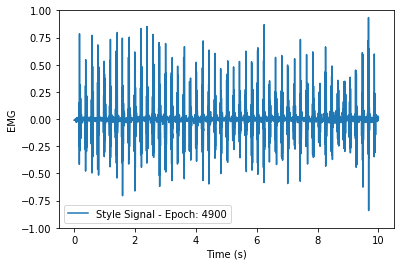

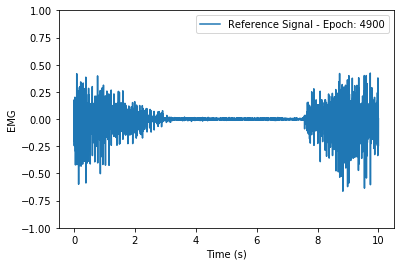

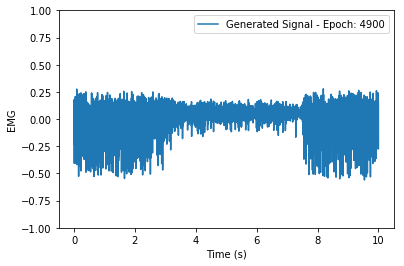

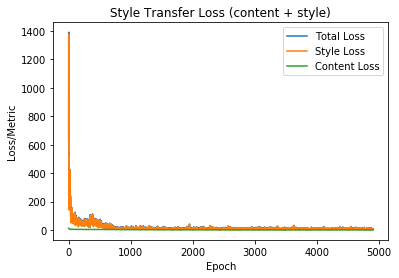

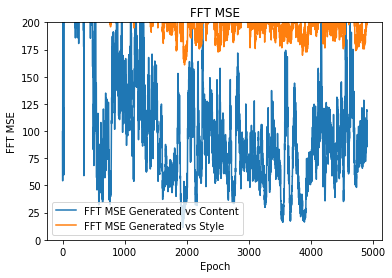

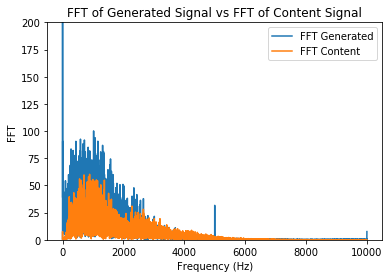

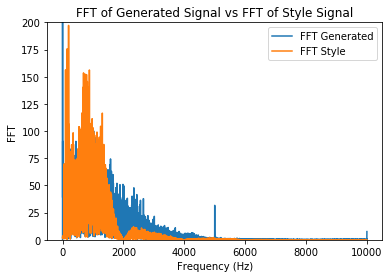

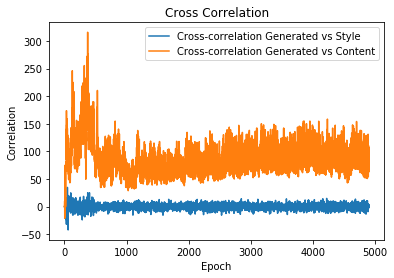

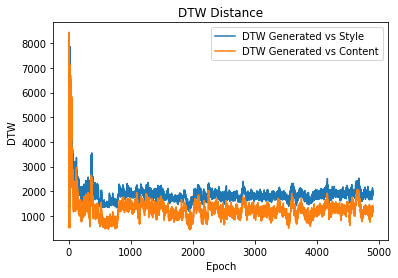

Epoch: 4901 
 Content Loss: 1.1959868669509888 
 Style Loss: 3.124544143676758 
 Total Loss: 4.320530891418457
Metrics - Content CC:[95.64054811], FFT:107.76025470818844, DTW:1311.4173411147442
Metrics - Style CC:[-5.09721143], FFT:203.3609294044004, DTW:1909.2735730454738
Epoch: 4902 
 Content Loss: 1.2370803356170654 
 Style Loss: 4.75205135345459 
 Total Loss: 5.989131927490234
Metrics - Content CC:[58.81604163], FFT:97.16578002965723, DTW:1275.092526917336
Metrics - Style CC:[4.74579949], FFT:205.67273746967095, DTW:1939.8364770407711
Epoch: 4903 
 Content Loss: 1.2885284423828125 
 Style Loss: 3.1101861000061035 
 Total Loss: 4.398714542388916
Metrics - Content CC:[90.31843973], FFT:110.35015168130158, DTW:1427.354339580817
Metrics - Style CC:[-5.31348826], FFT:209.34976645357477, DTW:2044.019995685995
Epoch: 4904 
 Content Loss: 1.2077852487564087 
 Style Loss: 4.490722179412842 
 Total Loss: 5.698507308959961
Metrics - Content CC:[51.91917272], FFT:113.91553449414971, DTW:1274.7

Epoch: 4932 
 Content Loss: 1.2137380838394165 
 Style Loss: 5.874245643615723 
 Total Loss: 7.08798360824585
Metrics - Content CC:[54.29586826], FFT:119.77841000492931, DTW:1331.4620677032253
Metrics - Style CC:[2.7115761], FFT:190.47166118289746, DTW:1935.6839532407523
Epoch: 4933 
 Content Loss: 1.2943276166915894 
 Style Loss: 7.936898231506348 
 Total Loss: 9.231225967407227
Metrics - Content CC:[117.35778713], FFT:98.7727154654033, DTW:1527.0544419363669
Metrics - Style CC:[1.46757997], FFT:197.37016191620512, DTW:2073.308920817887
Epoch: 4934 
 Content Loss: 1.189196228981018 
 Style Loss: 3.232544422149658 
 Total Loss: 4.421740531921387
Metrics - Content CC:[91.72254739], FFT:104.39130161115268, DTW:1402.2906025742168
Metrics - Style CC:[3.98617571], FFT:201.99240801340935, DTW:2006.227609933795
Epoch: 4935 
 Content Loss: 1.3168256282806396 
 Style Loss: 7.518016815185547 
 Total Loss: 8.834842681884766
Metrics - Content CC:[108.44359575], FFT:95.55561504102575, DTW:1399.0038

Epoch: 4963 
 Content Loss: 1.2286531925201416 
 Style Loss: 4.470058441162109 
 Total Loss: 5.698711395263672
Metrics - Content CC:[100.84073589], FFT:112.76956780074494, DTW:1331.8472190159957
Metrics - Style CC:[-5.52924532], FFT:192.91363547560687, DTW:2001.3138918973898
Epoch: 4964 
 Content Loss: 1.2842097282409668 
 Style Loss: 7.250538349151611 
 Total Loss: 8.534748077392578
Metrics - Content CC:[86.45641064], FFT:93.79551601099624, DTW:1230.4159037370005
Metrics - Style CC:[1.35516238], FFT:197.6612237229017, DTW:1913.2468764223518
Epoch: 4965 
 Content Loss: 1.214981198310852 
 Style Loss: 10.081052780151367 
 Total Loss: 11.29603385925293
Metrics - Content CC:[101.7415876], FFT:86.96915846591364, DTW:1270.7562476301596
Metrics - Style CC:[-5.12127012], FFT:188.68261555022607, DTW:1831.6226798020232
Epoch: 4966 
 Content Loss: 1.2228102684020996 
 Style Loss: 7.611881732940674 
 Total Loss: 8.834692001342773
Metrics - Content CC:[141.81220119], FFT:82.51444112840696, DTW:128

Epoch: 4994 
 Content Loss: 1.139700174331665 
 Style Loss: 8.5940523147583 
 Total Loss: 9.733752250671387
Metrics - Content CC:[118.60166255], FFT:104.92253087621347, DTW:1312.4250074727404
Metrics - Style CC:[2.40931839], FFT:201.60135333705836, DTW:2092.2524012391923
Epoch: 4995 
 Content Loss: 1.2505615949630737 
 Style Loss: 7.250510215759277 
 Total Loss: 8.50107192993164
Metrics - Content CC:[116.95699509], FFT:96.51690517979185, DTW:1437.5069785366602
Metrics - Style CC:[4.14394278], FFT:200.82093428393347, DTW:2077.96709552479
Epoch: 4996 
 Content Loss: 1.1417356729507446 
 Style Loss: 11.621371269226074 
 Total Loss: 12.763107299804688
Metrics - Content CC:[90.63805647], FFT:85.45565785598909, DTW:1352.0399196206965
Metrics - Style CC:[-5.96122646], FFT:186.45502810205076, DTW:2111.5416127794515
Epoch: 4997 
 Content Loss: 1.094223976135254 
 Style Loss: 8.6271333694458 
 Total Loss: 9.721357345581055
Metrics - Content CC:[64.67022572], FFT:113.72970518773158, DTW:1280.1793

In [15]:
train(dcgan, epochs=5000, sample_interval=100)